# Load Dataset

In [ ]:
import pandas as pd
df = pd.read_csv('../data/cheese_data.csv', delimiter=',')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1042 entries, 0 to 1041
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   CheeseId              1042 non-null   int64  
 1   ManufacturerProvCode  1042 non-null   object 
 2   ManufacturingTypeEn   1042 non-null   object 
 3   MoisturePercent       1028 non-null   float64
 4   FlavourEn             801 non-null    object 
 5   CharacteristicsEn     643 non-null    object 
 6   Organic               1042 non-null   int64  
 7   CategoryTypeEn        1019 non-null   object 
 8   MilkTypeEn            1041 non-null   object 
 9   MilkTreatmentTypeEn   977 non-null    object 
 10  RindTypeEn            721 non-null    object 
 11  CheeseName            1042 non-null   object 
 12  FatLevel              1042 non-null   object 
dtypes: float64(1), int64(2), object(10)
memory usage: 106.0+ KB


#### Bagi Data Menjadi Kualitas dan Kuantitas

In [2]:
kualitas = df.drop(['CheeseId', 'CheeseName'], axis=1).copy()
kuantitas = df.drop(['CheeseId', 'CheeseName'], axis=1).copy()

#### Isi data kosong dengan modus

In [3]:
kuantitas.mode()


,ManufacturerProvCode,ManufacturingTypeEn,MoisturePercent,FlavourEn,CharacteristicsEn,Organic,CategoryTypeEn,MilkTypeEn,MilkTreatmentTypeEn,RindTypeEn,FatLevel
0,QC,Industrial,50.0,Mild,Creamy,0,Firm Cheese,Cow,Pasteurized,No Rind,lower fat


In [4]:
exclude_cols = ['FlavourEn', 'CharacteristicsEn']

for column in kuantitas.columns:
    if column not in exclude_cols and df[column].isnull().any():
        mode_value = kuantitas[column].mode()[0]
        kuantitas[column].fillna(mode_value, inplace=True)


In [5]:
kuantitas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1042 entries, 0 to 1041
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  1042 non-null   object 
 1   ManufacturingTypeEn   1042 non-null   object 
 2   MoisturePercent       1042 non-null   float64
 3   FlavourEn             801 non-null    object 
 4   CharacteristicsEn     643 non-null    object 
 5   Organic               1042 non-null   int64  
 6   CategoryTypeEn        1042 non-null   object 
 7   MilkTypeEn            1042 non-null   object 
 8   MilkTreatmentTypeEn   1042 non-null   object 
 9   RindTypeEn            1042 non-null   object 
 10  FatLevel              1042 non-null   object 
dtypes: float64(1), int64(1), object(9)
memory usage: 89.7+ KB


#### buat fnc dan no fnc pada kualitas dan kuantitas

In [6]:
kualitas_fnc = kualitas.copy()
kualitas_no_fnc= kualitas.drop(columns=["FlavourEn", "CharacteristicsEn"])
kuantitas_fnc = kuantitas.copy()
kuantitas_no_fnc = kuantitas.drop(columns=["FlavourEn", "CharacteristicsEn"])

In [7]:
kuantitas_no_fnc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1042 entries, 0 to 1041
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  1042 non-null   object 
 1   ManufacturingTypeEn   1042 non-null   object 
 2   MoisturePercent       1042 non-null   float64
 3   Organic               1042 non-null   int64  
 4   CategoryTypeEn        1042 non-null   object 
 5   MilkTypeEn            1042 non-null   object 
 6   MilkTreatmentTypeEn   1042 non-null   object 
 7   RindTypeEn            1042 non-null   object 
 8   FatLevel              1042 non-null   object 
dtypes: float64(1), int64(1), object(7)
memory usage: 73.4+ KB


# Feature Engineering

In [8]:
import pandas as pd

# Bersihkan data: buang baris yang kolom 'FlavourEn' atau 'CharacteristicsEn'-nya kosong
df_clean = df.dropna(subset=["FlavourEn", "CharacteristicsEn"])

# Buang duplikat berdasarkan kombinasi 'FlavourEn' dan 'CharacteristicsEn'
df_clean = df_clean.drop_duplicates(subset=["FlavourEn", "CharacteristicsEn"])

# Gabungkan kedua kolom menjadi satu fitur teks
df_clean["combined_features"] = df_clean["FlavourEn"] + " " + df_clean["CharacteristicsEn"]

# Simpan kolom gabungan ke dalam DataFrame baru untuk feature engineering
feature_egnieering = df_clean[["combined_features"]].copy()

# Tampilkan informasi struktur DataFrame hasil feature engineering
feature_egnieering.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 539 entries, 0 to 1041
Data columns (total 1 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   combined_features  539 non-null    object
dtypes: object(1)
memory usage: 8.4+ KB


In [9]:
# hasilnya sama tapi urutannya beda, karena pakai set, bisa di tangani menggunakan sorted
# tapi tetap tidak adil, sehingga untuk penelitian berikutnya gunakan nilai jangan fitur

import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download stopwords dan tokenizer jika belum diunduh
nltk.download('punkt')
nltk.download('stopwords')


stop_words = set(stopwords.words("english"))
def preprocess(text):
    text = text.lower().translate(str.maketrans("", "", string.punctuation))
    return [word for word in word_tokenize(text) if word not in stop_words]

feature_egnieering["tokens"] = feature_egnieering["combined_features"].apply(preprocess)
unique_tokens = sorted(set(feature_egnieering["tokens"].sum()))

# Tampilkan hasil
print(unique_tokens)
print(f"Jumlah kata unik: {len(unique_tokens)}")


['100', '2', '3', '4', '41', '5', '50', '5050', '6', '8', '9', 'accent', 'accents', 'accentuated', 'accompanied', 'acid', 'acidic', 'acidulous', 'added', 'aftertaste', 'age', 'aged', 'ages', 'aggressive', 'aging', 'agreable', 'alcoholic', 'almond', 'almonds', 'also', 'amber', 'ambercolored', 'ambercoloured', 'aperitif', 'apple', 'apples', 'aroma', 'aromas', 'aromatic', 'artisan', 'artisanal', 'artisinal', 'ash', 'ashed', 'ashen', 'ashes', 'asiago', 'aslo', 'available', 'availble', 'avalaible', 'ayrshire', 'bacon', 'balanced', 'balkan', 'balls', 'ballshaped', 'basil', 'bbq', 'bears', 'become', 'becomes', 'becoming', 'beer', 'beige', 'beigecolored', 'big', 'binding', 'bit', 'bite', 'bitter', 'bitterness', 'bittersweet', 'black', 'blanchâtre', 'blend', 'block', 'blocks', 'bloom', 'bloomy', 'blue', 'blueberry', 'blueveined', 'bluish', 'blé', 'bocomes', 'bodied', 'body', 'bold', 'book', 'brick', 'brie', 'brine', 'brioche', 'brittle', 'brownish', 'brushed', 'butter', 'buttery', 'caciocavallo

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [10]:
# Ambil semua token unik
unique_tokens = list(set(feature_egnieering["tokens"].sum()))

# Gabungkan kolom FlavourEn dan CharacteristicsEn jadi satu kolom teks lowercase
kualitas_fnc['combined_text'] = (kualitas_fnc['FlavourEn'].astype(str) + " " + kualitas_fnc['CharacteristicsEn'].astype(str)).str.lower()
kuantitas_fnc['combined_text'] = (kuantitas_fnc['FlavourEn'].astype(str) + " " + kuantitas_fnc['CharacteristicsEn'].astype(str)).str.lower()

# Tambahkan kolom baru berdasarkan token (0/1 apakah token muncul)
for token in unique_tokens:
    kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
    kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)

# Hapus kolom gabungan dan kolom asli yang tidak dibutuhkan
kualitas_fnc.drop(columns=["FlavourEn", "CharacteristicsEn", "combined_text"], inplace=True)
kuantitas_fnc.drop(columns=["FlavourEn", "CharacteristicsEn", "combined_text"], inplace=True)



C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarn

C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kualitas_fnc[token] = kualitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kuantitas_fnc[token] = kuantitas_fnc['combined_text'].str.contains(r'\b' + token + r'\b', regex=True).astype(int)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_33340\3549469513.py:10: PerformanceWarn

In [11]:
kualitas_fnc = kualitas_fnc.dropna()
kualitas_no_fnc = kualitas_no_fnc.dropna()

kualitas_no_fnc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 674 entries, 0 to 1041
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  674 non-null    object 
 1   ManufacturingTypeEn   674 non-null    object 
 2   MoisturePercent       674 non-null    float64
 3   Organic               674 non-null    int64  
 4   CategoryTypeEn        674 non-null    object 
 5   MilkTypeEn            674 non-null    object 
 6   MilkTreatmentTypeEn   674 non-null    object 
 7   RindTypeEn            674 non-null    object 
 8   FatLevel              674 non-null    object 
dtypes: float64(1), int64(1), object(7)
memory usage: 52.7+ KB


In [12]:
kuantitas_no_fnc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1042 entries, 0 to 1041
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  1042 non-null   object 
 1   ManufacturingTypeEn   1042 non-null   object 
 2   MoisturePercent       1042 non-null   float64
 3   Organic               1042 non-null   int64  
 4   CategoryTypeEn        1042 non-null   object 
 5   MilkTypeEn            1042 non-null   object 
 6   MilkTreatmentTypeEn   1042 non-null   object 
 7   RindTypeEn            1042 non-null   object 
 8   FatLevel              1042 non-null   object 
dtypes: float64(1), int64(1), object(7)
memory usage: 73.4+ KB


### Data Cleaning ( Hapus Duplikat)

In [13]:
print(kualitas_fnc.duplicated().sum())
kualitas_fnc = kualitas_fnc.drop_duplicates()
print(kualitas_fnc.duplicated().sum())

35
0


In [14]:
print(kuantitas_fnc.duplicated().sum())
kuantitas_fnc = kuantitas_fnc.drop_duplicates()
print(kuantitas_fnc.duplicated().sum())

49
0


In [15]:
print(kualitas_no_fnc.duplicated().sum())
kualitas_no_fnc = kualitas_no_fnc.drop_duplicates()
print(kualitas_no_fnc.duplicated().sum())

259
0


In [16]:
print(kuantitas_no_fnc.duplicated().sum())
kuantitas_no_fnc = kuantitas_no_fnc.drop_duplicates()
print(kuantitas_no_fnc.duplicated().sum())

383
0


In [17]:
kualitas_no_fnc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 415 entries, 0 to 1041
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  415 non-null    object 
 1   ManufacturingTypeEn   415 non-null    object 
 2   MoisturePercent       415 non-null    float64
 3   Organic               415 non-null    int64  
 4   CategoryTypeEn        415 non-null    object 
 5   MilkTypeEn            415 non-null    object 
 6   MilkTreatmentTypeEn   415 non-null    object 
 7   RindTypeEn            415 non-null    object 
 8   FatLevel              415 non-null    object 
dtypes: float64(1), int64(1), object(7)
memory usage: 32.4+ KB


In [18]:
kuantitas_no_fnc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 659 entries, 0 to 1041
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ManufacturerProvCode  659 non-null    object 
 1   ManufacturingTypeEn   659 non-null    object 
 2   MoisturePercent       659 non-null    float64
 3   Organic               659 non-null    int64  
 4   CategoryTypeEn        659 non-null    object 
 5   MilkTypeEn            659 non-null    object 
 6   MilkTreatmentTypeEn   659 non-null    object 
 7   RindTypeEn            659 non-null    object 
 8   FatLevel              659 non-null    object 
dtypes: float64(1), int64(1), object(7)
memory usage: 51.5+ KB


#### Label encoding khusus label

In [19]:
from sklearn.preprocessing import LabelEncoder

# Inisialisasi dan fit encoder pada salah satu DataFrame
le = LabelEncoder()
le.fit(kualitas_fnc['FatLevel'])  # atau gunakan df lain yang sudah bersih

# Terapkan encoding
kualitas_fnc['FatLevel'] = le.transform(kualitas_fnc['FatLevel'])
kualitas_no_fnc['FatLevel'] = le.transform(kualitas_no_fnc['FatLevel'])
kuantitas_fnc['FatLevel'] = le.transform(kuantitas_fnc['FatLevel'])
kuantitas_no_fnc['FatLevel'] = le.transform(kuantitas_no_fnc['FatLevel'])

# Buat kamus hasil transformasi
kamus_fatlevel = {label: idx for idx, label in enumerate(le.classes_)}

# Tampilkan kamus
print("Kamus hasil label encoding FatLevel:")
print(kamus_fatlevel)


Kamus hasil label encoding FatLevel:
{'higher fat': 0, 'lower fat': 1}


### Split Data ( 15 Lower dan 15 Higher)

###### Kenapa split dulu?
###### Karena mau pakai one hot encoding, kalau di trasnformasi dulu susah lagi buat nentuin kolom yang sama, jadi split, nanti baru di jadikan one hot

In [20]:
# mengapa di ambil dari kualitas tidak kuantitas, karena disini kuantitas sudah di isi dengan modus, sedankan yang nan masih data
# asli sehingga jika mengambil dari kuantitas tidak adil untuk kualitas, namun ini juga membuat kualitas memiliki pntesi data yang lebih sdeikit. 

# 1. Hapus data NaN dari kualitas_fnc
kualitas_fnc_clean = kualitas_fnc.dropna()

# 2. Ambil 15 data 'Lower fat'
lower_fat = kualitas_fnc_clean[kualitas_fnc_clean['FatLevel'] == 0].sample(n=15, random_state=42)

# 3. Ambil 15 data 'Higher fat'
higher_fat = kualitas_fnc_clean[kualitas_fnc_clean['FatLevel'] == 1].sample(n=15, random_state=42)

# 4. Gabungkan jadi 30 data untuk testing
testing_kualitas = pd.concat([lower_fat, higher_fat])

# 5. Hapus data testing dari kualitas_fnc (berdasarkan index)
kualitas_fnc = kualitas_fnc.drop(testing_kualitas.index, errors='ignore')

# 6. Kolom yang akan dibandingkan (harus cocok dengan no_fnc)
columns_to_compare = [
    'ManufacturerProvCode', 'ManufacturingTypeEn', 'MoisturePercent', 'Organic',
    'CategoryTypeEn', 'MilkTypeEn', 'MilkTreatmentTypeEn', 'RindTypeEn', 'FatLevel'
]
# 7. Cari baris yang sama antara kualitas_no_fnc dan testing_kualitas berdasarkan isi kolom
same_kualitas_no_fnc = kualitas_no_fnc.merge(
    testing_kualitas[columns_to_compare],
    on=columns_to_compare,
    how='inner'
)

# 8. Hapus baris-baris tersebut dari kualitas_no_fnc
kualitas_no_fnc = kualitas_no_fnc.drop(same_kualitas_no_fnc.index, errors='ignore')

# 9. Ulangi untuk kuantitas_fnc dan kuantitas_no_fnc
same_kuantitas = kuantitas_no_fnc.merge(
    testing_kualitas[columns_to_compare],
    on=columns_to_compare,
    how='inner'
)
# 10. Hapus baris-baris yang cocok dari kuantitas_fnc dan kuantitas_no_fnc
kuantitas_fnc = kuantitas_fnc.drop(same_kuantitas.index, errors='ignore')
kuantitas_no_fnc = kuantitas_no_fnc.drop(same_kuantitas.index, errors='ignore')



In [21]:
testing_kualitas

,ManufacturerProvCode,ManufacturingTypeEn,MoisturePercent,Organic,CategoryTypeEn,MilkTypeEn,MilkTreatmentTypeEn,RindTypeEn,FatLevel,orangy,...,bloom,little,natural,making,exotic,spots,unctuous,ultracreamy,aggressive,deep
177,QC,Farmstead,39.0,0,Firm Cheese,Cow,Raw Milk,Brushed Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
811,QC,Farmstead,35.0,1,Firm Cheese,Cow,Raw Milk,Washed Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
714,QC,Industrial,39.0,0,Firm Cheese,Cow,Raw Milk,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
378,QC,Industrial,39.0,0,Firm Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
279,QC,Industrial,50.0,0,Soft Cheese,Cow,Pasteurized,Bloomy Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
1030,AB,Artisan,40.0,0,Firm Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
217,QC,Artisan,39.0,0,Firm Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
856,QC,Artisan,43.0,0,Firm Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
84,ON,Industrial,22.0,0,Hard Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0
532,QC,Artisan,35.0,0,Firm Cheese,Cow,Pasteurized,No Rind,0,0,...,0,0,0,0,0,0,0,0,0,0


### Transformasi Data

In [22]:
import pandas as pd
import numpy as np

# Fitur kategorikal yang akan diencoding (selain 'FatLevel' karena itu label)
categorical_features = ['ManufacturerProvCode', 'MilkTypeEn', 'MilkTreatmentTypeEn', 
                        'CategoryTypeEn', 'ManufacturingTypeEn', 'RindTypeEn']

# Daftar DataFrame yang akan diproses
dataframes = {
    'testing_kualitas': testing_kualitas,
    'kualitas_fnc': kualitas_fnc,
    'kualitas_no_fnc': kualitas_no_fnc,
    'kuantitas_fnc': kuantitas_fnc,
    'kuantitas_no_fnc': kuantitas_no_fnc
}

# Proses One-Hot Encoding untuk semua DataFrame
for name, df in dataframes.items():
    df_encoded = pd.get_dummies(df, columns=categorical_features, drop_first=True)
    dataframes[name] = df_encoded  # update DataFrame dalam dictionary

# Kembalikan ke variabel semula
testing_kualitas = dataframes['testing_kualitas']
kualitas_fnc = dataframes['kualitas_fnc']
kualitas_no_fnc = dataframes['kualitas_no_fnc']
kuantitas_fnc = dataframes['kuantitas_fnc']
kuantitas_no_fnc = dataframes['kuantitas_no_fnc']


In [23]:
testing_kualitas

,MoisturePercent,Organic,FatLevel,orangy,butter,dark,varies,creamy,parmesan,accents,...,MilkTreatmentTypeEn_Thermised,CategoryTypeEn_Fresh Cheese,CategoryTypeEn_Hard Cheese,CategoryTypeEn_Semi-soft Cheese,CategoryTypeEn_Soft Cheese,ManufacturingTypeEn_Farmstead,ManufacturingTypeEn_Industrial,RindTypeEn_Brushed Rind,RindTypeEn_No Rind,RindTypeEn_Washed Rind
177,39.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
811,35.0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
714,39.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
378,39.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,1,0
279,50.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
1030,40.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
217,39.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
856,43.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
84,22.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
532,35.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [24]:
testing_kualitas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30 entries, 177 to 173
Columns: 806 entries, MoisturePercent to RindTypeEn_Washed Rind
dtypes: float64(1), int32(788), int64(1), uint8(16)
memory usage: 93.5 KB


In [25]:
kualitas_fnc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 609 entries, 0 to 1041
Columns: 816 entries, MoisturePercent to RindTypeEn_Washed Rind
dtypes: float64(1), int32(788), int64(1), uint8(26)
memory usage: 1.9 MB


In [26]:
kuantitas_fnc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 963 entries, 30 to 1041
Columns: 818 entries, MoisturePercent to RindTypeEn_Washed Rind
dtypes: float64(1), int32(788), int64(1), uint8(28)
memory usage: 2.9 MB


In [27]:
# Cek kolom yang sama antara kedua DataFrame
kolom_sama = set(kualitas_fnc.columns).intersection(kuantitas_fnc.columns)

# Tampilkan jumlah dan nama kolom yang sama
print(f"Jumlah kolom yang sama: {len(kolom_sama)}")
print("Kolom yang sama:", kolom_sama)


Jumlah kolom yang sama: 816
Kolom yang sama: {'orangy', 'butter', 'dark', 'varies', 'creamy', 'parmesan', 'accents', '50', 'lightly', 'goldenyellow', 'free', 'fruit', 'milky', 'ranges', 'five', 'crumbly', 'whity', 'flexible', 'indigenous', 'body', 'storages', 'harmonie', 'garlic', 'omega', 'oil', 'block', 'many', 'thyme', 'stretched', 'notes', 'chive', 'pale', 'ManufacturerProvCode_BC', 'relatively', 'similiar', 'curd', 'caramelised', 'agreable', 'organic', 'immersed', 'ricotta', 'yellow', 'kept', 'typical', 'whitish', 'muenster', 'grains', 'shredded', 'ronds', 'MilkTypeEn_Goat', 'black', 'de', 'italianstyle', 'froggy', 'cheddarization', 'dot', 'citrus', 'croûte', 'whey', 'chanterelle', 'ambercolored', 'holes', 'slight', 'elastic', 'fig', 'granular', 'uncooked', 'sometimes', 'gouda', 'scapes', 'gruyere', 'brick', 'following', 'washed', 'young', 'certain', 'brioche', 'double', 'bodied', 'preserved', 'layer', 'alcoholic', 'runny', 'toadlike', 'goaty', 'blanchâtre', 'mostly', 'yeux', 'emm

In [28]:
# Kolom yang ada di kuantitas_fnc tapi tidak ada di kualitas_fnc
kolom_khusus_kuantitas = set(kuantitas_fnc.columns) - set(kualitas_fnc.columns)

# Tampilkan hasilnya
print(f"Jumlah kolom yang hanya ada di kuantitas_fnc: {len(kolom_khusus_kuantitas)}")
print("Kolom tersebut adalah:", kolom_khusus_kuantitas)


Jumlah kolom yang hanya ada di kuantitas_fnc: 2
Kolom tersebut adalah: {'MilkTypeEn_Cow, Goat and Ewe', 'ManufacturerProvCode_SK'}


In [29]:
# Kolom yang ada di kuantitas_fnc tapi tidak ada di testing_kualitas
kolom_berbeda = set(kuantitas_fnc.columns) - set(testing_kualitas.columns)

# Tampilkan hasil
print(f"Jumlah kolom yang hanya ada di kuantitas_fnc: {len(kolom_berbeda)}")
print("Kolom tersebut adalah:", kolom_berbeda)


Jumlah kolom yang hanya ada di kuantitas_fnc: 12
Kolom tersebut adalah: {'MilkTypeEn_Cow', 'CategoryTypeEn_Veined Cheeses', 'ManufacturerProvCode_SK', 'ManufacturerProvCode_NB', 'ManufacturerProvCode_NL', 'ManufacturerProvCode_NS', 'MilkTypeEn_Ewe and Cow', 'MilkTypeEn_Cow and Goat', 'ManufacturerProvCode_MB', 'ManufacturerProvCode_PE', 'MilkTypeEn_Cow, Goat and Ewe', 'MilkTypeEn_Ewe and Goat'}


In [30]:
# Daftar kolom yang ingin ditambahkan
kolom_baru = [
    'CategoryTypeEn_Veined Cheeses',
    'MilkTypeEn_Cow, Goat and Ewe',
    'MilkTypeEn_Cow and Goat',
    'ManufacturerProvCode_PE',
    'ManufacturerProvCode_NS',
    'MilkTypeEn_Ewe and Cow',
    'ManufacturerProvCode_SK',
    'ManufacturerProvCode_MB',
    'ManufacturerProvCode_NB',
    'MilkTypeEn_Cow',
    'MilkTypeEn_Ewe and Goat',
    'ManufacturerProvCode_NL'
]

# Tambahkan kolom-kolom tersebut ke testing_kualitas dengan nilai 0
for kolom in kolom_baru:
    testing_kualitas[kolom] = 0


### Data Cleaning 

In [31]:
kualitas_fnc

,MoisturePercent,Organic,FatLevel,orangy,butter,dark,varies,creamy,parmesan,accents,...,CategoryTypeEn_Fresh Cheese,CategoryTypeEn_Hard Cheese,CategoryTypeEn_Semi-soft Cheese,CategoryTypeEn_Soft Cheese,CategoryTypeEn_Veined Cheeses,ManufacturingTypeEn_Farmstead,ManufacturingTypeEn_Industrial,RindTypeEn_Brushed Rind,RindTypeEn_No Rind,RindTypeEn_Washed Rind
0,47.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
1,47.9,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
4,49.4,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
6,52.0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,1,0,0,0
23,80.0,0,1,0,0,0,0,1,0,0,...,1,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,31.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
1028,31.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
1031,50.0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
1040,34.0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1


In [32]:
# Cetak info setiap DataFrame
print("=== kualitas_fnc ===")
print(kualitas_fnc.info())
print("\n=== kualitas_no_fnc ===")
print(kualitas_no_fnc.info())
print("\n=== kuantitas_fnc ===")
print(kuantitas_fnc.info())
print("\n=== kuantitas_no_fnc ===")
print(kuantitas_no_fnc.info())

=== kualitas_fnc ===
<class 'pandas.core.frame.DataFrame'>
Int64Index: 609 entries, 0 to 1041
Columns: 816 entries, MoisturePercent to RindTypeEn_Washed Rind
dtypes: float64(1), int32(788), int64(1), uint8(26)
memory usage: 1.9 MB
None

=== kualitas_no_fnc ===
<class 'pandas.core.frame.DataFrame'>
Int64Index: 408 entries, 30 to 1041
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   MoisturePercent                  408 non-null    float64
 1   Organic                          408 non-null    int64  
 2   FatLevel                         408 non-null    int32  
 3   ManufacturerProvCode_BC          408 non-null    uint8  
 4   ManufacturerProvCode_MB          408 non-null    uint8  
 5   ManufacturerProvCode_NB          408 non-null    uint8  
 6   ManufacturerProvCode_NL          408 non-null    uint8  
 7   ManufacturerProvCode_NS          408 non-null    uint8  
 8   Manufac

In [33]:
testing_kualitas

,MoisturePercent,Organic,FatLevel,orangy,butter,dark,varies,creamy,parmesan,accents,...,MilkTypeEn_Cow and Goat,ManufacturerProvCode_PE,ManufacturerProvCode_NS,MilkTypeEn_Ewe and Cow,ManufacturerProvCode_SK,ManufacturerProvCode_MB,ManufacturerProvCode_NB,MilkTypeEn_Cow,MilkTypeEn_Ewe and Goat,ManufacturerProvCode_NL
177,39.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
811,35.0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
714,39.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
378,39.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
279,50.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1030,40.0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
217,39.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
856,43.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
84,22.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
532,35.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Feature Selection

# kualitas no fnc

In [34]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Set seed agar hasil tetap sama
np.random.seed(42)

# 1. Copy dan hapus data NaN
kualitas_no_fnc_imputed = kualitas_no_fnc.copy()


# 2. Cek distribusi label
print(kualitas_no_fnc_imputed['FatLevel'].value_counts())

# 3. Diskritkan MoisturePercent jadi 2 bin: rendah & tinggi
kualitas_no_fnc_imputed['MoisturePercent'] = pd.cut(
    kualitas_no_fnc_imputed['MoisturePercent'], 
    bins=2, 
    labels=['0', '1']
)

# 4. Pisahkan fitur dan label
X = kualitas_no_fnc_imputed.drop(columns=["FatLevel"])
y = kualitas_no_fnc_imputed["FatLevel"]

# 5. Hitung Information Gain (Mutual Information)
info_gain = mutual_info_classif(X, y, discrete_features=True, random_state=42)

# 6. Buat DataFrame hasil dan urutkan
df_ig = pd.DataFrame({
    "Feature": X.columns,
    "Mutual Information Score": info_gain
})
df_ig = df_ig.sort_values(by="Mutual Information Score", ascending=False)
df_ig["Mutual Information Score"] = df_ig["Mutual Information Score"].apply(lambda x: round(x, 6))

# 7. Tampilkan hasil
print(df_ig)


1    278
0    130
Name: FatLevel, dtype: int64
                            Feature  Mutual Information Score
0                   MoisturePercent                  0.094013
15                  MilkTypeEn_Goat                  0.038593
10                   MilkTypeEn_Cow                  0.031549
18      CategoryTypeEn_Fresh Cheese                  0.028478
16     MilkTreatmentTypeEn_Raw Milk                  0.014158
21       CategoryTypeEn_Soft Cheese                  0.011785
4           ManufacturerProvCode_NB                  0.007614
25          RindTypeEn_Brushed Rind                  0.006102
17    MilkTreatmentTypeEn_Thermised                  0.006080
13           MilkTypeEn_Ewe and Cow                  0.005632
19       CategoryTypeEn_Hard Cheese                  0.003950
2           ManufacturerProvCode_BC                  0.003756
20  CategoryTypeEn_Semi-soft Cheese                  0.003585
9           ManufacturerProvCode_QC                  0.003449
8           Manufacture

In [35]:
# Ambil fitur terbaik berdasarkan Mutual Information
fitur_4_terbaik = df_ig["Feature"].head(4).tolist()
fitur_8_terbaik = df_ig["Feature"].head(8).tolist()
fitur_12_terbaik = df_ig["Feature"].head(12).tolist()
fitur_16_terbaik = df_ig["Feature"].head(16).tolist()
fitur_20_terbaik = df_ig["Feature"].head(20).tolist()
fitur_24_terbaik = df_ig["Feature"].head(24).tolist()
fitur_28_terbaik = df_ig["Feature"].head(28).tolist()

# Tambahkan kolom target 'FatLevel' ke dalam setiap list fitur
fitur_4_terbaik.append("FatLevel")
fitur_8_terbaik.append("FatLevel")
fitur_12_terbaik.append("FatLevel")
fitur_16_terbaik.append("FatLevel")
fitur_20_terbaik.append("FatLevel")
fitur_24_terbaik.append("FatLevel")
fitur_28_terbaik.append("FatLevel")

# Buat salinan dataframe berdasarkan fitur yang dipilih
df_fitur_4_kualitas_no_fnc = kualitas_no_fnc[fitur_4_terbaik].copy()
df_fitur_8_kualitas_no_fnc = kualitas_no_fnc[fitur_8_terbaik].copy()
df_fitur_12_kualitas_no_fnc = kualitas_no_fnc[fitur_12_terbaik].copy()
df_fitur_16_kualitas_no_fnc = kualitas_no_fnc[fitur_16_terbaik].copy()
df_fitur_20_kualitas_no_fnc = kualitas_no_fnc[fitur_20_terbaik].copy()
df_fitur_24_kualitas_no_fnc = kualitas_no_fnc[fitur_24_terbaik].copy()
df_fitur_28_kualitas_no_fnc = kualitas_no_fnc[fitur_28_terbaik].copy()

# kuantitas no fnc

In [36]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Set seed agar hasil tetap sama
np.random.seed(42)

# 1. Copy dan hapus data NaN
kuantitas_no_fnc_imputed = kuantitas_no_fnc.copy()


# 2. Cek distribusi label
print("Distribusi FatLevel:")
print(kuantitas_no_fnc_imputed['FatLevel'].value_counts())

# 3. Diskritkan MoisturePercent jadi 2 bin: rendah & tinggi
kuantitas_no_fnc_imputed['MoisturePercent'] = pd.cut(
    kuantitas_no_fnc_imputed['MoisturePercent'], 
    bins=2, 
    labels=['0', '1']
)

# 4. Encode label untuk kolom kategorikal (selain MoisturePercent)
X_encoded = kuantitas_no_fnc_imputed.drop(columns=["FatLevel"]).copy()
for col in X_encoded.select_dtypes(include='object').columns:
    X_encoded[col] = LabelEncoder().fit_transform(X_encoded[col])

# 5. Pisahkan fitur dan label
X = X_encoded
y = kuantitas_no_fnc_imputed["FatLevel"]

# 6. Hitung Information Gain (Mutual Information)
info_gain = mutual_info_classif(X, y, discrete_features=True, random_state=42)

# 7. Buat DataFrame hasil dan urutkan
df_ig = pd.DataFrame({
    "Feature": X.columns,
    "Mutual Information Score": info_gain
})
df_ig = df_ig.sort_values(by="Mutual Information Score", ascending=False)
df_ig["Mutual Information Score"] = df_ig["Mutual Information Score"].apply(lambda x: round(x, 6))

# 8. Tampilkan hasil
print("\nMutual Information Score untuk tiap fitur:")
print(df_ig)



Distribusi FatLevel:
1    419
0    215
Name: FatLevel, dtype: int64

Mutual Information Score untuk tiap fitur:
                            Feature  Mutual Information Score
0                   MoisturePercent                  0.084180
20      CategoryTypeEn_Fresh Cheese                  0.026833
17                  MilkTypeEn_Goat                  0.024754
18     MilkTreatmentTypeEn_Raw Milk                  0.020476
11                   MilkTypeEn_Cow                  0.014726
23       CategoryTypeEn_Soft Cheese                  0.010487
19    MilkTreatmentTypeEn_Thermised                  0.006481
4           ManufacturerProvCode_NB                  0.005932
21       CategoryTypeEn_Hard Cheese                  0.003942
2           ManufacturerProvCode_BC                  0.003893
27          RindTypeEn_Brushed Rind                  0.003559
15           MilkTypeEn_Ewe and Cow                  0.002238
6           ManufacturerProvCode_NS                  0.002170
26   ManufacturingTy

In [37]:
# Ambil fitur terbaik berdasarkan Mutual Information
fitur_4_terbaik = df_ig["Feature"].head(4).tolist()
fitur_8_terbaik = df_ig["Feature"].head(8).tolist()
fitur_12_terbaik = df_ig["Feature"].head(12).tolist()
fitur_16_terbaik = df_ig["Feature"].head(16).tolist()
fitur_20_terbaik = df_ig["Feature"].head(20).tolist()
fitur_24_terbaik = df_ig["Feature"].head(24).tolist()
fitur_28_terbaik = df_ig["Feature"].head(28).tolist()

# Tambahkan kolom target 'FatLevel' ke dalam setiap list fitur
fitur_4_terbaik.append("FatLevel")
fitur_8_terbaik.append("FatLevel")
fitur_12_terbaik.append("FatLevel")
fitur_16_terbaik.append("FatLevel")
fitur_20_terbaik.append("FatLevel")
fitur_24_terbaik.append("FatLevel")
fitur_28_terbaik.append("FatLevel")


# Buat salinan dataframe berdasarkan fitur yang dipilih
df_fitur_4_kuantitas_no_fnc = kuantitas_no_fnc[fitur_4_terbaik].copy()
df_fitur_8_kuantitas_no_fnc = kuantitas_no_fnc[fitur_8_terbaik].copy()
df_fitur_12_kuantitas_no_fnc = kuantitas_no_fnc[fitur_12_terbaik].copy()
df_fitur_16_kuantitas_no_fnc = kuantitas_no_fnc[fitur_16_terbaik].copy()
df_fitur_20_kuantitas_no_fnc = kuantitas_no_fnc[fitur_20_terbaik].copy()
df_fitur_24_kuantitas_no_fnc = kuantitas_no_fnc[fitur_24_terbaik].copy()
df_fitur_28_kuantitas_no_fnc = kuantitas_no_fnc[fitur_28_terbaik].copy()


# kualitas fnc

In [38]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Set seed agar hasil tetap sama
np.random.seed(42)

# 1. Copy dan hapus data NaN
kualitas_fnc_imputed = kualitas_fnc.copy()
kualitas_fnc_imputed = kualitas_fnc_imputed.dropna()

# 2. Cek distribusi label
print(kualitas_fnc_imputed['FatLevel'].value_counts())

# 3. Diskritkan MoisturePercent jadi 2 bin: rendah & tinggi
kualitas_fnc_imputed['MoisturePercent'] = pd.cut(
    kualitas_fnc_imputed['MoisturePercent'], 
    bins=2, 
    labels=['0', '1']
)

# 4. Pisahkan fitur dan label
X = kualitas_fnc_imputed.drop(columns=["FatLevel"])
y = kualitas_fnc_imputed["FatLevel"]

# 5. Hitung Information Gain (Mutual Information)
info_gain = mutual_info_classif(X, y, discrete_features=True, random_state=42)

# 6. Buat DataFrame hasil dan urutkan
df_ig = pd.DataFrame({
    "Feature": X.columns,
    "Mutual Information Score": info_gain
})
df_ig = df_ig.sort_values(by="Mutual Information Score", ascending=False)
df_ig["Mutual Information Score"] = df_ig["Mutual Information Score"].apply(lambda x: round(x, 6))

# 7. Tampilkan hasil
print(df_ig)


1    413
0    196
Name: FatLevel, dtype: int64
                         Feature  Mutual Information Score
0                MoisturePercent                  0.094061
802              MilkTypeEn_Goat                  0.043042
797               MilkTypeEn_Cow                  0.033917
805  CategoryTypeEn_Fresh Cheese                  0.028526
208                  intensifies                  0.024890
..                           ...                       ...
535                   swissstyle                  0.000000
533                yellowycreamy                  0.000000
532                         show                  0.000000
531                    sweetened                  0.000000
407                         sage                  0.000000

[815 rows x 2 columns]


In [39]:
# Ambil fitur terbaik berdasarkan Mutual Information

fitur_4_terbaik_kualitas = df_ig["Feature"].head(4).tolist()
fitur_8_terbaik_kualitas = df_ig["Feature"].head(8).tolist()
fitur_12_terbaik_kualitas = df_ig["Feature"].head(12).tolist()
fitur_16_terbaik_kualitas = df_ig["Feature"].head(16).tolist()
fitur_20_terbaik_kualitas = df_ig["Feature"].head(20).tolist()
fitur_24_terbaik_kualitas = df_ig["Feature"].head(24).tolist()
fitur_28_terbaik_kualitas = df_ig["Feature"].head(28).tolist()
fitur_di_atas_0_kualitas = df_ig[df_ig["Mutual Information Score"] > 0]["Feature"].tolist()

# Tambahkan kolom target 'FatLevel' ke setiap list fitur
fitur_4_terbaik_kualitas.append("FatLevel")
fitur_8_terbaik_kualitas.append("FatLevel")
fitur_12_terbaik_kualitas.append("FatLevel")
fitur_16_terbaik_kualitas.append("FatLevel")
fitur_20_terbaik_kualitas.append("FatLevel")
fitur_24_terbaik_kualitas.append("FatLevel")
fitur_28_terbaik_kualitas.append("FatLevel")
fitur_di_atas_0_kualitas.append("FatLevel")

# Buat salinan dataframe berdasarkan fitur yang dipilih
df_kualitas_fitur_4 = kualitas_fnc[fitur_4_terbaik_kualitas].copy()
df_kualitas_fitur_8 = kualitas_fnc[fitur_8_terbaik_kualitas].copy()
df_kualitas_fitur_12 = kualitas_fnc[fitur_12_terbaik_kualitas].copy()
df_kualitas_fitur_16 = kualitas_fnc[fitur_16_terbaik_kualitas].copy()
df_kualitas_fitur_20 = kualitas_fnc[fitur_20_terbaik_kualitas].copy()
df_kualitas_fitur_24 = kualitas_fnc[fitur_24_terbaik_kualitas].copy()
df_kualitas_fitur_28 = kualitas_fnc[fitur_28_terbaik_kualitas].copy()
df_kualitas_fitur_di_atas_0 = kualitas_fnc[fitur_di_atas_0_kualitas].copy()

# kuantitas fnc

In [40]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# Set seed agar hasil tetap sama
np.random.seed(42)

# 1. Copy dan hapus data NaN
kuantitas_fnc_imputed = kuantitas_fnc.copy()


# 2. Cek distribusi label
print(kuantitas_fnc_imputed['FatLevel'].value_counts())

# 3. Diskritkan MoisturePercent jadi 2 bin: rendah & tinggi
kuantitas_fnc_imputed['MoisturePercent'] = pd.cut(
    kuantitas_fnc_imputed['MoisturePercent'], 
    bins=2, 
    labels=['0', '1']
)

# 4. Pisahkan fitur dan label
X = kuantitas_fnc_imputed.drop(columns=["FatLevel"])
y = kuantitas_fnc_imputed["FatLevel"]

# 5. Hitung Information Gain (Mutual Information)
info_gain = mutual_info_classif(X, y, discrete_features=True, random_state=42)

# 6. Buat DataFrame hasil dan urutkan
df_ig = pd.DataFrame({
    "Feature": X.columns,
    "Mutual Information Score": info_gain
})
df_ig = df_ig.sort_values(by="Mutual Information Score", ascending=False)
df_ig["Mutual Information Score"] = df_ig["Mutual Information Score"].apply(lambda x: round(x, 6))

# 7. Tampilkan hasil
print(df_ig)



1    644
0    319
Name: FatLevel, dtype: int64
                          Feature  Mutual Information Score
0                 MoisturePercent                  0.074824
804               MilkTypeEn_Goat                  0.029387
807   CategoryTypeEn_Fresh Cheese                  0.024524
798                MilkTypeEn_Cow                  0.018256
805  MilkTreatmentTypeEn_Raw Milk                  0.017659
..                            ...                       ...
728                           etc                  0.000000
461                           bit                  0.000000
654                           due                  0.000000
724                 orangecolored                  0.000000
604                   havartitype                  0.000000

[817 rows x 2 columns]


In [41]:
fitur_4_terbaik_kuantitas = df_ig["Feature"].head(4).tolist()
fitur_8_terbaik_kuantitas = df_ig["Feature"].head(8).tolist()
fitur_12_terbaik_kuantitas = df_ig["Feature"].head(12).tolist()
fitur_16_terbaik_kuantitas = df_ig["Feature"].head(16).tolist()
fitur_20_terbaik_kuantitas = df_ig["Feature"].head(20).tolist()
fitur_24_terbaik_kuantitas = df_ig["Feature"].head(24).tolist()
fitur_28_terbaik_kuantitas = df_ig["Feature"].head(28).tolist()
fitur_di_atas_0_kuantitas = df_ig[df_ig["Mutual Information Score"] > 0]["Feature"].tolist()

# Tambahkan kolom target 'FatLevel' ke setiap list fitur
fitur_4_terbaik_kuantitas.append("FatLevel")
fitur_8_terbaik_kuantitas.append("FatLevel")
fitur_12_terbaik_kuantitas.append("FatLevel")
fitur_16_terbaik_kuantitas.append("FatLevel")
fitur_20_terbaik_kuantitas.append("FatLevel")
fitur_24_terbaik_kuantitas.append("FatLevel")
fitur_28_terbaik_kuantitas.append("FatLevel")
fitur_di_atas_0_kuantitas.append("FatLevel")

# Buat salinan dataframe berdasarkan fitur yang dipilih
df_kuantitas_fitur_4 = kuantitas_fnc[fitur_4_terbaik_kuantitas].copy()
df_kuantitas_fitur_8 = kuantitas_fnc[fitur_8_terbaik_kuantitas].copy()
df_kuantitas_fitur_12 = kuantitas_fnc[fitur_12_terbaik_kuantitas].copy()
df_kuantitas_fitur_16 = kuantitas_fnc[fitur_16_terbaik_kuantitas].copy()
df_kuantitas_fitur_20 = kuantitas_fnc[fitur_20_terbaik_kuantitas].copy()
df_kuantitas_fitur_24 = kuantitas_fnc[fitur_24_terbaik_kuantitas].copy()
df_kuantitas_fitur_28 = kuantitas_fnc[fitur_28_terbaik_kuantitas].copy()
df_kuantitas_fitur_di_atas_0 = kuantitas_fnc[fitur_di_atas_0_kuantitas].copy()

# cek duplikat dan data kosong

In [42]:
# Fungsi bantu untuk cek duplikat dan NaN
def cek_duplikat_dan_nan(df, nama):
    print(f"\n--- {nama} ---")
    print(f"Jumlah data duplikat: {df.duplicated().sum()}")
    print(f"Jumlah data yang NaN:\n{df.isna().sum()}")

# Panggil fungsi untuk tiap DataFrame

cek_duplikat_dan_nan(df_fitur_4_kualitas_no_fnc, "Fitur Tanpa FC 4 kualitas")
cek_duplikat_dan_nan(df_fitur_8_kualitas_no_fnc, "Fitur Tanpa FC 8 kualitas")
cek_duplikat_dan_nan(df_fitur_12_kualitas_no_fnc, "Fitur Tanpa FC 12 kualitas")
cek_duplikat_dan_nan(df_fitur_16_kualitas_no_fnc, "Fitur Tanpa FC 16 kualitas")
cek_duplikat_dan_nan(df_fitur_20_kualitas_no_fnc, "Fitur Tanpa FC 20 kualitas")
cek_duplikat_dan_nan(df_fitur_24_kualitas_no_fnc, "Fitur Tanpa FC 24 kualitas")
cek_duplikat_dan_nan(df_fitur_28_kualitas_no_fnc, "Fitur Tanpa FC 28 kualitas")

cek_duplikat_dan_nan(df_fitur_4_kuantitas_no_fnc, "Fitur Tanpa FC 4 kuantitas")
cek_duplikat_dan_nan(df_fitur_8_kuantitas_no_fnc, "Fitur Tanpa FC 8 kuantitas")
cek_duplikat_dan_nan(df_fitur_12_kuantitas_no_fnc, "Fitur Tanpa FC 12 kuantitas")
cek_duplikat_dan_nan(df_fitur_16_kuantitas_no_fnc, "Fitur Tanpa FC 16 kuantitas")
cek_duplikat_dan_nan(df_fitur_20_kuantitas_no_fnc, "Fitur Tanpa FC 20 kuantitas")
cek_duplikat_dan_nan(df_fitur_24_kuantitas_no_fnc, "Fitur Tanpa FC 24 kuantitas")
cek_duplikat_dan_nan(df_fitur_28_kuantitas_no_fnc, "Fitur Tanpa FC 28 kuantitas")

cek_duplikat_dan_nan(df_kualitas_fitur_4, "Fitur Top 4 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_8, "Fitur Top 8 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_12, "Fitur Top 12 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_16, "Fitur Top 16 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_20, "Fitur Top 20 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_24, "Fitur Top 24 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_28, "Fitur Top 28 kualitas")
cek_duplikat_dan_nan(df_kualitas_fitur_di_atas_0, "Fitur MI > 0 kualitas")

cek_duplikat_dan_nan(df_kuantitas_fitur_4, "Fitur Top 4 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_8, "Fitur Top 8 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_12, "Fitur Top 12 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_16, "Fitur Top 16 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_20, "Fitur Top 20 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_24, "Fitur Top 24 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_28, "Fitur Top 28 kuantitas")
cek_duplikat_dan_nan(df_kuantitas_fitur_di_atas_0, "Fitur MI > 0 kuantitas")



--- Fitur Tanpa FC 4 kualitas ---
Jumlah data duplikat: 249
Jumlah data yang NaN:
MoisturePercent                0
MilkTypeEn_Goat                0
MilkTypeEn_Cow                 0
CategoryTypeEn_Fresh Cheese    0
FatLevel                       0
dtype: int64

--- Fitur Tanpa FC 8 kualitas ---
Jumlah data duplikat: 191
Jumlah data yang NaN:
MoisturePercent                 0
MilkTypeEn_Goat                 0
MilkTypeEn_Cow                  0
CategoryTypeEn_Fresh Cheese     0
MilkTreatmentTypeEn_Raw Milk    0
CategoryTypeEn_Soft Cheese      0
ManufacturerProvCode_NB         0
RindTypeEn_Brushed Rind         0
FatLevel                        0
dtype: int64

--- Fitur Tanpa FC 12 kualitas ---
Jumlah data duplikat: 167
Jumlah data yang NaN:
MoisturePercent                  0
MilkTypeEn_Goat                  0
MilkTypeEn_Cow                   0
CategoryTypeEn_Fresh Cheese      0
MilkTreatmentTypeEn_Raw Milk     0
CategoryTypeEn_Soft Cheese       0
ManufacturerProvCode_NB          0
RindType

In [43]:
# --- HAPUS DUPLIKAT SAJA PADA DATA KUALITAS ---
df_fitur_4_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_8_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_12_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_16_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_20_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_24_kualitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_28_kualitas_no_fnc.drop_duplicates(inplace=True)

df_kualitas_fitur_4.drop_duplicates(inplace=True)
df_kualitas_fitur_8.drop_duplicates(inplace=True)
df_kualitas_fitur_12.drop_duplicates(inplace=True)
df_kualitas_fitur_16.drop_duplicates(inplace=True)
df_kualitas_fitur_20.drop_duplicates(inplace=True)
df_kualitas_fitur_24.drop_duplicates(inplace=True)
df_kualitas_fitur_28.drop_duplicates(inplace=True)
df_kualitas_fitur_di_atas_0.drop_duplicates(inplace=True)

# --- HAPUS DUPLIKAT SAJA PADA DATA KUANTITAS ---
df_fitur_4_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_8_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_12_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_16_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_20_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_24_kuantitas_no_fnc.drop_duplicates(inplace=True)
df_fitur_28_kuantitas_no_fnc.drop_duplicates(inplace=True)

df_kuantitas_fitur_4.drop_duplicates(inplace=True)
df_kuantitas_fitur_8.drop_duplicates(inplace=True)
df_kuantitas_fitur_12.drop_duplicates(inplace=True)
df_kuantitas_fitur_16.drop_duplicates(inplace=True)
df_kuantitas_fitur_20.drop_duplicates(inplace=True)
df_kuantitas_fitur_24.drop_duplicates(inplace=True)
df_kuantitas_fitur_28.drop_duplicates(inplace=True)
df_kuantitas_fitur_di_atas_0.drop_duplicates(inplace=True)


In [44]:
df_kualitas_fitur_di_atas_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 609 entries, 0 to 1041
Columns: 575 entries, MoisturePercent to FatLevel
dtypes: float64(1), int32(547), int64(1), uint8(26)
memory usage: 1.3 MB


In [45]:
df_kuantitas_fitur_di_atas_0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 962 entries, 30 to 1041
Columns: 693 entries, MoisturePercent to FatLevel
dtypes: float64(1), int32(663), int64(1), uint8(28)
memory usage: 2.5 MB


## Untuk no balancing

In [46]:
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def no_balancing(df_fitur):
    # Pisahkan fitur dan label
    X = df_fitur.drop(columns=["FatLevel"])
    y = df_fitur["FatLevel"]

    # Nilai K yang akan diuji dalam validasi silang
    k_values = [3, 5, 7, 9]

    # Dictionary model
    models = {
        "AdaBoost": AdaBoostClassifier,
        "Gradient Boosting": GradientBoostingClassifier
    }

    # Simpan hasil
    results = []

    for model_name, model_class in models.items():
        for k in k_values:
            print(f"\nEvaluasi {model_name} dengan K={k}")

            model = model_class(random_state=42)
            skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

            y_pred = cross_val_predict(model, X, y, cv=skf)

            # Evaluasi
            accuracy = accuracy_score(y, y_pred)
            precision = precision_score(y, y_pred, average="macro", zero_division=0)
            recall = recall_score(y, y_pred, average="macro")
            f1 = f1_score(y, y_pred, average="macro")

            results.append({
                "Model": model_name,
                "K": k,
                "Accuracy": f"{accuracy * 100:.2f}%",
                "Precision": f"{precision * 100:.2f}%",
                "Recall": f"{recall * 100:.2f}%",
                "F1-Score": f"{f1 * 100:.2f}%"
            })

            # Confusion Matrix
            cm = confusion_matrix(y, y_pred)
            plt.figure(figsize=(6, 5))
            sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                        xticklabels=np.unique(y), yticklabels=np.unique(y))
            plt.xlabel("Predicted Label")
            plt.ylabel("True Label")
            plt.title(f"Confusion Matrix {model_name} (K={k})")
            plt.show()

    # Tampilkan jumlah data tiap kelas
    print("\nJumlah data untuk tiap kelas:")
    print(y.value_counts().sort_index())

    # Hasil evaluasi
    df_results = pd.DataFrame(results)
    print("\nHasil Evaluasi Model:")
    print(df_results)
    
    return df_results


## Untuk balancing

In [47]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def balancing(df_fitur):
    # ====== 1. Preprocessing ======
    # Pisahkan fitur dan label
    X = df_fitur.drop(columns=["FatLevel"])
    y = df_fitur["FatLevel"]

    # Terapkan SMOTE untuk menyeimbangkan kelas minoritas
    smote = SMOTE(random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X, y)
    y_resampled_series = pd.Series(y_resampled)

    # ====== 2. Setup Model dan Evaluasi ======
    k_values = [3, 5, 7, 9]

    models = {
        "AdaBoost": AdaBoostClassifier,
        "Gradient Boosting": GradientBoostingClassifier
    }

    results = []

    for model_name, model_class in models.items():
        for k in k_values:
            print(f"\nEvaluasi {model_name} dengan K={k}")

            model = model_class(random_state=42)
            skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

            y_pred = cross_val_predict(model, X_resampled, y_resampled, cv=skf)

            accuracy = accuracy_score(y_resampled, y_pred)
            precision = precision_score(y_resampled, y_pred, average="macro", zero_division=0)
            recall = recall_score(y_resampled, y_pred, average="macro")
            f1 = f1_score(y_resampled, y_pred, average="macro")

            results.append({
                "Model": model_name,
                "K": k,
                "Accuracy": f"{accuracy * 100:.2f}%",
                "Precision": f"{precision * 100:.2f}%",
                "Recall": f"{recall * 100:.2f}%",
                "F1-Score": f"{f1 * 100:.2f}%"
            })

            cm = confusion_matrix(y_resampled, y_pred)
            plt.figure(figsize=(6, 5))
            sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                        xticklabels=np.unique(y_resampled),
                        yticklabels=np.unique(y_resampled))
            plt.xlabel("Predicted Label")
            plt.ylabel("True Label")
            plt.title(f"Confusion Matrix {model_name} (K={k})")
            plt.show()

    # ====== 3. Tampilkan Hasil Evaluasi ======
    print("\nJumlah data per kelas setelah SMOTE:")
    print(y_resampled_series.value_counts())

    df_results = pd.DataFrame(results)
    print("\nHasil Evaluasi Model:")
    print(df_results)

    return df_results


# Modeling No Flavour and Character

# 4 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


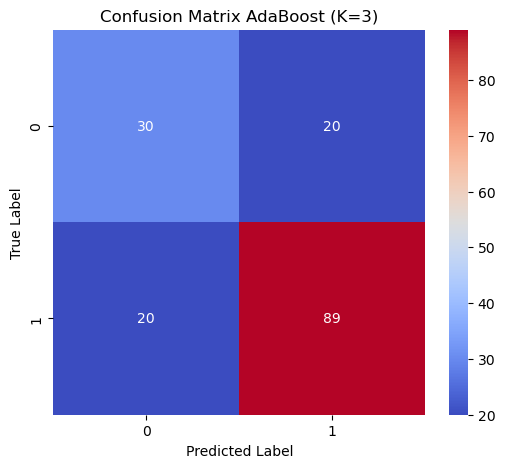


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

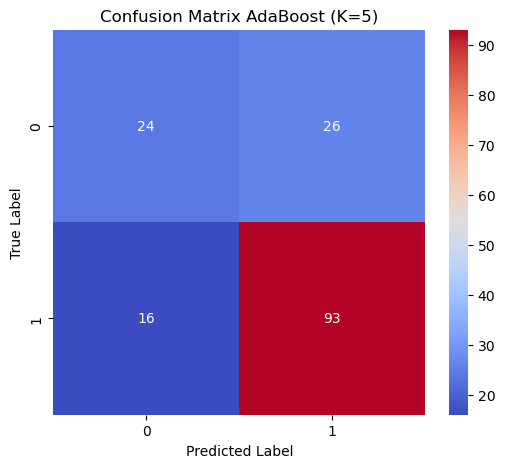


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

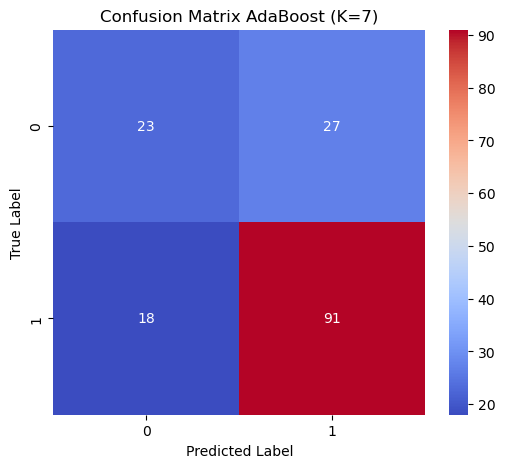


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

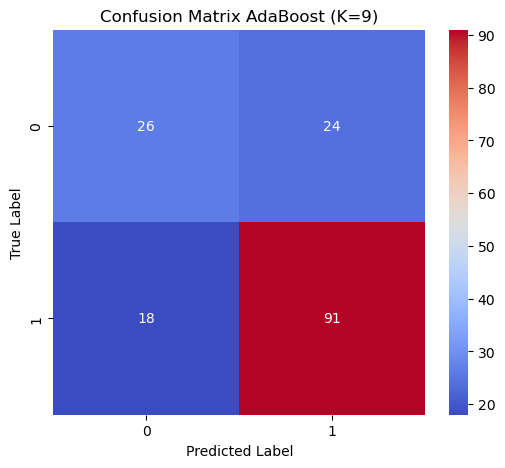


Evaluasi Gradient Boosting dengan K=3


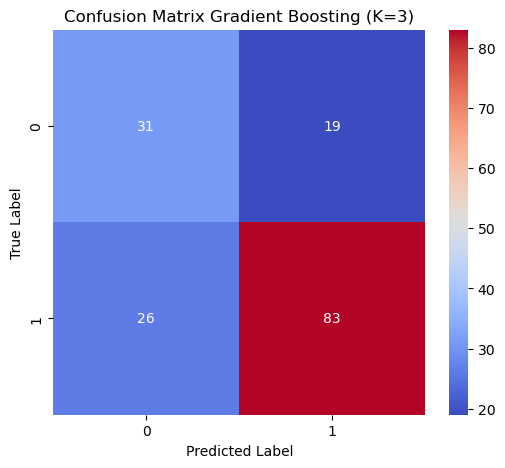


Evaluasi Gradient Boosting dengan K=5


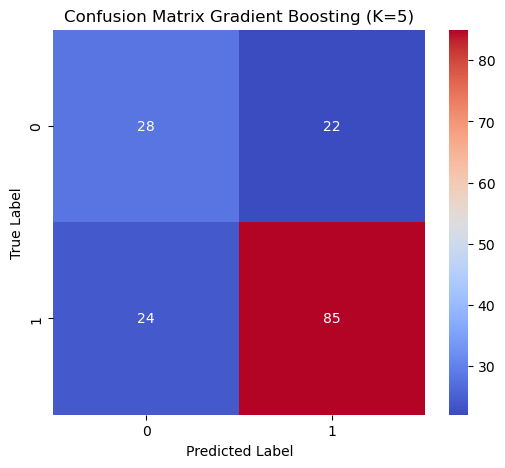


Evaluasi Gradient Boosting dengan K=7


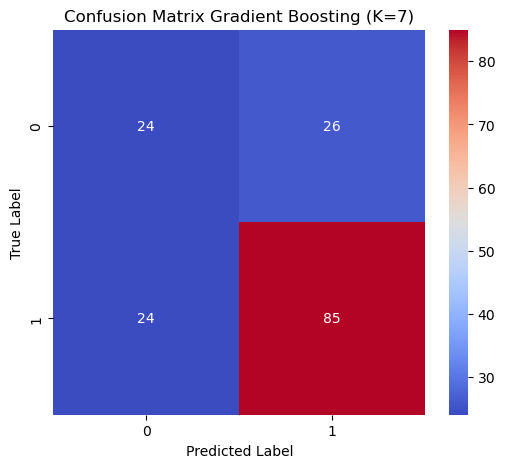


Evaluasi Gradient Boosting dengan K=9


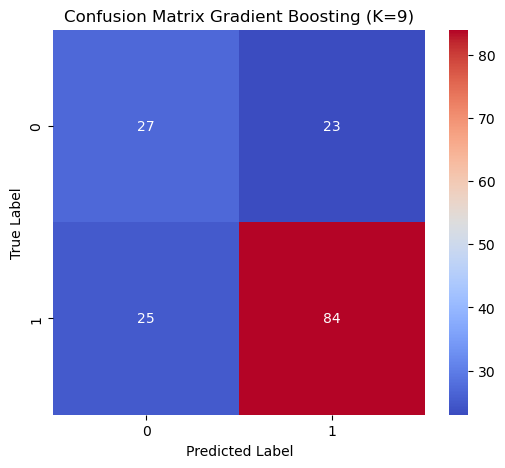


Jumlah data untuk tiap kelas:
0     50
1    109
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   74.84%    70.83%  70.83%   70.83%
1           AdaBoost  5   73.58%    69.08%  66.66%   67.46%
2           AdaBoost  7   71.70%    66.61%  64.74%   65.36%
3           AdaBoost  9   73.58%    69.11%  67.74%   68.28%
4  Gradient Boosting  3   71.70%    67.88%  69.07%   68.31%
5  Gradient Boosting  5   71.07%    66.64%  66.99%   66.80%
6  Gradient Boosting  7   68.55%    63.29%  62.99%   63.13%
7  Gradient Boosting  9   69.81%    65.21%  65.53%   65.36%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,74.84%,70.83%,70.83%,70.83%
1,AdaBoost,5,73.58%,69.08%,66.66%,67.46%
2,AdaBoost,7,71.70%,66.61%,64.74%,65.36%
3,AdaBoost,9,73.58%,69.11%,67.74%,68.28%
4,Gradient Boosting,3,71.70%,67.88%,69.07%,68.31%
5,Gradient Boosting,5,71.07%,66.64%,66.99%,66.80%
6,Gradient Boosting,7,68.55%,63.29%,62.99%,63.13%
7,Gradient Boosting,9,69.81%,65.21%,65.53%,65.36%


In [48]:
no_balancing(df_fitur_4_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


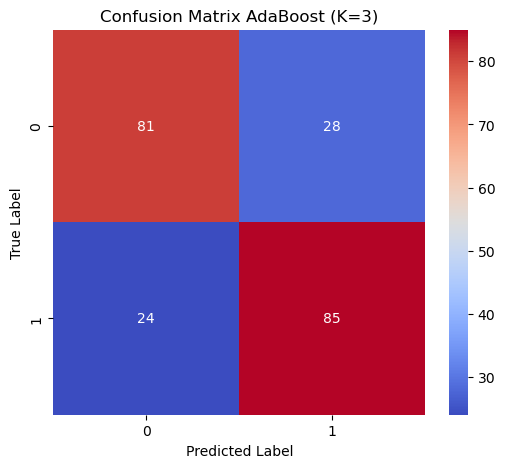


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

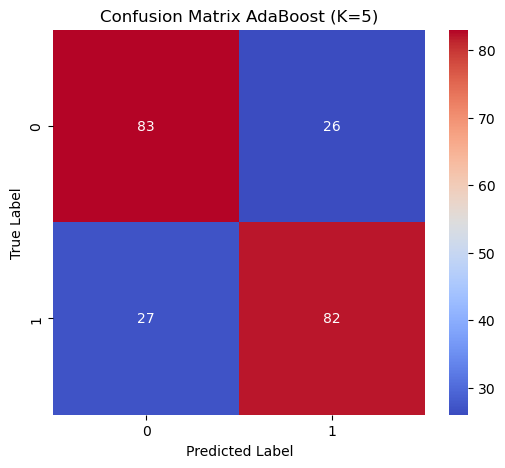


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

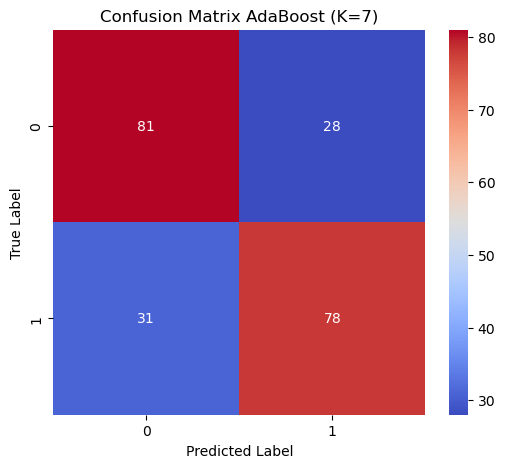


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

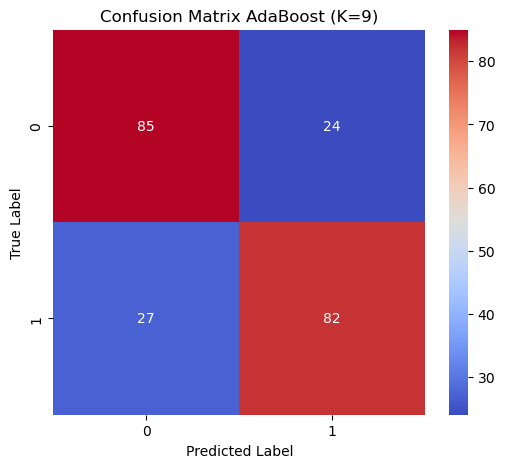


Evaluasi Gradient Boosting dengan K=3


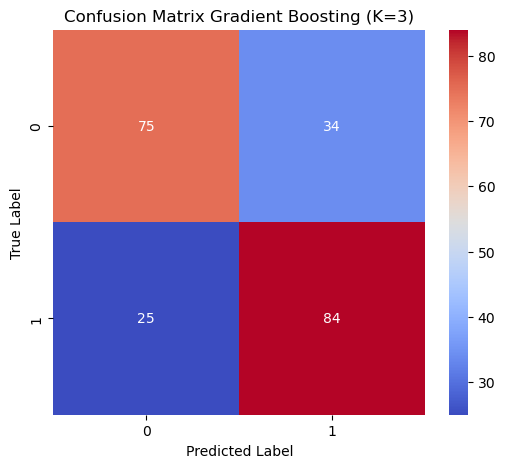


Evaluasi Gradient Boosting dengan K=5


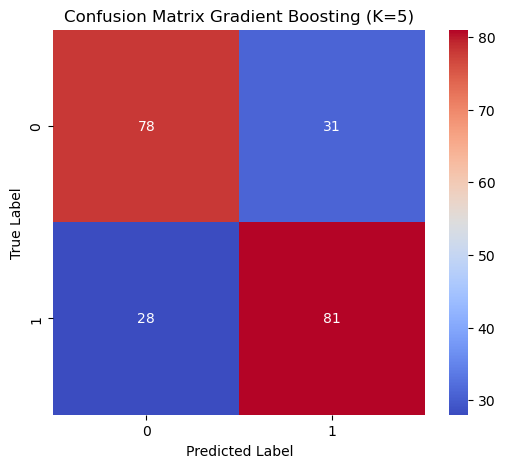


Evaluasi Gradient Boosting dengan K=7


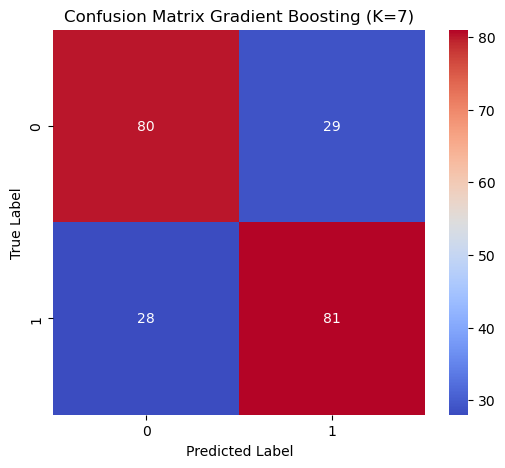


Evaluasi Gradient Boosting dengan K=9


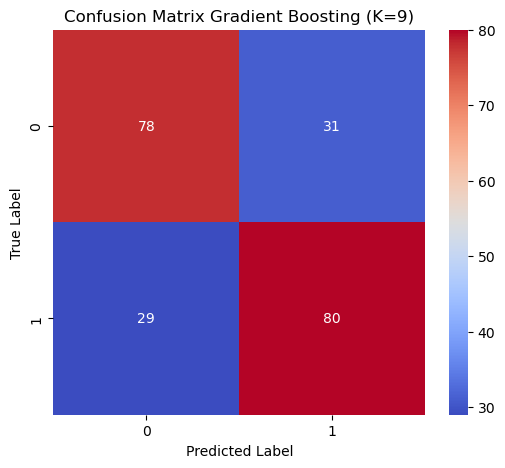


Jumlah data per kelas setelah SMOTE:
1    109
0    109
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.15%    76.18%  76.15%   76.14%
1           AdaBoost  5   75.69%    75.69%  75.69%   75.69%
2           AdaBoost  7   72.94%    72.95%  72.94%   72.93%
3           AdaBoost  9   76.61%    76.63%  76.61%   76.60%
4  Gradient Boosting  3   72.94%    73.09%  72.94%   72.89%
5  Gradient Boosting  5   72.94%    72.95%  72.94%   72.93%
6  Gradient Boosting  7   73.85%    73.86%  73.85%   73.85%
7  Gradient Boosting  9   72.48%    72.48%  72.48%   72.47%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.15%,76.18%,76.15%,76.14%
1,AdaBoost,5,75.69%,75.69%,75.69%,75.69%
2,AdaBoost,7,72.94%,72.95%,72.94%,72.93%
3,AdaBoost,9,76.61%,76.63%,76.61%,76.60%
4,Gradient Boosting,3,72.94%,73.09%,72.94%,72.89%
5,Gradient Boosting,5,72.94%,72.95%,72.94%,72.93%
6,Gradient Boosting,7,73.85%,73.86%,73.85%,73.85%
7,Gradient Boosting,9,72.48%,72.48%,72.48%,72.47%


In [49]:
balancing(df_fitur_4_kualitas_no_fnc)

# 4 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


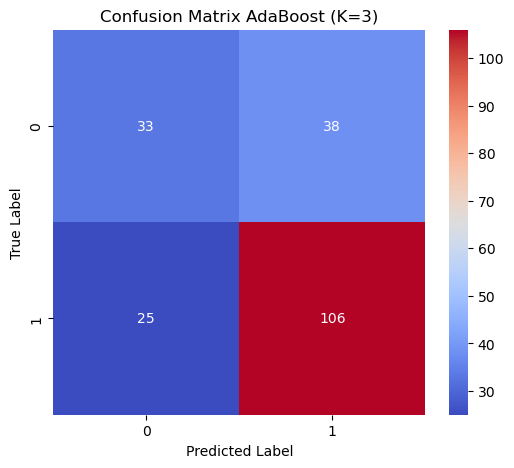


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

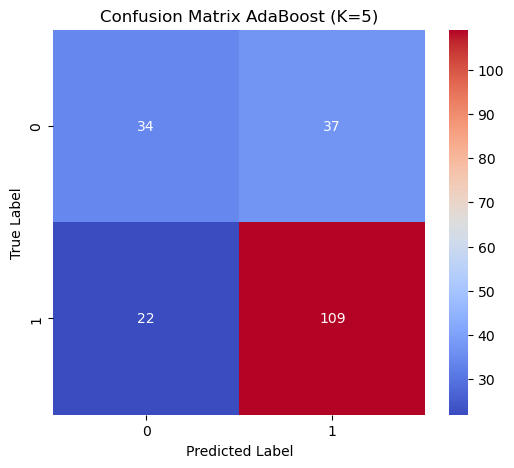


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

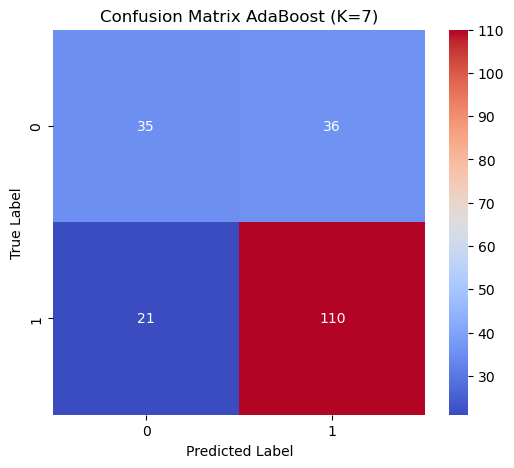


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

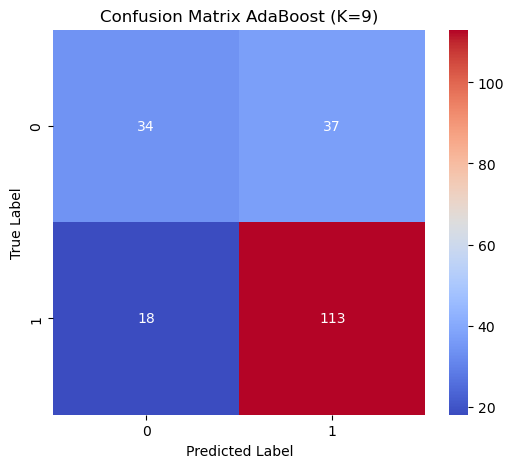


Evaluasi Gradient Boosting dengan K=3


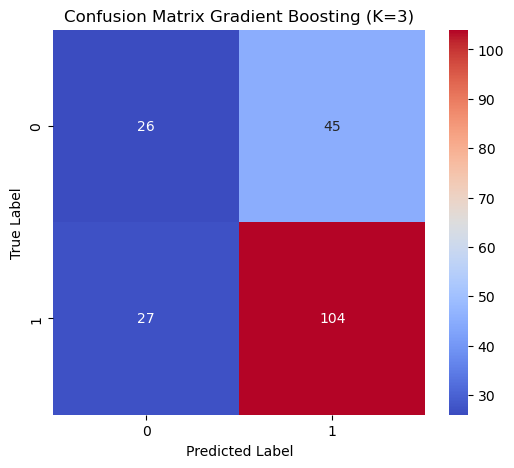


Evaluasi Gradient Boosting dengan K=5


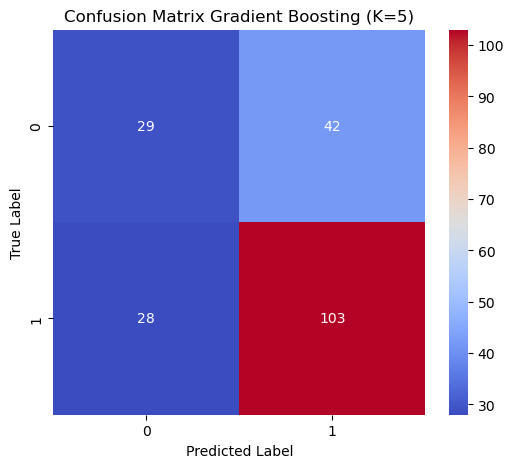


Evaluasi Gradient Boosting dengan K=7


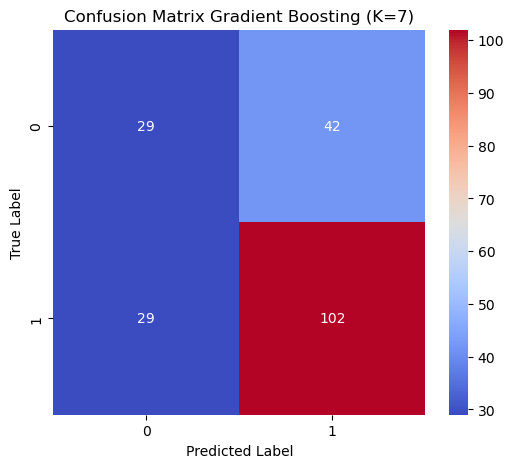


Evaluasi Gradient Boosting dengan K=9


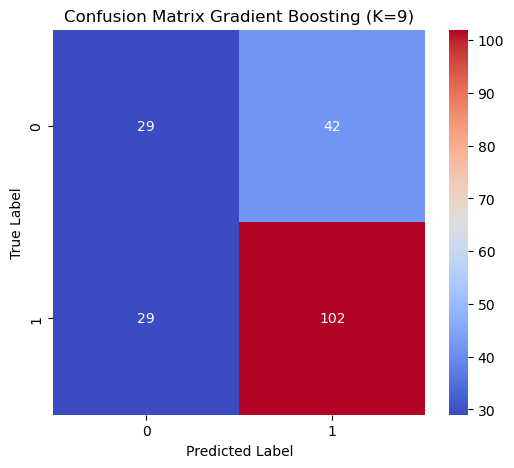


Jumlah data untuk tiap kelas:
0     71
1    131
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   68.81%    65.25%  63.70%   64.13%
1           AdaBoost  5   70.79%    67.69%  65.55%   66.12%
2           AdaBoost  7   71.78%    68.92%  66.63%   67.27%
3           AdaBoost  9   72.77%    70.36%  67.07%   67.86%
4  Gradient Boosting  3   64.36%    59.43%  58.00%   58.11%
5  Gradient Boosting  5   65.35%    60.96%  59.74%   59.98%
6  Gradient Boosting  7   64.85%    60.42%  59.35%   59.57%
7  Gradient Boosting  9   64.85%    60.42%  59.35%   59.57%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,68.81%,65.25%,63.70%,64.13%
1,AdaBoost,5,70.79%,67.69%,65.55%,66.12%
2,AdaBoost,7,71.78%,68.92%,66.63%,67.27%
3,AdaBoost,9,72.77%,70.36%,67.07%,67.86%
4,Gradient Boosting,3,64.36%,59.43%,58.00%,58.11%
5,Gradient Boosting,5,65.35%,60.96%,59.74%,59.98%
6,Gradient Boosting,7,64.85%,60.42%,59.35%,59.57%
7,Gradient Boosting,9,64.85%,60.42%,59.35%,59.57%


In [50]:
no_balancing(df_fitur_4_kuantitas_no_fnc)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


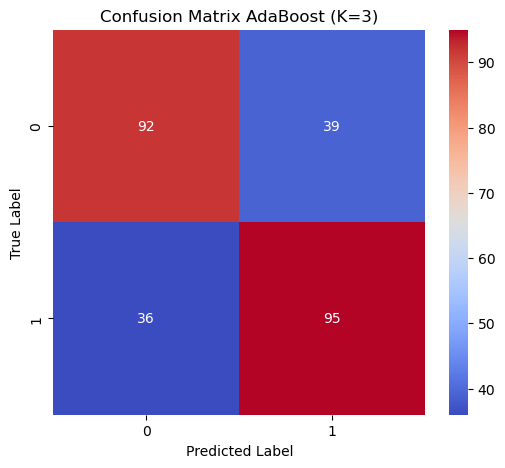


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

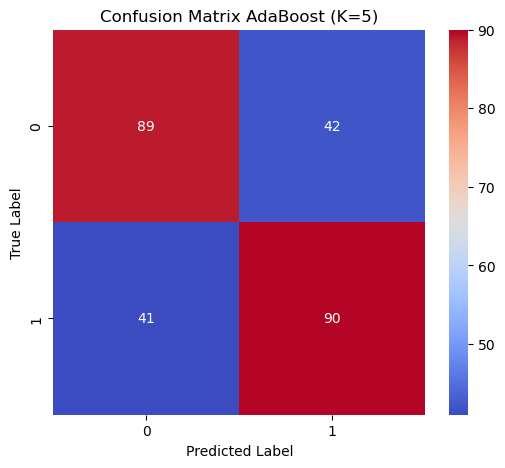


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

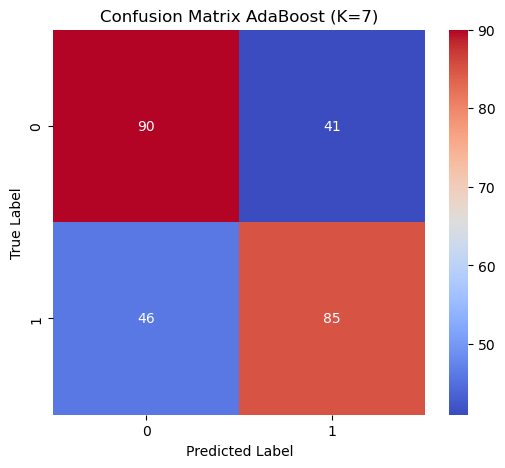


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

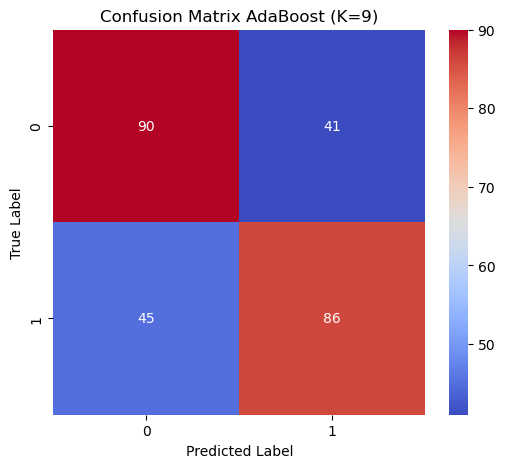


Evaluasi Gradient Boosting dengan K=3


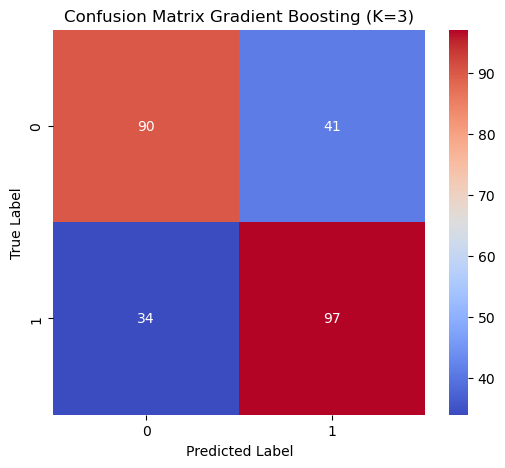


Evaluasi Gradient Boosting dengan K=5


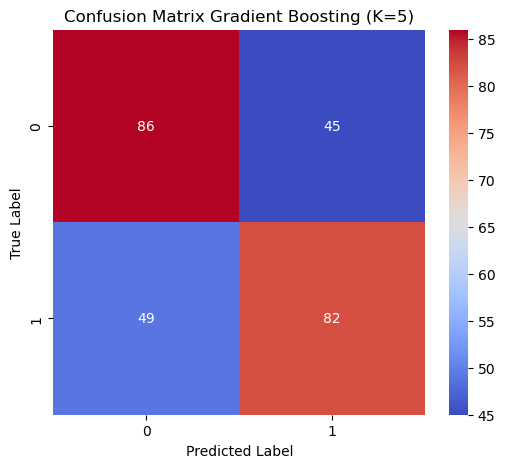


Evaluasi Gradient Boosting dengan K=7


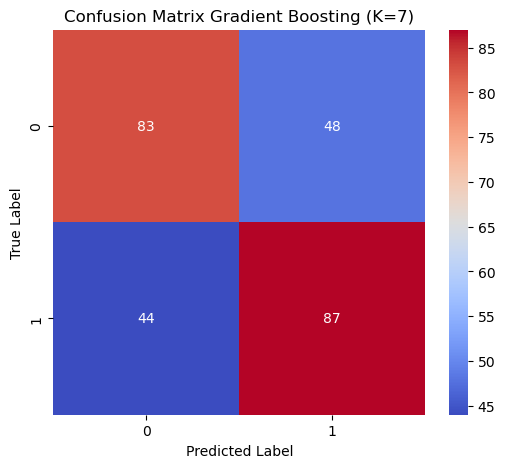


Evaluasi Gradient Boosting dengan K=9


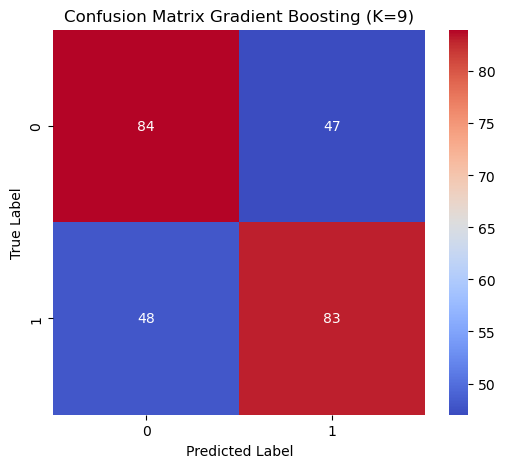


Jumlah data per kelas setelah SMOTE:
1    131
0    131
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   71.37%    71.39%  71.37%   71.37%
1           AdaBoost  5   68.32%    68.32%  68.32%   68.32%
2           AdaBoost  7   66.79%    66.82%  66.79%   66.78%
3           AdaBoost  9   67.18%    67.19%  67.18%   67.17%
4  Gradient Boosting  3   71.37%    71.44%  71.37%   71.35%
5  Gradient Boosting  5   64.12%    64.14%  64.12%   64.11%
6  Gradient Boosting  7   64.89%    64.90%  64.89%   64.88%
7  Gradient Boosting  9   63.74%    63.74%  63.74%   63.74%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,71.37%,71.39%,71.37%,71.37%
1,AdaBoost,5,68.32%,68.32%,68.32%,68.32%
2,AdaBoost,7,66.79%,66.82%,66.79%,66.78%
3,AdaBoost,9,67.18%,67.19%,67.18%,67.17%
4,Gradient Boosting,3,71.37%,71.44%,71.37%,71.35%
5,Gradient Boosting,5,64.12%,64.14%,64.12%,64.11%
6,Gradient Boosting,7,64.89%,64.90%,64.89%,64.88%
7,Gradient Boosting,9,63.74%,63.74%,63.74%,63.74%


In [51]:
balancing(df_fitur_4_kuantitas_no_fnc)

# 8 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


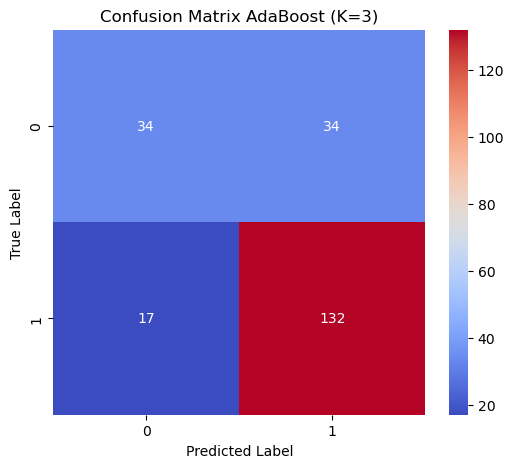


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

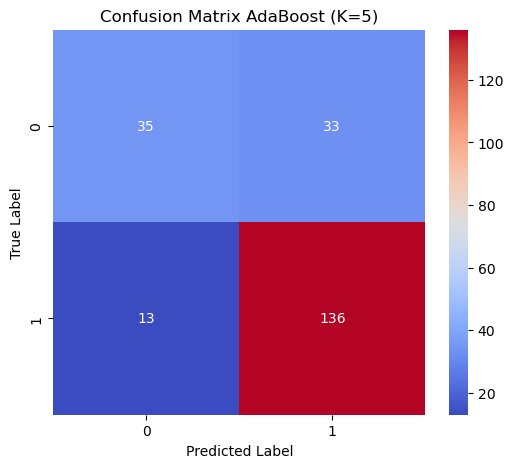


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

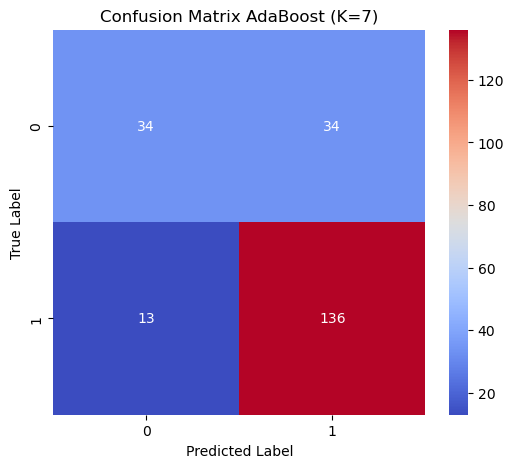


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

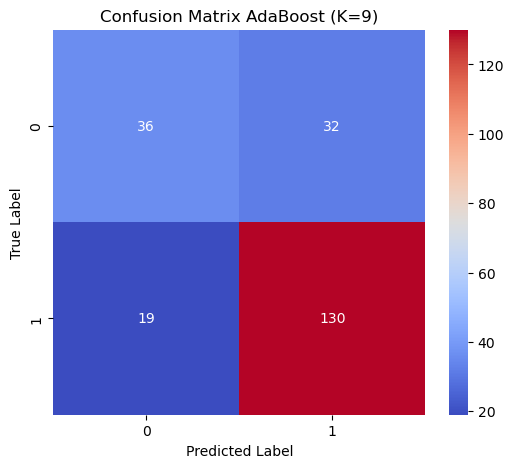


Evaluasi Gradient Boosting dengan K=3


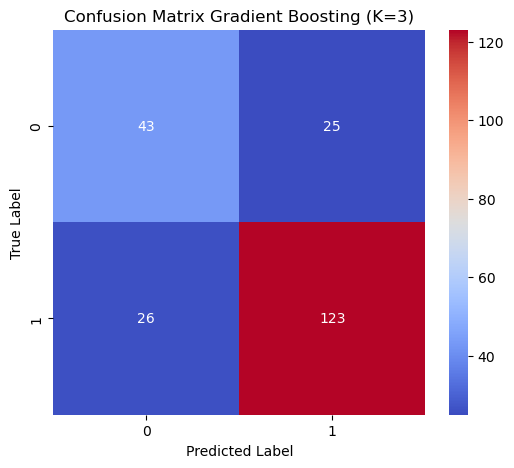


Evaluasi Gradient Boosting dengan K=5


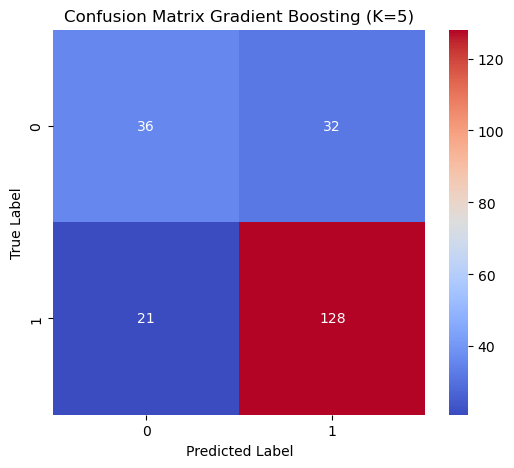


Evaluasi Gradient Boosting dengan K=7


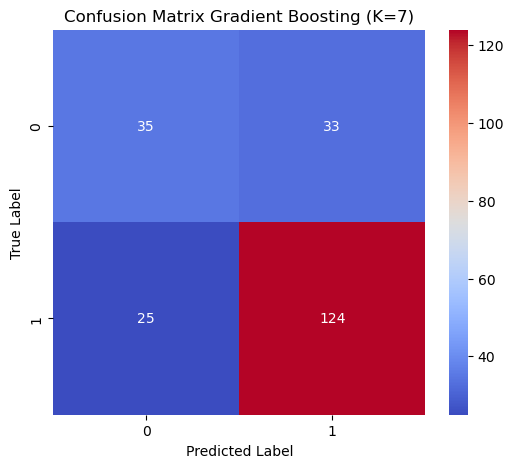


Evaluasi Gradient Boosting dengan K=9


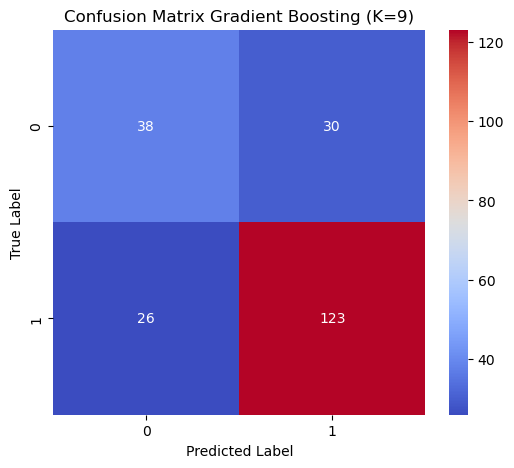


Jumlah data untuk tiap kelas:
0     68
1    149
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.50%    73.09%  69.30%   70.48%
1           AdaBoost  5   78.80%    76.70%  71.37%   72.94%
2           AdaBoost  7   78.34%    76.17%  70.64%   72.20%
3           AdaBoost  9   76.50%    72.85%  70.09%   71.07%
4  Gradient Boosting  3   76.50%    72.71%  72.89%   72.80%
5  Gradient Boosting  5   75.58%    71.58%  69.42%   70.22%
6  Gradient Boosting  7   73.27%    68.66%  67.35%   67.87%
7  Gradient Boosting  9   74.19%    69.88%  69.22%   69.52%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.50%,73.09%,69.30%,70.48%
1,AdaBoost,5,78.80%,76.70%,71.37%,72.94%
2,AdaBoost,7,78.34%,76.17%,70.64%,72.20%
3,AdaBoost,9,76.50%,72.85%,70.09%,71.07%
4,Gradient Boosting,3,76.50%,72.71%,72.89%,72.80%
5,Gradient Boosting,5,75.58%,71.58%,69.42%,70.22%
6,Gradient Boosting,7,73.27%,68.66%,67.35%,67.87%
7,Gradient Boosting,9,74.19%,69.88%,69.22%,69.52%


In [52]:
no_balancing(df_fitur_8_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


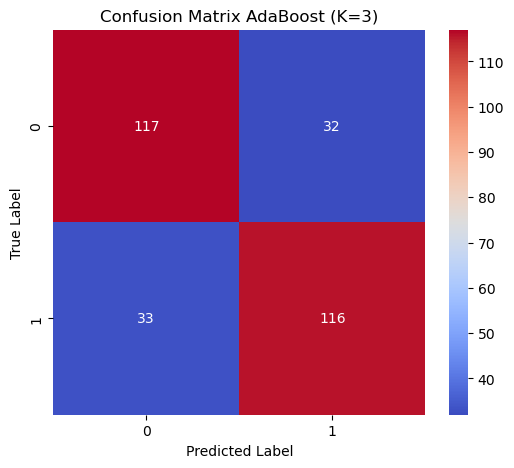


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

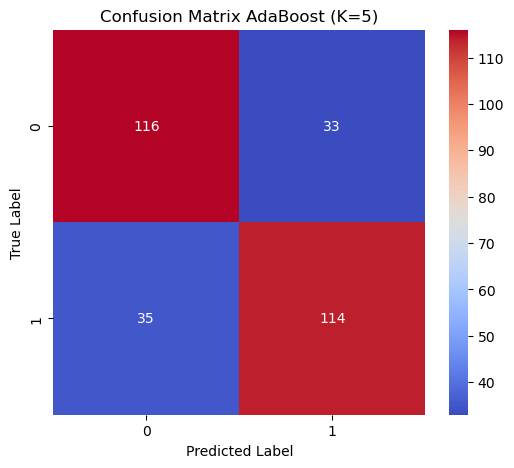

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

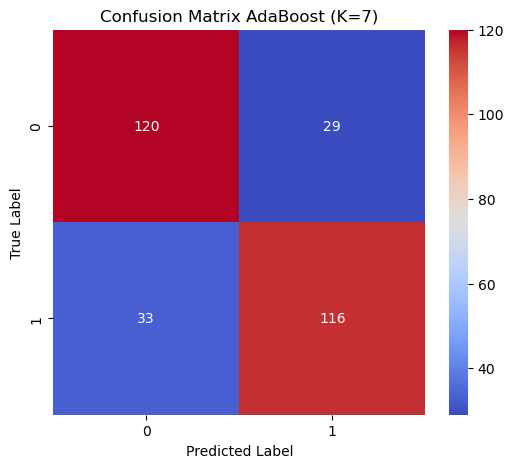

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

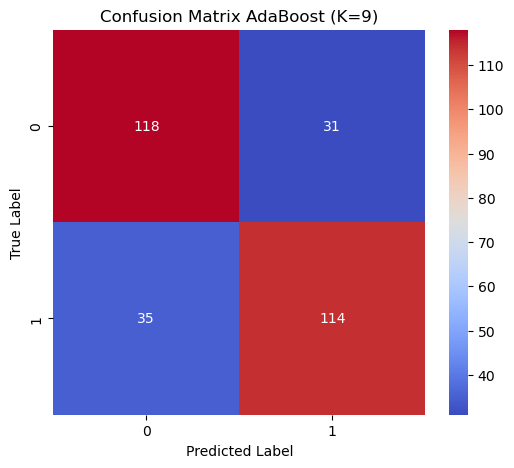


Evaluasi Gradient Boosting dengan K=3


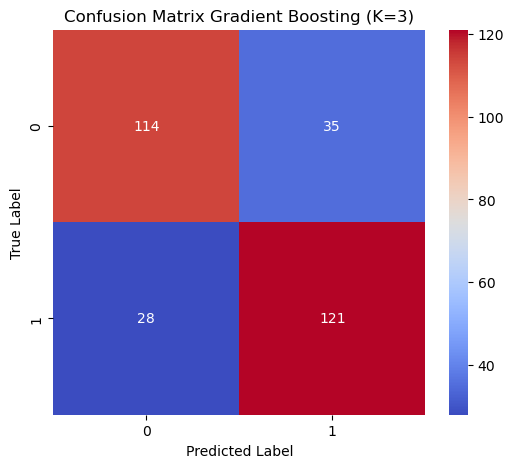


Evaluasi Gradient Boosting dengan K=5


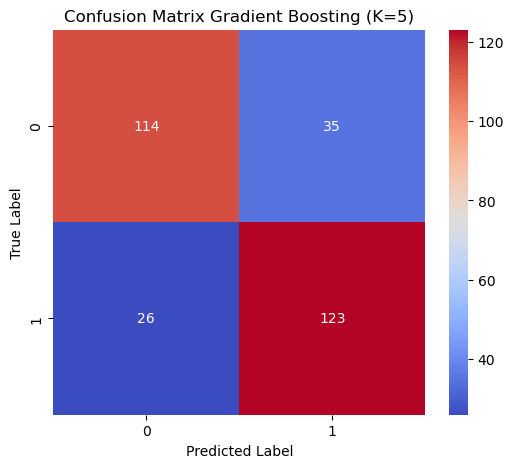


Evaluasi Gradient Boosting dengan K=7


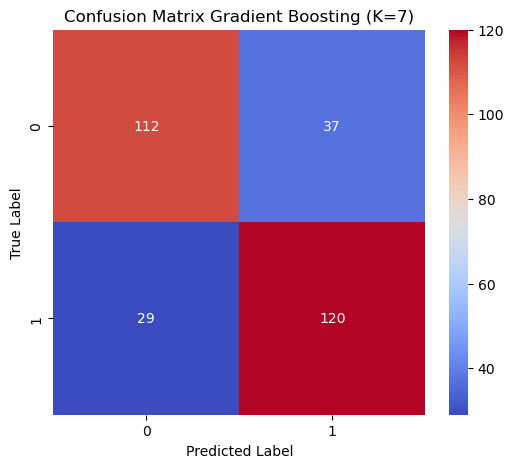


Evaluasi Gradient Boosting dengan K=9


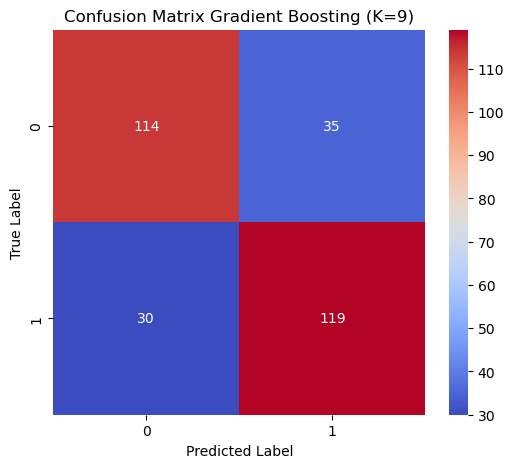


Jumlah data per kelas setelah SMOTE:
1    149
0    149
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.19%    78.19%  78.19%   78.19%
1           AdaBoost  5   77.18%    77.19%  77.18%   77.18%
2           AdaBoost  7   79.19%    79.22%  79.19%   79.19%
3           AdaBoost  9   77.85%    77.87%  77.85%   77.85%
4  Gradient Boosting  3   78.86%    78.92%  78.86%   78.85%
5  Gradient Boosting  5   79.53%    79.64%  79.53%   79.51%
6  Gradient Boosting  7   77.85%    77.93%  77.85%   77.84%
7  Gradient Boosting  9   78.19%    78.22%  78.19%   78.18%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.19%,78.19%,78.19%,78.19%
1,AdaBoost,5,77.18%,77.19%,77.18%,77.18%
2,AdaBoost,7,79.19%,79.22%,79.19%,79.19%
3,AdaBoost,9,77.85%,77.87%,77.85%,77.85%
4,Gradient Boosting,3,78.86%,78.92%,78.86%,78.85%
5,Gradient Boosting,5,79.53%,79.64%,79.53%,79.51%
6,Gradient Boosting,7,77.85%,77.93%,77.85%,77.84%
7,Gradient Boosting,9,78.19%,78.22%,78.19%,78.18%


In [53]:
balancing(df_fitur_8_kualitas_no_fnc)


# 8 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


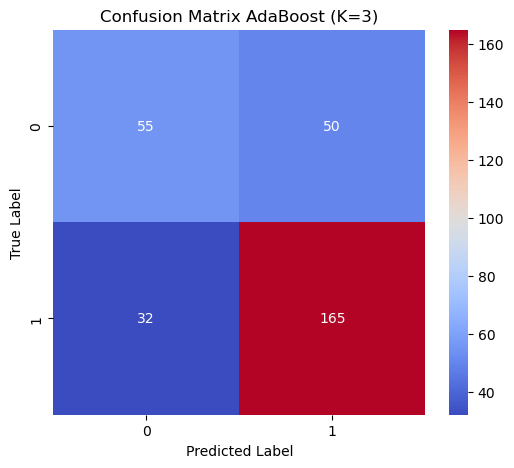


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

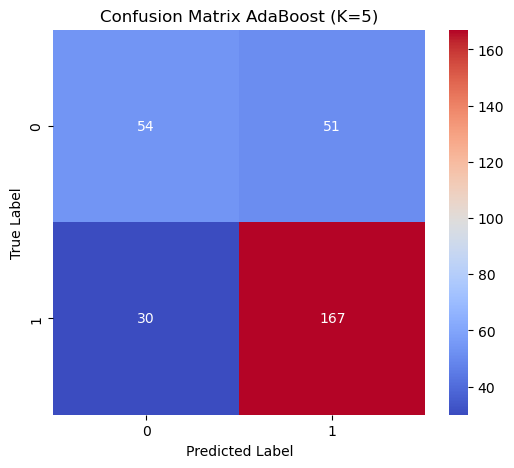

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

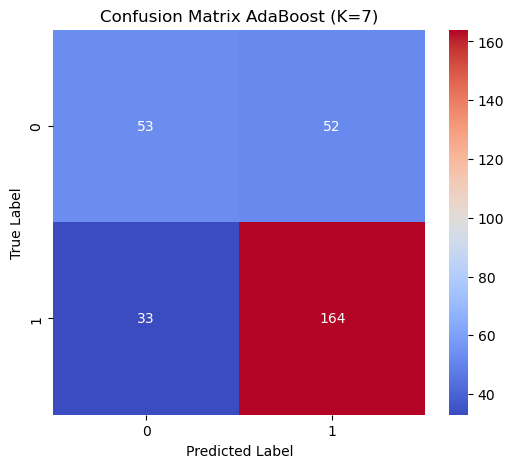


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

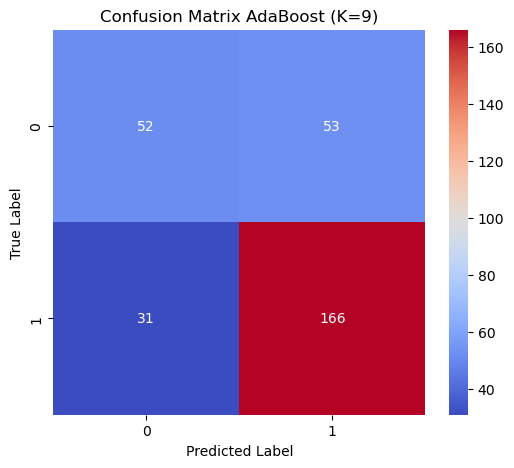


Evaluasi Gradient Boosting dengan K=3


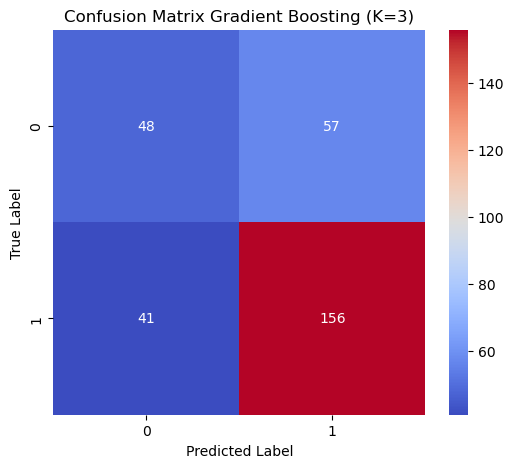


Evaluasi Gradient Boosting dengan K=5


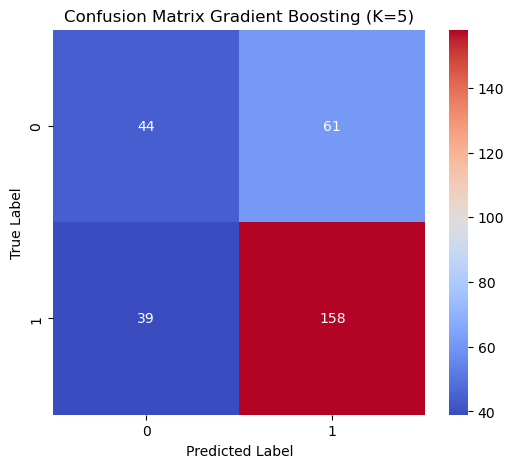


Evaluasi Gradient Boosting dengan K=7


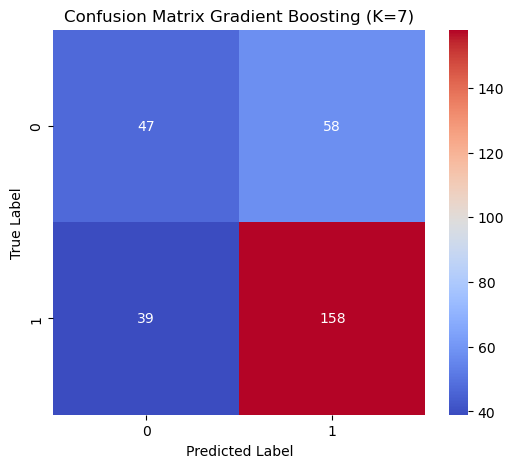


Evaluasi Gradient Boosting dengan K=9


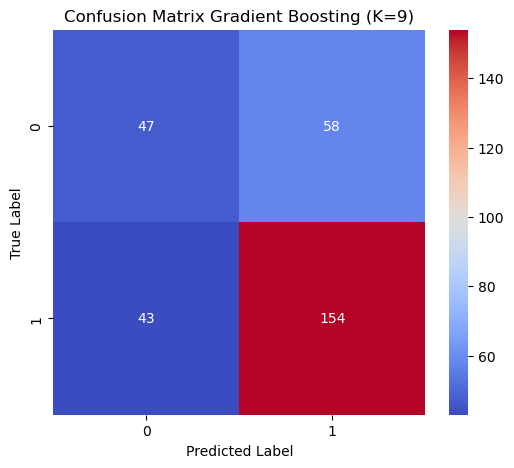


Jumlah data untuk tiap kelas:
0    105
1    197
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   72.85%    69.98%  68.07%   68.69%
1           AdaBoost  5   73.18%    70.45%  68.10%   68.81%
2           AdaBoost  7   71.85%    68.78%  66.86%   67.46%
3           AdaBoost  9   72.19%    69.22%  66.89%   67.56%
4  Gradient Boosting  3   67.55%    63.59%  62.45%   62.79%
5  Gradient Boosting  5   66.89%    62.58%  61.05%   61.39%
6  Gradient Boosting  7   67.88%    63.90%  62.48%   62.86%
7  Gradient Boosting  9   66.56%    62.43%  61.47%   61.76%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,72.85%,69.98%,68.07%,68.69%
1,AdaBoost,5,73.18%,70.45%,68.10%,68.81%
2,AdaBoost,7,71.85%,68.78%,66.86%,67.46%
3,AdaBoost,9,72.19%,69.22%,66.89%,67.56%
4,Gradient Boosting,3,67.55%,63.59%,62.45%,62.79%
5,Gradient Boosting,5,66.89%,62.58%,61.05%,61.39%
6,Gradient Boosting,7,67.88%,63.90%,62.48%,62.86%
7,Gradient Boosting,9,66.56%,62.43%,61.47%,61.76%


In [54]:
no_balancing(df_fitur_8_kuantitas_no_fnc)



#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


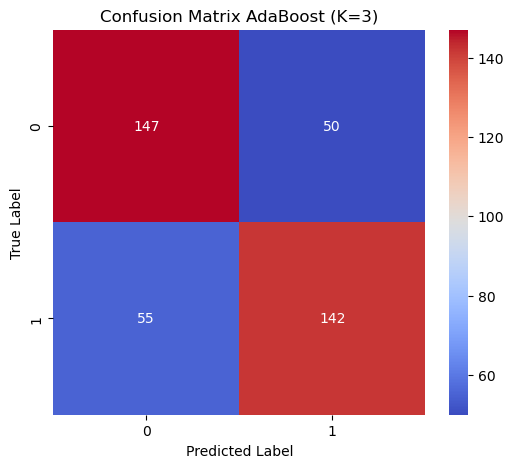


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

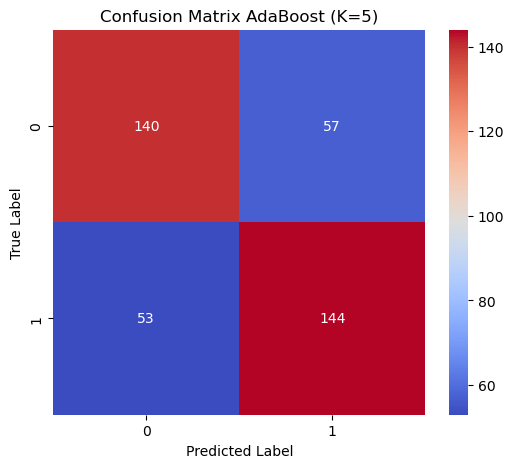

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

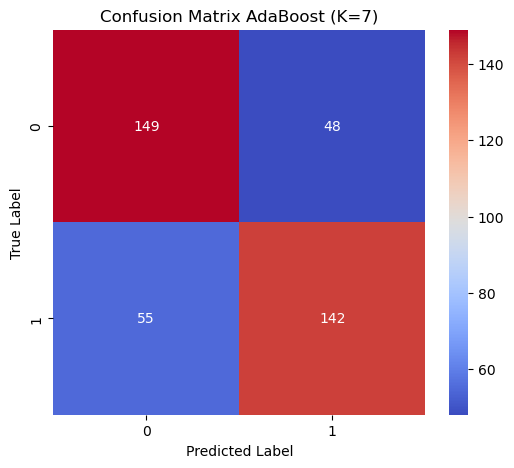

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

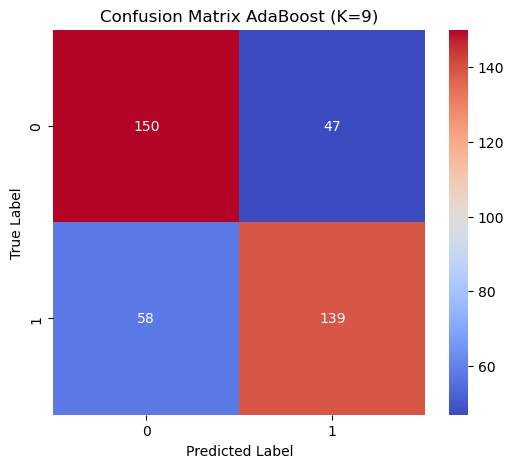


Evaluasi Gradient Boosting dengan K=3


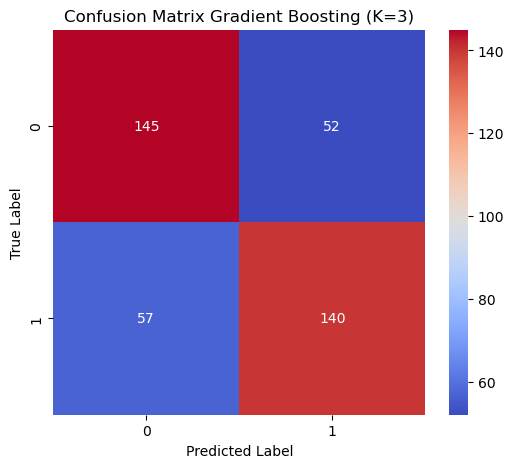


Evaluasi Gradient Boosting dengan K=5


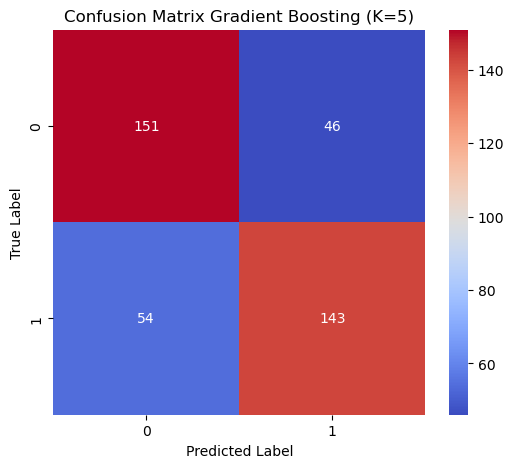


Evaluasi Gradient Boosting dengan K=7


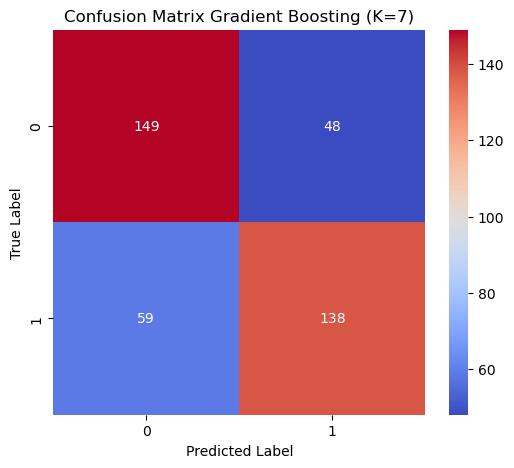


Evaluasi Gradient Boosting dengan K=9


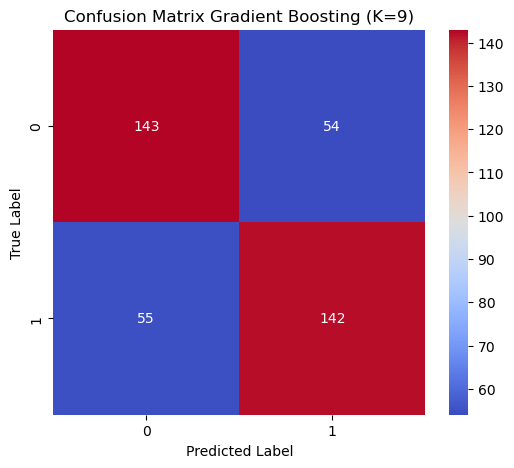


Jumlah data per kelas setelah SMOTE:
1    197
0    197
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   73.35%    73.37%  73.35%   73.35%
1           AdaBoost  5   72.08%    72.09%  72.08%   72.08%
2           AdaBoost  7   73.86%    73.89%  73.86%   73.85%
3           AdaBoost  9   73.35%    73.42%  73.35%   73.33%
4  Gradient Boosting  3   72.34%    72.35%  72.34%   72.33%
5  Gradient Boosting  5   74.62%    74.66%  74.62%   74.61%
6  Gradient Boosting  7   72.84%    72.91%  72.84%   72.82%
7  Gradient Boosting  9   72.34%    72.34%  72.34%   72.33%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,73.35%,73.37%,73.35%,73.35%
1,AdaBoost,5,72.08%,72.09%,72.08%,72.08%
2,AdaBoost,7,73.86%,73.89%,73.86%,73.85%
3,AdaBoost,9,73.35%,73.42%,73.35%,73.33%
4,Gradient Boosting,3,72.34%,72.35%,72.34%,72.33%
5,Gradient Boosting,5,74.62%,74.66%,74.62%,74.61%
6,Gradient Boosting,7,72.84%,72.91%,72.84%,72.82%
7,Gradient Boosting,9,72.34%,72.34%,72.34%,72.33%


In [55]:
balancing(df_fitur_8_kuantitas_no_fnc)

# 12 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


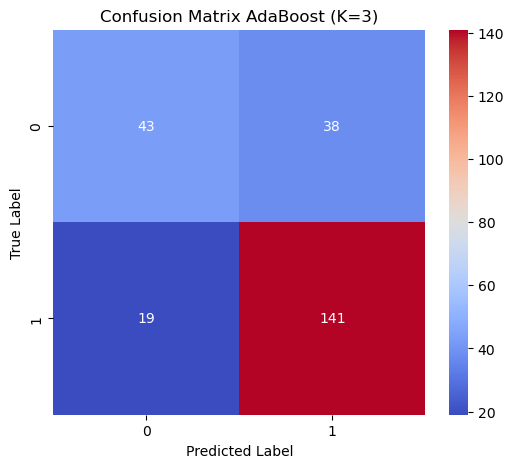


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

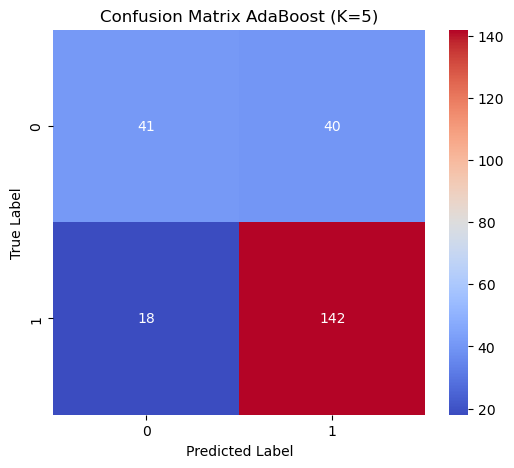

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

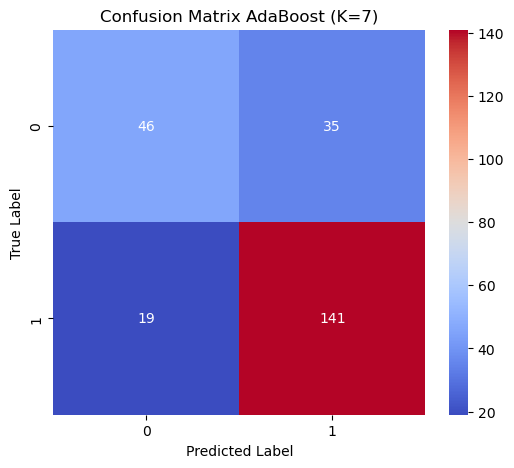


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

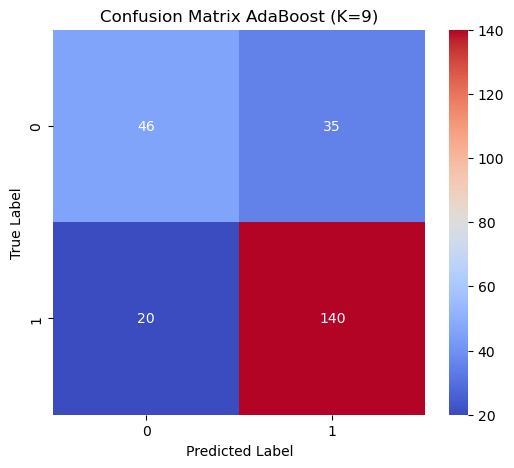


Evaluasi Gradient Boosting dengan K=3


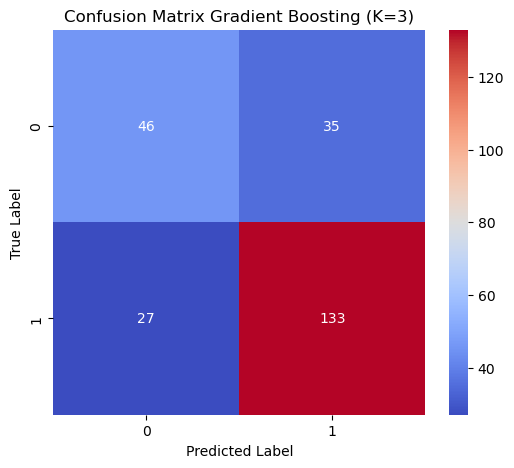


Evaluasi Gradient Boosting dengan K=5


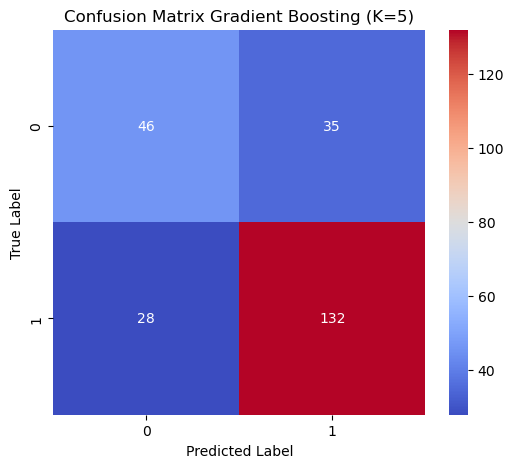


Evaluasi Gradient Boosting dengan K=7


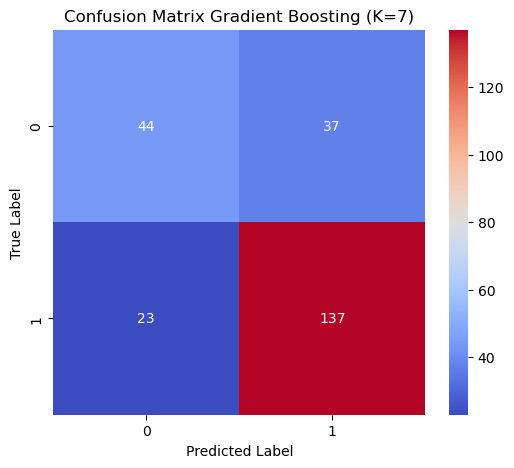


Evaluasi Gradient Boosting dengan K=9


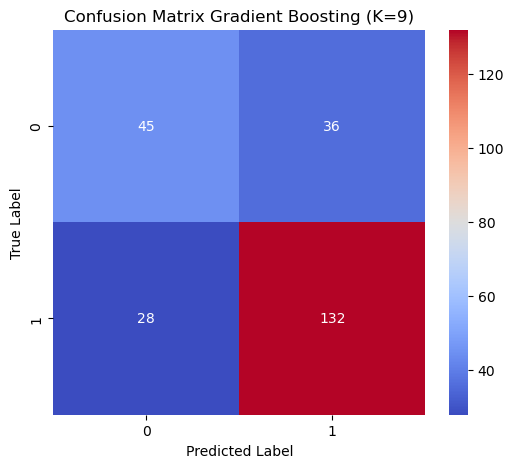


Jumlah data untuk tiap kelas:
0     81
1    160
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.35%    74.06%  70.61%   71.66%
1           AdaBoost  5   75.93%    73.76%  69.68%   70.81%
2           AdaBoost  7   77.59%    75.44%  72.46%   73.47%
3           AdaBoost  9   77.18%    74.85%  72.15%   73.08%
4  Gradient Boosting  3   74.27%    71.09%  69.96%   70.42%
5  Gradient Boosting  5   73.86%    70.60%  69.65%   70.04%
6  Gradient Boosting  7   75.10%    72.20%  69.97%   70.75%
7  Gradient Boosting  9   73.44%    70.11%  69.03%   69.46%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.35%,74.06%,70.61%,71.66%
1,AdaBoost,5,75.93%,73.76%,69.68%,70.81%
2,AdaBoost,7,77.59%,75.44%,72.46%,73.47%
3,AdaBoost,9,77.18%,74.85%,72.15%,73.08%
4,Gradient Boosting,3,74.27%,71.09%,69.96%,70.42%
5,Gradient Boosting,5,73.86%,70.60%,69.65%,70.04%
6,Gradient Boosting,7,75.10%,72.20%,69.97%,70.75%
7,Gradient Boosting,9,73.44%,70.11%,69.03%,69.46%


In [56]:
no_balancing(df_fitur_12_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


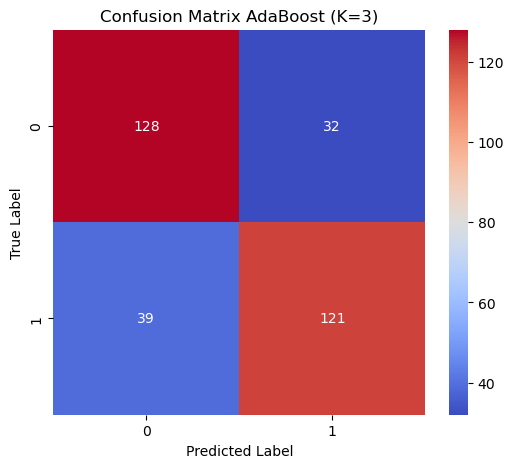


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

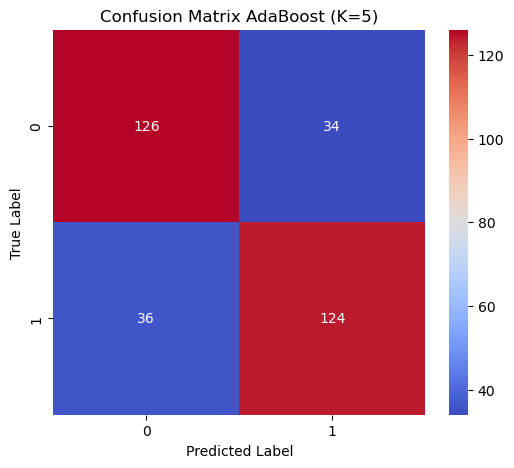


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

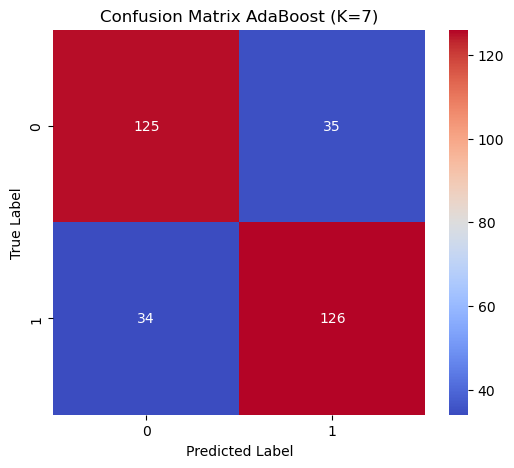


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

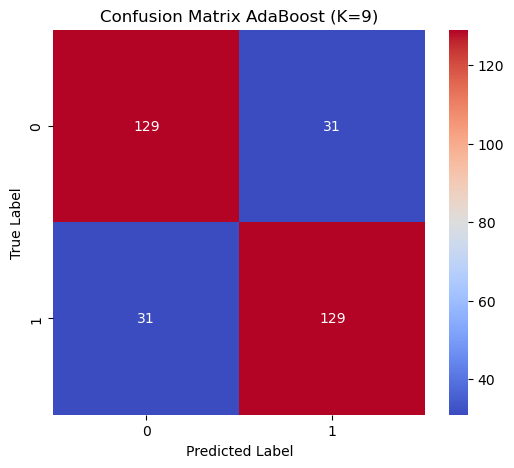


Evaluasi Gradient Boosting dengan K=3


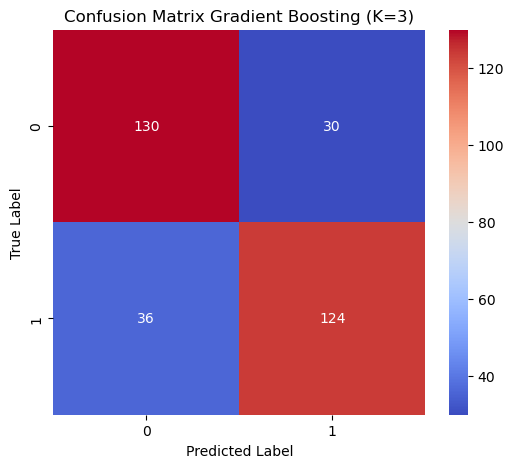


Evaluasi Gradient Boosting dengan K=5


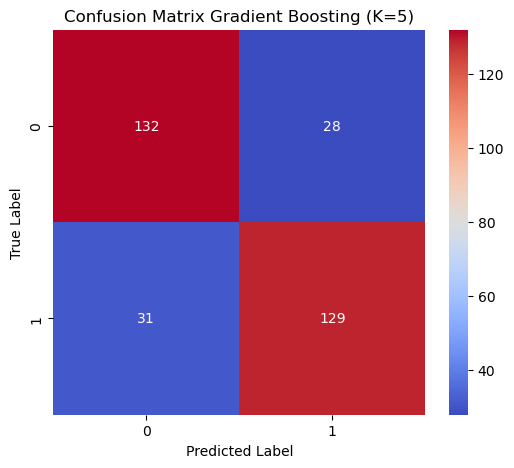


Evaluasi Gradient Boosting dengan K=7


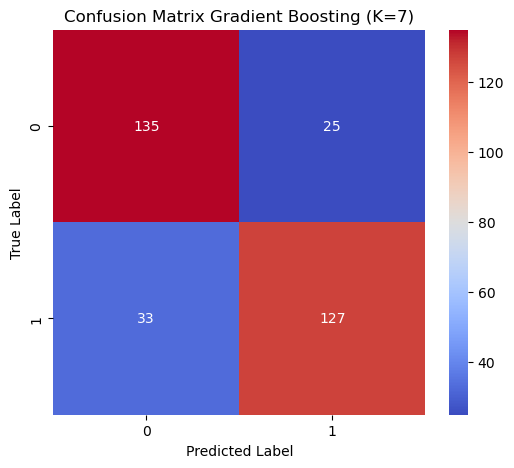


Evaluasi Gradient Boosting dengan K=9


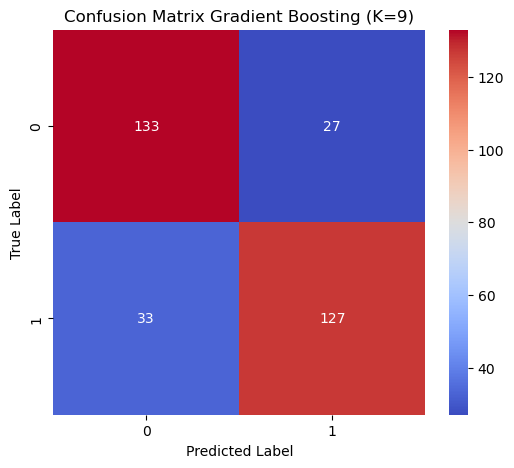


Jumlah data per kelas setelah SMOTE:
1    160
0    160
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.81%    77.87%  77.81%   77.80%
1           AdaBoost  5   78.12%    78.13%  78.12%   78.12%
2           AdaBoost  7   78.44%    78.44%  78.44%   78.44%
3           AdaBoost  9   80.62%    80.62%  80.62%   80.62%
4  Gradient Boosting  3   79.38%    79.42%  79.38%   79.37%
5  Gradient Boosting  5   81.56%    81.57%  81.56%   81.56%
6  Gradient Boosting  7   81.88%    81.95%  81.88%   81.86%
7  Gradient Boosting  9   81.25%    81.29%  81.25%   81.24%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.81%,77.87%,77.81%,77.80%
1,AdaBoost,5,78.12%,78.13%,78.12%,78.12%
2,AdaBoost,7,78.44%,78.44%,78.44%,78.44%
3,AdaBoost,9,80.62%,80.62%,80.62%,80.62%
4,Gradient Boosting,3,79.38%,79.42%,79.38%,79.37%
5,Gradient Boosting,5,81.56%,81.57%,81.56%,81.56%
6,Gradient Boosting,7,81.88%,81.95%,81.88%,81.86%
7,Gradient Boosting,9,81.25%,81.29%,81.25%,81.24%


In [57]:
balancing(df_fitur_12_kualitas_no_fnc)

# 12 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


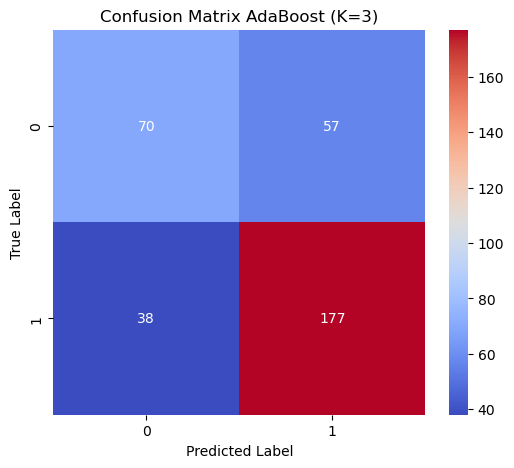


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

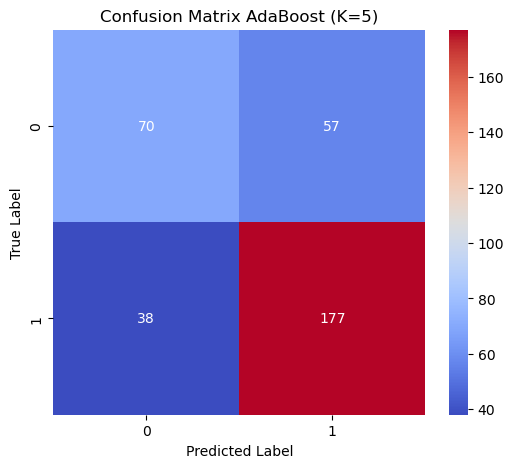

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

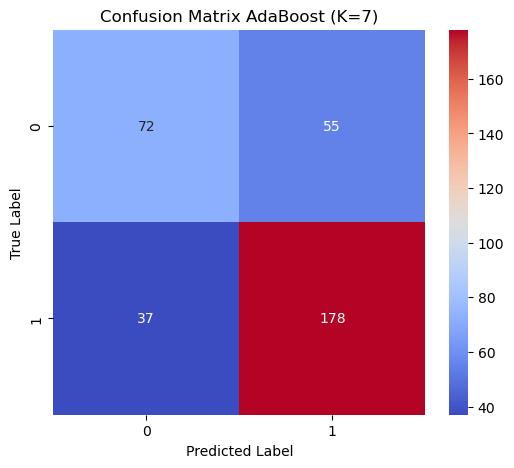


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

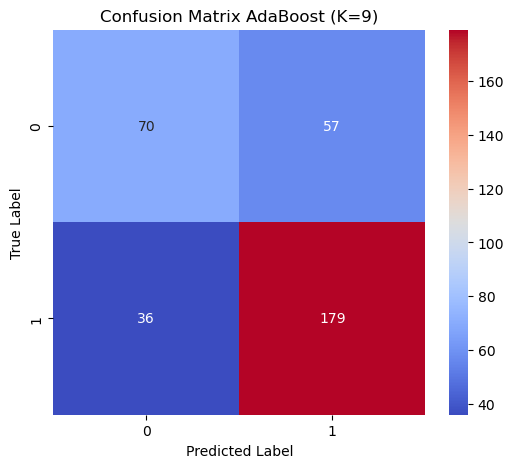


Evaluasi Gradient Boosting dengan K=3


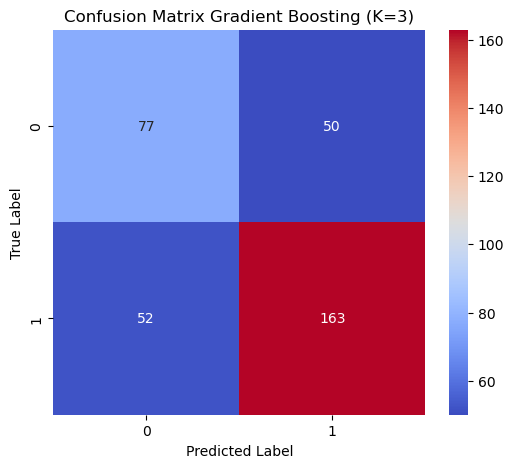


Evaluasi Gradient Boosting dengan K=5


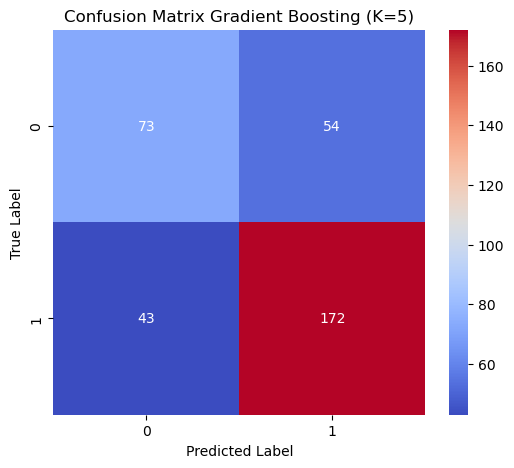


Evaluasi Gradient Boosting dengan K=7


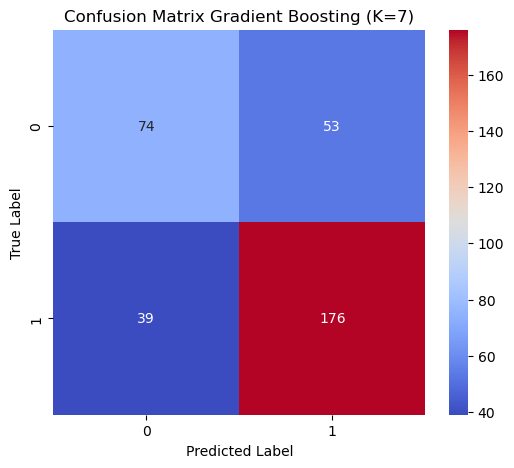


Evaluasi Gradient Boosting dengan K=9


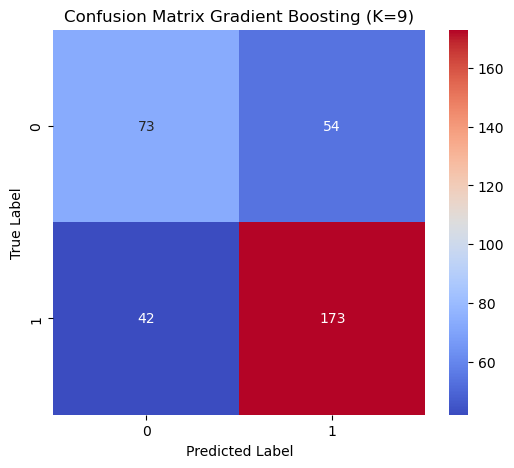


Jumlah data untuk tiap kelas:
0    127
1    215
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   72.22%    70.23%  68.72%   69.21%
1           AdaBoost  5   72.22%    70.23%  68.72%   69.21%
2           AdaBoost  7   73.10%    71.22%  69.74%   70.24%
3           AdaBoost  9   72.81%    70.94%  69.19%   69.73%
4  Gradient Boosting  3   70.18%    68.11%  68.22%   68.16%
5  Gradient Boosting  5   71.64%    69.52%  68.74%   69.04%
6  Gradient Boosting  7   73.10%    71.17%  70.06%   70.47%
7  Gradient Boosting  9   71.93%    69.84%  68.97%   69.31%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,72.22%,70.23%,68.72%,69.21%
1,AdaBoost,5,72.22%,70.23%,68.72%,69.21%
2,AdaBoost,7,73.10%,71.22%,69.74%,70.24%
3,AdaBoost,9,72.81%,70.94%,69.19%,69.73%
4,Gradient Boosting,3,70.18%,68.11%,68.22%,68.16%
5,Gradient Boosting,5,71.64%,69.52%,68.74%,69.04%
6,Gradient Boosting,7,73.10%,71.17%,70.06%,70.47%
7,Gradient Boosting,9,71.93%,69.84%,68.97%,69.31%


In [58]:
no_balancing(df_fitur_12_kuantitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


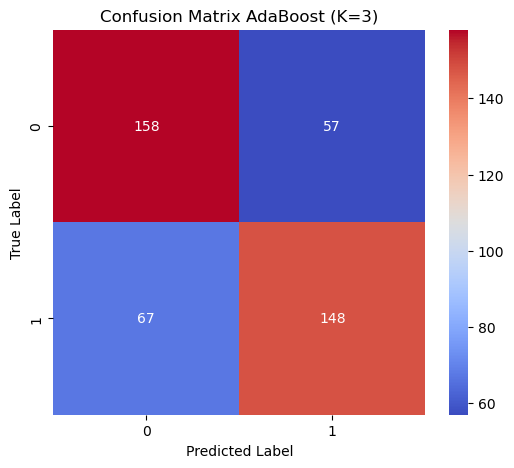


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

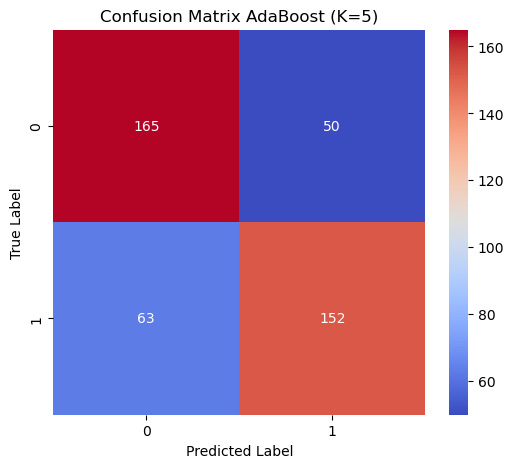

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

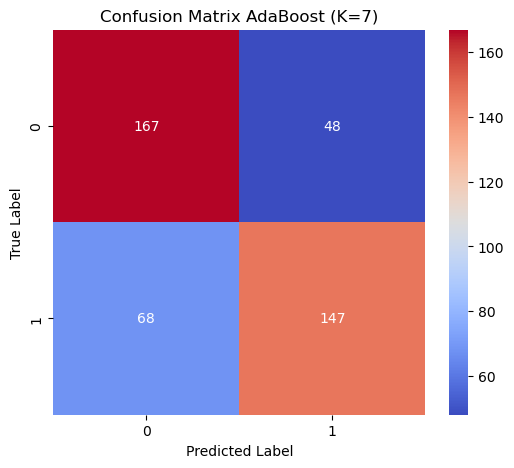


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

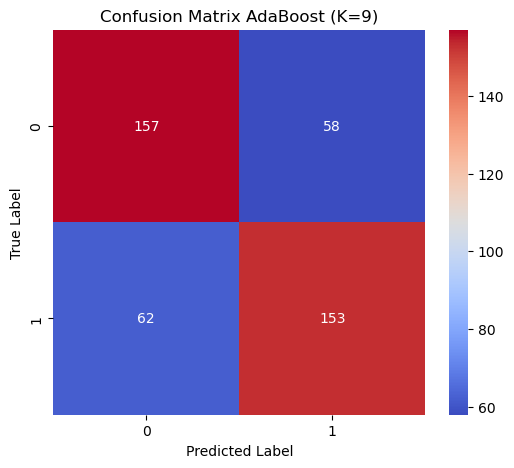


Evaluasi Gradient Boosting dengan K=3


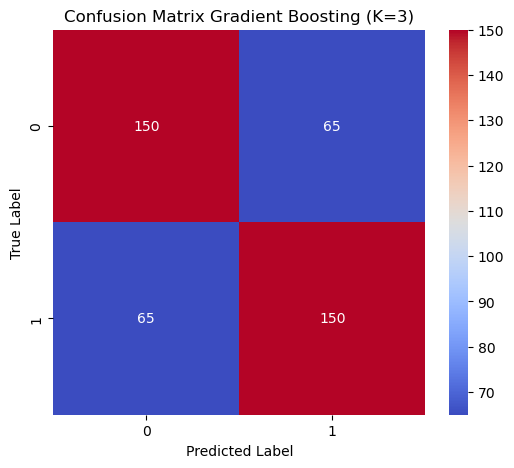


Evaluasi Gradient Boosting dengan K=5


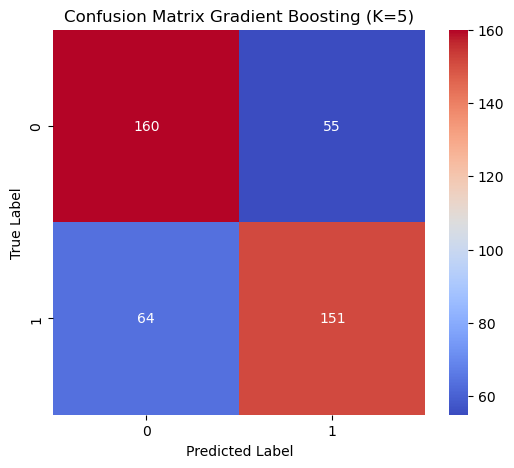


Evaluasi Gradient Boosting dengan K=7


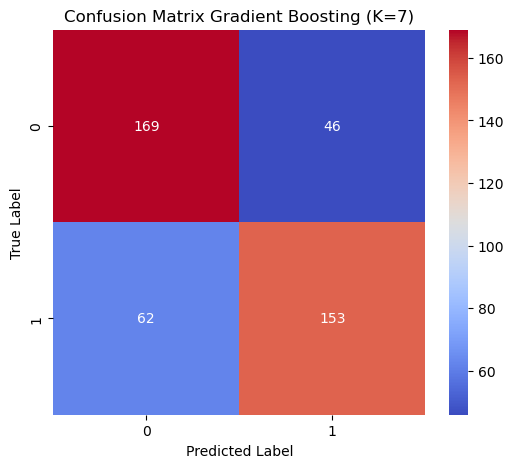


Evaluasi Gradient Boosting dengan K=9


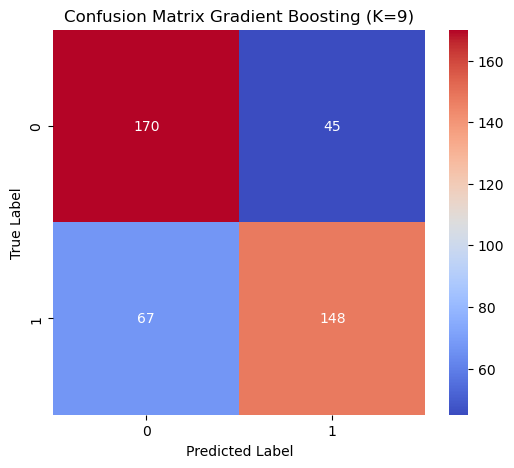


Jumlah data per kelas setelah SMOTE:
1    215
0    215
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   71.16%    71.21%  71.16%   71.15%
1           AdaBoost  5   73.72%    73.81%  73.72%   73.70%
2           AdaBoost  7   73.02%    73.22%  73.02%   72.96%
3           AdaBoost  9   72.09%    72.10%  72.09%   72.09%
4  Gradient Boosting  3   69.77%    69.77%  69.77%   69.77%
5  Gradient Boosting  5   72.33%    72.36%  72.33%   72.31%
6  Gradient Boosting  7   74.88%    75.02%  74.88%   74.85%
7  Gradient Boosting  9   73.95%    74.21%  73.95%   73.89%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,71.16%,71.21%,71.16%,71.15%
1,AdaBoost,5,73.72%,73.81%,73.72%,73.70%
2,AdaBoost,7,73.02%,73.22%,73.02%,72.96%
3,AdaBoost,9,72.09%,72.10%,72.09%,72.09%
4,Gradient Boosting,3,69.77%,69.77%,69.77%,69.77%
5,Gradient Boosting,5,72.33%,72.36%,72.33%,72.31%
6,Gradient Boosting,7,74.88%,75.02%,74.88%,74.85%
7,Gradient Boosting,9,73.95%,74.21%,73.95%,73.89%


In [59]:
balancing(df_fitur_12_kuantitas_no_fnc)

# 16 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


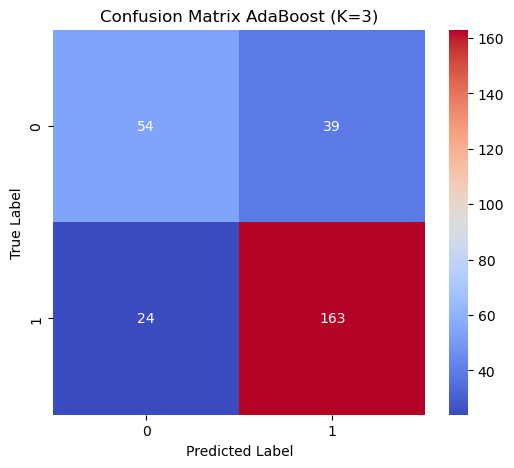


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

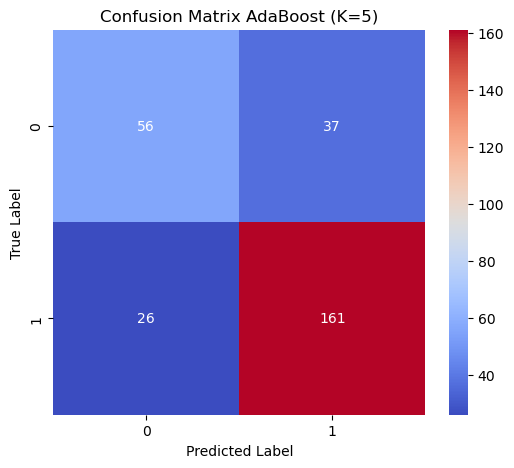


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

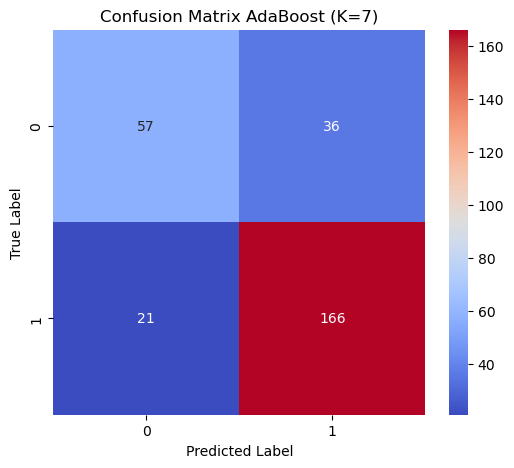


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

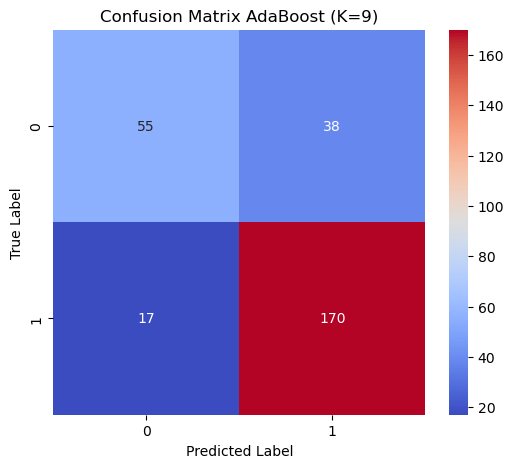


Evaluasi Gradient Boosting dengan K=3


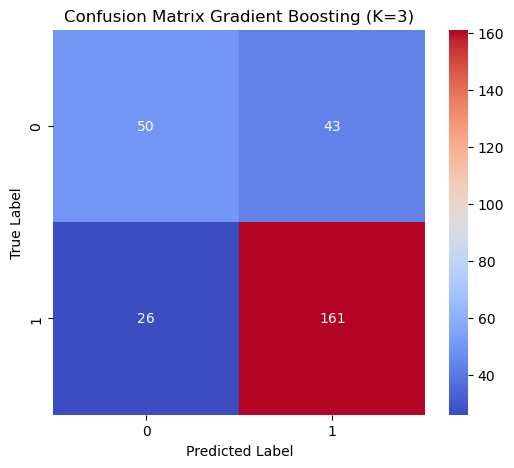


Evaluasi Gradient Boosting dengan K=5


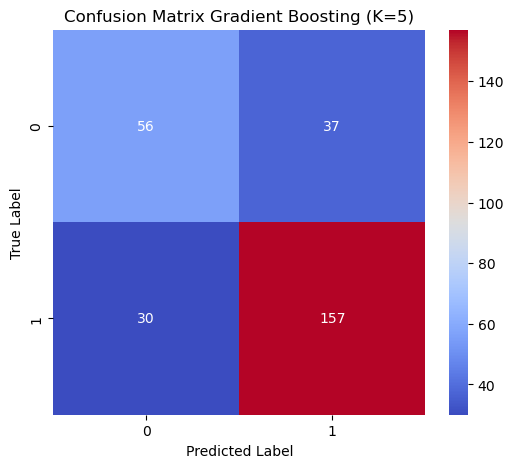


Evaluasi Gradient Boosting dengan K=7


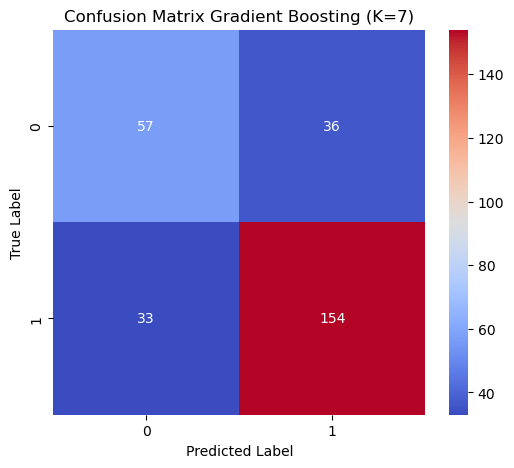


Evaluasi Gradient Boosting dengan K=9


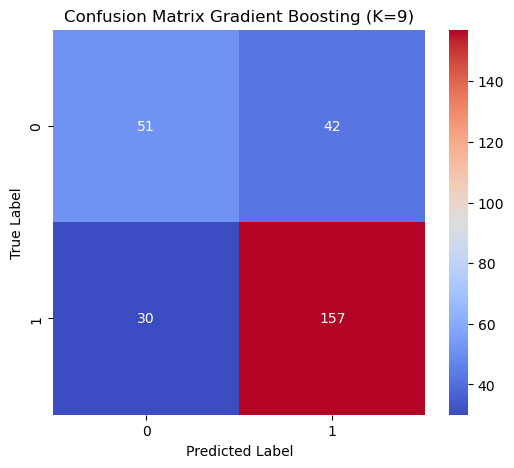


Jumlah data untuk tiap kelas:
0     93
1    187
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.50%    74.96%  72.62%   73.48%
1           AdaBoost  5   77.50%    74.80%  73.16%   73.82%
2           AdaBoost  7   79.64%    77.63%  75.03%   76.01%
3           AdaBoost  9   80.36%    79.06%  75.02%   76.37%
4  Gradient Boosting  3   75.36%    72.36%  69.93%   70.76%
5  Gradient Boosting  5   76.07%    73.02%  72.09%   72.49%
6  Gradient Boosting  7   75.36%    72.19%  71.82%   72.00%
7  Gradient Boosting  9   74.29%    70.93%  69.40%   69.98%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.50%,74.96%,72.62%,73.48%
1,AdaBoost,5,77.50%,74.80%,73.16%,73.82%
2,AdaBoost,7,79.64%,77.63%,75.03%,76.01%
3,AdaBoost,9,80.36%,79.06%,75.02%,76.37%
4,Gradient Boosting,3,75.36%,72.36%,69.93%,70.76%
5,Gradient Boosting,5,76.07%,73.02%,72.09%,72.49%
6,Gradient Boosting,7,75.36%,72.19%,71.82%,72.00%
7,Gradient Boosting,9,74.29%,70.93%,69.40%,69.98%


In [60]:
no_balancing(df_fitur_16_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


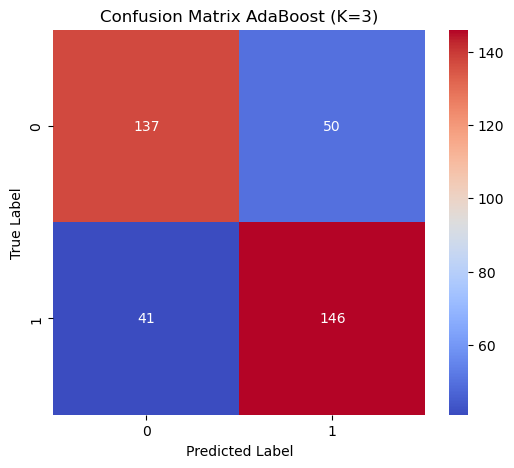


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

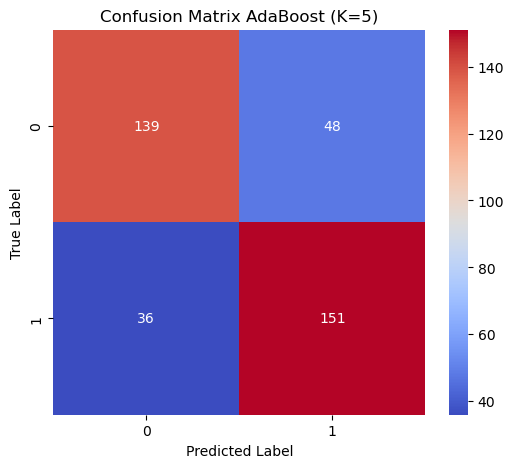

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

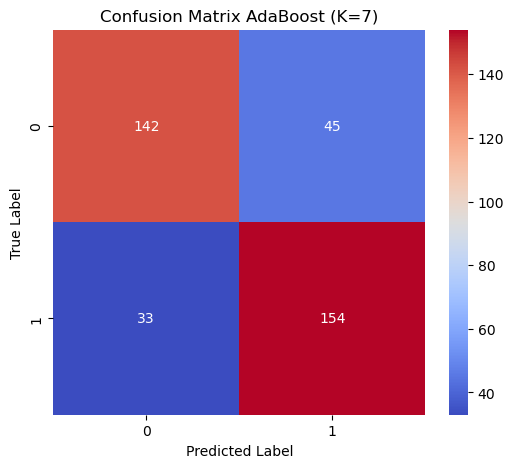

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

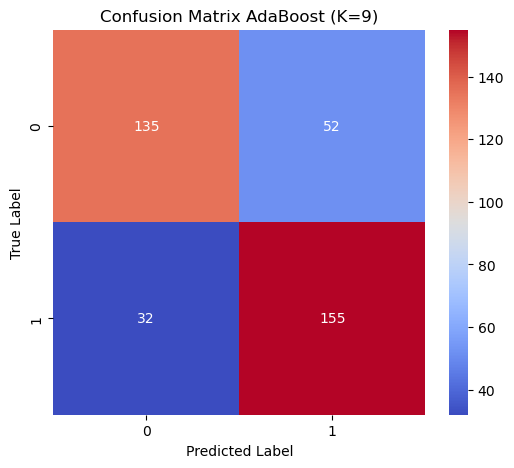


Evaluasi Gradient Boosting dengan K=3


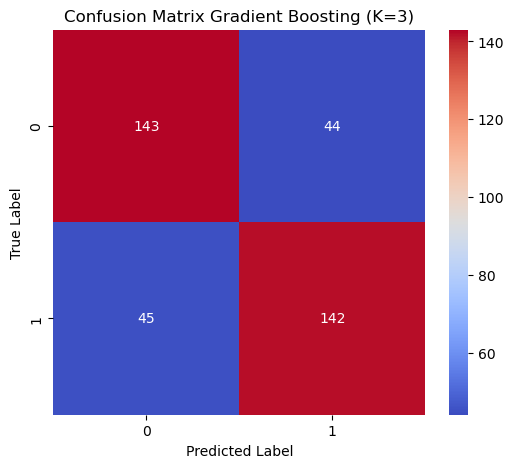


Evaluasi Gradient Boosting dengan K=5


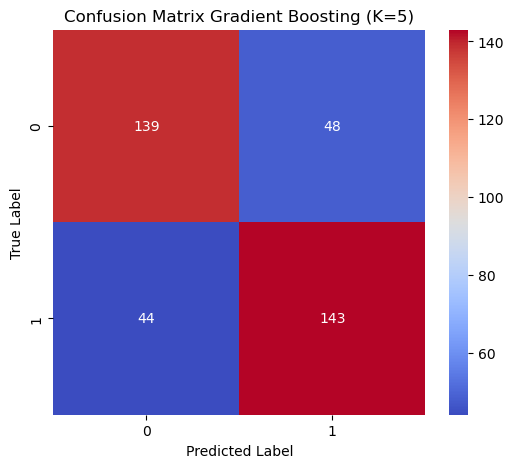


Evaluasi Gradient Boosting dengan K=7


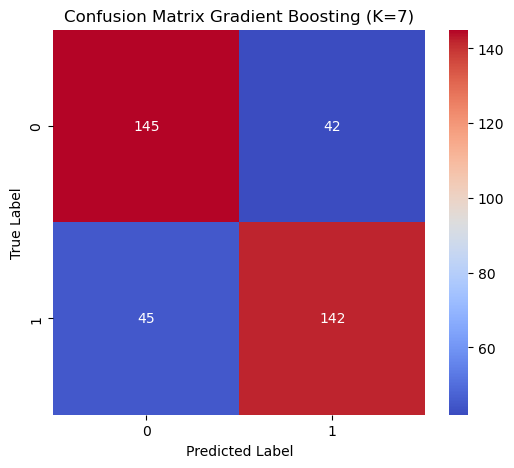


Evaluasi Gradient Boosting dengan K=9


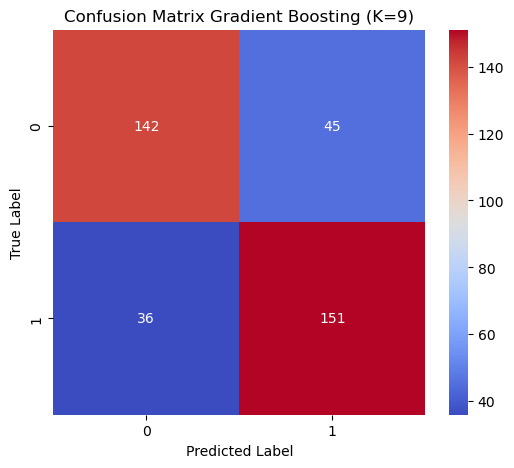


Jumlah data per kelas setelah SMOTE:
1    187
0    187
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   75.67%    75.73%  75.67%   75.65%
1           AdaBoost  5   77.54%    77.65%  77.54%   77.52%
2           AdaBoost  7   79.14%    79.26%  79.14%   79.12%
3           AdaBoost  9   77.54%    77.86%  77.54%   77.48%
4  Gradient Boosting  3   76.20%    76.20%  76.20%   76.20%
5  Gradient Boosting  5   75.40%    75.41%  75.40%   75.40%
6  Gradient Boosting  7   76.74%    76.74%  76.74%   76.74%
7  Gradient Boosting  9   78.34%    78.41%  78.34%   78.33%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,75.67%,75.73%,75.67%,75.65%
1,AdaBoost,5,77.54%,77.65%,77.54%,77.52%
2,AdaBoost,7,79.14%,79.26%,79.14%,79.12%
3,AdaBoost,9,77.54%,77.86%,77.54%,77.48%
4,Gradient Boosting,3,76.20%,76.20%,76.20%,76.20%
5,Gradient Boosting,5,75.40%,75.41%,75.40%,75.40%
6,Gradient Boosting,7,76.74%,76.74%,76.74%,76.74%
7,Gradient Boosting,9,78.34%,78.41%,78.34%,78.33%


In [61]:
balancing(df_fitur_16_kualitas_no_fnc)

# 16 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


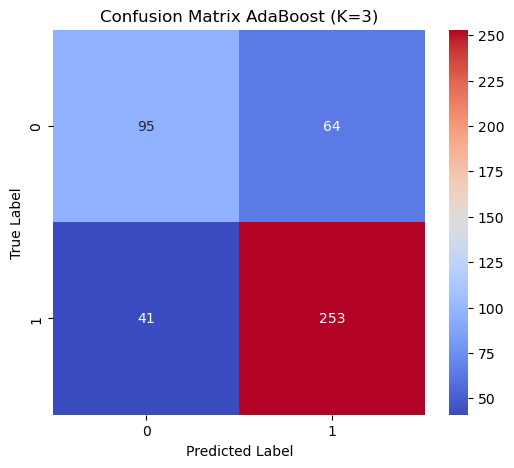


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

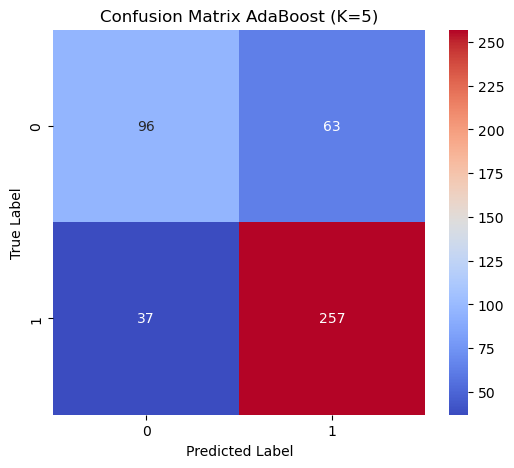


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

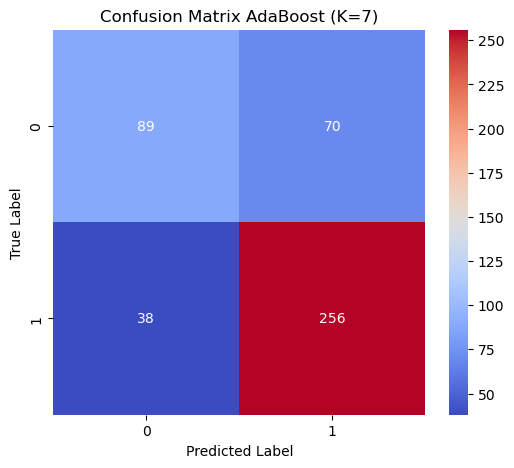


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

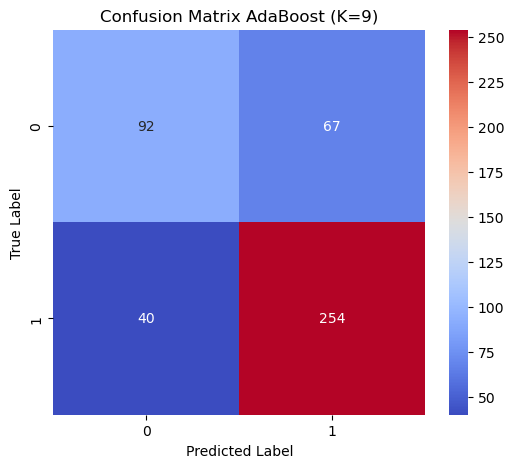


Evaluasi Gradient Boosting dengan K=3


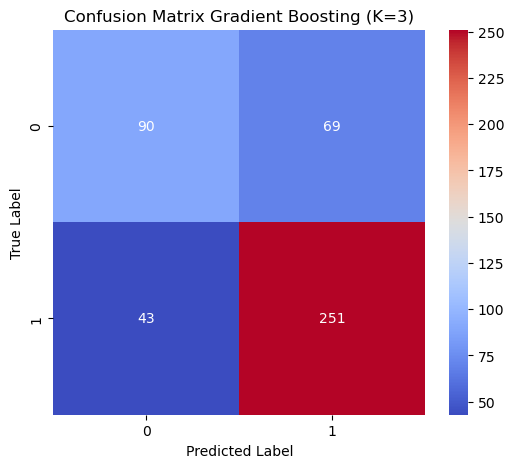


Evaluasi Gradient Boosting dengan K=5


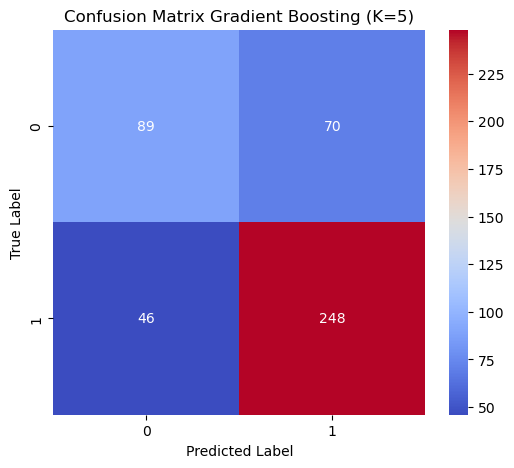


Evaluasi Gradient Boosting dengan K=7


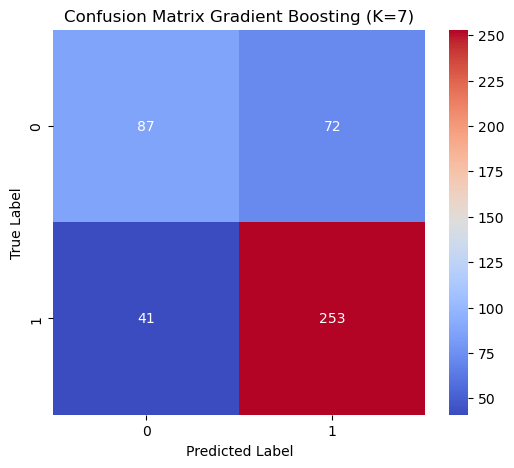


Evaluasi Gradient Boosting dengan K=9


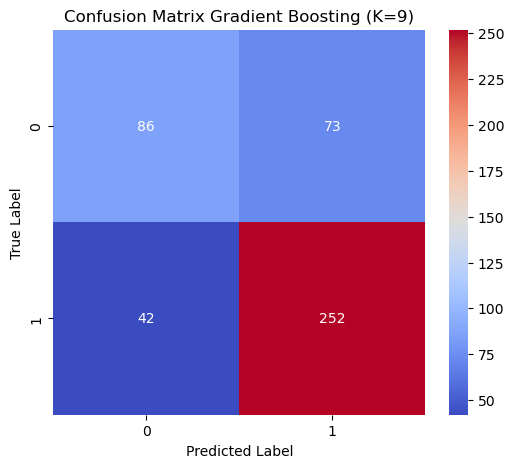


Jumlah data untuk tiap kelas:
0    159
1    294
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.82%    74.83%  72.90%   73.61%
1           AdaBoost  5   77.92%    76.25%  73.90%   74.73%
2           AdaBoost  7   76.16%    74.30%  71.52%   72.41%
3           AdaBoost  9   76.38%    74.41%  72.13%   72.92%
4  Gradient Boosting  3   75.28%    73.05%  70.99%   71.70%
5  Gradient Boosting  5   74.39%    71.96%  70.16%   70.79%
6  Gradient Boosting  7   75.06%    72.91%  70.39%   71.19%
7  Gradient Boosting  9   74.61%    72.36%  69.90%   70.68%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.82%,74.83%,72.90%,73.61%
1,AdaBoost,5,77.92%,76.25%,73.90%,74.73%
2,AdaBoost,7,76.16%,74.30%,71.52%,72.41%
3,AdaBoost,9,76.38%,74.41%,72.13%,72.92%
4,Gradient Boosting,3,75.28%,73.05%,70.99%,71.70%
5,Gradient Boosting,5,74.39%,71.96%,70.16%,70.79%
6,Gradient Boosting,7,75.06%,72.91%,70.39%,71.19%
7,Gradient Boosting,9,74.61%,72.36%,69.90%,70.68%


In [62]:
no_balancing(df_fitur_16_kuantitas_no_fnc)



#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


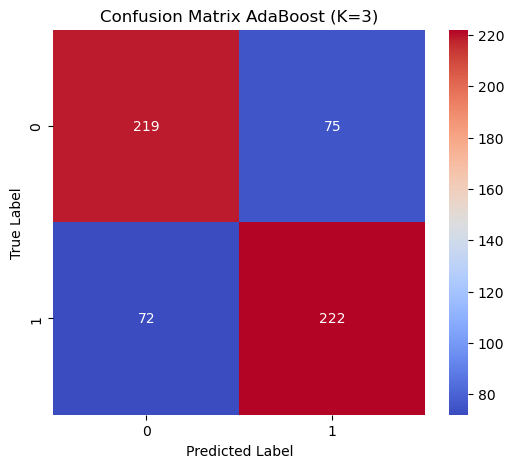


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

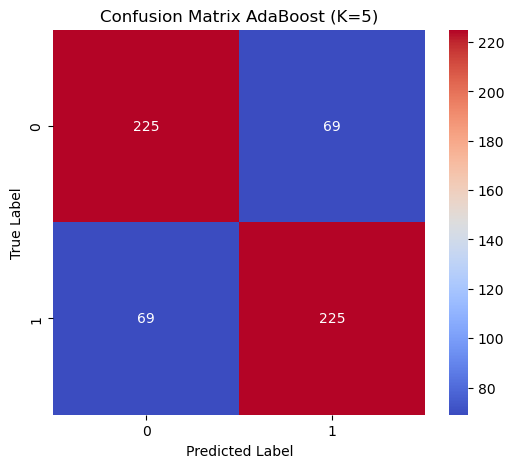


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

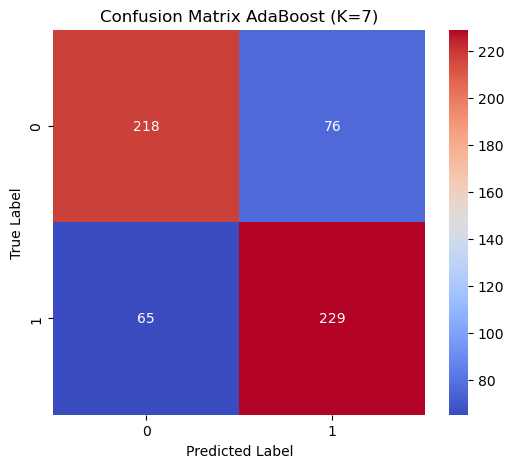


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

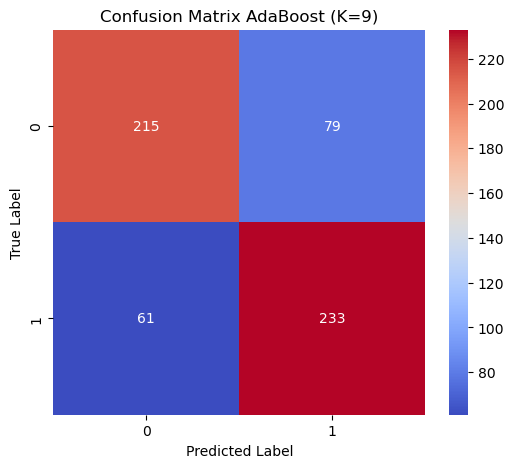


Evaluasi Gradient Boosting dengan K=3


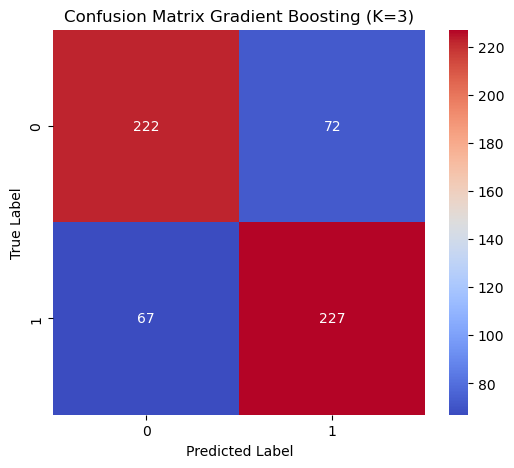


Evaluasi Gradient Boosting dengan K=5


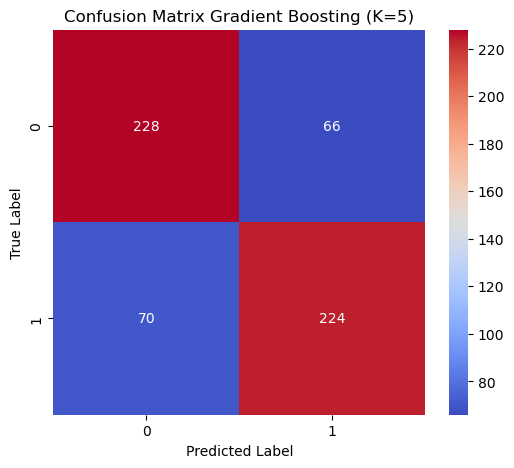


Evaluasi Gradient Boosting dengan K=7


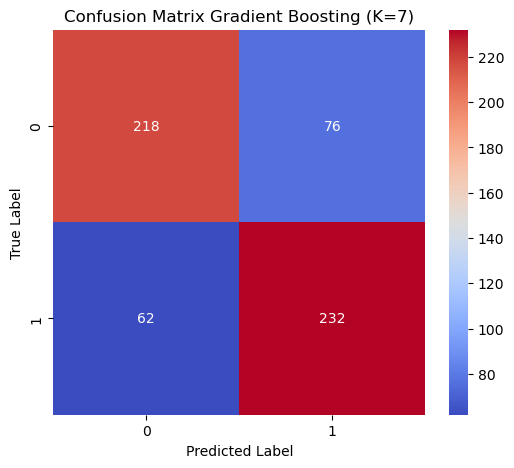


Evaluasi Gradient Boosting dengan K=9


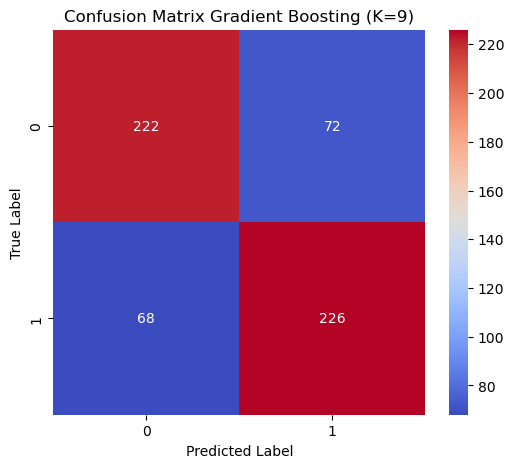


Jumlah data per kelas setelah SMOTE:
1    294
0    294
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   75.00%    75.00%  75.00%   75.00%
1           AdaBoost  5   76.53%    76.53%  76.53%   76.53%
2           AdaBoost  7   76.02%    76.06%  76.02%   76.01%
3           AdaBoost  9   76.19%    76.29%  76.19%   76.17%
4  Gradient Boosting  3   76.36%    76.37%  76.36%   76.36%
5  Gradient Boosting  5   76.87%    76.88%  76.87%   76.87%
6  Gradient Boosting  7   76.53%    76.59%  76.53%   76.52%
7  Gradient Boosting  9   76.19%    76.20%  76.19%   76.19%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,75.00%,75.00%,75.00%,75.00%
1,AdaBoost,5,76.53%,76.53%,76.53%,76.53%
2,AdaBoost,7,76.02%,76.06%,76.02%,76.01%
3,AdaBoost,9,76.19%,76.29%,76.19%,76.17%
4,Gradient Boosting,3,76.36%,76.37%,76.36%,76.36%
5,Gradient Boosting,5,76.87%,76.88%,76.87%,76.87%
6,Gradient Boosting,7,76.53%,76.59%,76.53%,76.52%
7,Gradient Boosting,9,76.19%,76.20%,76.19%,76.19%


In [63]:
balancing(df_fitur_16_kuantitas_no_fnc)

# 20 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


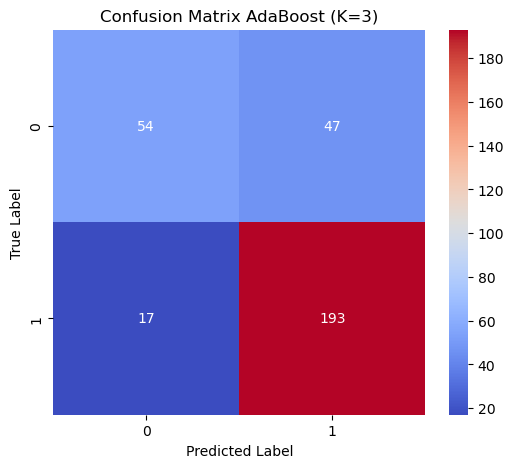


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

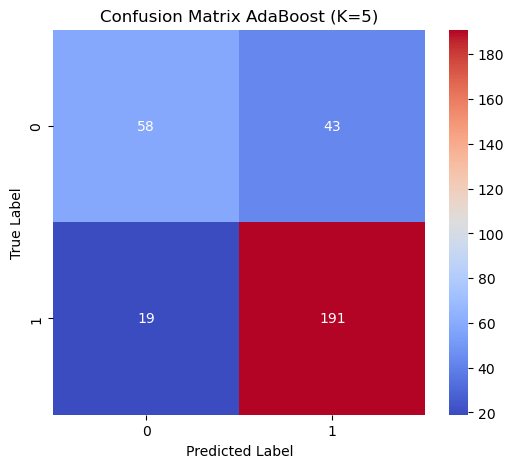


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

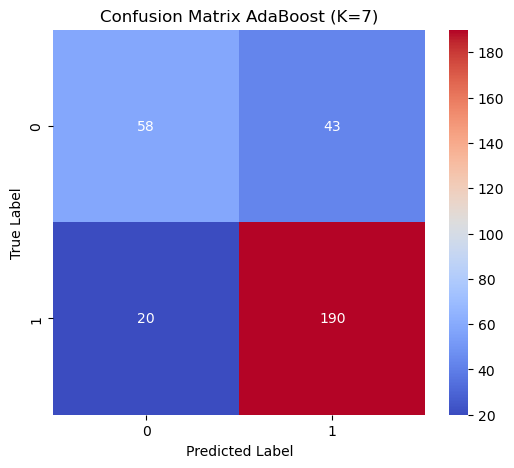


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

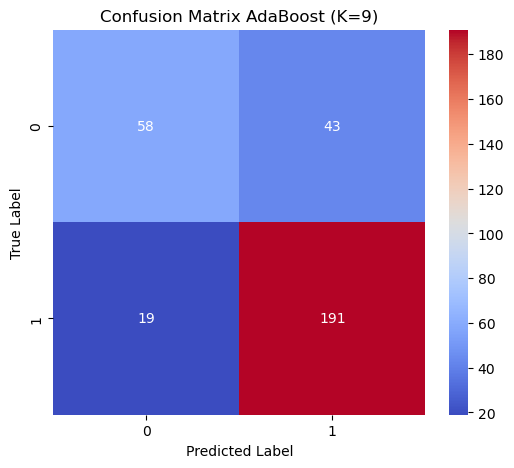


Evaluasi Gradient Boosting dengan K=3


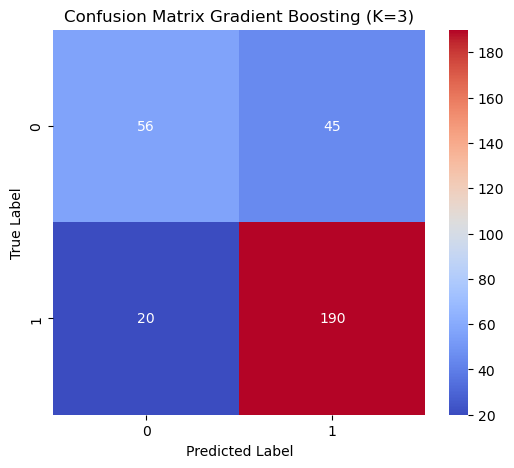


Evaluasi Gradient Boosting dengan K=5


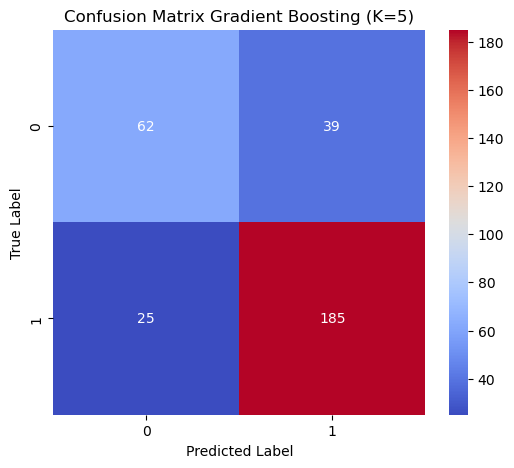


Evaluasi Gradient Boosting dengan K=7


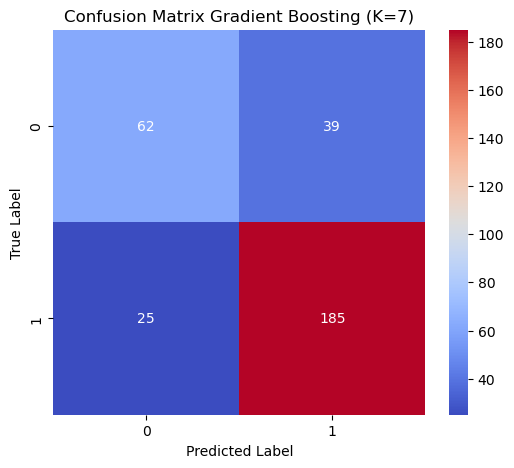


Evaluasi Gradient Boosting dengan K=9


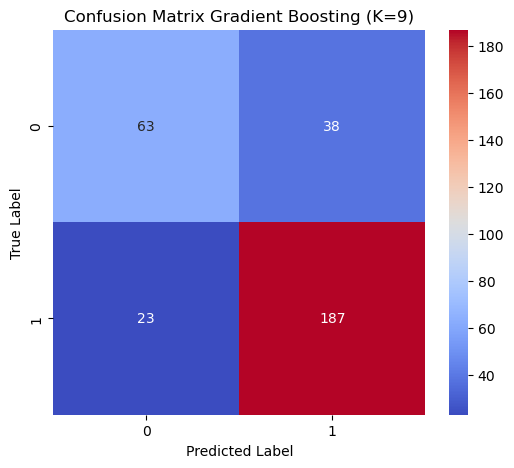


Jumlah data untuk tiap kelas:
0    101
1    210
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.42%    78.24%  72.69%   74.28%
1           AdaBoost  5   80.06%    78.47%  74.19%   75.60%
2           AdaBoost  7   79.74%    77.95%  73.95%   75.29%
3           AdaBoost  9   80.06%    78.47%  74.19%   75.60%
4  Gradient Boosting  3   79.10%    77.27%  72.96%   74.34%
5  Gradient Boosting  5   79.42%    76.93%  74.74%   75.61%
6  Gradient Boosting  7   79.42%    76.93%  74.74%   75.61%
7  Gradient Boosting  9   80.39%    78.18%  75.71%   76.68%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.42%,78.24%,72.69%,74.28%
1,AdaBoost,5,80.06%,78.47%,74.19%,75.60%
2,AdaBoost,7,79.74%,77.95%,73.95%,75.29%
3,AdaBoost,9,80.06%,78.47%,74.19%,75.60%
4,Gradient Boosting,3,79.10%,77.27%,72.96%,74.34%
5,Gradient Boosting,5,79.42%,76.93%,74.74%,75.61%
6,Gradient Boosting,7,79.42%,76.93%,74.74%,75.61%
7,Gradient Boosting,9,80.39%,78.18%,75.71%,76.68%


In [64]:
no_balancing(df_fitur_20_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


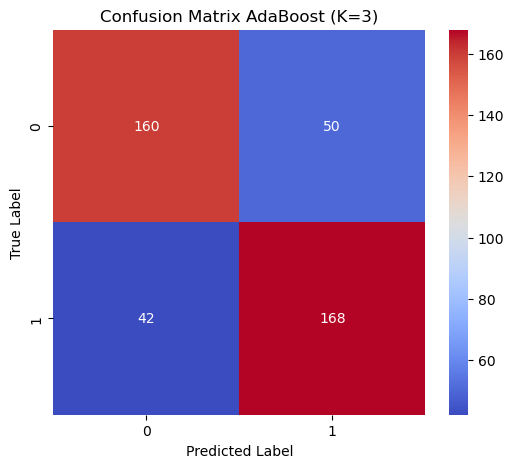


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

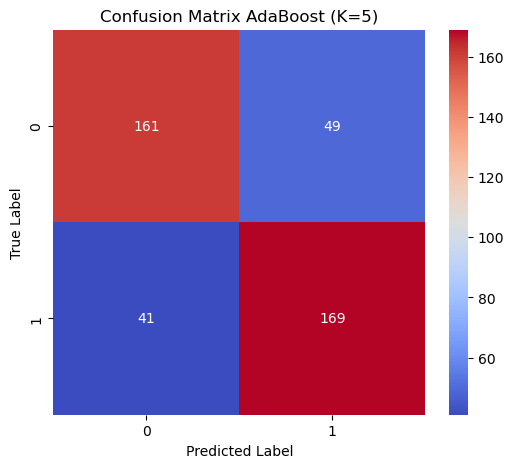

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

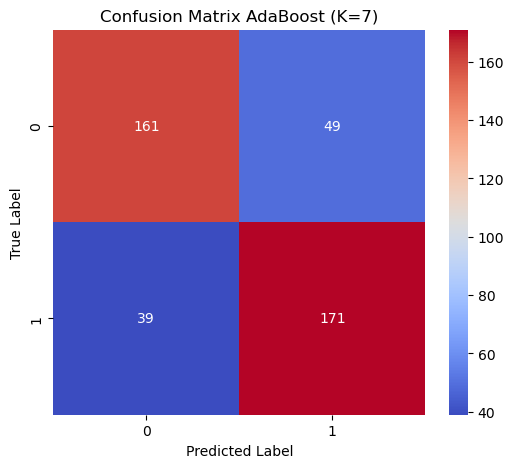

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

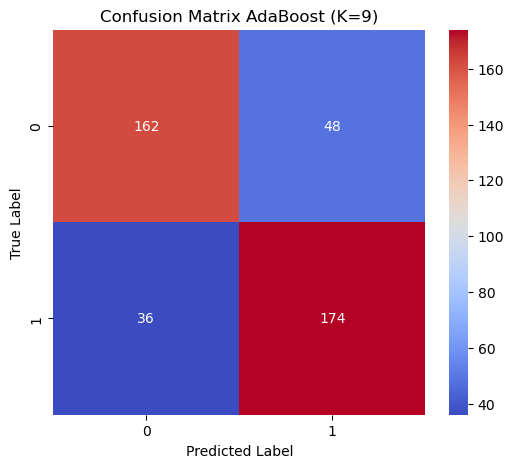


Evaluasi Gradient Boosting dengan K=3


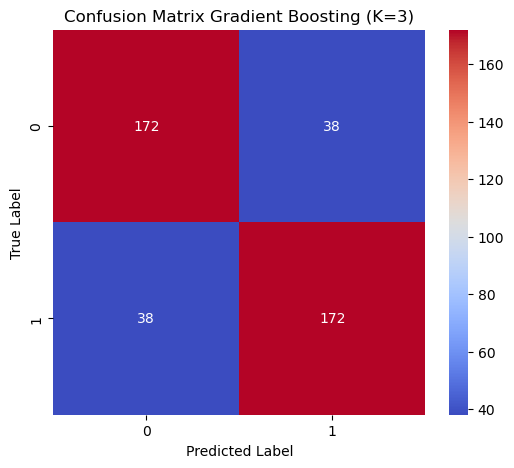


Evaluasi Gradient Boosting dengan K=5


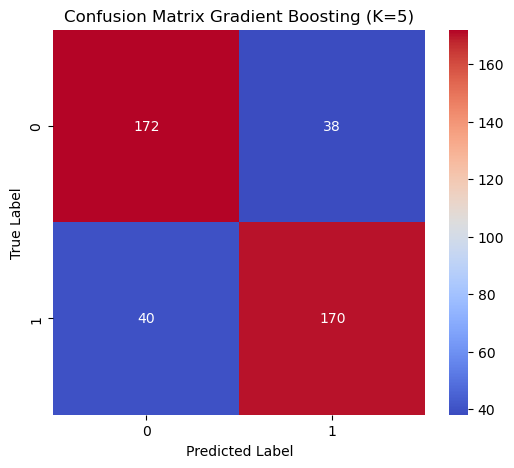


Evaluasi Gradient Boosting dengan K=7


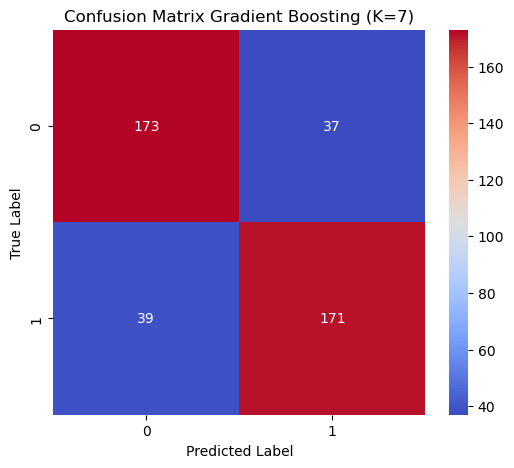


Evaluasi Gradient Boosting dengan K=9


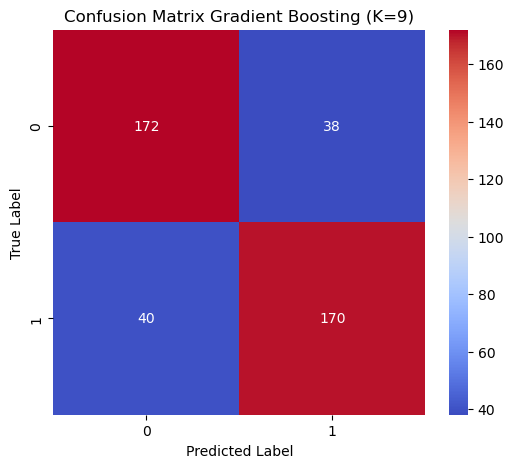


Jumlah data per kelas setelah SMOTE:
1    210
0    210
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.10%    78.14%  78.10%   78.09%
1           AdaBoost  5   78.57%    78.61%  78.57%   78.56%
2           AdaBoost  7   79.05%    79.11%  79.05%   79.04%
3           AdaBoost  9   80.00%    80.10%  80.00%   79.98%
4  Gradient Boosting  3   81.90%    81.90%  81.90%   81.90%
5  Gradient Boosting  5   81.43%    81.43%  81.43%   81.43%
6  Gradient Boosting  7   81.90%    81.91%  81.90%   81.90%
7  Gradient Boosting  9   81.43%    81.43%  81.43%   81.43%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.10%,78.14%,78.10%,78.09%
1,AdaBoost,5,78.57%,78.61%,78.57%,78.56%
2,AdaBoost,7,79.05%,79.11%,79.05%,79.04%
3,AdaBoost,9,80.00%,80.10%,80.00%,79.98%
4,Gradient Boosting,3,81.90%,81.90%,81.90%,81.90%
5,Gradient Boosting,5,81.43%,81.43%,81.43%,81.43%
6,Gradient Boosting,7,81.90%,81.91%,81.90%,81.90%
7,Gradient Boosting,9,81.43%,81.43%,81.43%,81.43%


In [65]:
balancing(df_fitur_20_kualitas_no_fnc)

# 20 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


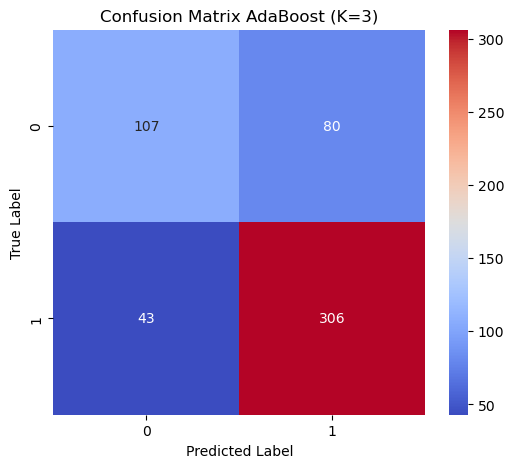


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

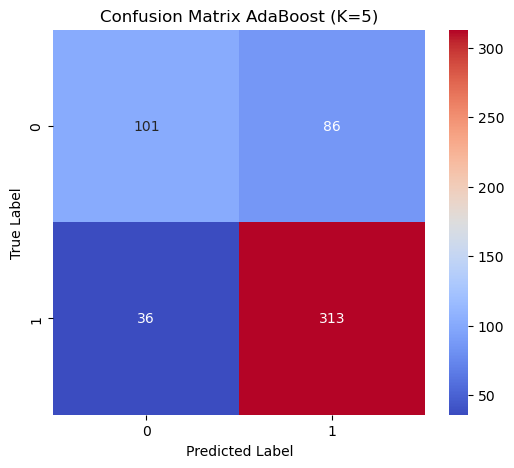


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

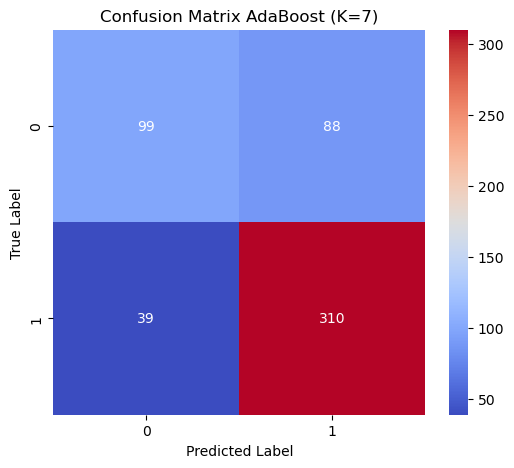


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

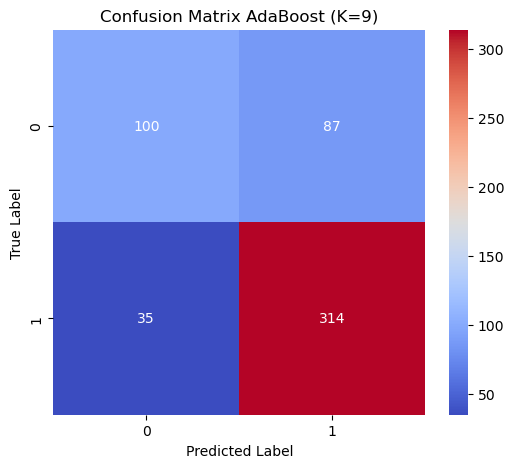


Evaluasi Gradient Boosting dengan K=3


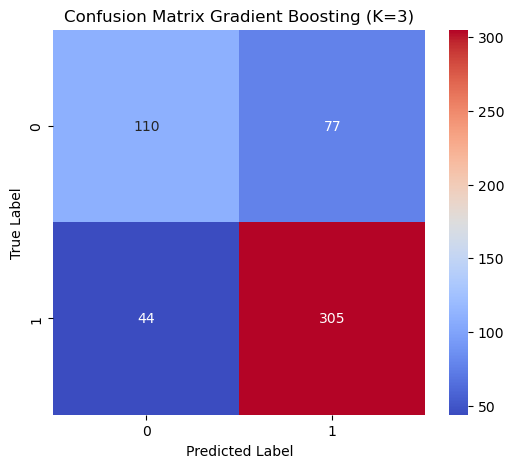


Evaluasi Gradient Boosting dengan K=5


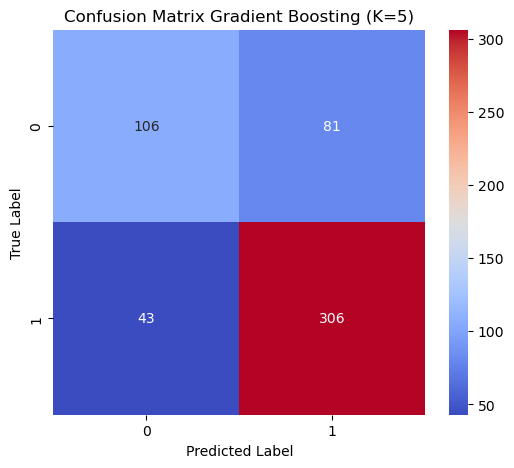


Evaluasi Gradient Boosting dengan K=7


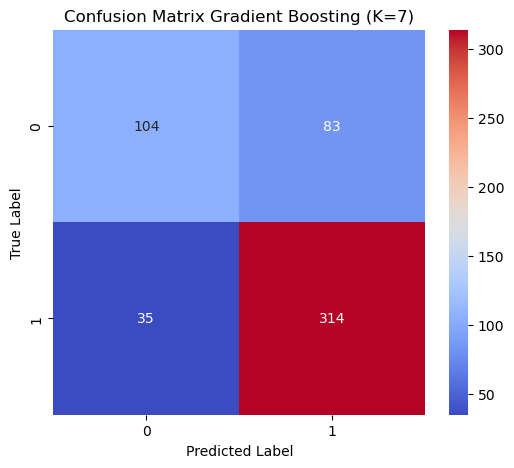


Evaluasi Gradient Boosting dengan K=9


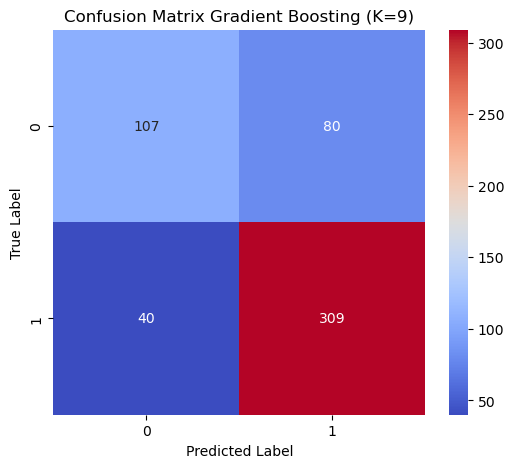


Jumlah data untuk tiap kelas:
0    187
1    349
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.05%    75.30%  72.45%   73.38%
1           AdaBoost  5   77.24%    76.08%  71.85%   73.02%
2           AdaBoost  7   76.31%    74.81%  70.88%   71.96%
3           AdaBoost  9   77.24%    76.19%  71.72%   72.92%
4  Gradient Boosting  3   77.43%    75.64%  73.11%   73.98%
5  Gradient Boosting  5   76.87%    75.11%  72.18%   73.12%
6  Gradient Boosting  7   77.99%    76.96%  72.79%   73.99%
7  Gradient Boosting  9   77.61%    76.11%  72.88%   73.91%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.05%,75.30%,72.45%,73.38%
1,AdaBoost,5,77.24%,76.08%,71.85%,73.02%
2,AdaBoost,7,76.31%,74.81%,70.88%,71.96%
3,AdaBoost,9,77.24%,76.19%,71.72%,72.92%
4,Gradient Boosting,3,77.43%,75.64%,73.11%,73.98%
5,Gradient Boosting,5,76.87%,75.11%,72.18%,73.12%
6,Gradient Boosting,7,77.99%,76.96%,72.79%,73.99%
7,Gradient Boosting,9,77.61%,76.11%,72.88%,73.91%


In [66]:
no_balancing(df_fitur_20_kuantitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


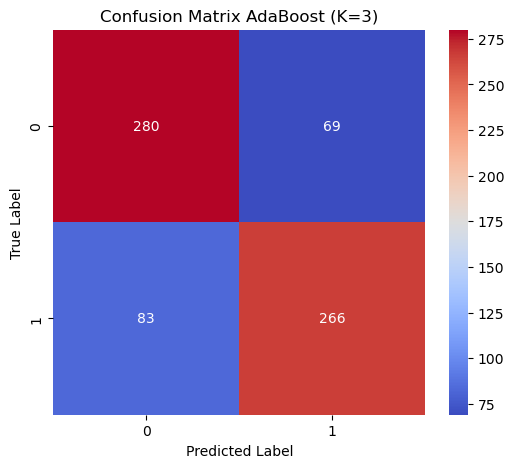


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

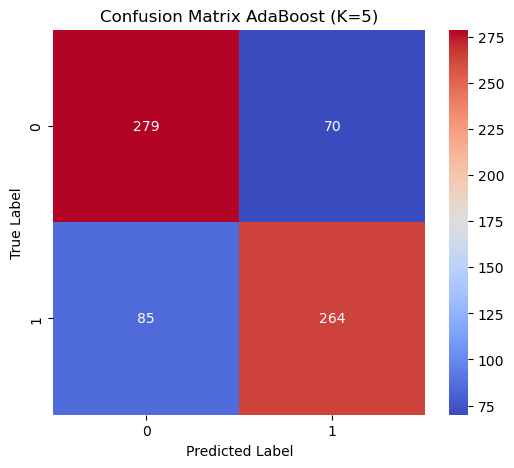

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

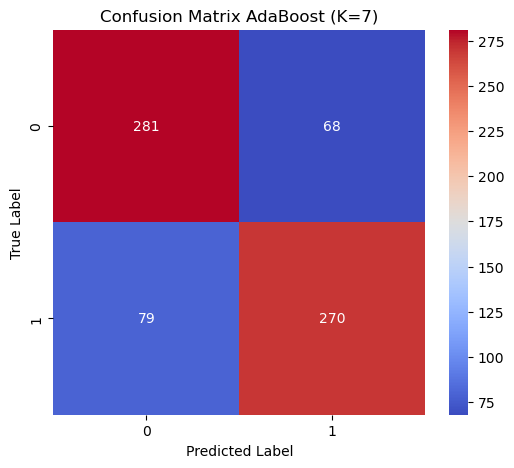


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

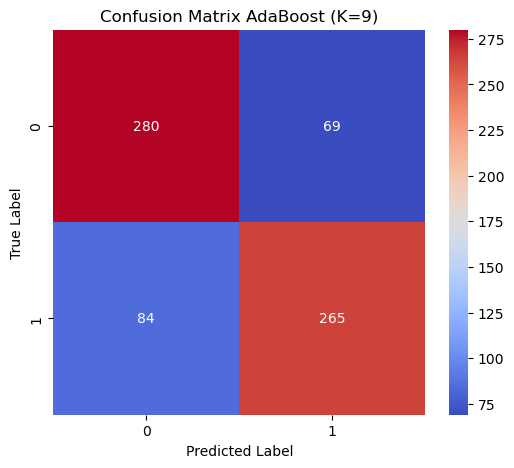


Evaluasi Gradient Boosting dengan K=3


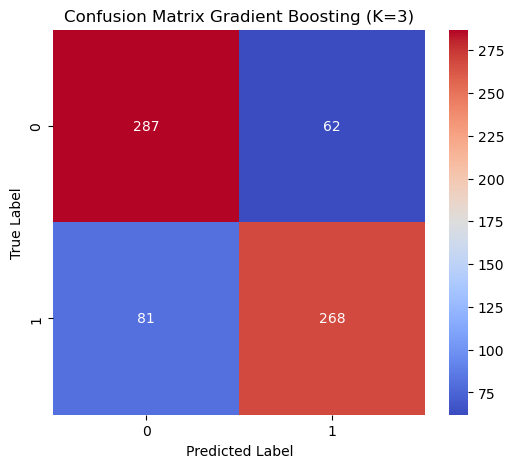


Evaluasi Gradient Boosting dengan K=5


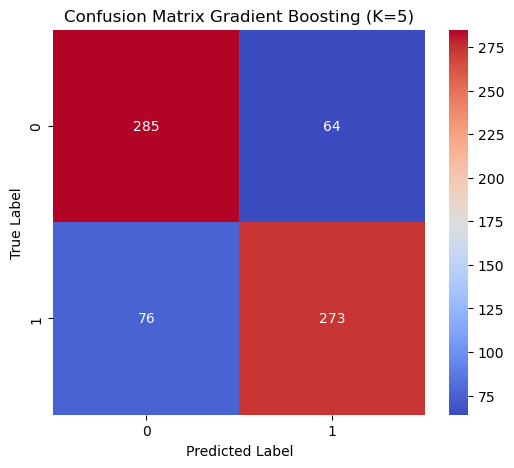


Evaluasi Gradient Boosting dengan K=7


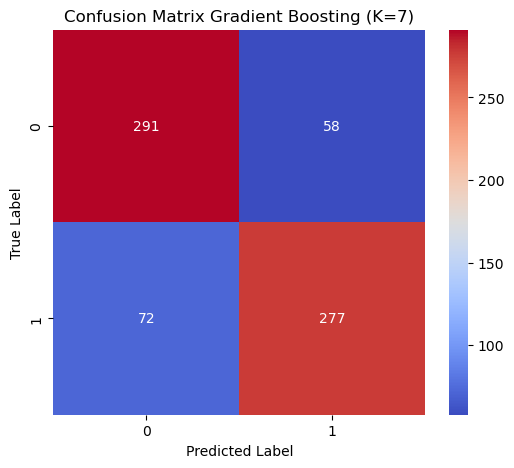


Evaluasi Gradient Boosting dengan K=9


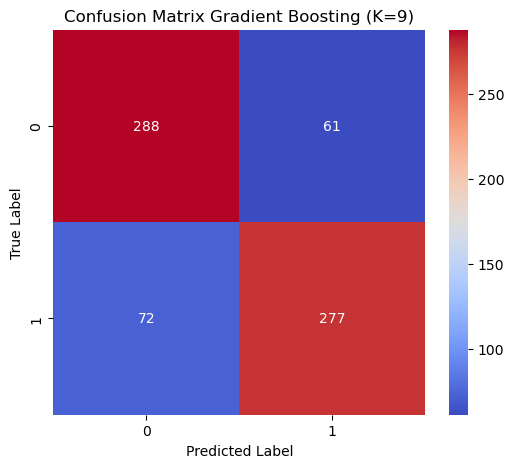


Jumlah data per kelas setelah SMOTE:
1    349
0    349
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.22%    78.27%  78.22%   78.21%
1           AdaBoost  5   77.79%    77.85%  77.79%   77.78%
2           AdaBoost  7   78.94%    78.97%  78.94%   78.93%
3           AdaBoost  9   78.08%    78.13%  78.08%   78.07%
4  Gradient Boosting  3   79.51%    79.60%  79.51%   79.50%
5  Gradient Boosting  5   79.94%    79.98%  79.94%   79.94%
6  Gradient Boosting  7   81.38%    81.43%  81.38%   81.37%
7  Gradient Boosting  9   80.95%    80.98%  80.95%   80.94%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.22%,78.27%,78.22%,78.21%
1,AdaBoost,5,77.79%,77.85%,77.79%,77.78%
2,AdaBoost,7,78.94%,78.97%,78.94%,78.93%
3,AdaBoost,9,78.08%,78.13%,78.08%,78.07%
4,Gradient Boosting,3,79.51%,79.60%,79.51%,79.50%
5,Gradient Boosting,5,79.94%,79.98%,79.94%,79.94%
6,Gradient Boosting,7,81.38%,81.43%,81.38%,81.37%
7,Gradient Boosting,9,80.95%,80.98%,80.95%,80.94%


In [67]:
balancing(df_fitur_20_kuantitas_no_fnc)

# 24 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


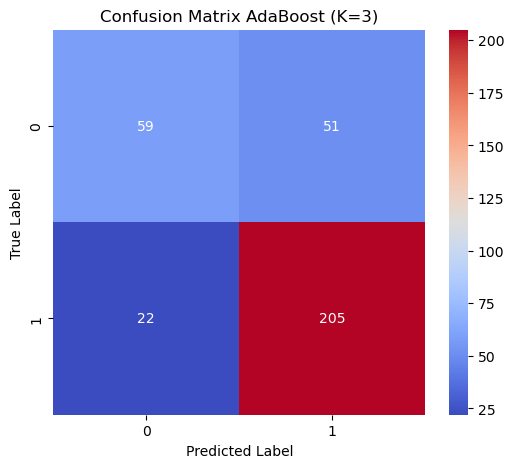


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

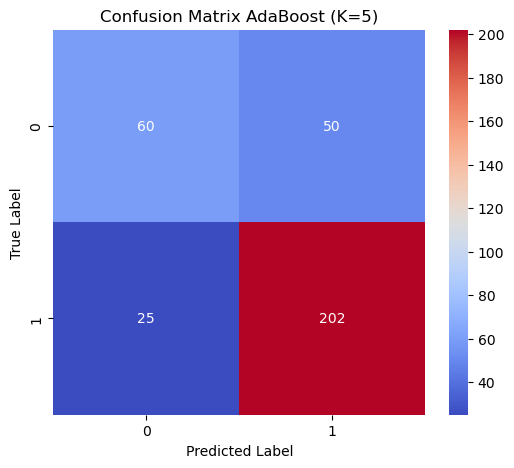

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

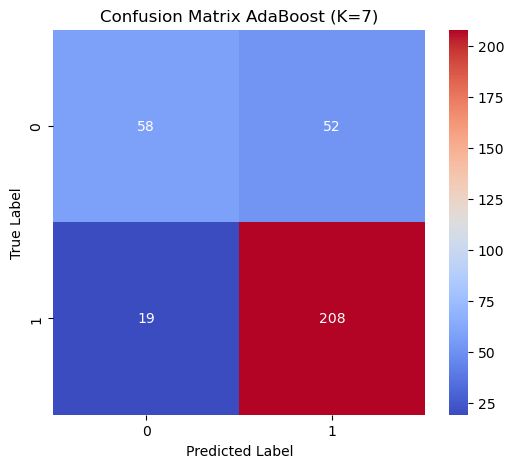

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

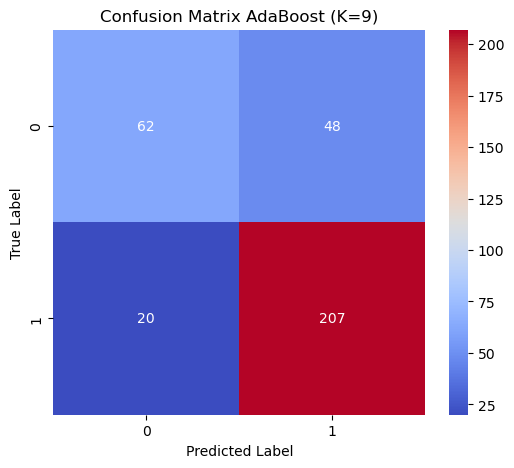


Evaluasi Gradient Boosting dengan K=3


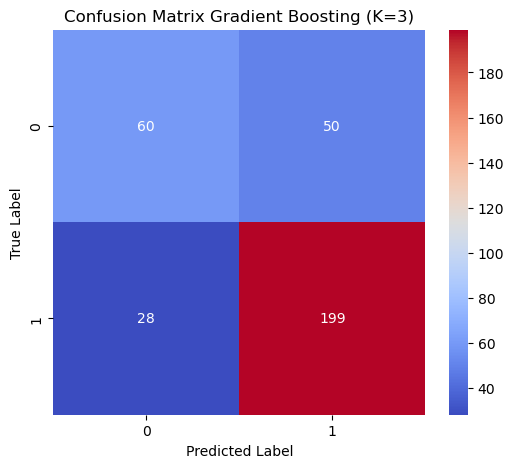


Evaluasi Gradient Boosting dengan K=5


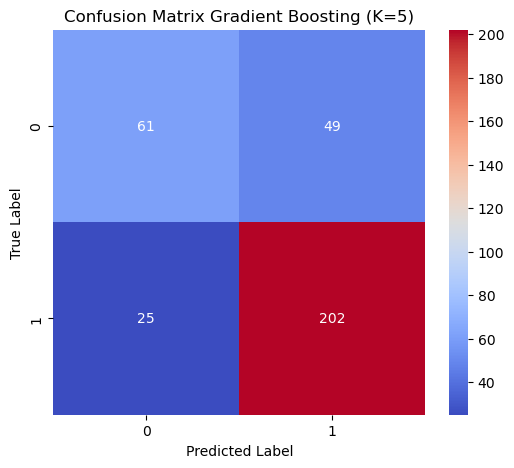


Evaluasi Gradient Boosting dengan K=7


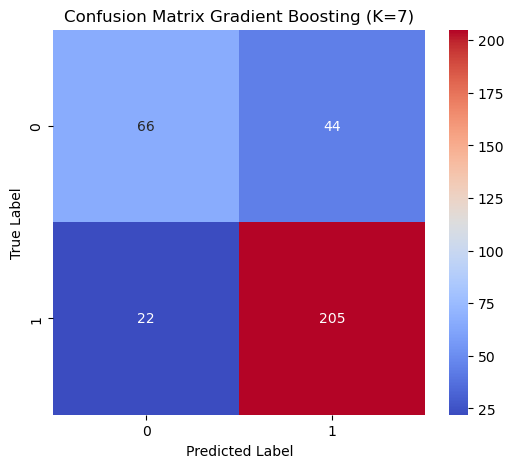


Evaluasi Gradient Boosting dengan K=9


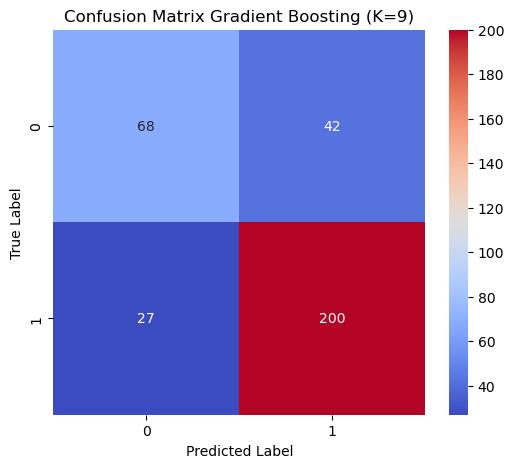


Jumlah data untuk tiap kelas:
0    110
1    227
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.34%    76.46%  71.97%   73.33%
1           AdaBoost  5   77.74%    75.37%  71.77%   72.94%
2           AdaBoost  7   78.93%    77.66%  72.18%   73.73%
3           AdaBoost  9   79.82%    78.39%  73.78%   75.24%
4  Gradient Boosting  3   76.85%    74.05%  71.11%   72.11%
5  Gradient Boosting  5   78.04%    75.70%  72.22%   73.38%
6  Gradient Boosting  7   80.42%    78.66%  75.15%   76.40%
7  Gradient Boosting  9   79.53%    77.11%  74.96%   75.81%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.34%,76.46%,71.97%,73.33%
1,AdaBoost,5,77.74%,75.37%,71.77%,72.94%
2,AdaBoost,7,78.93%,77.66%,72.18%,73.73%
3,AdaBoost,9,79.82%,78.39%,73.78%,75.24%
4,Gradient Boosting,3,76.85%,74.05%,71.11%,72.11%
5,Gradient Boosting,5,78.04%,75.70%,72.22%,73.38%
6,Gradient Boosting,7,80.42%,78.66%,75.15%,76.40%
7,Gradient Boosting,9,79.53%,77.11%,74.96%,75.81%


In [68]:
no_balancing(df_fitur_24_kualitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


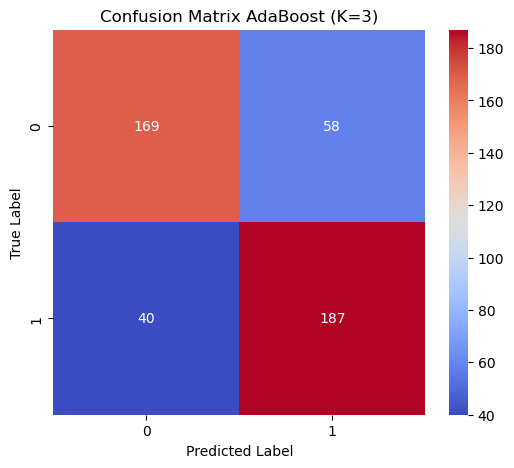


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

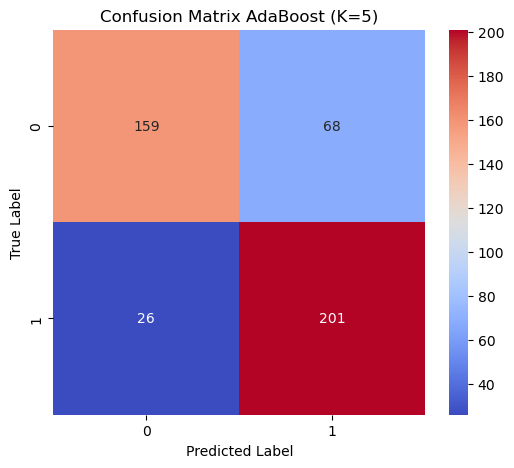

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

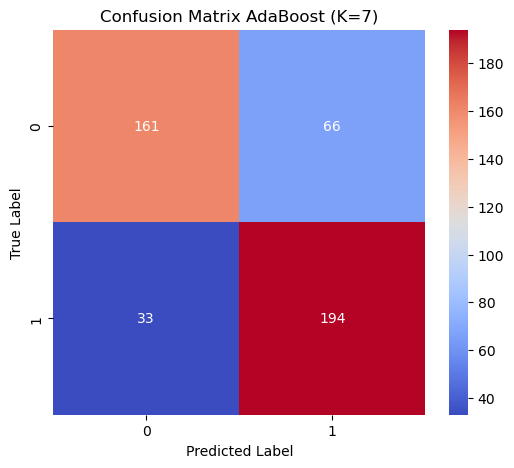


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

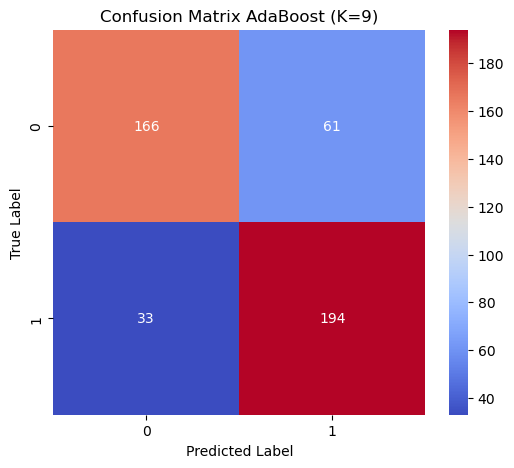


Evaluasi Gradient Boosting dengan K=3


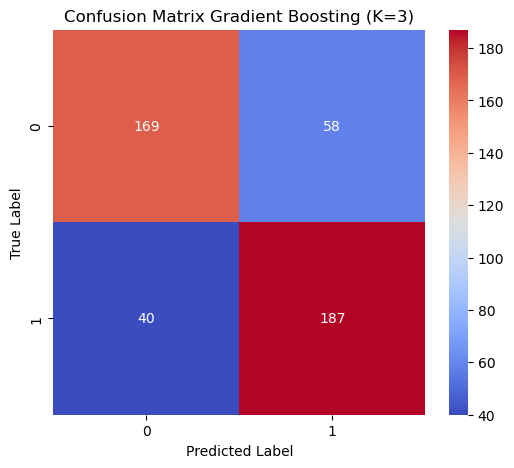


Evaluasi Gradient Boosting dengan K=5


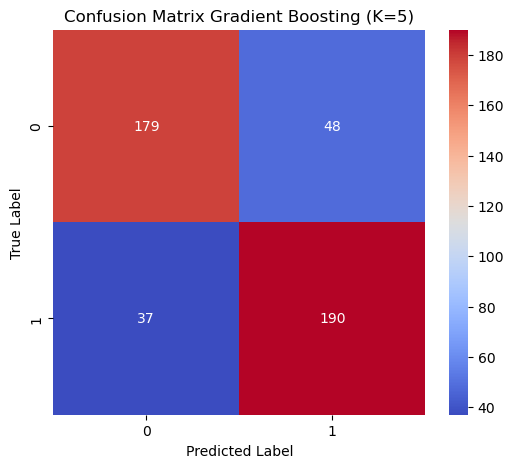


Evaluasi Gradient Boosting dengan K=7


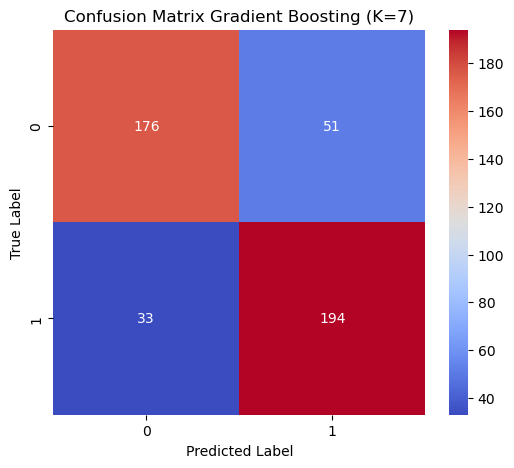


Evaluasi Gradient Boosting dengan K=9


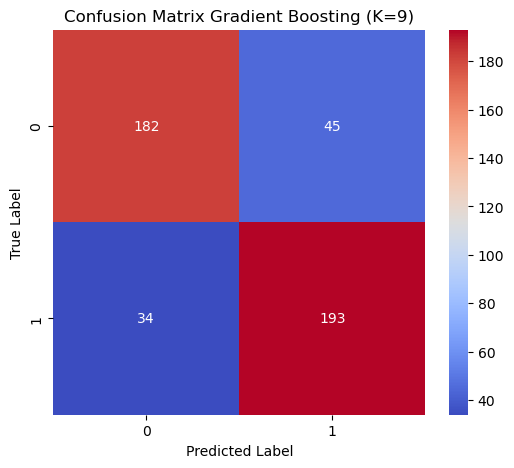


Jumlah data per kelas setelah SMOTE:
1    227
0    227
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.41%    78.59%  78.41%   78.38%
1           AdaBoost  5   79.30%    80.33%  79.30%   79.12%
2           AdaBoost  7   78.19%    78.80%  78.19%   78.08%
3           AdaBoost  9   79.30%    79.75%  79.30%   79.22%
4  Gradient Boosting  3   78.41%    78.59%  78.41%   78.38%
5  Gradient Boosting  5   81.28%    81.35%  81.28%   81.27%
6  Gradient Boosting  7   81.50%    81.70%  81.50%   81.47%
7  Gradient Boosting  9   82.60%    82.68%  82.60%   82.59%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.41%,78.59%,78.41%,78.38%
1,AdaBoost,5,79.30%,80.33%,79.30%,79.12%
2,AdaBoost,7,78.19%,78.80%,78.19%,78.08%
3,AdaBoost,9,79.30%,79.75%,79.30%,79.22%
4,Gradient Boosting,3,78.41%,78.59%,78.41%,78.38%
5,Gradient Boosting,5,81.28%,81.35%,81.28%,81.27%
6,Gradient Boosting,7,81.50%,81.70%,81.50%,81.47%
7,Gradient Boosting,9,82.60%,82.68%,82.60%,82.59%


In [69]:
balancing(df_fitur_24_kualitas_no_fnc)

# 24 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


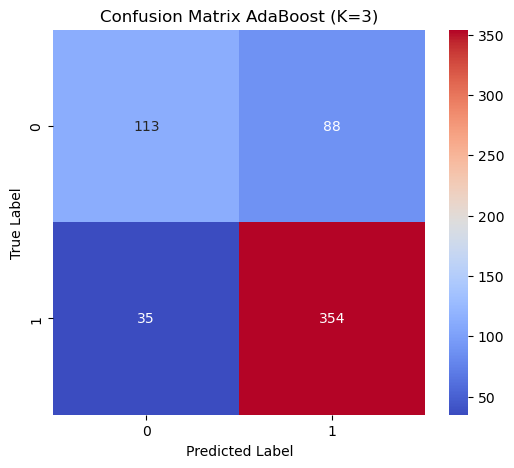


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

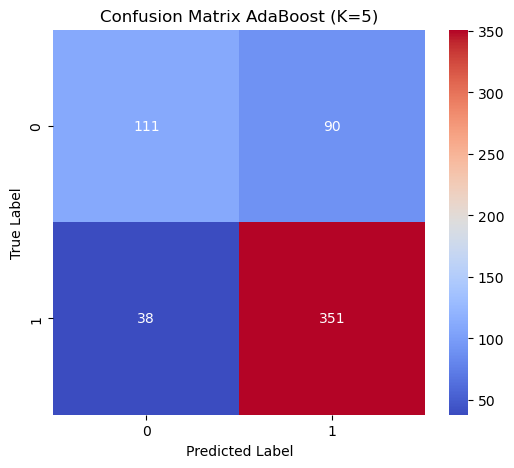

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

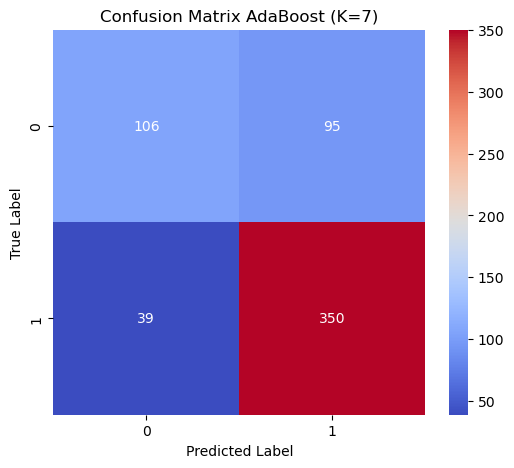

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

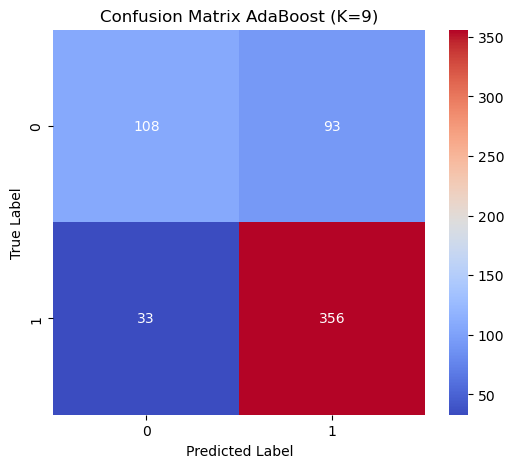


Evaluasi Gradient Boosting dengan K=3


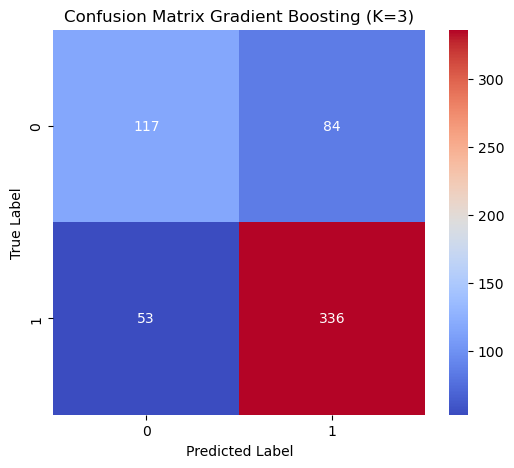


Evaluasi Gradient Boosting dengan K=5


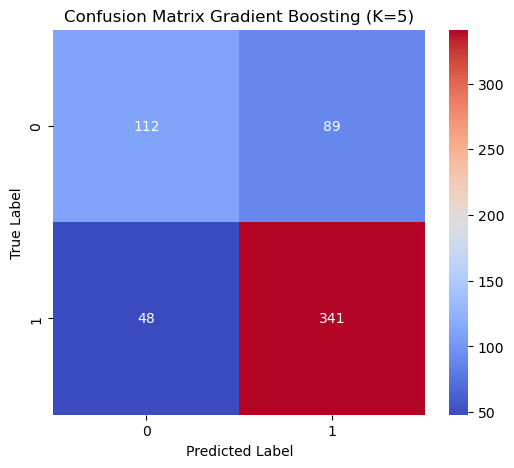


Evaluasi Gradient Boosting dengan K=7


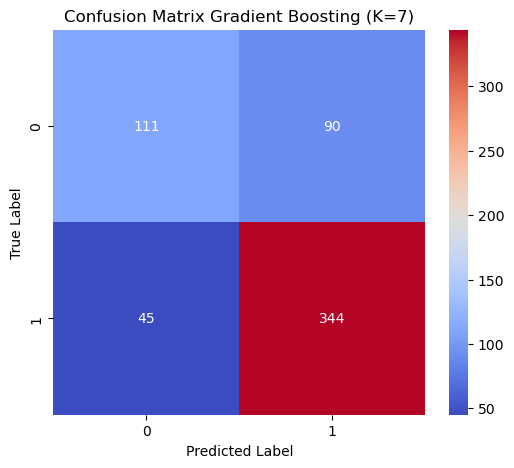


Evaluasi Gradient Boosting dengan K=9


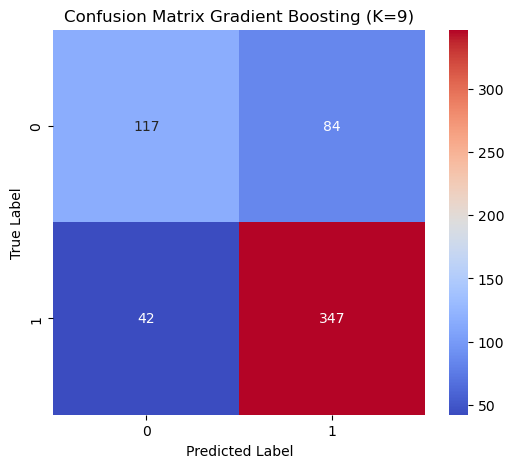


Jumlah data untuk tiap kelas:
0    201
1    389
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.15%    78.22%  73.61%   74.98%
1           AdaBoost  5   78.31%    77.04%  72.73%   74.00%
2           AdaBoost  7   77.29%    75.88%  71.36%   72.60%
3           AdaBoost  9   78.64%    77.94%  72.62%   74.06%
4  Gradient Boosting  3   76.78%    74.41%  72.29%   73.07%
5  Gradient Boosting  5   76.78%    74.65%  71.69%   72.66%
6  Gradient Boosting  7   77.12%    75.21%  71.83%   72.89%
7  Gradient Boosting  9   78.64%    77.05%  73.71%   74.82%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.15%,78.22%,73.61%,74.98%
1,AdaBoost,5,78.31%,77.04%,72.73%,74.00%
2,AdaBoost,7,77.29%,75.88%,71.36%,72.60%
3,AdaBoost,9,78.64%,77.94%,72.62%,74.06%
4,Gradient Boosting,3,76.78%,74.41%,72.29%,73.07%
5,Gradient Boosting,5,76.78%,74.65%,71.69%,72.66%
6,Gradient Boosting,7,77.12%,75.21%,71.83%,72.89%
7,Gradient Boosting,9,78.64%,77.05%,73.71%,74.82%


In [70]:
no_balancing(df_fitur_24_kuantitas_no_fnc)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


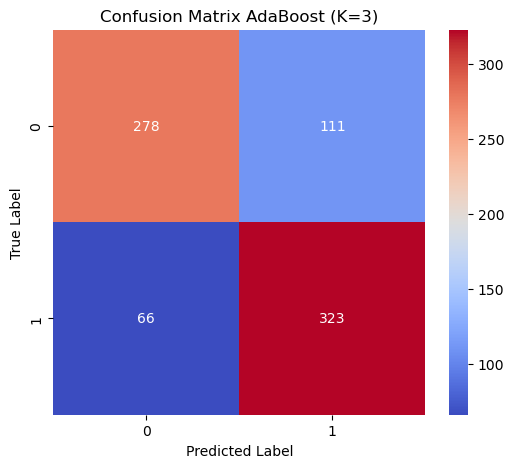


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

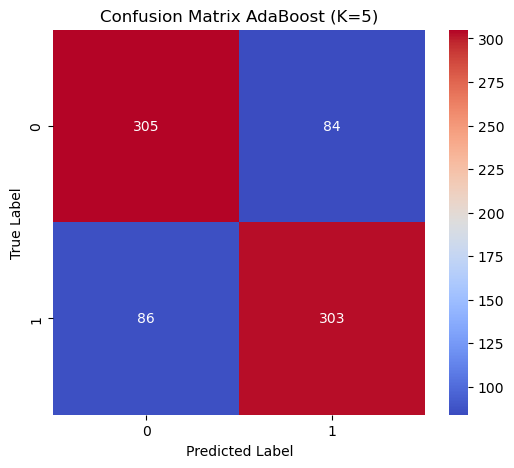

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

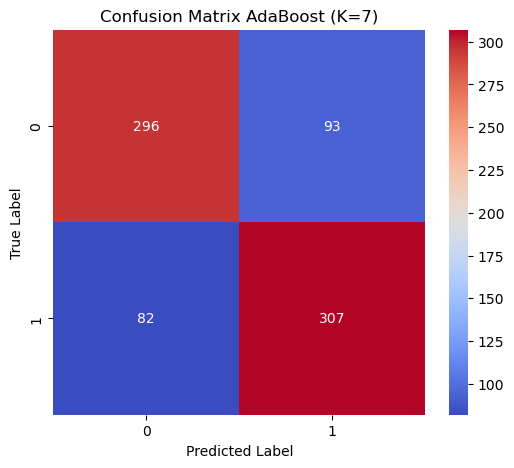


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

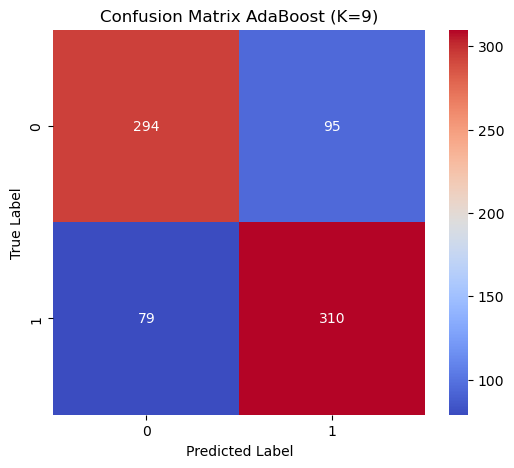


Evaluasi Gradient Boosting dengan K=3


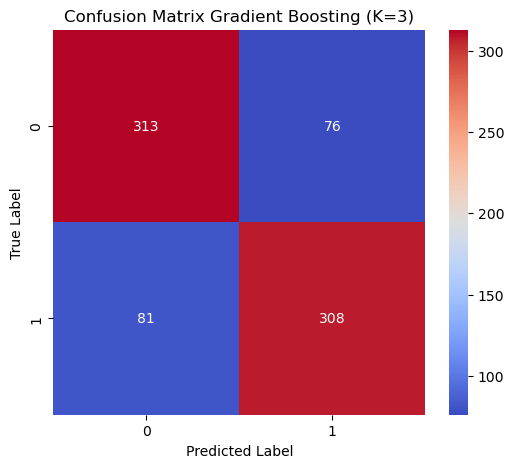


Evaluasi Gradient Boosting dengan K=5


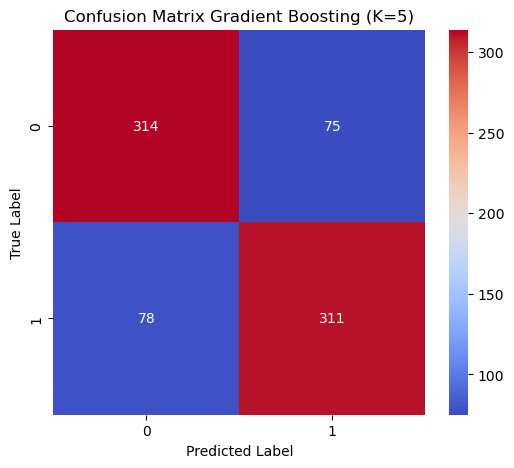


Evaluasi Gradient Boosting dengan K=7


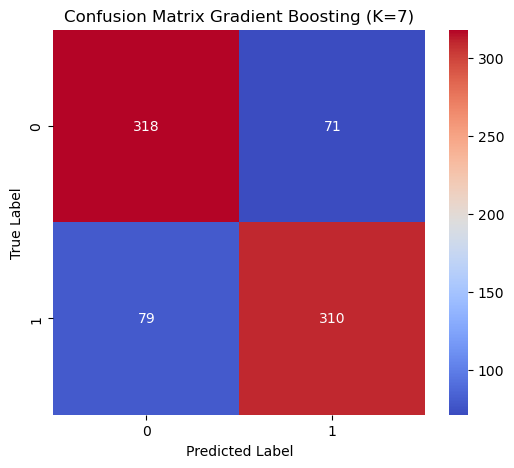


Evaluasi Gradient Boosting dengan K=9


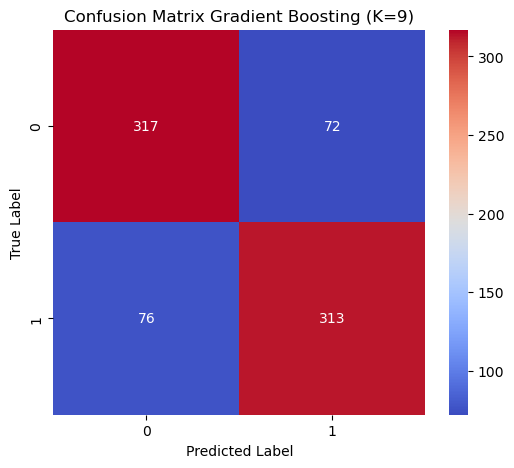


Jumlah data per kelas setelah SMOTE:
1    389
0    389
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.25%    77.62%  77.25%   77.17%
1           AdaBoost  5   78.15%    78.15%  78.15%   78.15%
2           AdaBoost  7   77.51%    77.53%  77.51%   77.50%
3           AdaBoost  9   77.63%    77.68%  77.63%   77.63%
4  Gradient Boosting  3   79.82%    79.82%  79.82%   79.82%
5  Gradient Boosting  5   80.33%    80.34%  80.33%   80.33%
6  Gradient Boosting  7   80.72%    80.73%  80.72%   80.72%
7  Gradient Boosting  9   80.98%    80.98%  80.98%   80.98%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.25%,77.62%,77.25%,77.17%
1,AdaBoost,5,78.15%,78.15%,78.15%,78.15%
2,AdaBoost,7,77.51%,77.53%,77.51%,77.50%
3,AdaBoost,9,77.63%,77.68%,77.63%,77.63%
4,Gradient Boosting,3,79.82%,79.82%,79.82%,79.82%
5,Gradient Boosting,5,80.33%,80.34%,80.33%,80.33%
6,Gradient Boosting,7,80.72%,80.73%,80.72%,80.72%
7,Gradient Boosting,9,80.98%,80.98%,80.98%,80.98%


In [71]:
balancing(df_fitur_24_kuantitas_no_fnc)

# 28 fitur Terbaik kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


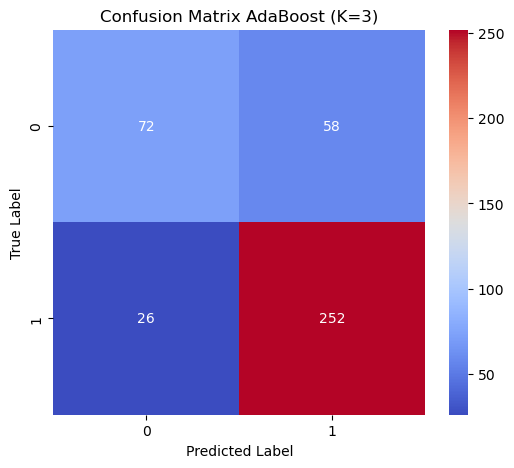


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

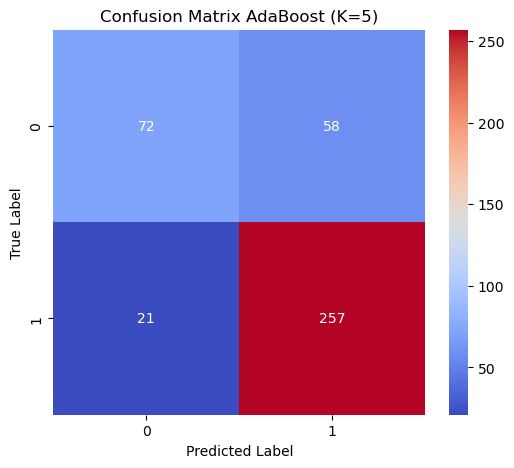

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

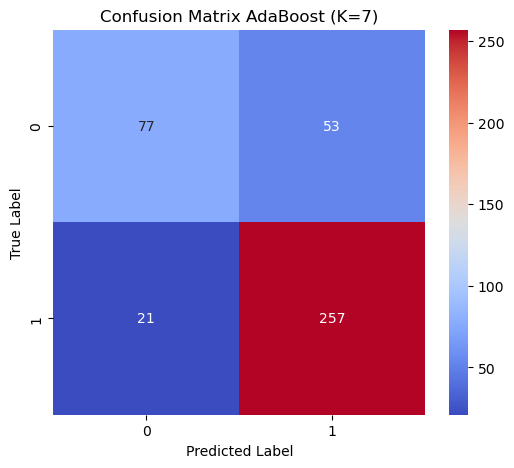


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

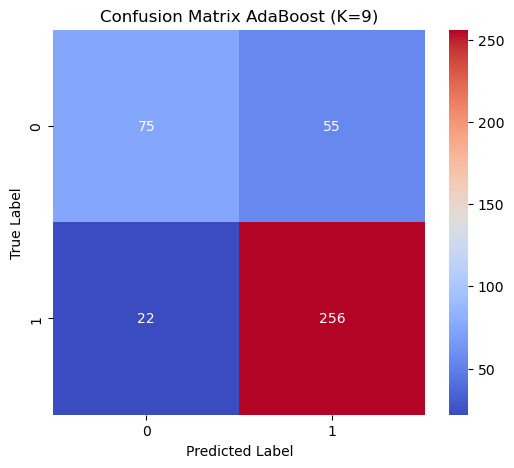


Evaluasi Gradient Boosting dengan K=3


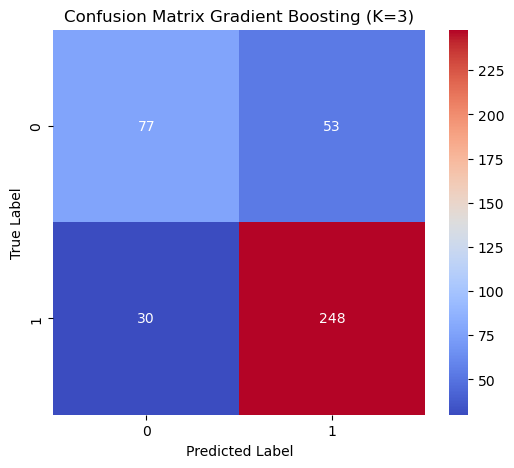


Evaluasi Gradient Boosting dengan K=5


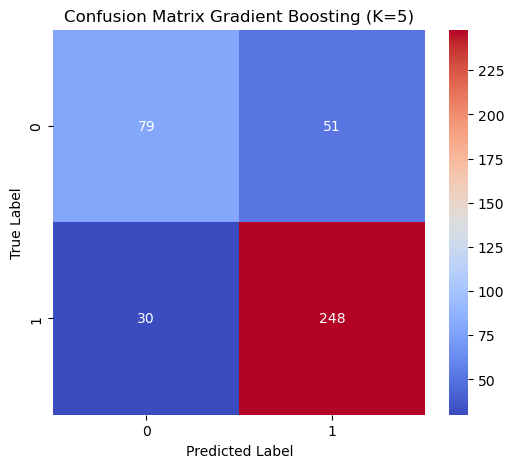


Evaluasi Gradient Boosting dengan K=7


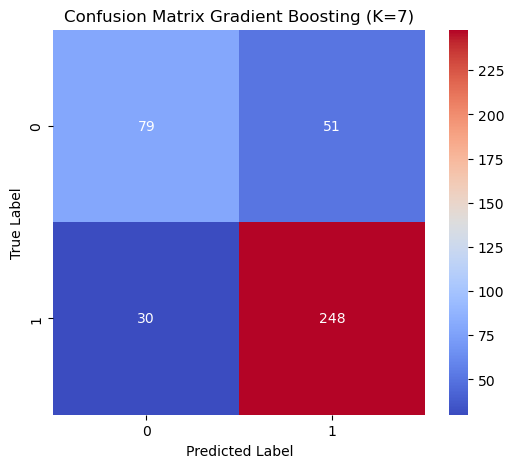


Evaluasi Gradient Boosting dengan K=9


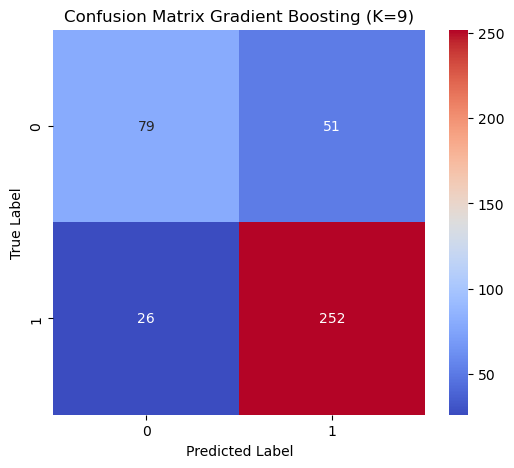


Jumlah data untuk tiap kelas:
0    130
1    278
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.41%    77.38%  73.02%   74.44%
1           AdaBoost  5   80.64%    79.50%  73.92%   75.63%
2           AdaBoost  7   81.86%    80.74%  75.84%   77.48%
3           AdaBoost  9   81.13%    79.82%  74.89%   76.50%
4  Gradient Boosting  3   79.66%    77.18%  74.22%   75.32%
5  Gradient Boosting  5   80.15%    77.71%  74.99%   76.04%
6  Gradient Boosting  7   80.15%    77.71%  74.99%   76.04%
7  Gradient Boosting  9   81.13%    79.20%  75.71%   76.99%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.41%,77.38%,73.02%,74.44%
1,AdaBoost,5,80.64%,79.50%,73.92%,75.63%
2,AdaBoost,7,81.86%,80.74%,75.84%,77.48%
3,AdaBoost,9,81.13%,79.82%,74.89%,76.50%
4,Gradient Boosting,3,79.66%,77.18%,74.22%,75.32%
5,Gradient Boosting,5,80.15%,77.71%,74.99%,76.04%
6,Gradient Boosting,7,80.15%,77.71%,74.99%,76.04%
7,Gradient Boosting,9,81.13%,79.20%,75.71%,76.99%


In [72]:
no_balancing(df_fitur_28_kualitas_no_fnc)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


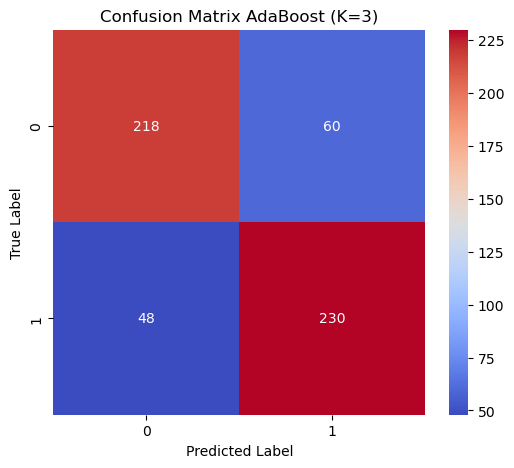


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

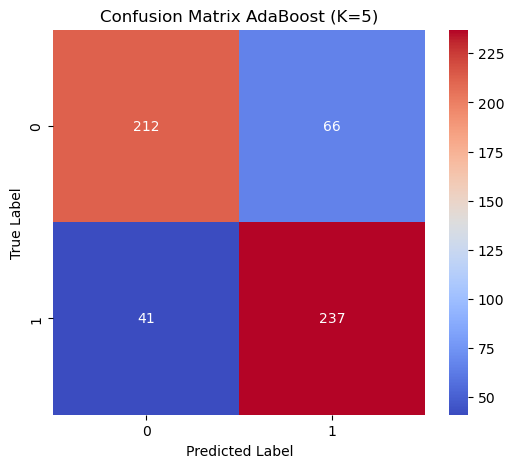

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

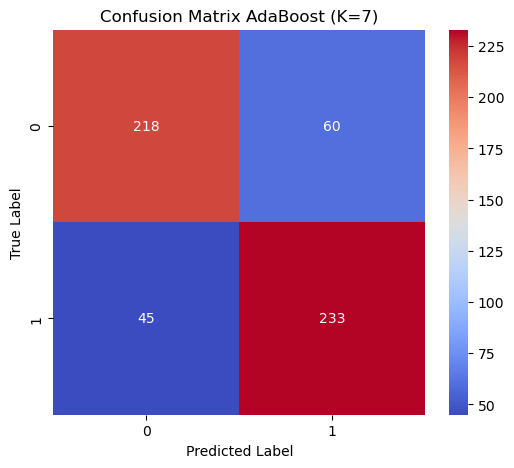

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

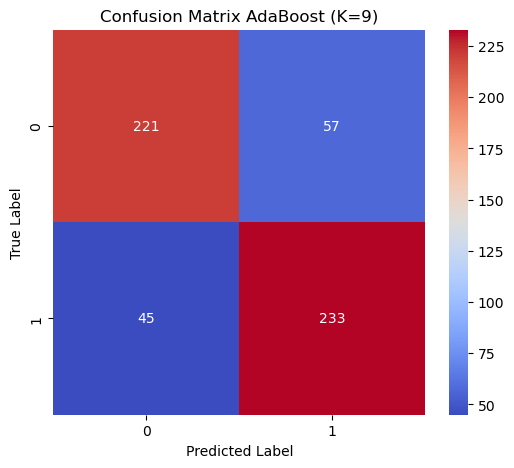


Evaluasi Gradient Boosting dengan K=3


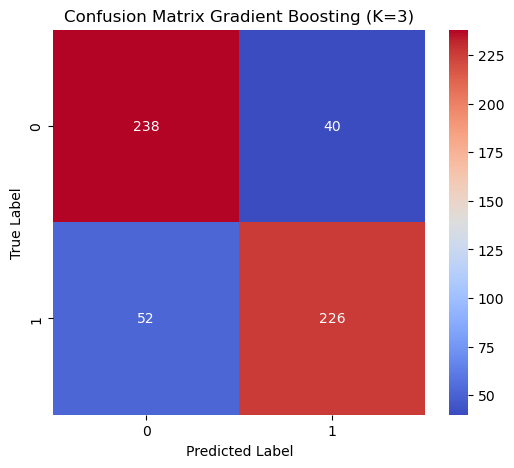


Evaluasi Gradient Boosting dengan K=5


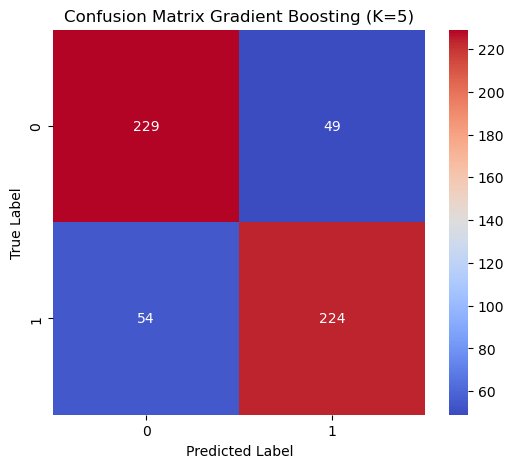


Evaluasi Gradient Boosting dengan K=7


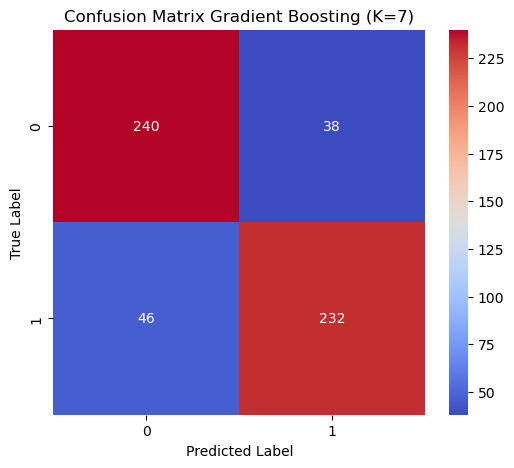


Evaluasi Gradient Boosting dengan K=9


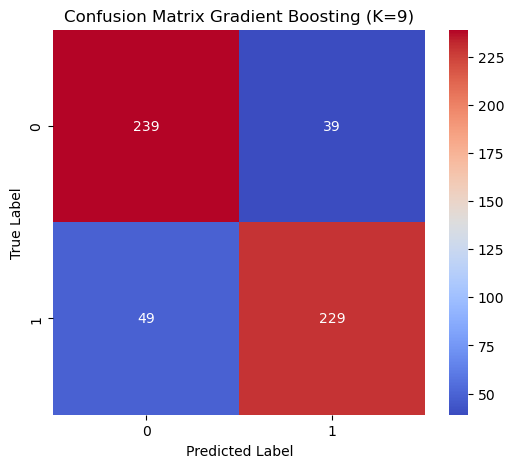


Jumlah data per kelas setelah SMOTE:
1    278
0    278
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   80.58%    80.63%  80.58%   80.57%
1           AdaBoost  5   80.76%    81.01%  80.76%   80.72%
2           AdaBoost  7   81.12%    81.21%  81.12%   81.10%
3           AdaBoost  9   81.65%    81.71%  81.65%   81.65%
4  Gradient Boosting  3   83.45%    83.52%  83.45%   83.45%
5  Gradient Boosting  5   81.47%    81.49%  81.47%   81.47%
6  Gradient Boosting  7   84.89%    84.92%  84.89%   84.89%
7  Gradient Boosting  9   84.17%    84.22%  84.17%   84.17%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,80.58%,80.63%,80.58%,80.57%
1,AdaBoost,5,80.76%,81.01%,80.76%,80.72%
2,AdaBoost,7,81.12%,81.21%,81.12%,81.10%
3,AdaBoost,9,81.65%,81.71%,81.65%,81.65%
4,Gradient Boosting,3,83.45%,83.52%,83.45%,83.45%
5,Gradient Boosting,5,81.47%,81.49%,81.47%,81.47%
6,Gradient Boosting,7,84.89%,84.92%,84.89%,84.89%
7,Gradient Boosting,9,84.17%,84.22%,84.17%,84.17%


In [73]:
balancing(df_fitur_28_kualitas_no_fnc)

# 28 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


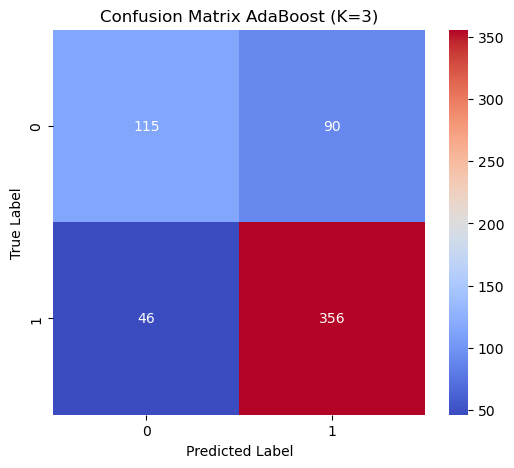


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

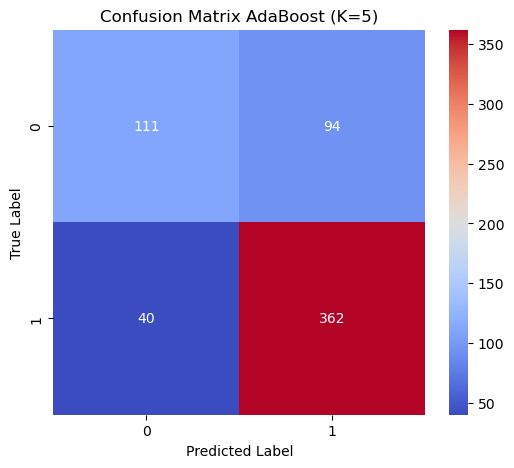

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

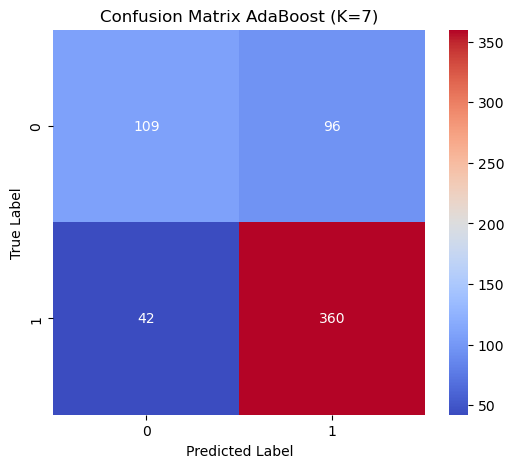


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

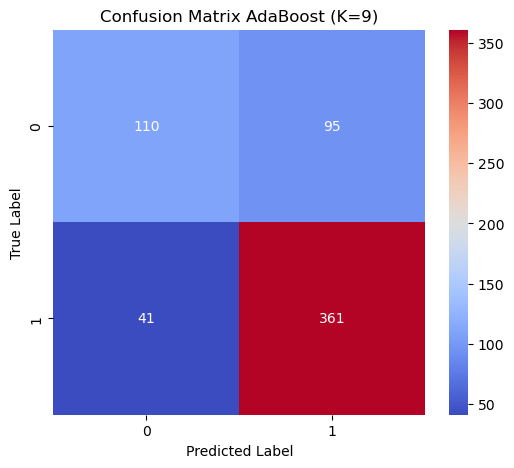


Evaluasi Gradient Boosting dengan K=3


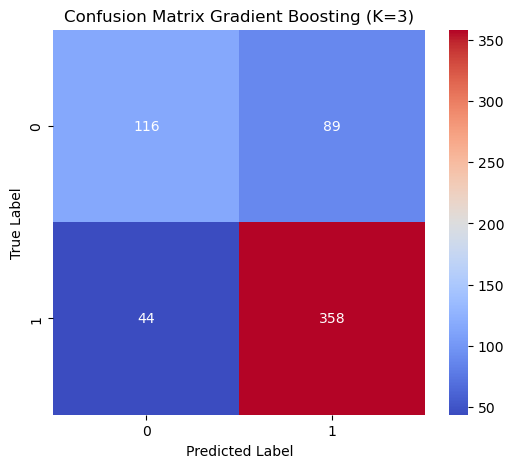


Evaluasi Gradient Boosting dengan K=5


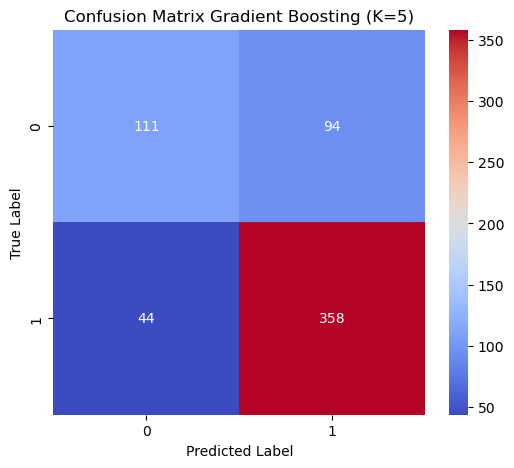


Evaluasi Gradient Boosting dengan K=7


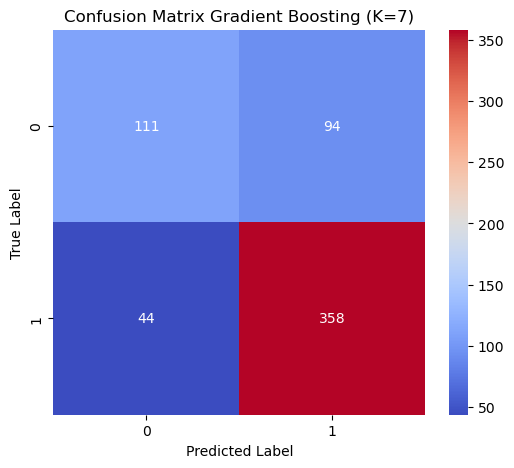


Evaluasi Gradient Boosting dengan K=9


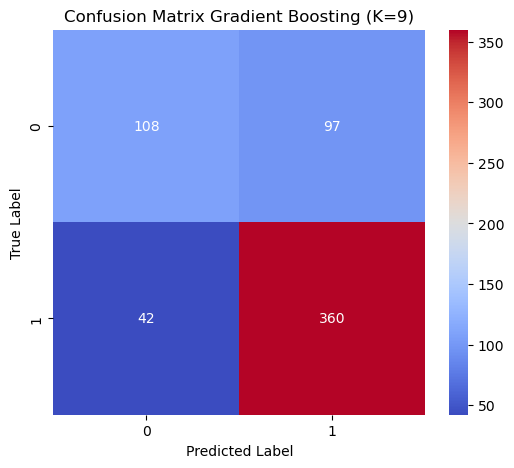


Jumlah data untuk tiap kelas:
0    205
1    402
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.59%    75.62%  72.33%   73.40%
1           AdaBoost  5   77.92%    76.45%  72.10%   73.37%
2           AdaBoost  7   77.27%    75.57%  71.36%   72.58%
3           AdaBoost  9   77.59%    76.01%  71.73%   72.97%
4  Gradient Boosting  3   78.09%    76.29%  72.82%   73.95%
5  Gradient Boosting  5   77.27%    75.41%  71.60%   72.75%
6  Gradient Boosting  7   77.27%    75.41%  71.60%   72.75%
7  Gradient Boosting  9   77.10%    75.39%  71.12%   72.33%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.59%,75.62%,72.33%,73.40%
1,AdaBoost,5,77.92%,76.45%,72.10%,73.37%
2,AdaBoost,7,77.27%,75.57%,71.36%,72.58%
3,AdaBoost,9,77.59%,76.01%,71.73%,72.97%
4,Gradient Boosting,3,78.09%,76.29%,72.82%,73.95%
5,Gradient Boosting,5,77.27%,75.41%,71.60%,72.75%
6,Gradient Boosting,7,77.27%,75.41%,71.60%,72.75%
7,Gradient Boosting,9,77.10%,75.39%,71.12%,72.33%


In [74]:
no_balancing(df_fitur_28_kuantitas_no_fnc)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


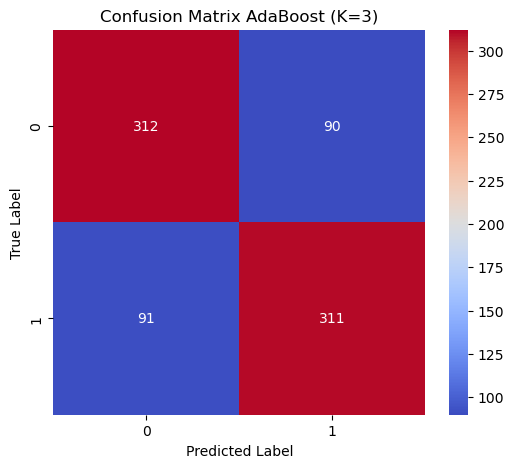


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

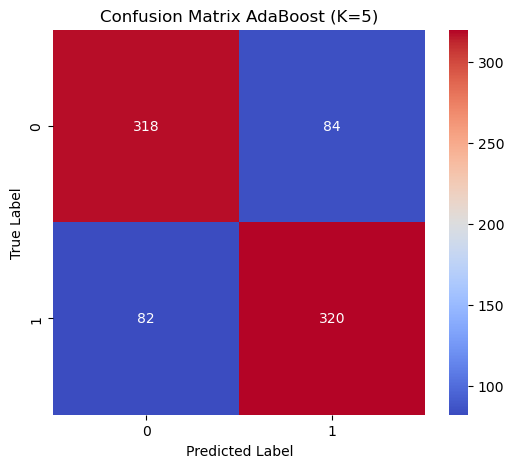

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

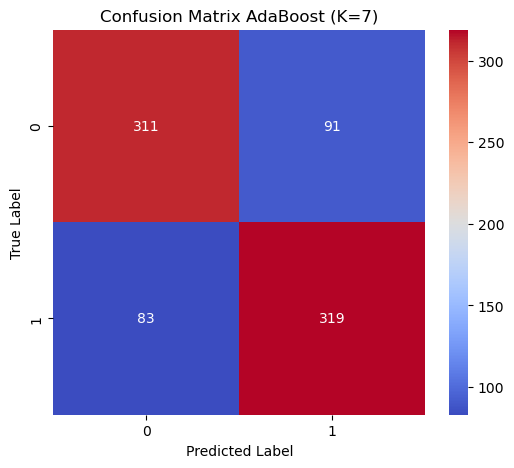


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

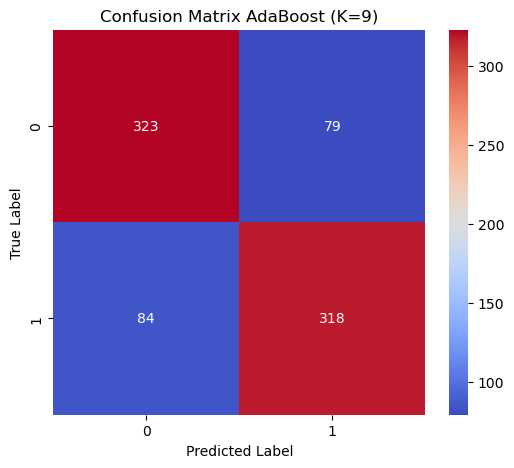


Evaluasi Gradient Boosting dengan K=3


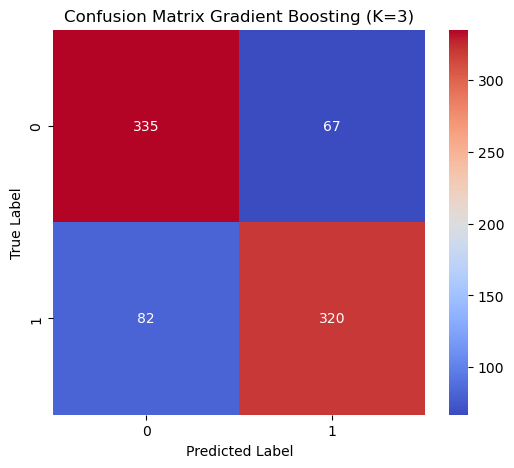


Evaluasi Gradient Boosting dengan K=5


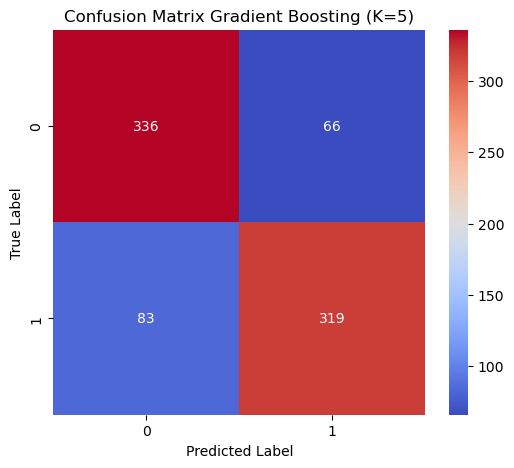


Evaluasi Gradient Boosting dengan K=7


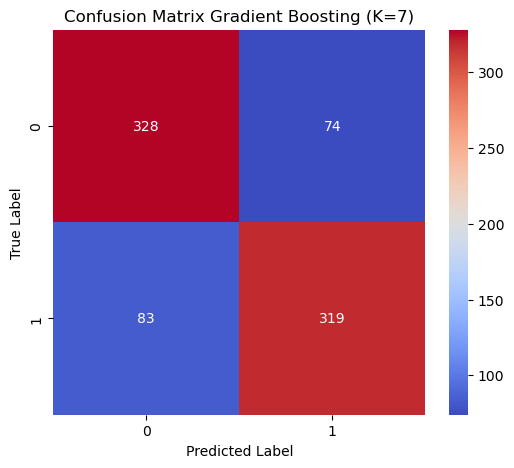


Evaluasi Gradient Boosting dengan K=9


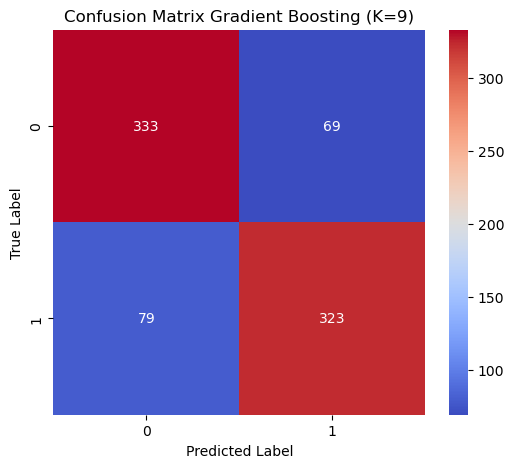


Jumlah data per kelas setelah SMOTE:
1    402
0    402
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.49%    77.49%  77.49%   77.49%
1           AdaBoost  5   79.35%    79.35%  79.35%   79.35%
2           AdaBoost  7   78.36%    78.37%  78.36%   78.36%
3           AdaBoost  9   79.73%    79.73%  79.73%   79.73%
4  Gradient Boosting  3   81.47%    81.51%  81.47%   81.46%
5  Gradient Boosting  5   81.47%    81.52%  81.47%   81.46%
6  Gradient Boosting  7   80.47%    80.49%  80.47%   80.47%
7  Gradient Boosting  9   81.59%    81.61%  81.59%   81.59%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.49%,77.49%,77.49%,77.49%
1,AdaBoost,5,79.35%,79.35%,79.35%,79.35%
2,AdaBoost,7,78.36%,78.37%,78.36%,78.36%
3,AdaBoost,9,79.73%,79.73%,79.73%,79.73%
4,Gradient Boosting,3,81.47%,81.51%,81.47%,81.46%
5,Gradient Boosting,5,81.47%,81.52%,81.47%,81.46%
6,Gradient Boosting,7,80.47%,80.49%,80.47%,80.47%
7,Gradient Boosting,9,81.59%,81.61%,81.59%,81.59%


In [75]:
balancing(df_fitur_28_kuantitas_no_fnc)

# Modeling With Flavour and Character

# 4 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


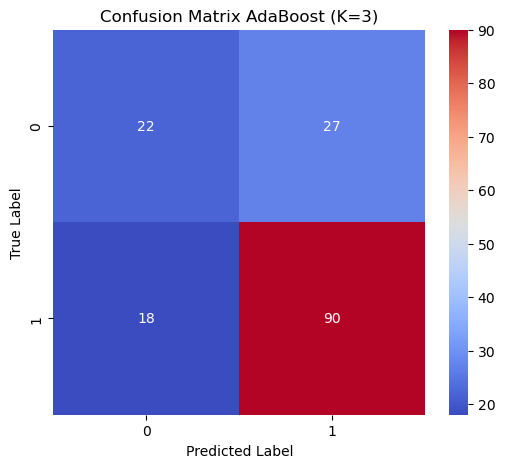


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

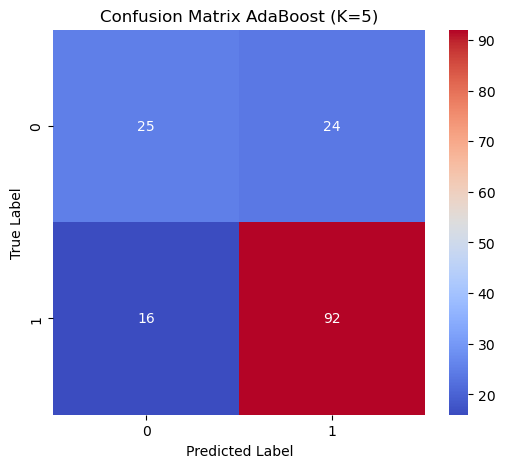


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

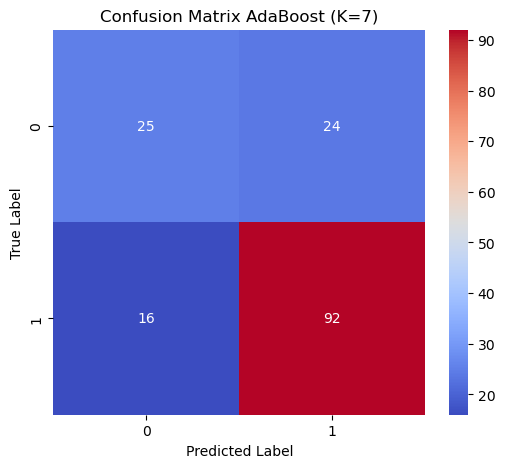


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

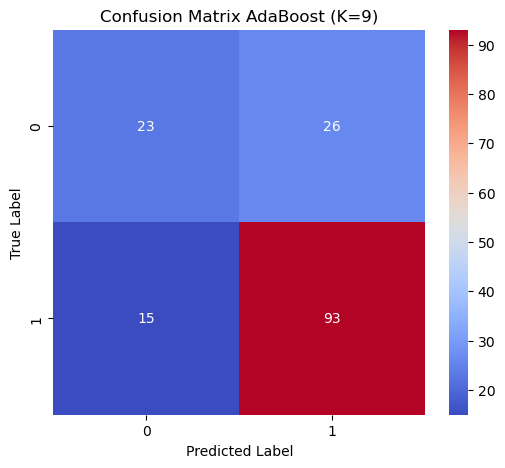


Evaluasi Gradient Boosting dengan K=3


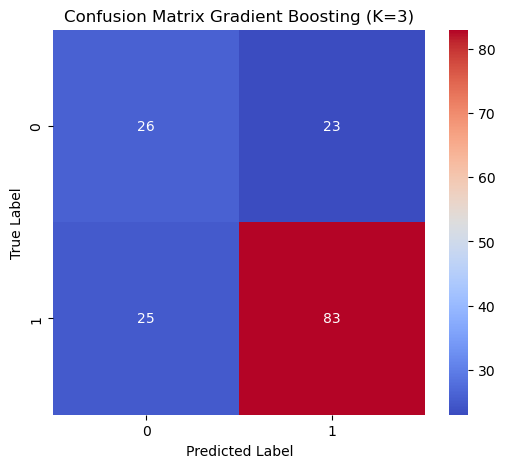


Evaluasi Gradient Boosting dengan K=5


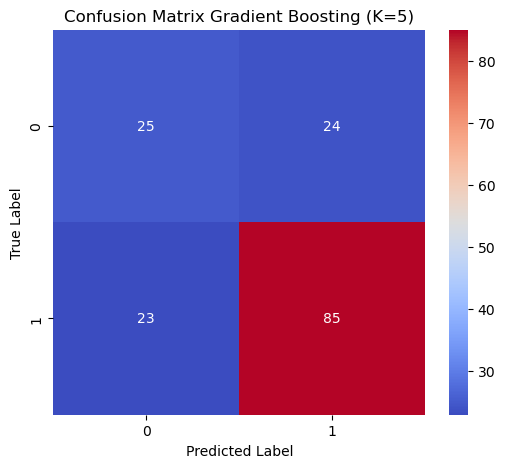


Evaluasi Gradient Boosting dengan K=7


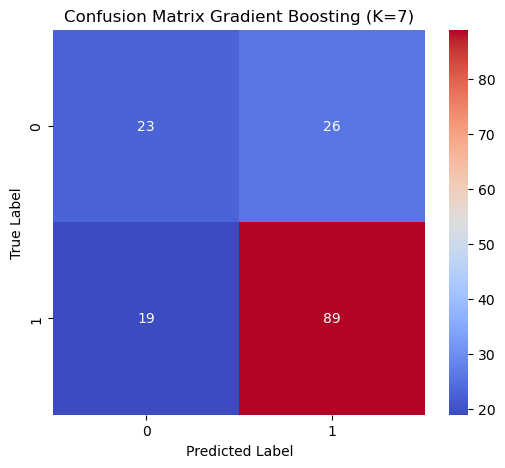


Evaluasi Gradient Boosting dengan K=9


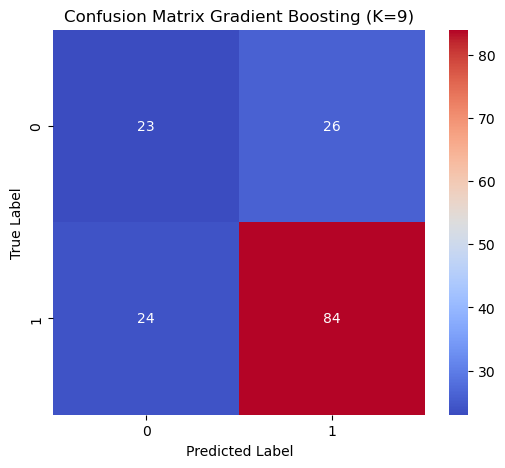


Jumlah data untuk tiap kelas:
0     49
1    108
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   71.34%    65.96%  64.12%   64.72%
1           AdaBoost  5   74.52%    70.14%  68.10%   68.85%
2           AdaBoost  7   74.52%    70.14%  68.10%   68.85%
3           AdaBoost  9   73.89%    69.34%  66.52%   67.41%
4  Gradient Boosting  3   69.43%    64.64%  64.96%   64.79%
5  Gradient Boosting  5   70.06%    65.03%  64.86%   64.94%
6  Gradient Boosting  7   71.34%    66.08%  64.67%   65.19%
7  Gradient Boosting  9   68.15%    62.65%  62.36%   62.49%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,71.34%,65.96%,64.12%,64.72%
1,AdaBoost,5,74.52%,70.14%,68.10%,68.85%
2,AdaBoost,7,74.52%,70.14%,68.10%,68.85%
3,AdaBoost,9,73.89%,69.34%,66.52%,67.41%
4,Gradient Boosting,3,69.43%,64.64%,64.96%,64.79%
5,Gradient Boosting,5,70.06%,65.03%,64.86%,64.94%
6,Gradient Boosting,7,71.34%,66.08%,64.67%,65.19%
7,Gradient Boosting,9,68.15%,62.65%,62.36%,62.49%


In [76]:
no_balancing(df_kualitas_fitur_4)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


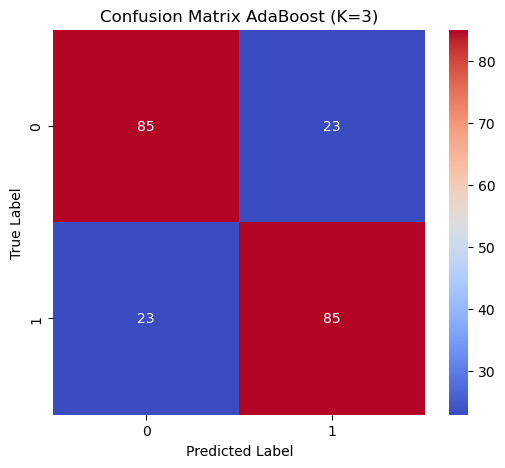


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

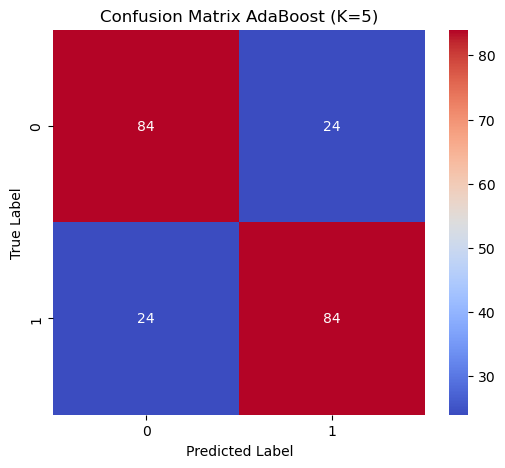


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

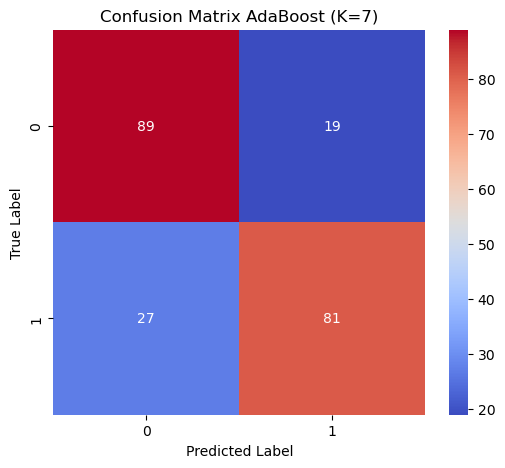


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

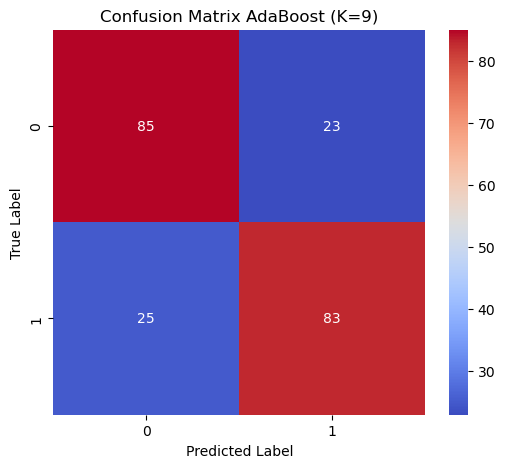


Evaluasi Gradient Boosting dengan K=3


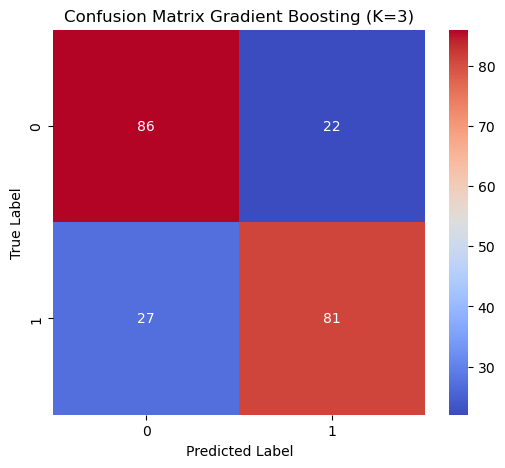


Evaluasi Gradient Boosting dengan K=5


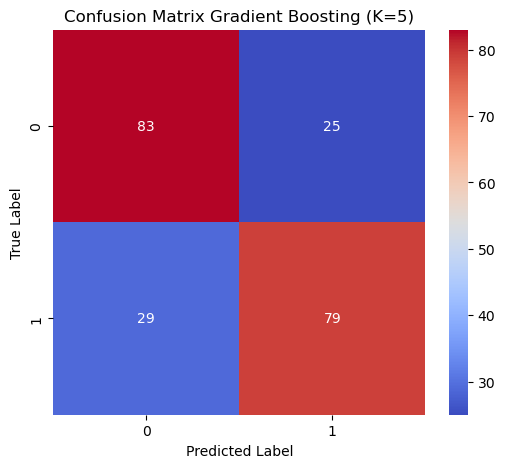


Evaluasi Gradient Boosting dengan K=7


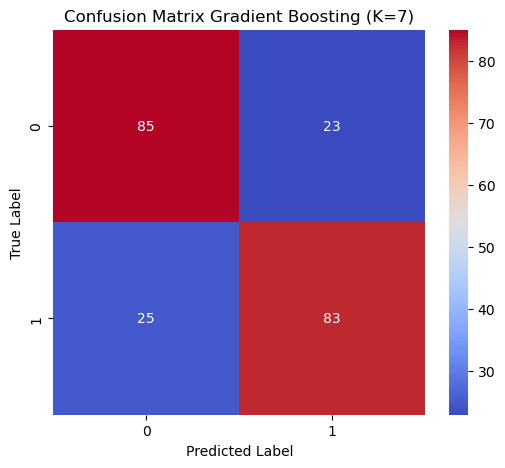


Evaluasi Gradient Boosting dengan K=9


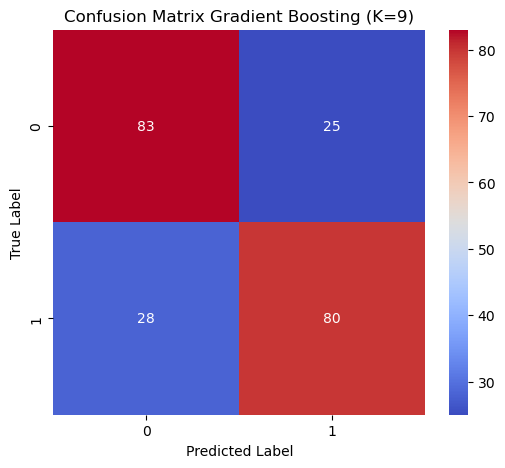


Jumlah data per kelas setelah SMOTE:
1    108
0    108
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.70%    78.70%  78.70%   78.70%
1           AdaBoost  5   77.78%    77.78%  77.78%   77.78%
2           AdaBoost  7   78.70%    78.86%  78.70%   78.67%
3           AdaBoost  9   77.78%    77.79%  77.78%   77.78%
4  Gradient Boosting  3   77.31%    77.37%  77.31%   77.30%
5  Gradient Boosting  5   75.00%    75.03%  75.00%   74.99%
6  Gradient Boosting  7   77.78%    77.79%  77.78%   77.78%
7  Gradient Boosting  9   75.46%    75.48%  75.46%   75.46%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.70%,78.70%,78.70%,78.70%
1,AdaBoost,5,77.78%,77.78%,77.78%,77.78%
2,AdaBoost,7,78.70%,78.86%,78.70%,78.67%
3,AdaBoost,9,77.78%,77.79%,77.78%,77.78%
4,Gradient Boosting,3,77.31%,77.37%,77.31%,77.30%
5,Gradient Boosting,5,75.00%,75.03%,75.00%,74.99%
6,Gradient Boosting,7,77.78%,77.79%,77.78%,77.78%
7,Gradient Boosting,9,75.46%,75.48%,75.46%,75.46%


In [77]:
balancing(df_kualitas_fitur_4)

# 4 fitur Terbaik Kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


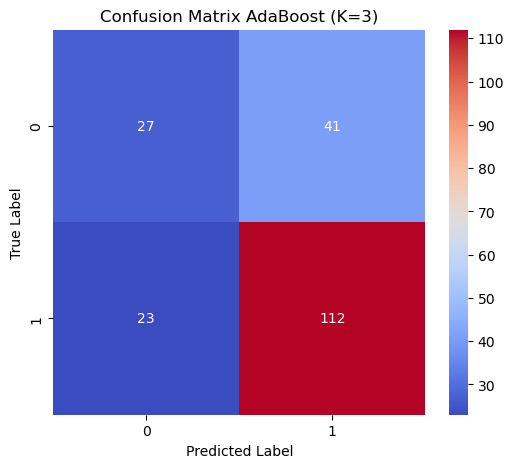


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

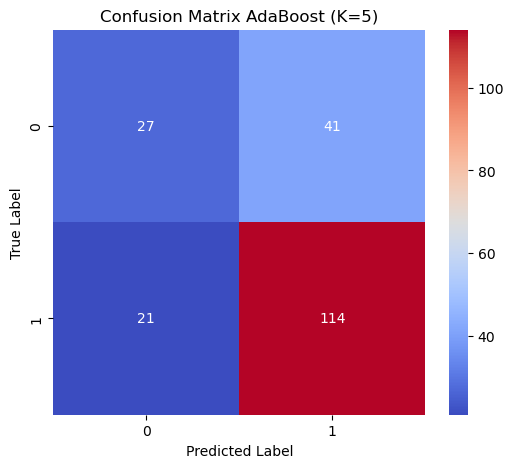

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

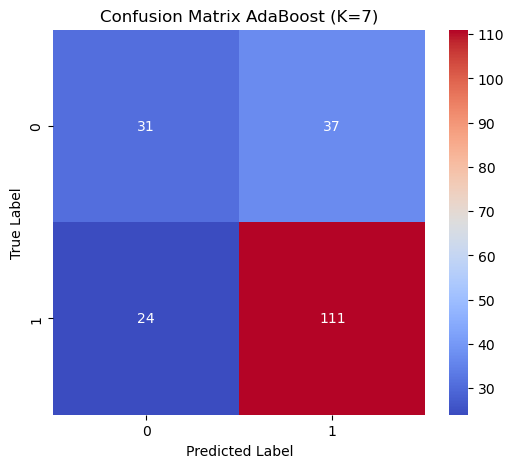


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

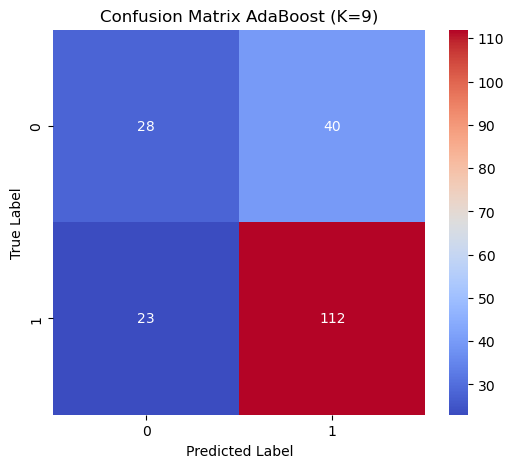


Evaluasi Gradient Boosting dengan K=3


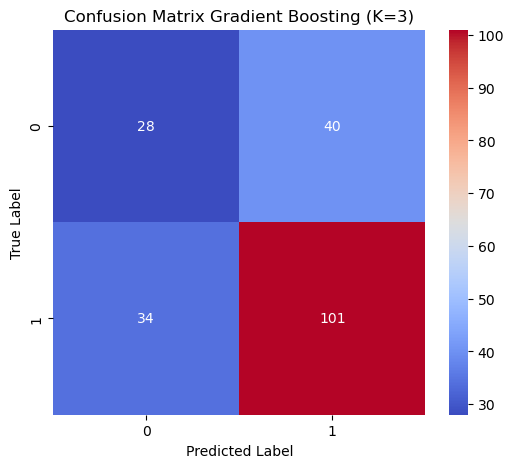


Evaluasi Gradient Boosting dengan K=5


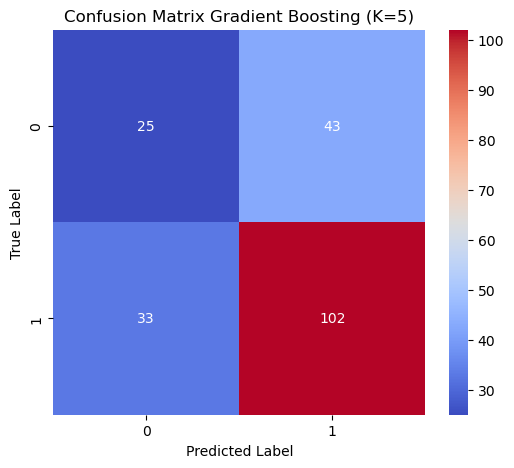


Evaluasi Gradient Boosting dengan K=7


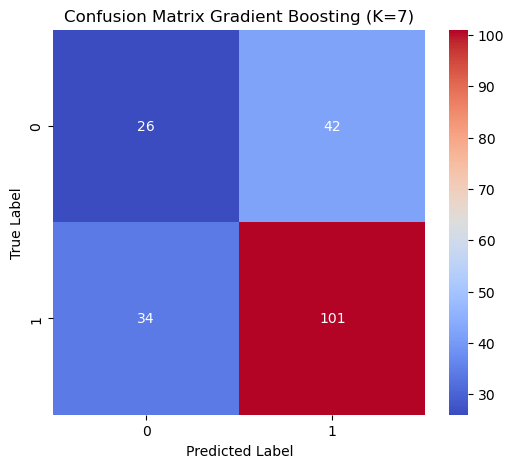


Evaluasi Gradient Boosting dengan K=9


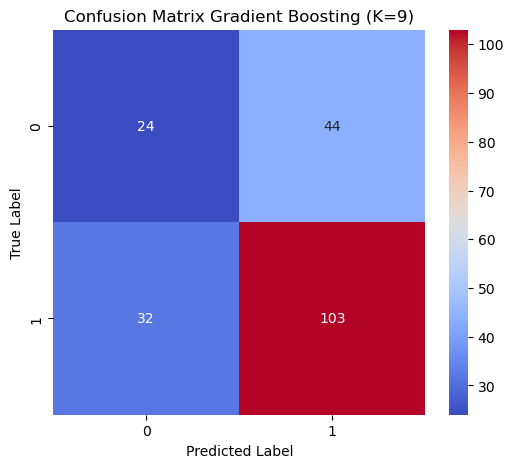


Jumlah data untuk tiap kelas:
0     68
1    135
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   68.47%    63.60%  61.33%   61.77%
1           AdaBoost  5   69.46%    64.90%  62.08%   62.59%
2           AdaBoost  7   69.95%    65.68%  63.91%   64.43%
3           AdaBoost  9   68.97%    64.29%  62.07%   62.55%
4  Gradient Boosting  3   63.55%    58.40%  58.00%   58.13%
5  Gradient Boosting  5   62.56%    56.72%  56.16%   56.27%
6  Gradient Boosting  7   62.56%    56.98%  56.53%   56.64%
7  Gradient Boosting  9   62.56%    56.46%  55.80%   55.88%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,68.47%,63.60%,61.33%,61.77%
1,AdaBoost,5,69.46%,64.90%,62.08%,62.59%
2,AdaBoost,7,69.95%,65.68%,63.91%,64.43%
3,AdaBoost,9,68.97%,64.29%,62.07%,62.55%
4,Gradient Boosting,3,63.55%,58.40%,58.00%,58.13%
5,Gradient Boosting,5,62.56%,56.72%,56.16%,56.27%
6,Gradient Boosting,7,62.56%,56.98%,56.53%,56.64%
7,Gradient Boosting,9,62.56%,56.46%,55.80%,55.88%


In [78]:
no_balancing(df_kuantitas_fitur_4)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


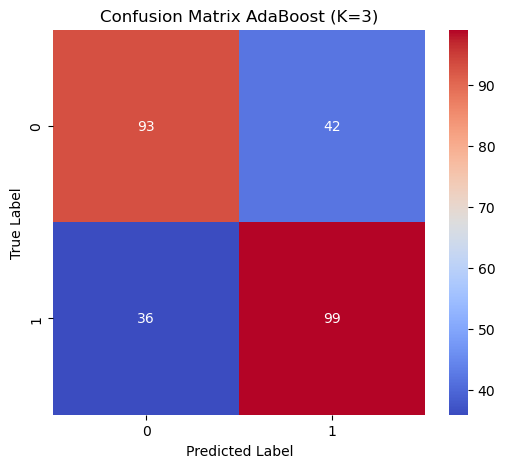


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

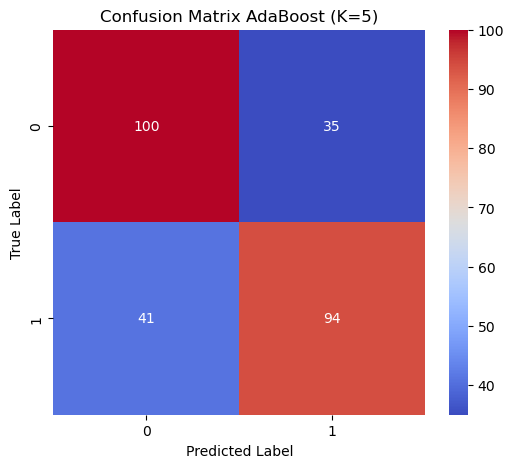

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

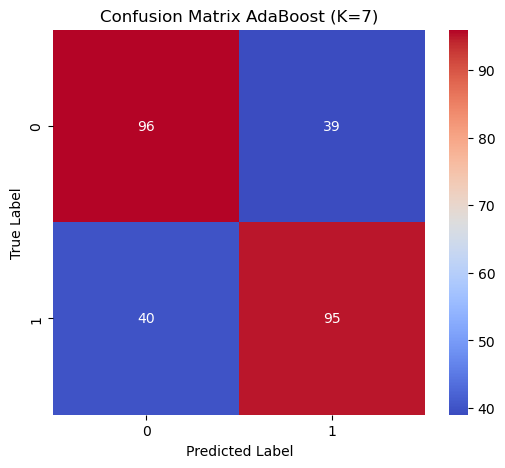


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

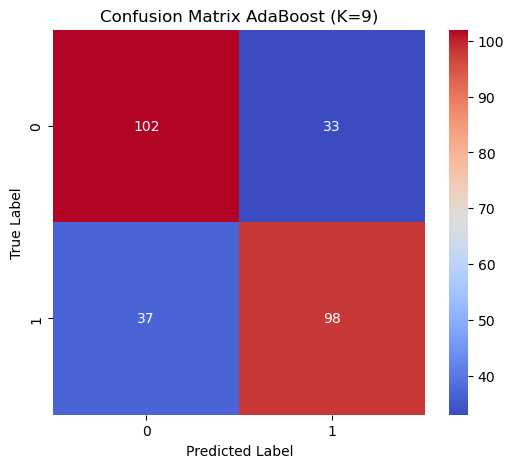


Evaluasi Gradient Boosting dengan K=3


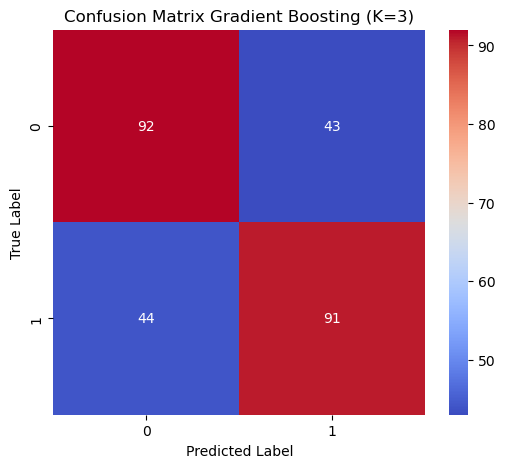


Evaluasi Gradient Boosting dengan K=5


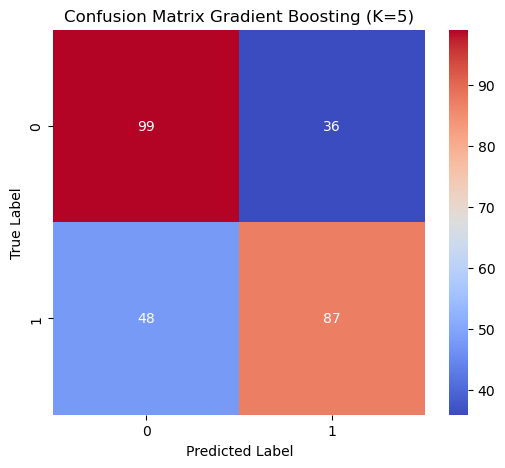


Evaluasi Gradient Boosting dengan K=7


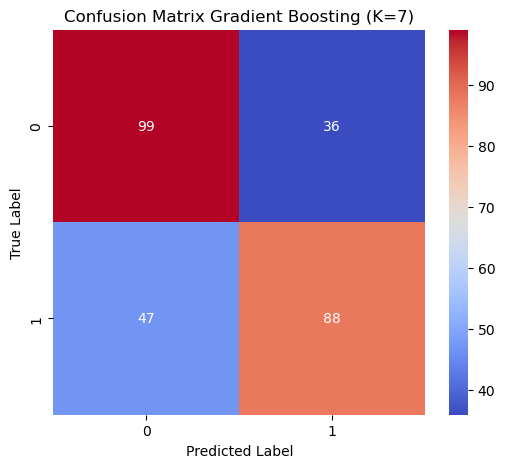


Evaluasi Gradient Boosting dengan K=9


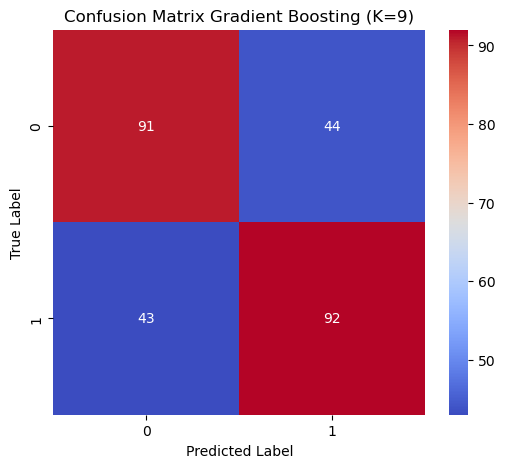


Jumlah data per kelas setelah SMOTE:
1    135
0    135
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   71.11%    71.15%  71.11%   71.10%
1           AdaBoost  5   71.85%    71.90%  71.85%   71.84%
2           AdaBoost  7   70.74%    70.74%  70.74%   70.74%
3           AdaBoost  9   74.07%    74.10%  74.07%   74.07%
4  Gradient Boosting  3   67.78%    67.78%  67.78%   67.78%
5  Gradient Boosting  5   68.89%    69.04%  68.89%   68.83%
6  Gradient Boosting  7   69.26%    69.39%  69.26%   69.21%
7  Gradient Boosting  9   67.78%    67.78%  67.78%   67.78%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,71.11%,71.15%,71.11%,71.10%
1,AdaBoost,5,71.85%,71.90%,71.85%,71.84%
2,AdaBoost,7,70.74%,70.74%,70.74%,70.74%
3,AdaBoost,9,74.07%,74.10%,74.07%,74.07%
4,Gradient Boosting,3,67.78%,67.78%,67.78%,67.78%
5,Gradient Boosting,5,68.89%,69.04%,68.89%,68.83%
6,Gradient Boosting,7,69.26%,69.39%,69.26%,69.21%
7,Gradient Boosting,9,67.78%,67.78%,67.78%,67.78%


In [79]:
balancing(df_kuantitas_fitur_4)

# 8 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


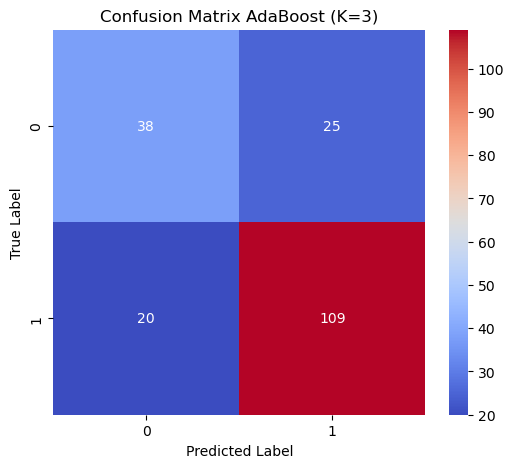


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

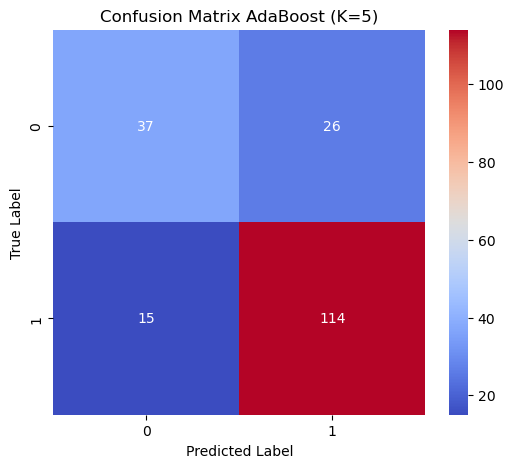

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

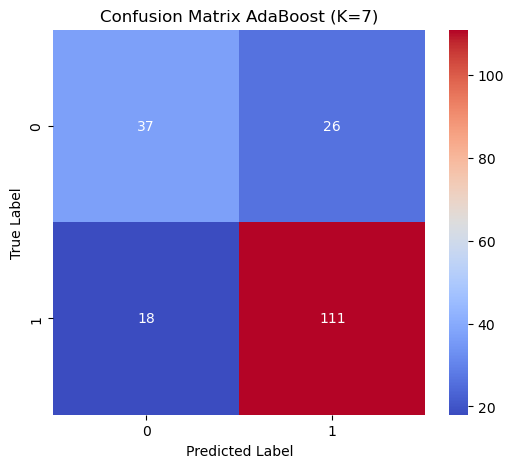


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

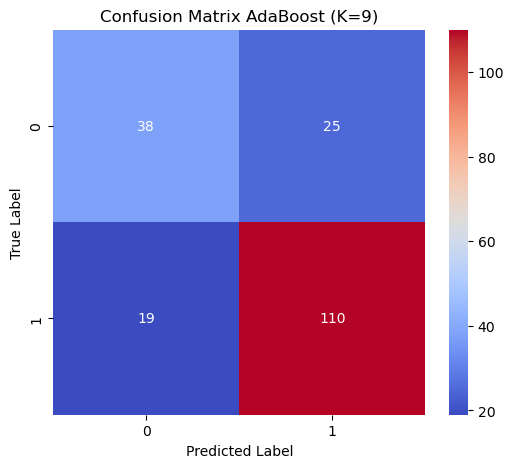


Evaluasi Gradient Boosting dengan K=3


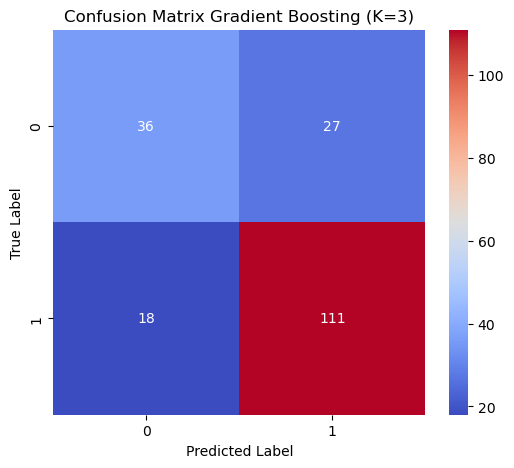


Evaluasi Gradient Boosting dengan K=5


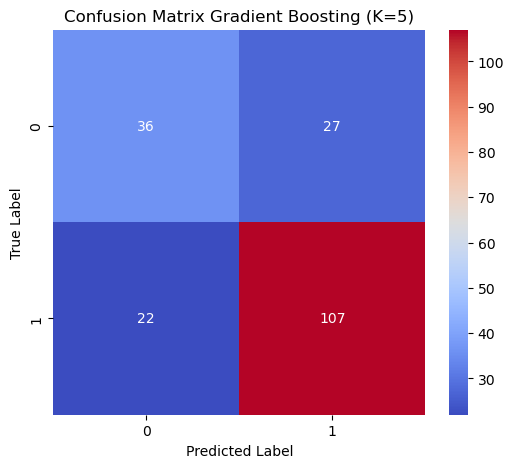


Evaluasi Gradient Boosting dengan K=7


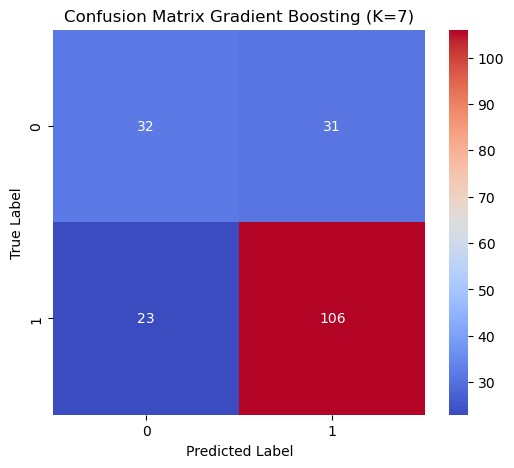


Evaluasi Gradient Boosting dengan K=9


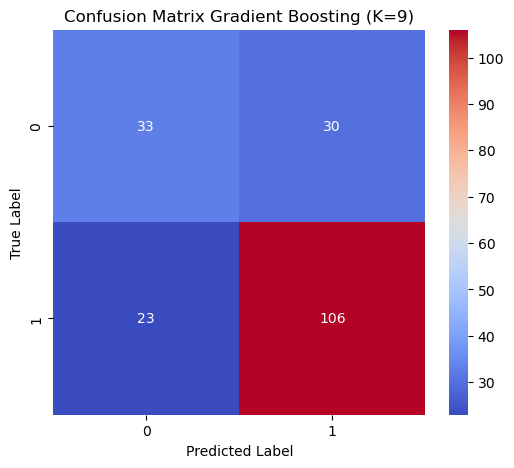


Jumlah data untuk tiap kelas:
0     63
1    129
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.56%    73.43%  72.41%   72.85%
1           AdaBoost  5   78.65%    76.29%  73.55%   74.55%
2           AdaBoost  7   77.08%    74.15%  72.39%   73.09%
3           AdaBoost  9   77.08%    74.07%  72.79%   73.33%
4  Gradient Boosting  3   76.56%    73.55%  71.59%   72.34%
5  Gradient Boosting  5   74.48%    70.96%  70.04%   70.44%
6  Gradient Boosting  7   71.88%    67.78%  66.48%   66.97%
7  Gradient Boosting  9   72.40%    68.43%  67.28%   67.73%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.56%,73.43%,72.41%,72.85%
1,AdaBoost,5,78.65%,76.29%,73.55%,74.55%
2,AdaBoost,7,77.08%,74.15%,72.39%,73.09%
3,AdaBoost,9,77.08%,74.07%,72.79%,73.33%
4,Gradient Boosting,3,76.56%,73.55%,71.59%,72.34%
5,Gradient Boosting,5,74.48%,70.96%,70.04%,70.44%
6,Gradient Boosting,7,71.88%,67.78%,66.48%,66.97%
7,Gradient Boosting,9,72.40%,68.43%,67.28%,67.73%


In [80]:
no_balancing(df_kualitas_fitur_8)


#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


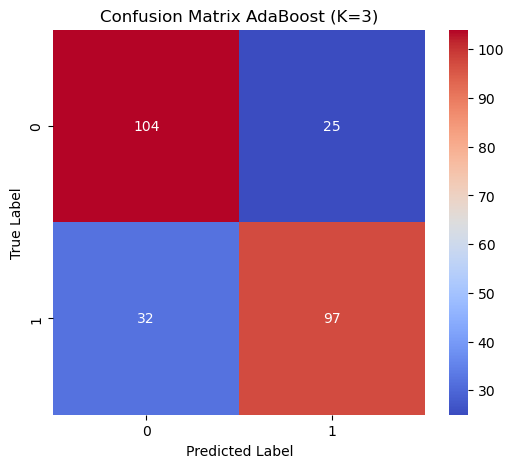


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

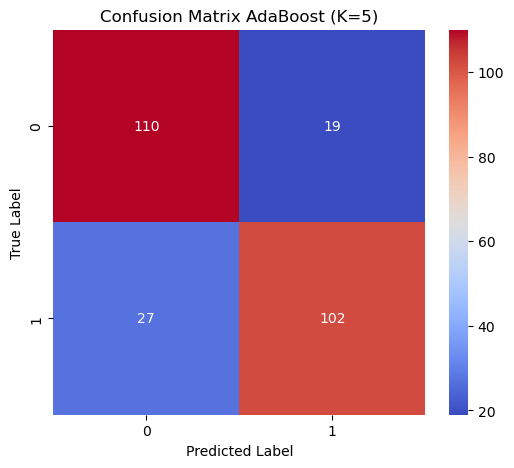


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

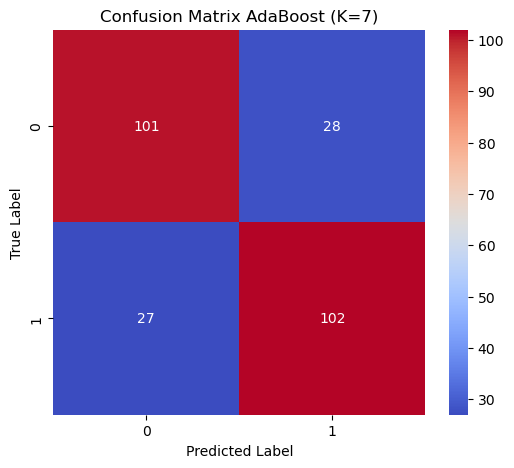


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

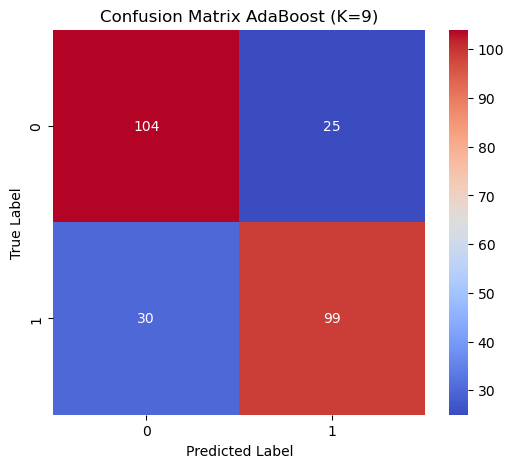


Evaluasi Gradient Boosting dengan K=3


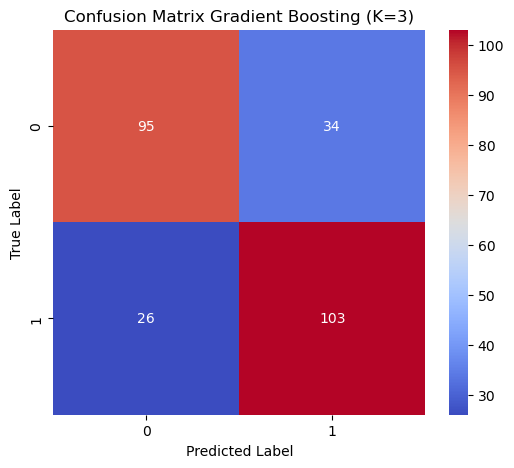


Evaluasi Gradient Boosting dengan K=5


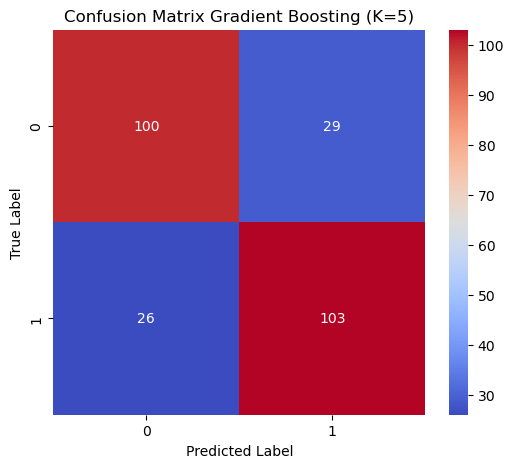


Evaluasi Gradient Boosting dengan K=7


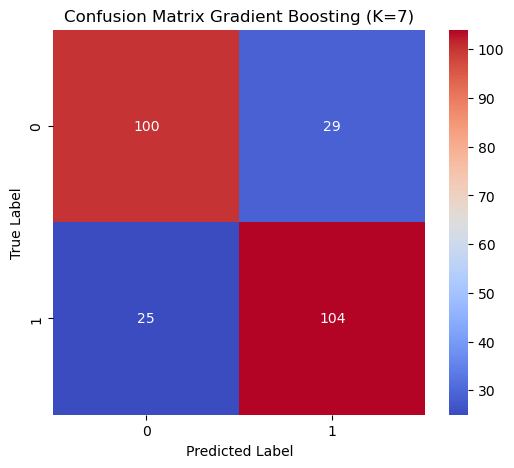


Evaluasi Gradient Boosting dengan K=9


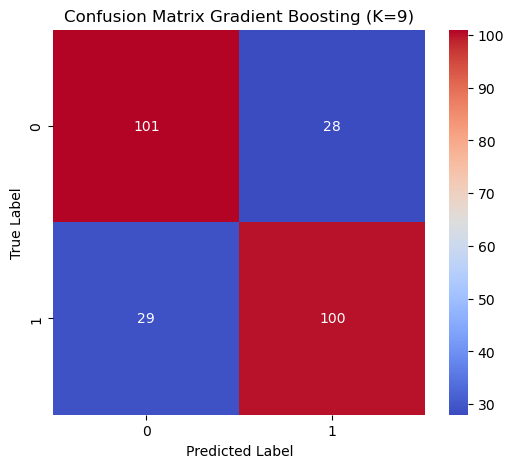


Jumlah data per kelas setelah SMOTE:
1    129
0    129
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.91%    77.99%  77.91%   77.89%
1           AdaBoost  5   82.17%    82.29%  82.17%   82.15%
2           AdaBoost  7   78.68%    78.68%  78.68%   78.68%
3           AdaBoost  9   78.68%    78.73%  78.68%   78.67%
4  Gradient Boosting  3   76.74%    76.85%  76.74%   76.72%
5  Gradient Boosting  5   78.68%    78.70%  78.68%   78.68%
6  Gradient Boosting  7   79.07%    79.10%  79.07%   79.06%
7  Gradient Boosting  9   77.91%    77.91%  77.91%   77.91%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.91%,77.99%,77.91%,77.89%
1,AdaBoost,5,82.17%,82.29%,82.17%,82.15%
2,AdaBoost,7,78.68%,78.68%,78.68%,78.68%
3,AdaBoost,9,78.68%,78.73%,78.68%,78.67%
4,Gradient Boosting,3,76.74%,76.85%,76.74%,76.72%
5,Gradient Boosting,5,78.68%,78.70%,78.68%,78.68%
6,Gradient Boosting,7,79.07%,79.10%,79.07%,79.06%
7,Gradient Boosting,9,77.91%,77.91%,77.91%,77.91%


In [81]:
balancing(df_kualitas_fitur_8)

# 8 fitur Terbaik Kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


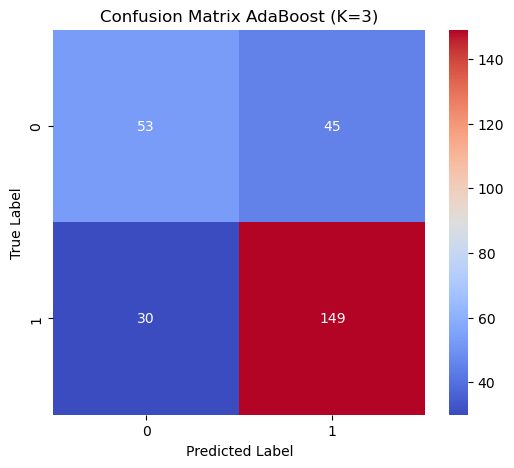


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

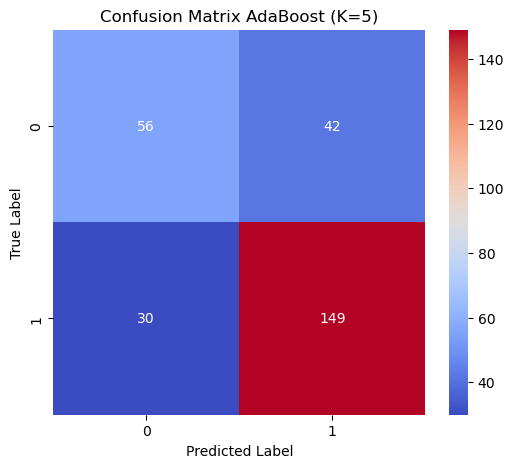

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

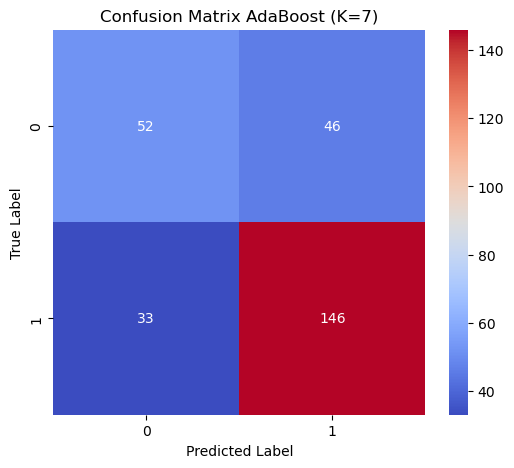


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

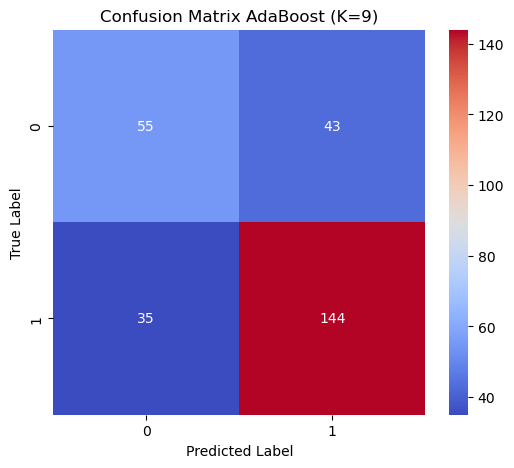


Evaluasi Gradient Boosting dengan K=3


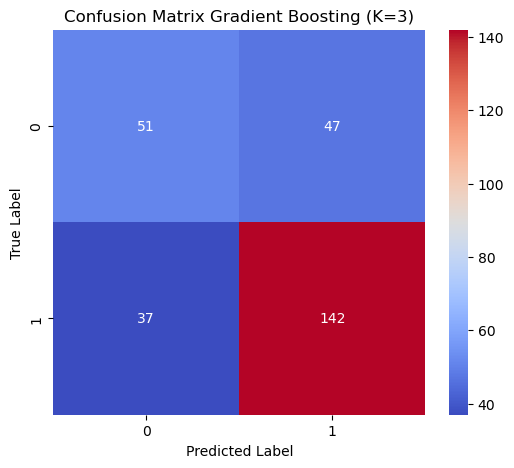


Evaluasi Gradient Boosting dengan K=5


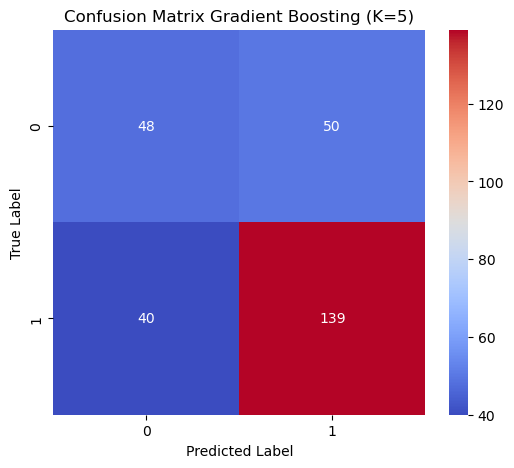


Evaluasi Gradient Boosting dengan K=7


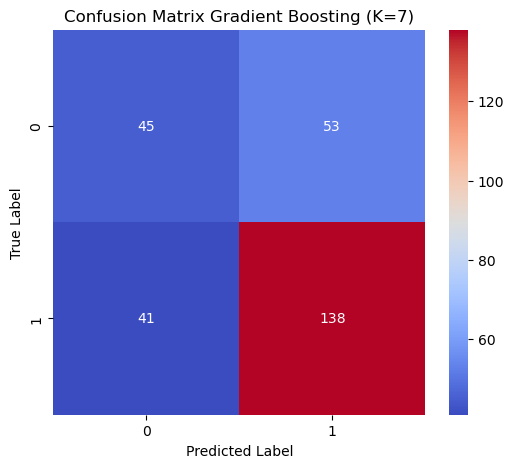


Evaluasi Gradient Boosting dengan K=9


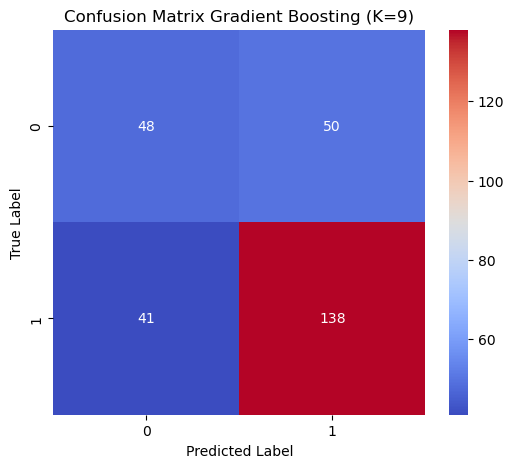


Jumlah data untuk tiap kelas:
0     98
1    179
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   72.92%    70.33%  68.66%   69.23%
1           AdaBoost  5   74.01%    71.56%  70.19%   70.71%
2           AdaBoost  7   71.48%    68.61%  67.31%   67.77%
3           AdaBoost  9   71.84%    69.06%  68.28%   68.60%
4  Gradient Boosting  3   69.68%    66.54%  65.69%   66.01%
5  Gradient Boosting  5   67.51%    64.05%  63.32%   63.58%
6  Gradient Boosting  7   66.06%    62.29%  61.51%   61.75%
7  Gradient Boosting  9   67.15%    63.67%  63.04%   63.27%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,72.92%,70.33%,68.66%,69.23%
1,AdaBoost,5,74.01%,71.56%,70.19%,70.71%
2,AdaBoost,7,71.48%,68.61%,67.31%,67.77%
3,AdaBoost,9,71.84%,69.06%,68.28%,68.60%
4,Gradient Boosting,3,69.68%,66.54%,65.69%,66.01%
5,Gradient Boosting,5,67.51%,64.05%,63.32%,63.58%
6,Gradient Boosting,7,66.06%,62.29%,61.51%,61.75%
7,Gradient Boosting,9,67.15%,63.67%,63.04%,63.27%


In [82]:
no_balancing(df_kuantitas_fitur_8)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


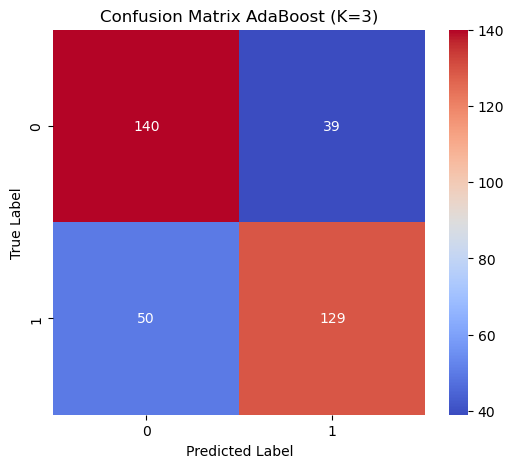


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

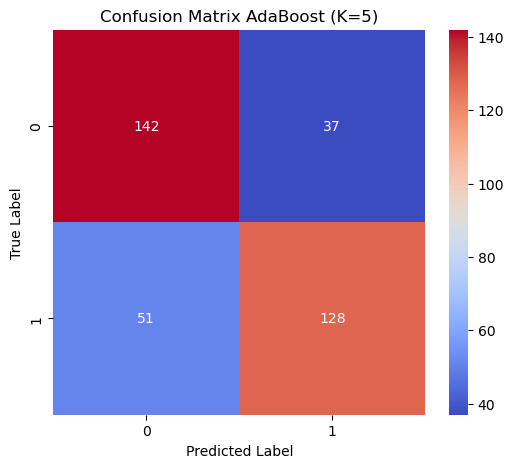

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

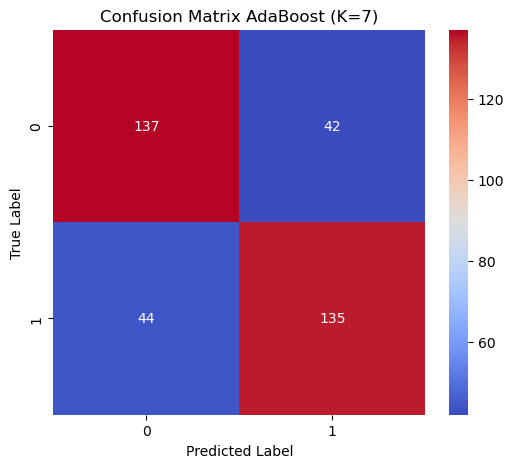


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

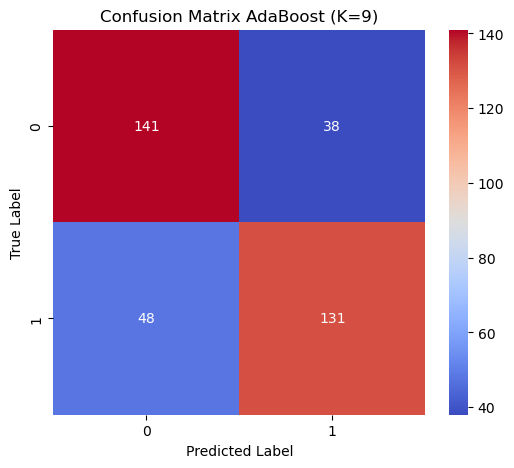


Evaluasi Gradient Boosting dengan K=3


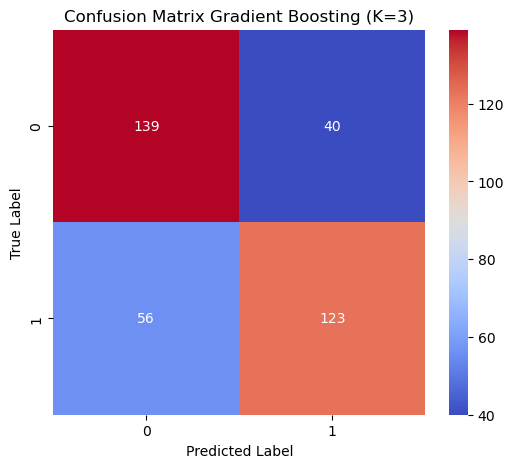


Evaluasi Gradient Boosting dengan K=5


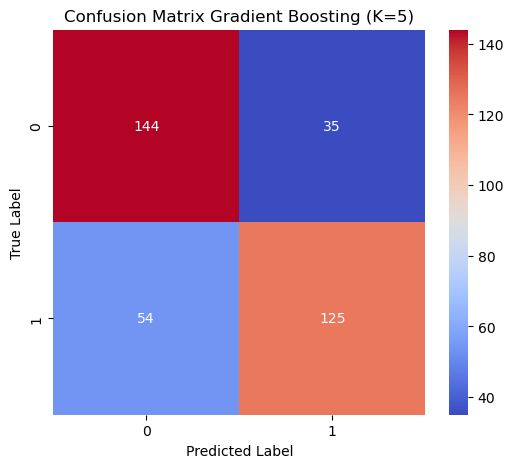


Evaluasi Gradient Boosting dengan K=7


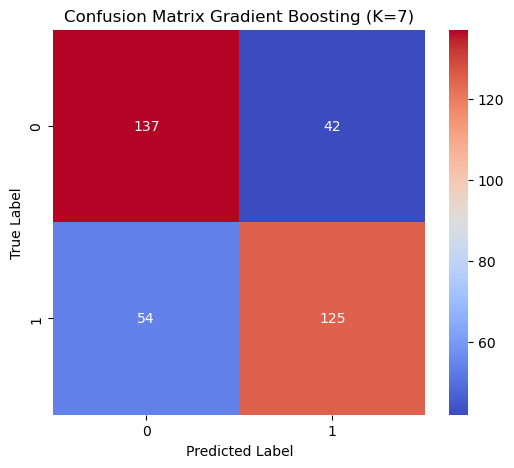


Evaluasi Gradient Boosting dengan K=9


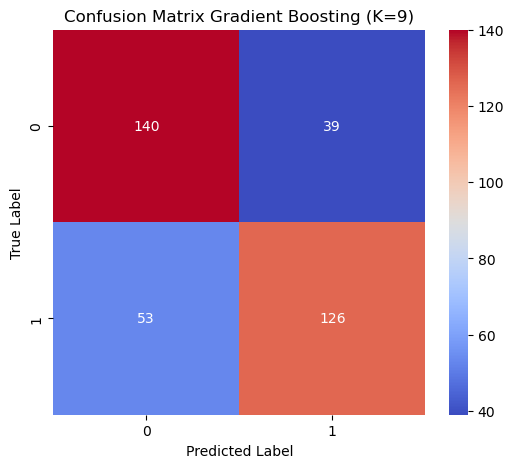


Jumlah data per kelas setelah SMOTE:
1    179
0    179
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   75.14%    75.23%  75.14%   75.12%
1           AdaBoost  5   75.42%    75.58%  75.42%   75.38%
2           AdaBoost  7   75.98%    75.98%  75.98%   75.98%
3           AdaBoost  9   75.98%    76.06%  75.98%   75.96%
4  Gradient Boosting  3   73.18%    73.37%  73.18%   73.13%
5  Gradient Boosting  5   75.14%    75.43%  75.14%   75.07%
6  Gradient Boosting  7   73.18%    73.29%  73.18%   73.15%
7  Gradient Boosting  9   74.30%    74.45%  74.30%   74.26%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,75.14%,75.23%,75.14%,75.12%
1,AdaBoost,5,75.42%,75.58%,75.42%,75.38%
2,AdaBoost,7,75.98%,75.98%,75.98%,75.98%
3,AdaBoost,9,75.98%,76.06%,75.98%,75.96%
4,Gradient Boosting,3,73.18%,73.37%,73.18%,73.13%
5,Gradient Boosting,5,75.14%,75.43%,75.14%,75.07%
6,Gradient Boosting,7,73.18%,73.29%,73.18%,73.15%
7,Gradient Boosting,9,74.30%,74.45%,74.30%,74.26%


In [83]:
balancing(df_kuantitas_fitur_8)

# 12 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


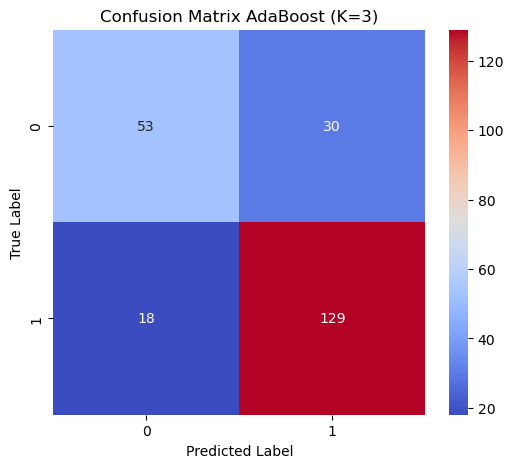


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

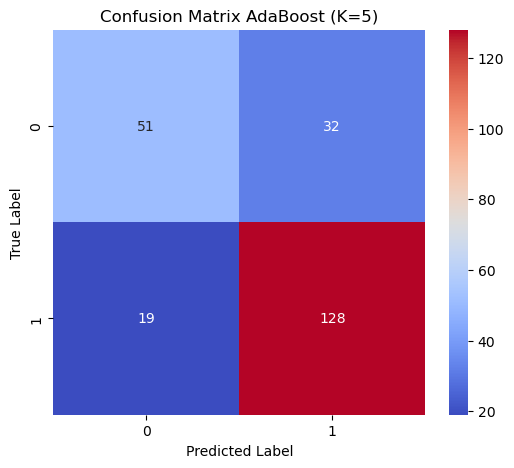

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

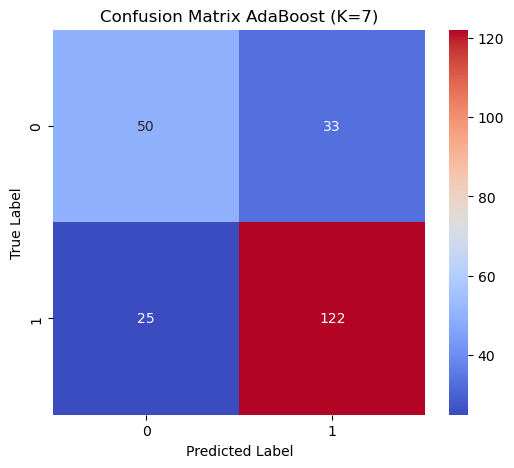


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

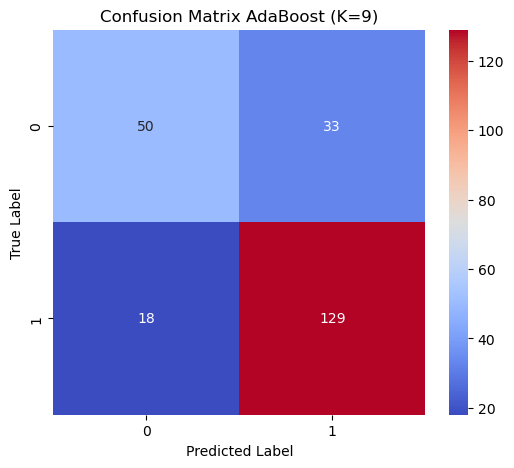


Evaluasi Gradient Boosting dengan K=3


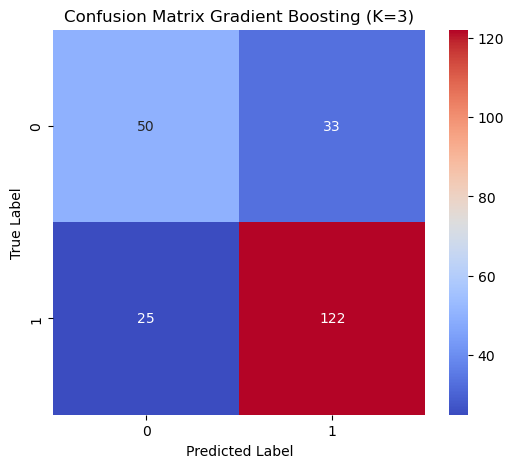


Evaluasi Gradient Boosting dengan K=5


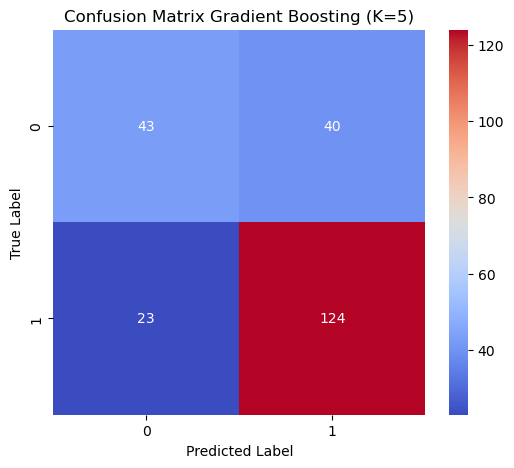


Evaluasi Gradient Boosting dengan K=7


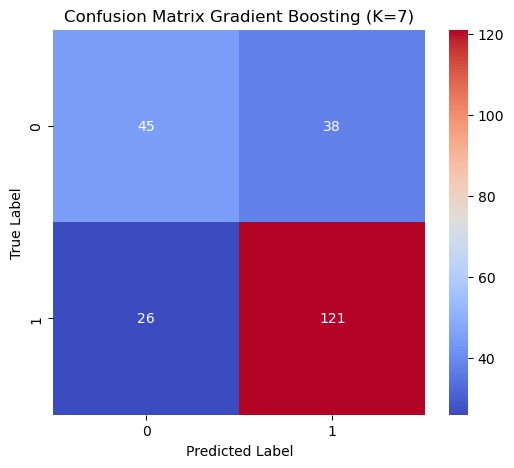


Evaluasi Gradient Boosting dengan K=9


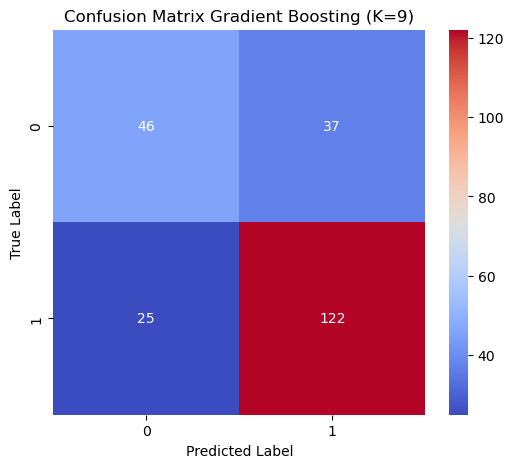


Jumlah data untuk tiap kelas:
0     83
1    147
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.13%    77.89%  75.81%   76.57%
1           AdaBoost  5   77.83%    76.43%  74.26%   75.03%
2           AdaBoost  7   74.78%    72.69%  71.62%   72.04%
3           AdaBoost  9   77.83%    76.58%  74.00%   74.86%
4  Gradient Boosting  3   74.78%    72.69%  71.62%   72.04%
5  Gradient Boosting  5   72.61%    70.38%  68.08%   68.73%
6  Gradient Boosting  7   72.17%    69.74%  68.26%   68.76%
7  Gradient Boosting  9   73.04%    70.76%  69.21%   69.74%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.13%,77.89%,75.81%,76.57%
1,AdaBoost,5,77.83%,76.43%,74.26%,75.03%
2,AdaBoost,7,74.78%,72.69%,71.62%,72.04%
3,AdaBoost,9,77.83%,76.58%,74.00%,74.86%
4,Gradient Boosting,3,74.78%,72.69%,71.62%,72.04%
5,Gradient Boosting,5,72.61%,70.38%,68.08%,68.73%
6,Gradient Boosting,7,72.17%,69.74%,68.26%,68.76%
7,Gradient Boosting,9,73.04%,70.76%,69.21%,69.74%


In [84]:
no_balancing(df_kualitas_fitur_12)



#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


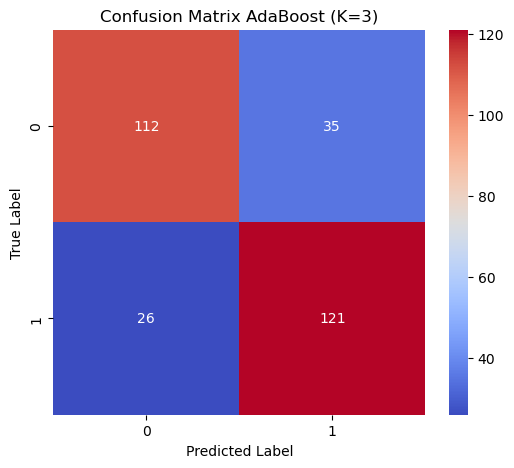

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


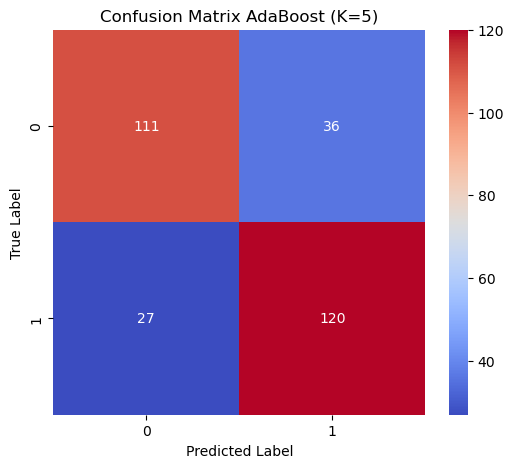

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

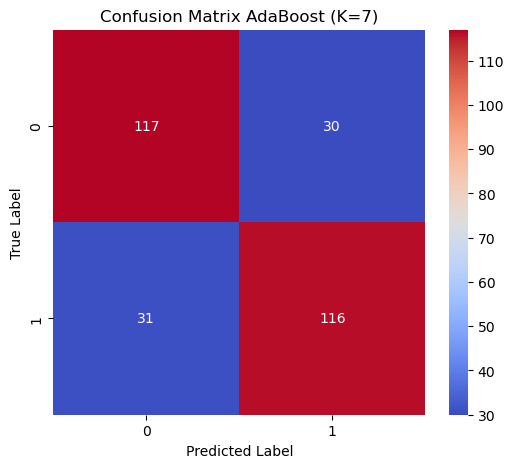

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

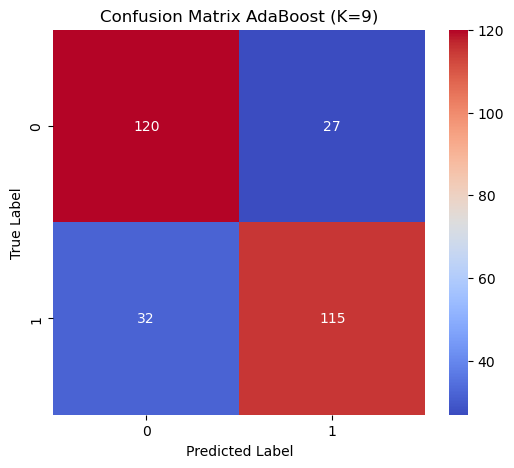


Evaluasi Gradient Boosting dengan K=3


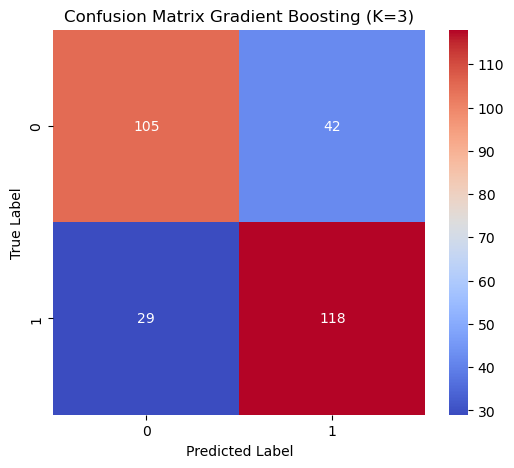


Evaluasi Gradient Boosting dengan K=5


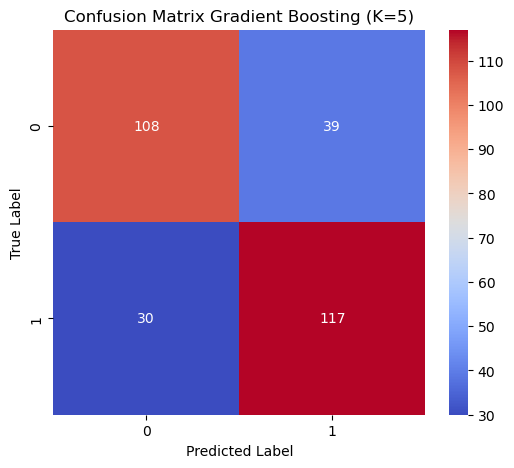


Evaluasi Gradient Boosting dengan K=7


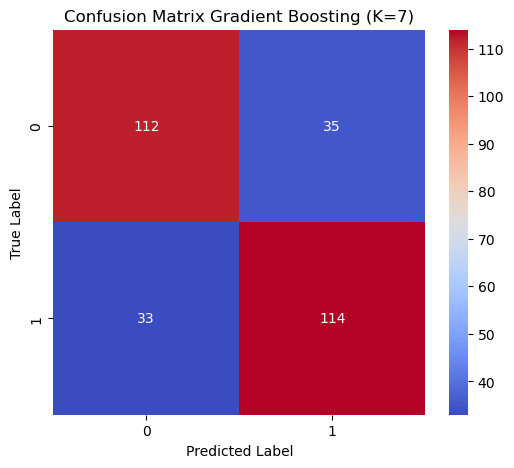


Evaluasi Gradient Boosting dengan K=9


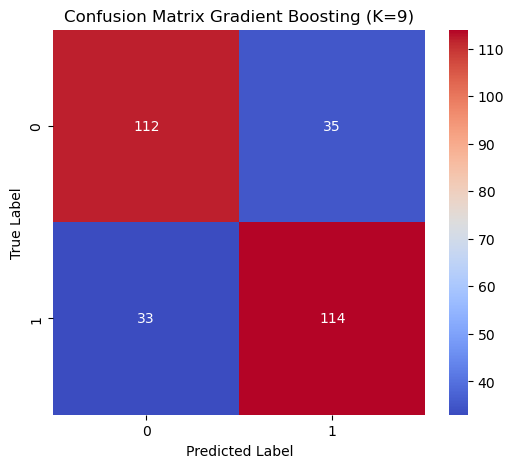


Jumlah data per kelas setelah SMOTE:
1    147
0    147
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.25%    79.36%  79.25%   79.23%
1           AdaBoost  5   78.57%    78.68%  78.57%   78.55%
2           AdaBoost  7   79.25%    79.25%  79.25%   79.25%
3           AdaBoost  9   79.93%    79.97%  79.93%   79.93%
4  Gradient Boosting  3   75.85%    76.05%  75.85%   75.80%
5  Gradient Boosting  5   76.53%    76.63%  76.53%   76.51%
6  Gradient Boosting  7   76.87%    76.88%  76.87%   76.87%
7  Gradient Boosting  9   76.87%    76.88%  76.87%   76.87%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.25%,79.36%,79.25%,79.23%
1,AdaBoost,5,78.57%,78.68%,78.57%,78.55%
2,AdaBoost,7,79.25%,79.25%,79.25%,79.25%
3,AdaBoost,9,79.93%,79.97%,79.93%,79.93%
4,Gradient Boosting,3,75.85%,76.05%,75.85%,75.80%
5,Gradient Boosting,5,76.53%,76.63%,76.53%,76.51%
6,Gradient Boosting,7,76.87%,76.88%,76.87%,76.87%
7,Gradient Boosting,9,76.87%,76.88%,76.87%,76.87%


In [85]:
balancing(df_kualitas_fitur_12)


# 12 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


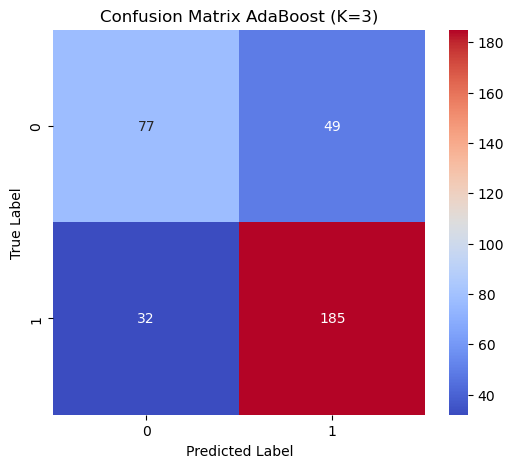


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

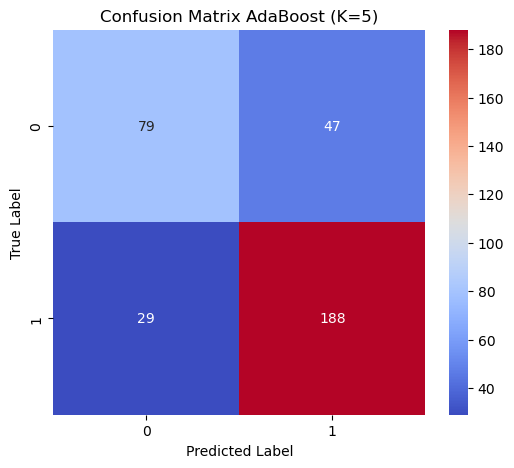

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

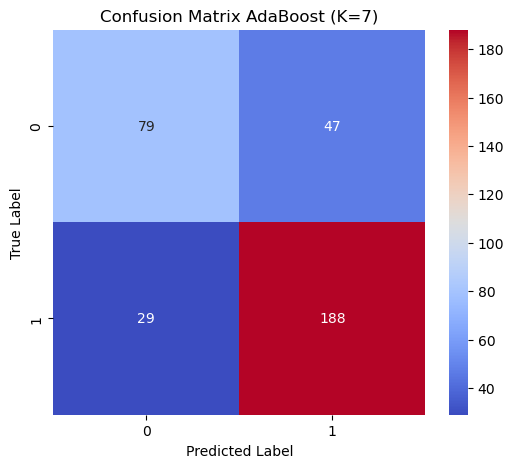


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

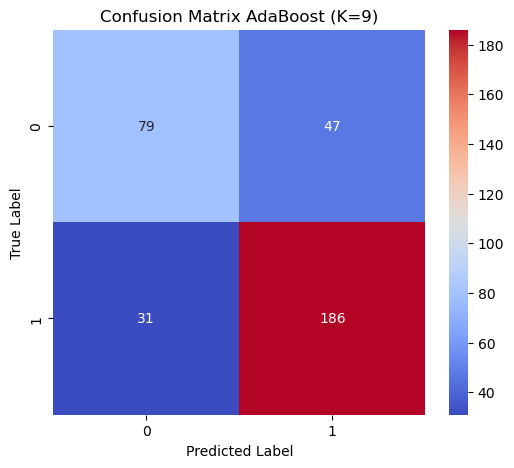


Evaluasi Gradient Boosting dengan K=3


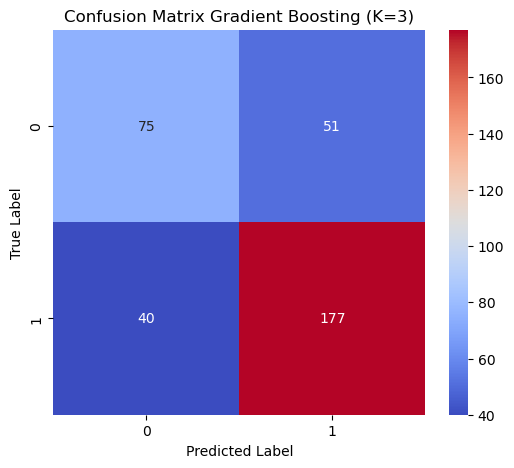


Evaluasi Gradient Boosting dengan K=5


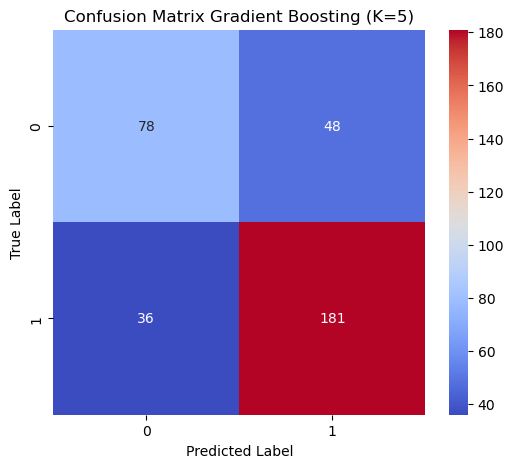


Evaluasi Gradient Boosting dengan K=7


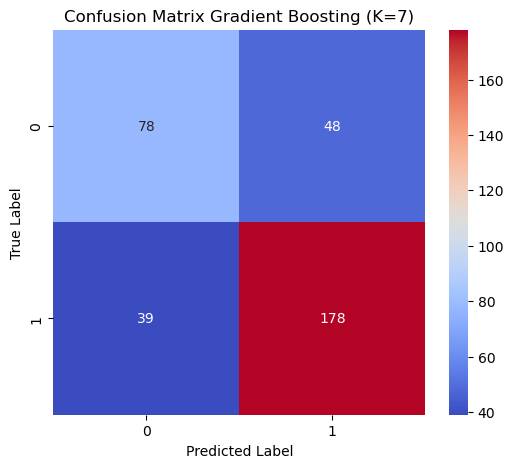


Evaluasi Gradient Boosting dengan K=9


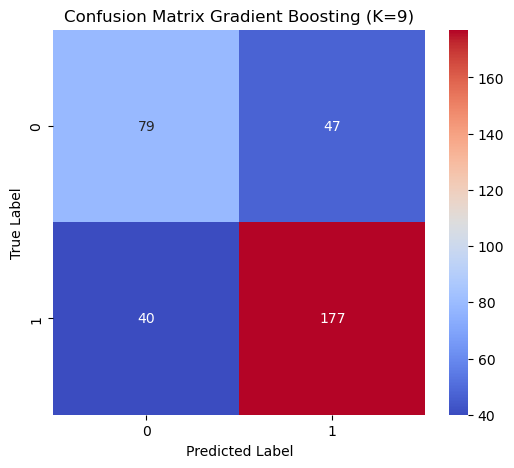


Jumlah data untuk tiap kelas:
0    126
1    217
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.38%    74.85%  73.18%   73.79%
1           AdaBoost  5   77.84%    76.57%  74.67%   75.35%
2           AdaBoost  7   77.84%    76.57%  74.67%   75.35%
3           AdaBoost  9   77.26%    75.82%  74.21%   74.81%
4  Gradient Boosting  3   73.47%    71.42%  70.55%   70.90%
5  Gradient Boosting  5   75.51%    73.73%  72.66%   73.08%
6  Gradient Boosting  7   74.64%    72.71%  71.97%   72.28%
7  Gradient Boosting  9   74.64%    72.70%  72.13%   72.38%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.38%,74.85%,73.18%,73.79%
1,AdaBoost,5,77.84%,76.57%,74.67%,75.35%
2,AdaBoost,7,77.84%,76.57%,74.67%,75.35%
3,AdaBoost,9,77.26%,75.82%,74.21%,74.81%
4,Gradient Boosting,3,73.47%,71.42%,70.55%,70.90%
5,Gradient Boosting,5,75.51%,73.73%,72.66%,73.08%
6,Gradient Boosting,7,74.64%,72.71%,71.97%,72.28%
7,Gradient Boosting,9,74.64%,72.70%,72.13%,72.38%


In [86]:
no_balancing(df_kuantitas_fitur_12)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


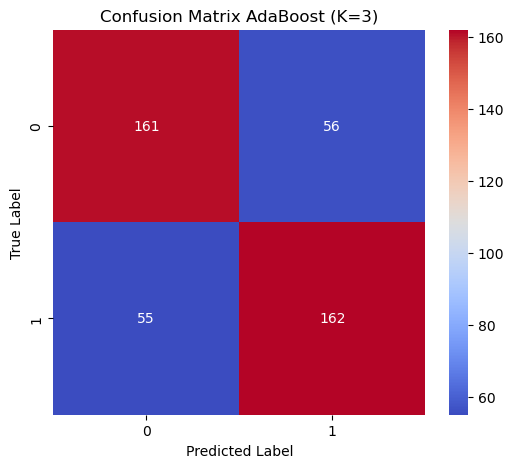


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

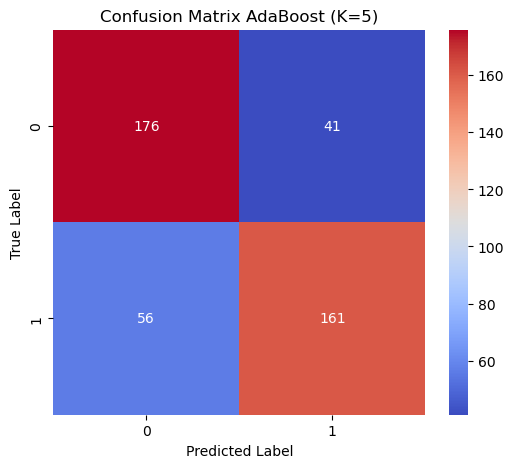

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

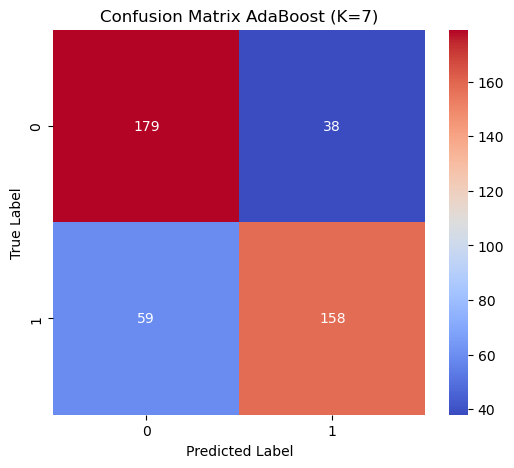

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

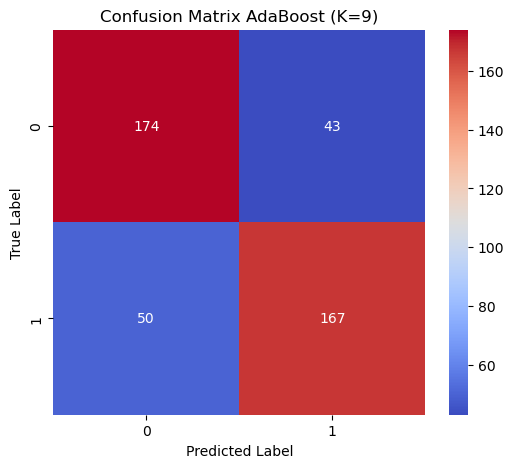


Evaluasi Gradient Boosting dengan K=3


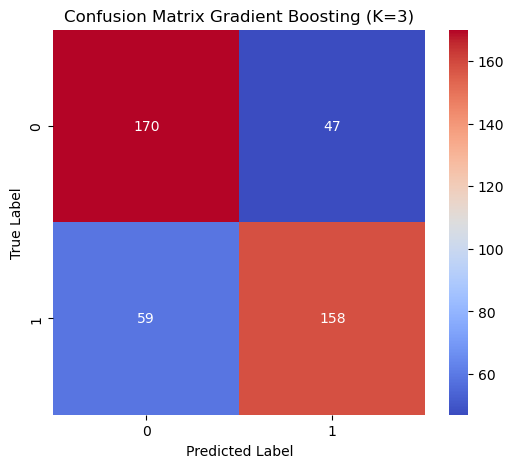


Evaluasi Gradient Boosting dengan K=5


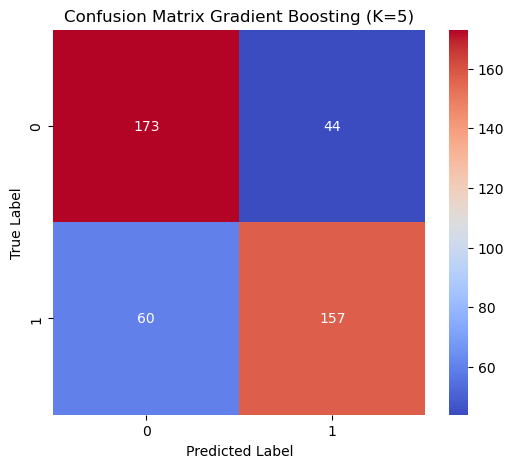


Evaluasi Gradient Boosting dengan K=7


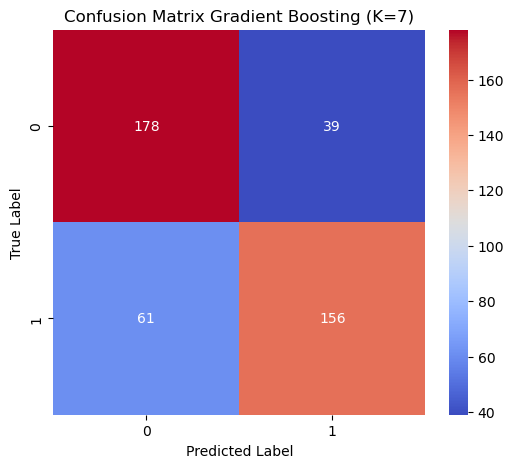


Evaluasi Gradient Boosting dengan K=9


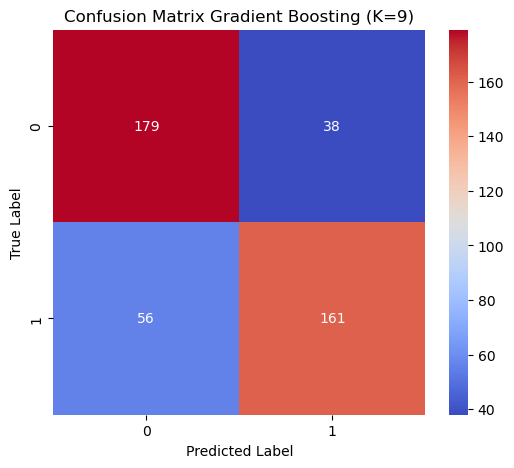


Jumlah data per kelas setelah SMOTE:
1    217
0    217
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   74.42%    74.42%  74.42%   74.42%
1           AdaBoost  5   77.65%    77.78%  77.65%   77.62%
2           AdaBoost  7   77.65%    77.91%  77.65%   77.60%
3           AdaBoost  9   78.57%    78.60%  78.57%   78.57%
4  Gradient Boosting  3   75.58%    75.65%  75.58%   75.56%
5  Gradient Boosting  5   76.04%    76.18%  76.04%   76.00%
6  Gradient Boosting  7   76.96%    77.24%  76.96%   76.90%
7  Gradient Boosting  9   78.34%    78.54%  78.34%   78.30%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,74.42%,74.42%,74.42%,74.42%
1,AdaBoost,5,77.65%,77.78%,77.65%,77.62%
2,AdaBoost,7,77.65%,77.91%,77.65%,77.60%
3,AdaBoost,9,78.57%,78.60%,78.57%,78.57%
4,Gradient Boosting,3,75.58%,75.65%,75.58%,75.56%
5,Gradient Boosting,5,76.04%,76.18%,76.04%,76.00%
6,Gradient Boosting,7,76.96%,77.24%,76.96%,76.90%
7,Gradient Boosting,9,78.34%,78.54%,78.34%,78.30%


In [87]:
balancing(df_kuantitas_fitur_12)

# 16 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


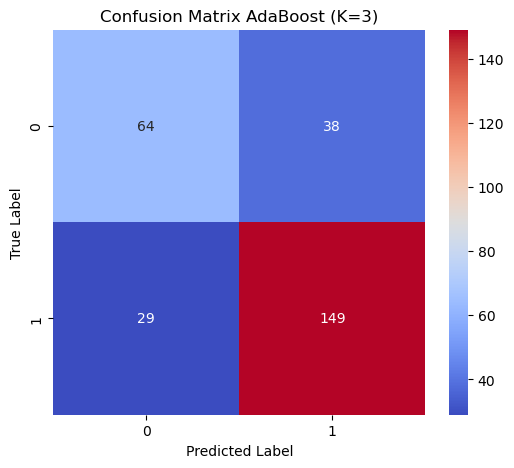


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

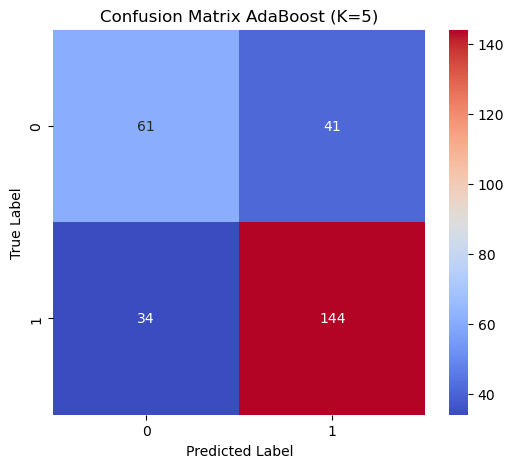


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

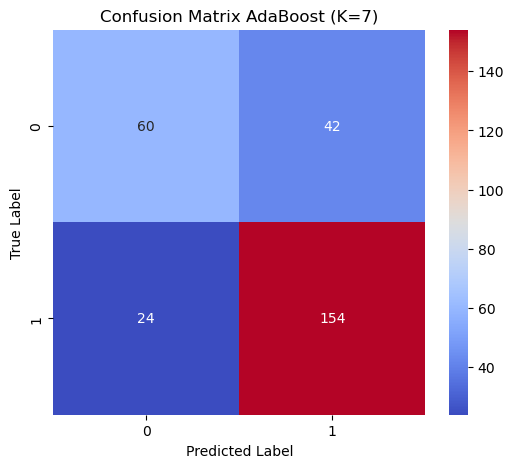


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

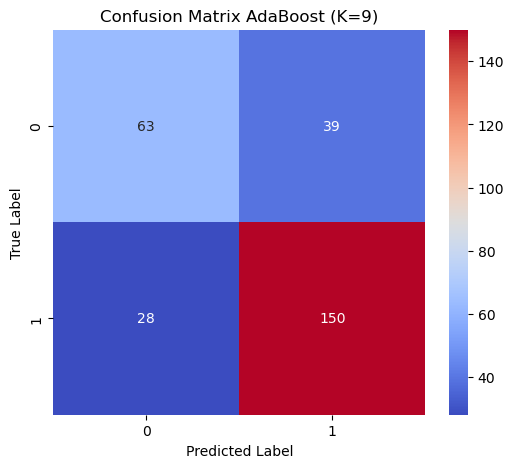


Evaluasi Gradient Boosting dengan K=3


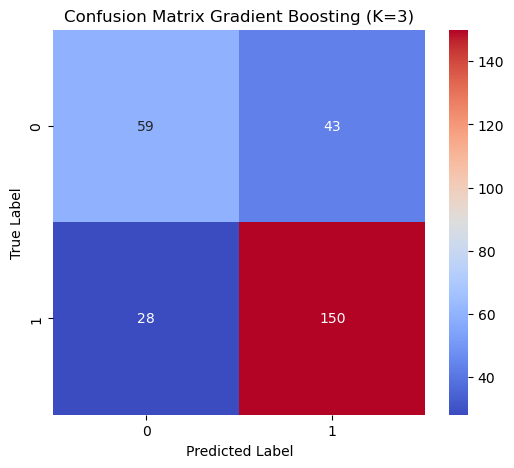


Evaluasi Gradient Boosting dengan K=5


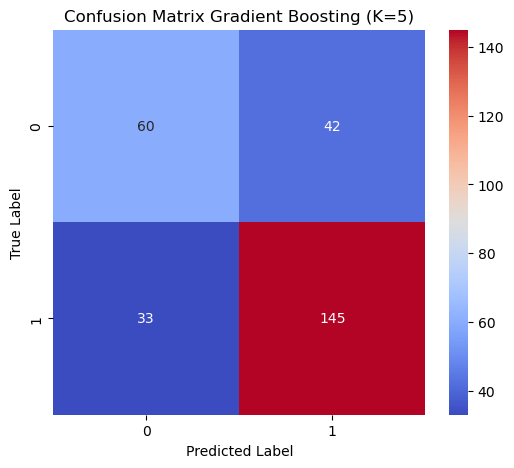


Evaluasi Gradient Boosting dengan K=7


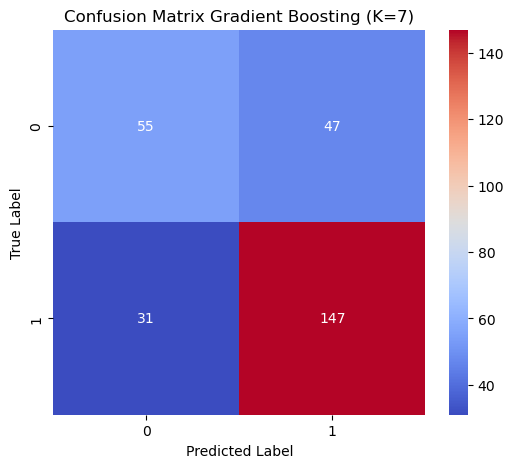


Evaluasi Gradient Boosting dengan K=9


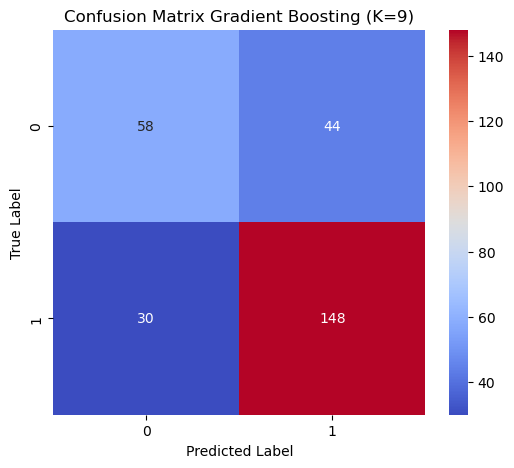


Jumlah data untuk tiap kelas:
0    102
1    178
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.07%    74.25%  73.23%   73.64%
1           AdaBoost  5   73.21%    71.02%  70.35%   70.63%
2           AdaBoost  7   76.43%    75.00%  72.67%   73.43%
3           AdaBoost  9   76.07%    74.30%  73.02%   73.51%
4  Gradient Boosting  3   74.64%    72.77%  71.06%   71.65%
5  Gradient Boosting  5   73.21%    71.03%  70.14%   70.50%
6  Gradient Boosting  7   72.14%    69.86%  68.25%   68.77%
7  Gradient Boosting  9   73.57%    71.50%  70.00%   70.53%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.07%,74.25%,73.23%,73.64%
1,AdaBoost,5,73.21%,71.02%,70.35%,70.63%
2,AdaBoost,7,76.43%,75.00%,72.67%,73.43%
3,AdaBoost,9,76.07%,74.30%,73.02%,73.51%
4,Gradient Boosting,3,74.64%,72.77%,71.06%,71.65%
5,Gradient Boosting,5,73.21%,71.03%,70.14%,70.50%
6,Gradient Boosting,7,72.14%,69.86%,68.25%,68.77%
7,Gradient Boosting,9,73.57%,71.50%,70.00%,70.53%


In [88]:
no_balancing(df_kualitas_fitur_16)



#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


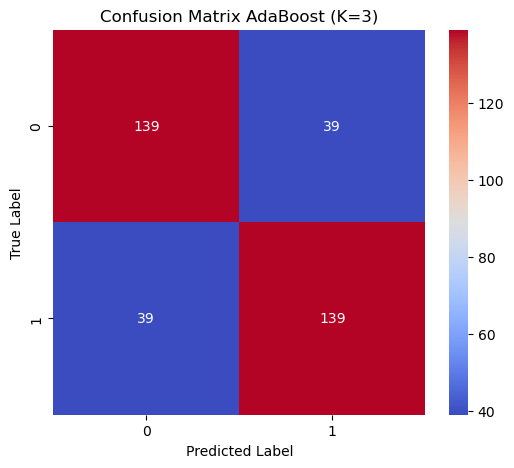

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


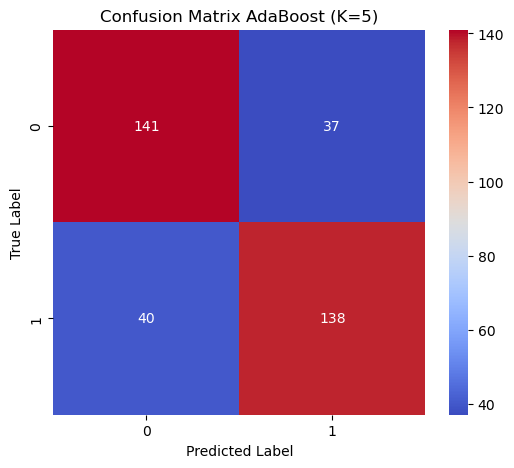

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

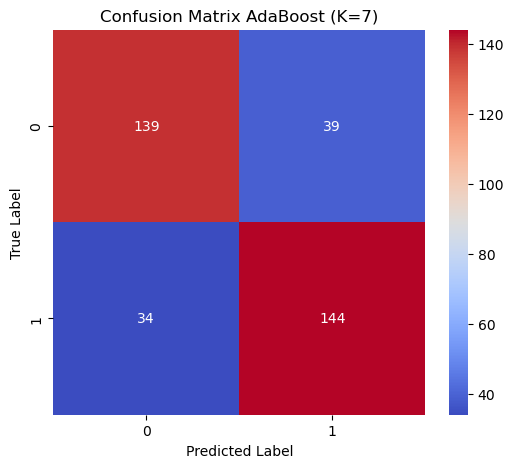


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

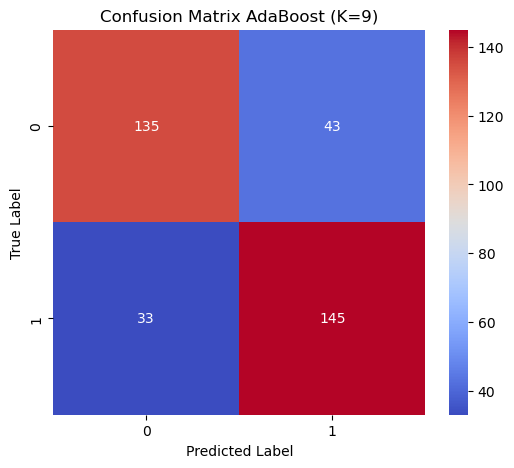


Evaluasi Gradient Boosting dengan K=3


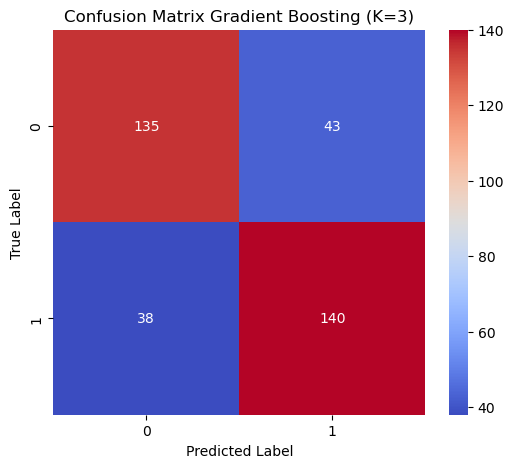


Evaluasi Gradient Boosting dengan K=5


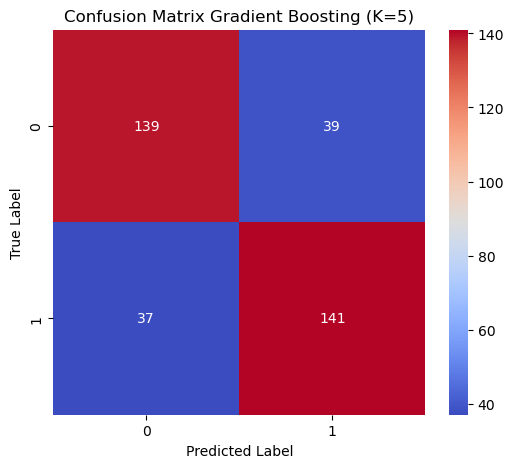


Evaluasi Gradient Boosting dengan K=7


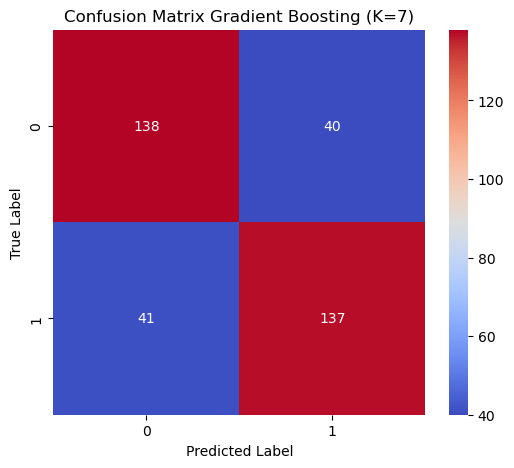


Evaluasi Gradient Boosting dengan K=9


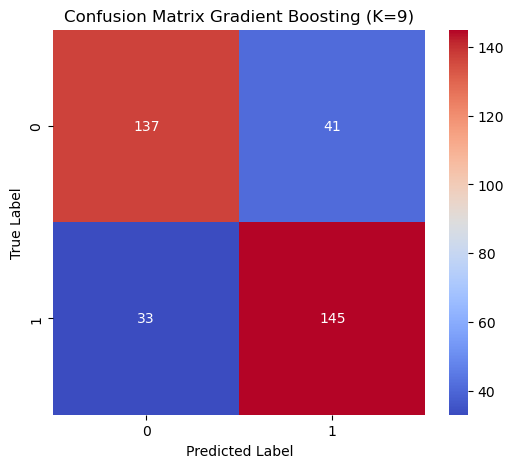


Jumlah data per kelas setelah SMOTE:
1    178
0    178
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.09%    78.09%  78.09%   78.09%
1           AdaBoost  5   78.37%    78.38%  78.37%   78.37%
2           AdaBoost  7   79.49%    79.52%  79.49%   79.49%
3           AdaBoost  9   78.65%    78.74%  78.65%   78.63%
4  Gradient Boosting  3   77.25%    77.27%  77.25%   77.24%
5  Gradient Boosting  5   78.65%    78.66%  78.65%   78.65%
6  Gradient Boosting  7   77.25%    77.25%  77.25%   77.25%
7  Gradient Boosting  9   79.21%    79.27%  79.21%   79.20%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.09%,78.09%,78.09%,78.09%
1,AdaBoost,5,78.37%,78.38%,78.37%,78.37%
2,AdaBoost,7,79.49%,79.52%,79.49%,79.49%
3,AdaBoost,9,78.65%,78.74%,78.65%,78.63%
4,Gradient Boosting,3,77.25%,77.27%,77.25%,77.24%
5,Gradient Boosting,5,78.65%,78.66%,78.65%,78.65%
6,Gradient Boosting,7,77.25%,77.25%,77.25%,77.25%
7,Gradient Boosting,9,79.21%,79.27%,79.21%,79.20%


In [89]:
balancing(df_kualitas_fitur_16)

# 16 fitur Terbaik Kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


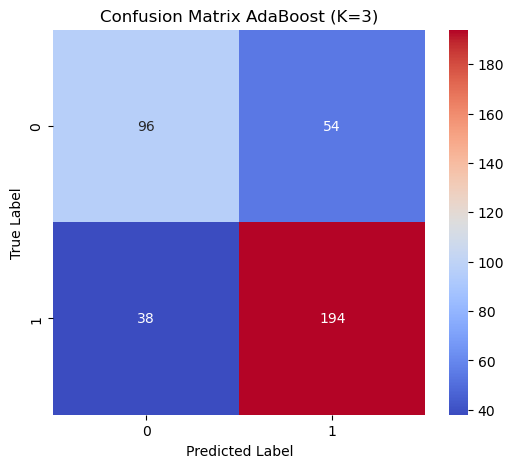


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

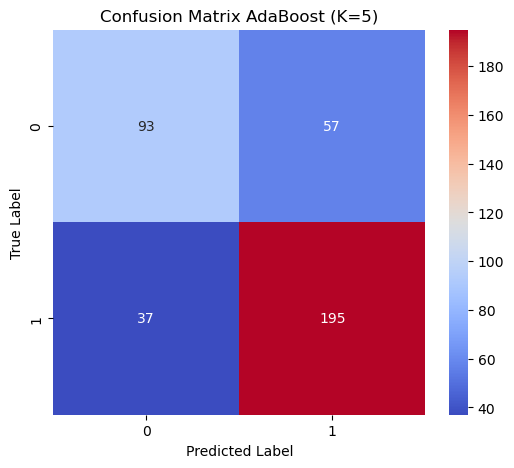

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

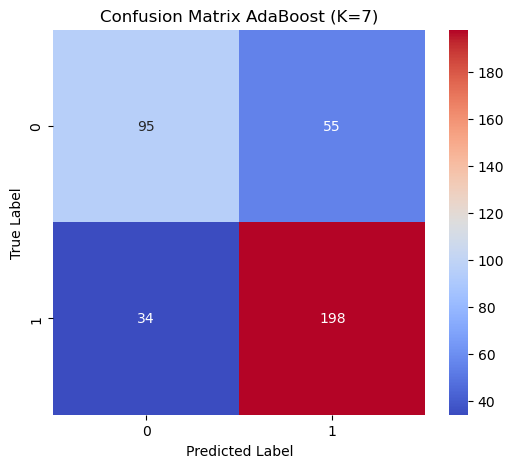

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

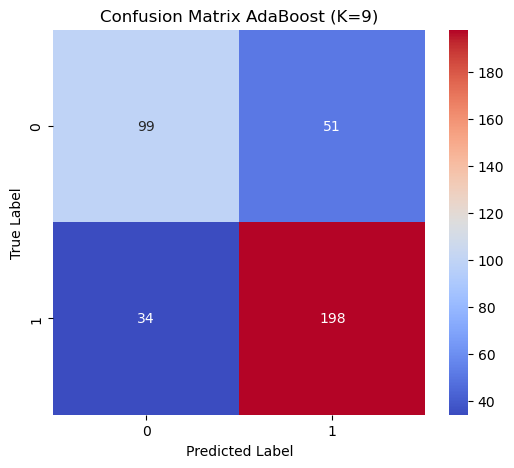


Evaluasi Gradient Boosting dengan K=3


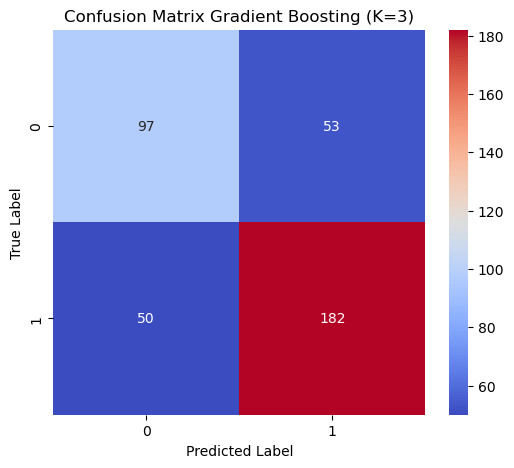


Evaluasi Gradient Boosting dengan K=5


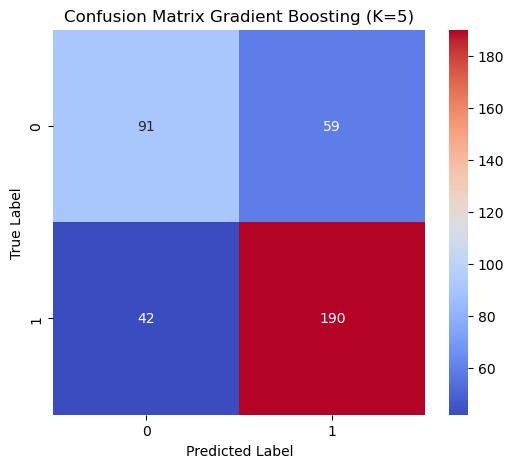


Evaluasi Gradient Boosting dengan K=7


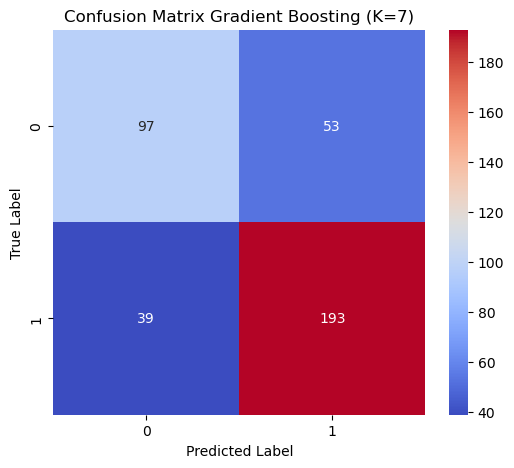


Evaluasi Gradient Boosting dengan K=9


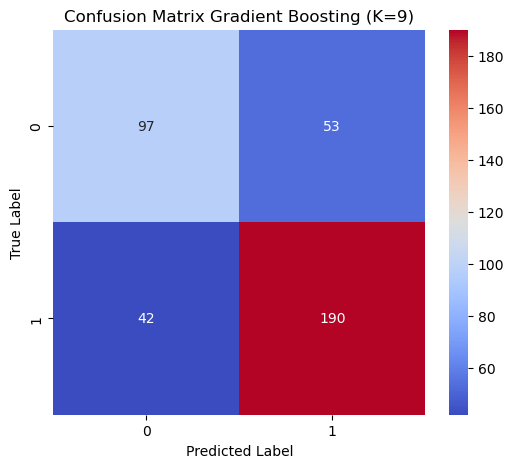


Jumlah data untuk tiap kelas:
0    150
1    232
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   75.92%    74.93%  73.81%   74.22%
1           AdaBoost  5   75.39%    74.46%  73.03%   73.50%
2           AdaBoost  7   76.70%    75.95%  74.34%   74.87%
3           AdaBoost  9   77.75%    76.98%  75.67%   76.15%
4  Gradient Boosting  3   73.04%    71.72%  71.56%   71.63%
5  Gradient Boosting  5   73.56%    72.36%  71.28%   71.66%
6  Gradient Boosting  7   75.92%    74.89%  73.93%   74.29%
7  Gradient Boosting  9   75.13%    73.99%  73.28%   73.56%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,75.92%,74.93%,73.81%,74.22%
1,AdaBoost,5,75.39%,74.46%,73.03%,73.50%
2,AdaBoost,7,76.70%,75.95%,74.34%,74.87%
3,AdaBoost,9,77.75%,76.98%,75.67%,76.15%
4,Gradient Boosting,3,73.04%,71.72%,71.56%,71.63%
5,Gradient Boosting,5,73.56%,72.36%,71.28%,71.66%
6,Gradient Boosting,7,75.92%,74.89%,73.93%,74.29%
7,Gradient Boosting,9,75.13%,73.99%,73.28%,73.56%


In [90]:
no_balancing(df_kuantitas_fitur_16)



#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


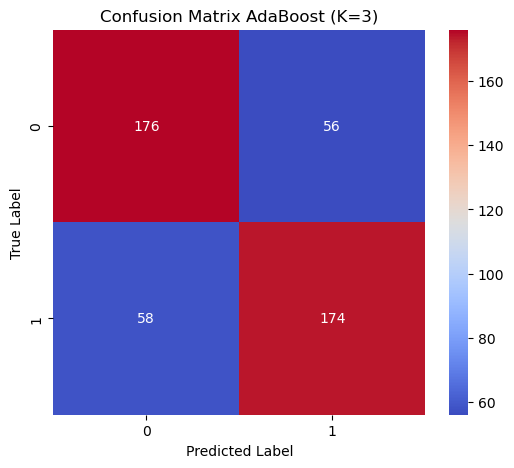


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

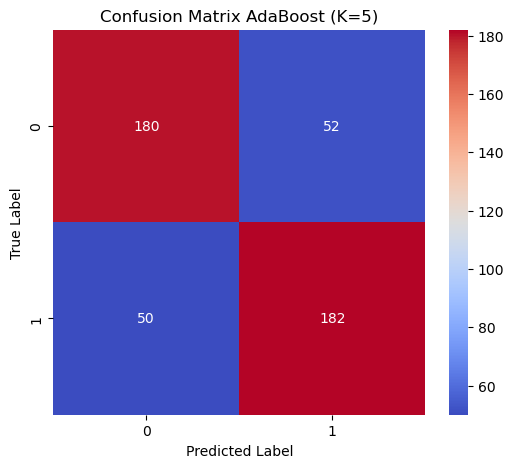

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

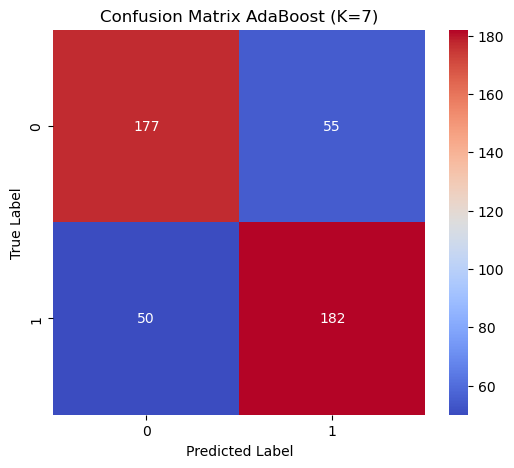


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

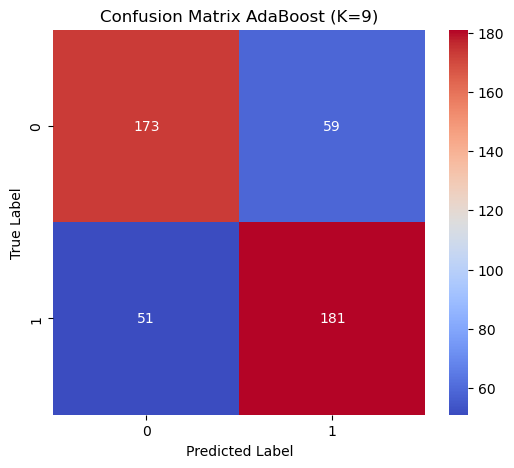


Evaluasi Gradient Boosting dengan K=3


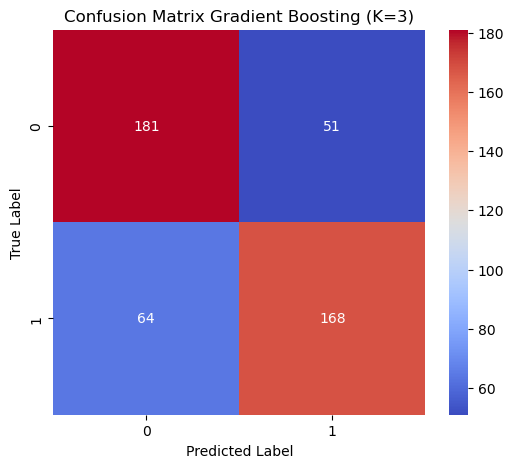


Evaluasi Gradient Boosting dengan K=5


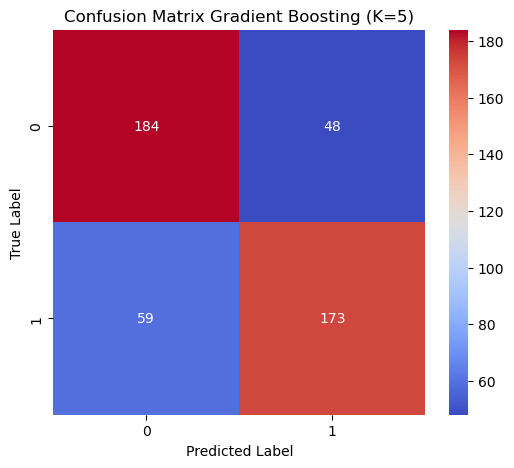


Evaluasi Gradient Boosting dengan K=7


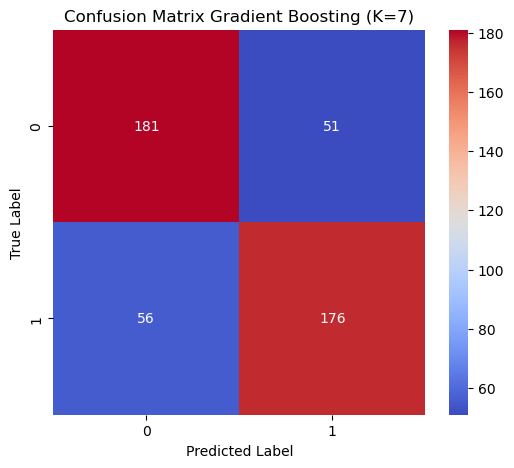


Evaluasi Gradient Boosting dengan K=9


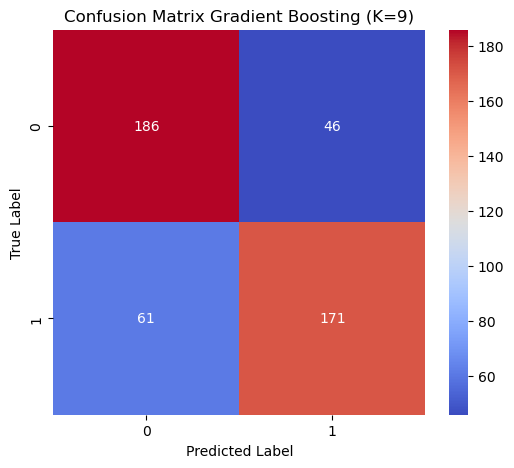


Jumlah data per kelas setelah SMOTE:
1    232
0    232
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   75.43%    75.43%  75.43%   75.43%
1           AdaBoost  5   78.02%    78.02%  78.02%   78.02%
2           AdaBoost  7   77.37%    77.38%  77.37%   77.37%
3           AdaBoost  9   76.29%    76.32%  76.29%   76.29%
4  Gradient Boosting  3   75.22%    75.29%  75.22%   75.20%
5  Gradient Boosting  5   76.94%    77.00%  76.94%   76.93%
6  Gradient Boosting  7   76.94%    76.95%  76.94%   76.94%
7  Gradient Boosting  9   76.94%    77.05%  76.94%   76.92%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,75.43%,75.43%,75.43%,75.43%
1,AdaBoost,5,78.02%,78.02%,78.02%,78.02%
2,AdaBoost,7,77.37%,77.38%,77.37%,77.37%
3,AdaBoost,9,76.29%,76.32%,76.29%,76.29%
4,Gradient Boosting,3,75.22%,75.29%,75.22%,75.20%
5,Gradient Boosting,5,76.94%,77.00%,76.94%,76.93%
6,Gradient Boosting,7,76.94%,76.95%,76.94%,76.94%
7,Gradient Boosting,9,76.94%,77.05%,76.94%,76.92%


In [91]:
balancing(df_kuantitas_fitur_16)

# 20 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


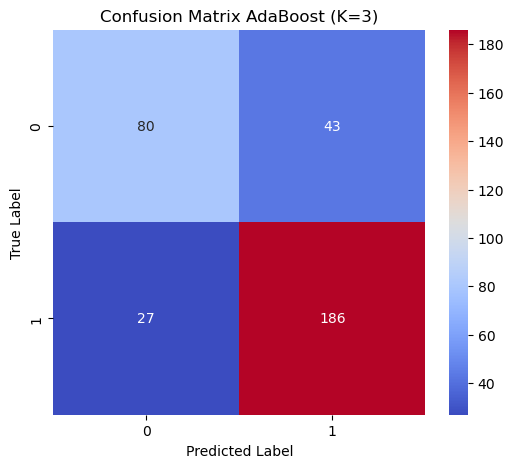


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

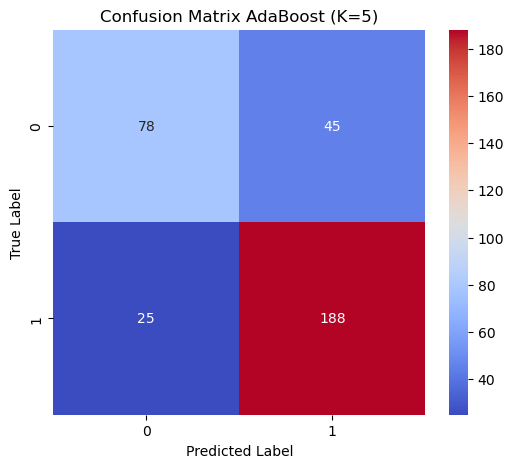


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

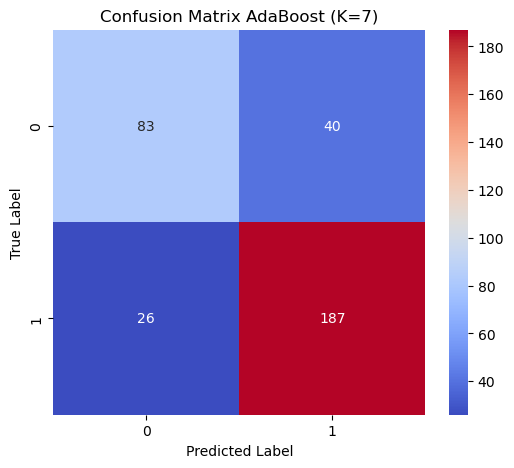


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

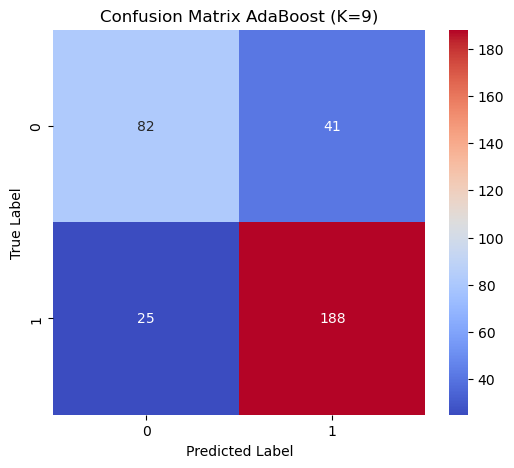


Evaluasi Gradient Boosting dengan K=3


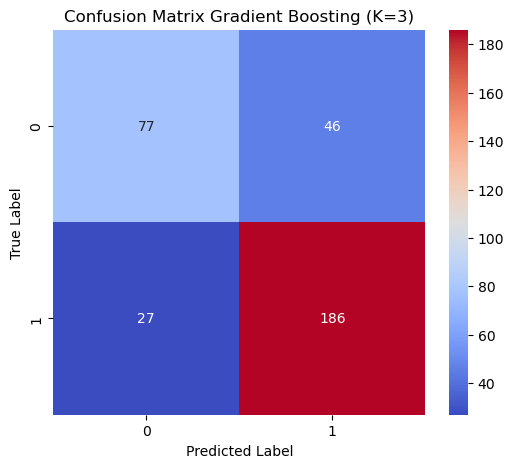


Evaluasi Gradient Boosting dengan K=5


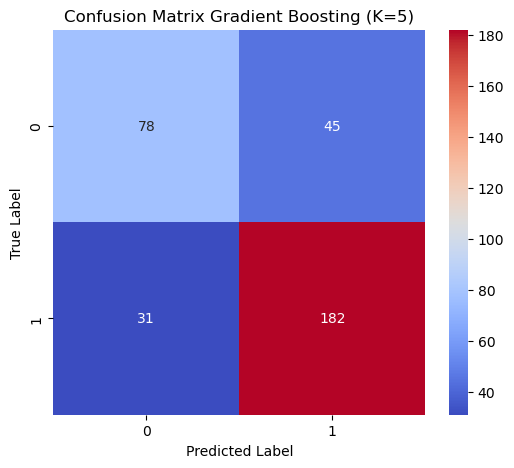


Evaluasi Gradient Boosting dengan K=7


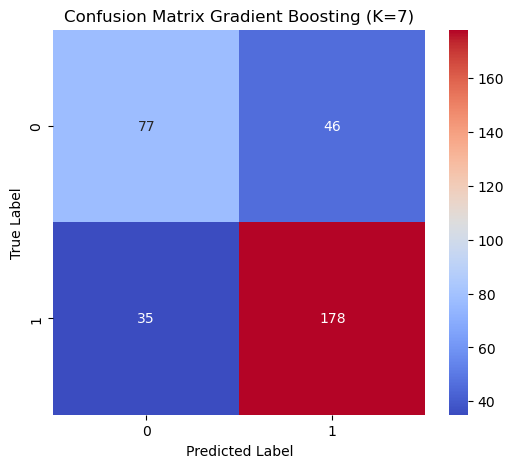


Evaluasi Gradient Boosting dengan K=9


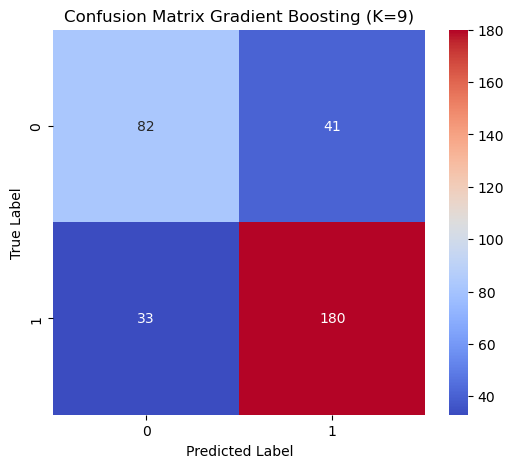


Jumlah data untuk tiap kelas:
0    123
1    213
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.17%    77.99%  76.18%   76.86%
1           AdaBoost  5   79.17%    78.21%  75.84%   76.67%
2           AdaBoost  7   80.36%    79.26%  77.64%   78.28%
3           AdaBoost  9   80.36%    79.37%  77.46%   78.19%
4  Gradient Boosting  3   78.27%    77.11%  74.96%   75.72%
5  Gradient Boosting  5   77.38%    75.87%  74.43%   74.98%
6  Gradient Boosting  7   75.89%    74.11%  73.08%   73.50%
7  Gradient Boosting  9   77.98%    76.38%  75.59%   75.93%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.17%,77.99%,76.18%,76.86%
1,AdaBoost,5,79.17%,78.21%,75.84%,76.67%
2,AdaBoost,7,80.36%,79.26%,77.64%,78.28%
3,AdaBoost,9,80.36%,79.37%,77.46%,78.19%
4,Gradient Boosting,3,78.27%,77.11%,74.96%,75.72%
5,Gradient Boosting,5,77.38%,75.87%,74.43%,74.98%
6,Gradient Boosting,7,75.89%,74.11%,73.08%,73.50%
7,Gradient Boosting,9,77.98%,76.38%,75.59%,75.93%


In [92]:
no_balancing(df_kualitas_fitur_20)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


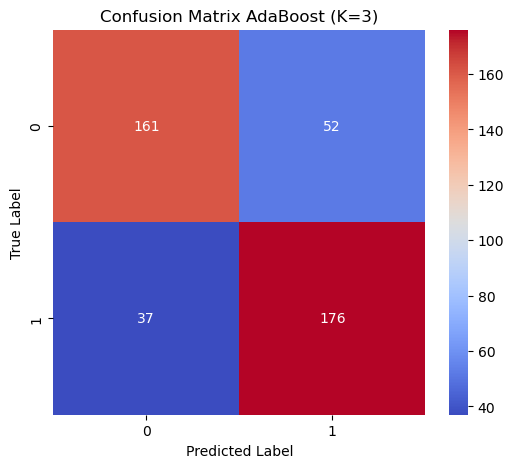


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

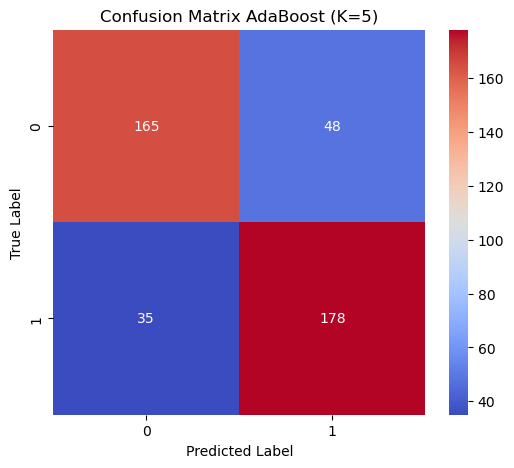

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

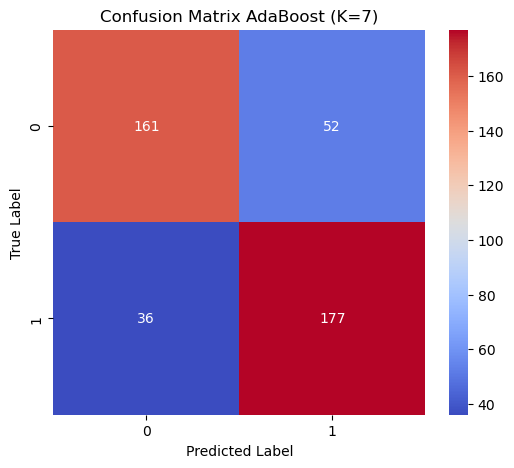


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

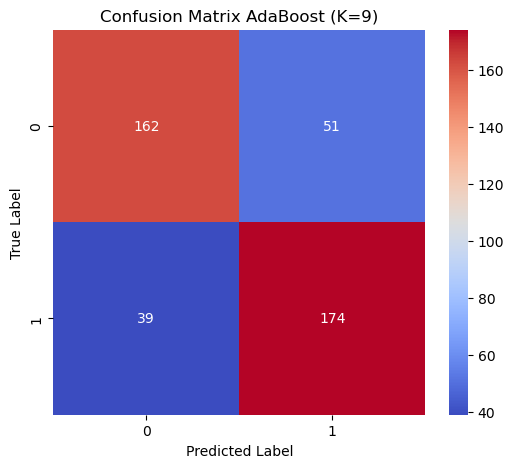


Evaluasi Gradient Boosting dengan K=3


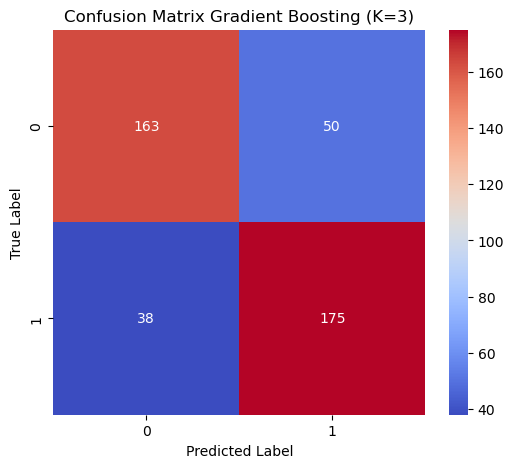


Evaluasi Gradient Boosting dengan K=5


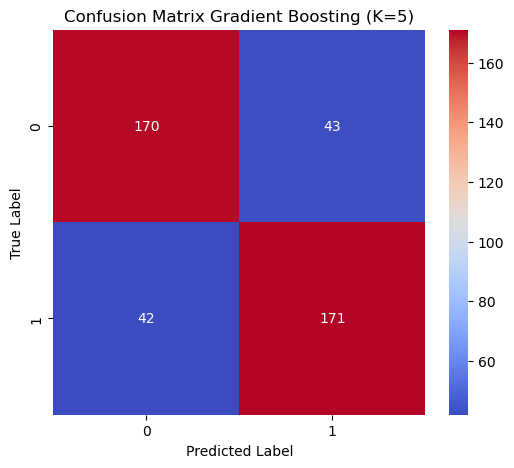


Evaluasi Gradient Boosting dengan K=7


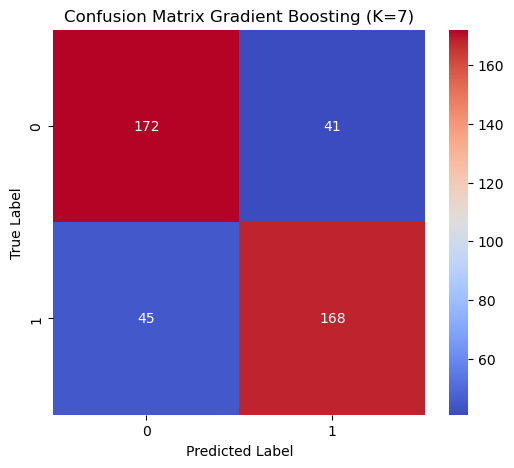


Evaluasi Gradient Boosting dengan K=9


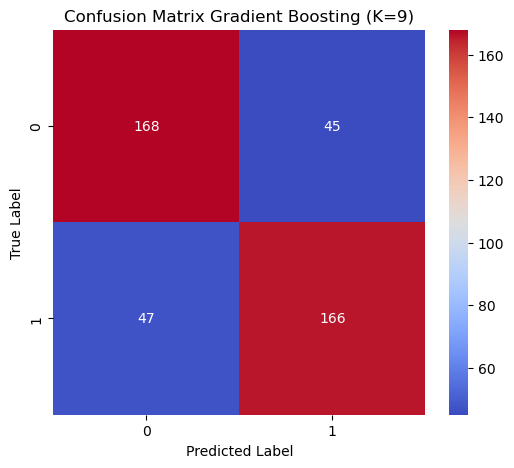


Jumlah data per kelas setelah SMOTE:
1    213
0    213
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.11%    79.25%  79.11%   79.08%
1           AdaBoost  5   80.52%    80.63%  80.52%   80.50%
2           AdaBoost  7   79.34%    79.51%  79.34%   79.31%
3           AdaBoost  9   78.87%    78.97%  78.87%   78.86%
4  Gradient Boosting  3   79.34%    79.44%  79.34%   79.33%
5  Gradient Boosting  5   80.05%    80.05%  80.05%   80.05%
6  Gradient Boosting  7   79.81%    79.82%  79.81%   79.81%
7  Gradient Boosting  9   78.40%    78.41%  78.40%   78.40%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.11%,79.25%,79.11%,79.08%
1,AdaBoost,5,80.52%,80.63%,80.52%,80.50%
2,AdaBoost,7,79.34%,79.51%,79.34%,79.31%
3,AdaBoost,9,78.87%,78.97%,78.87%,78.86%
4,Gradient Boosting,3,79.34%,79.44%,79.34%,79.33%
5,Gradient Boosting,5,80.05%,80.05%,80.05%,80.05%
6,Gradient Boosting,7,79.81%,79.82%,79.81%,79.81%
7,Gradient Boosting,9,78.40%,78.41%,78.40%,78.40%


In [93]:
balancing(df_kualitas_fitur_20)

# 20 fitur Terbaik Kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


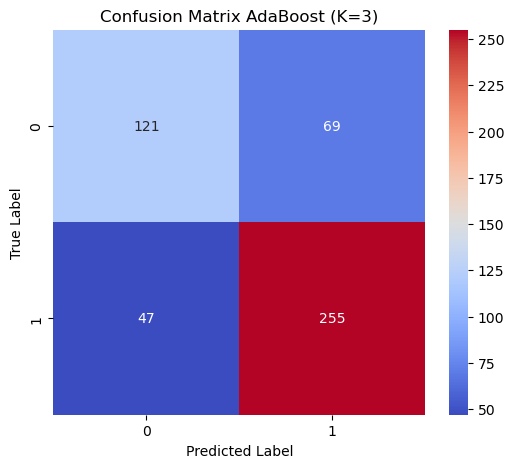


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

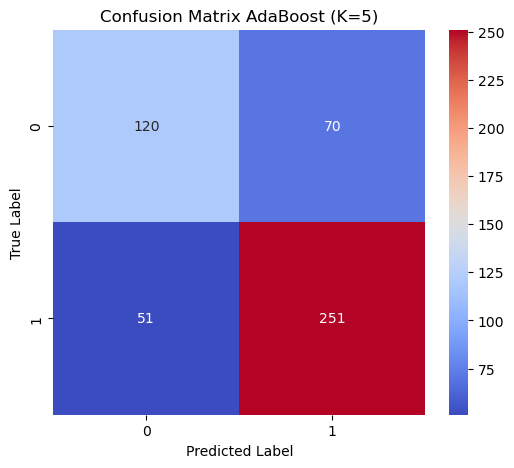


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

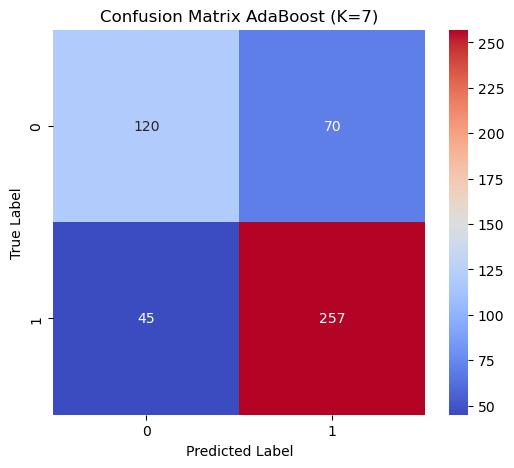


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

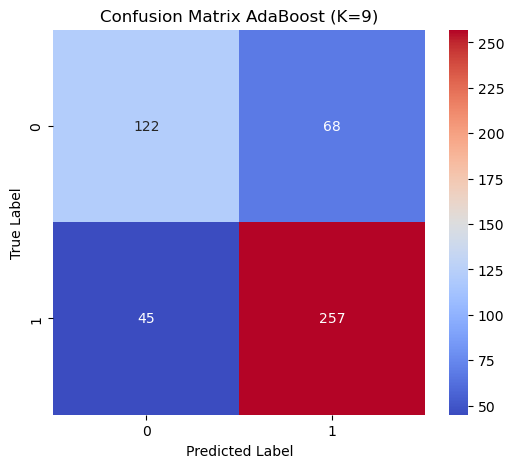


Evaluasi Gradient Boosting dengan K=3


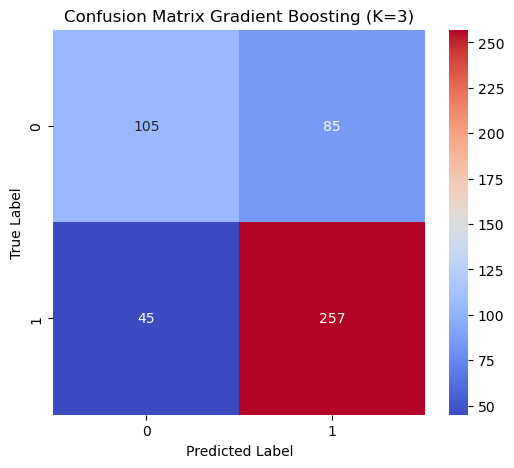


Evaluasi Gradient Boosting dengan K=5


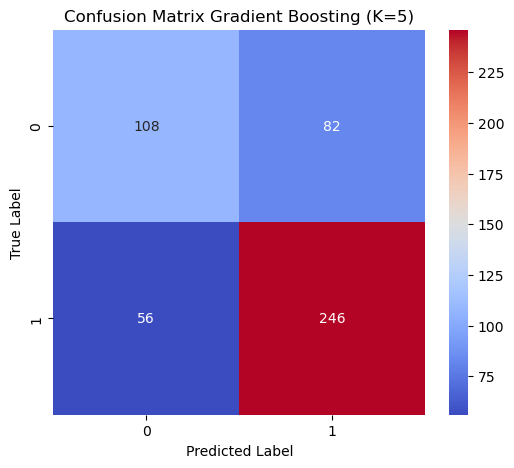


Evaluasi Gradient Boosting dengan K=7


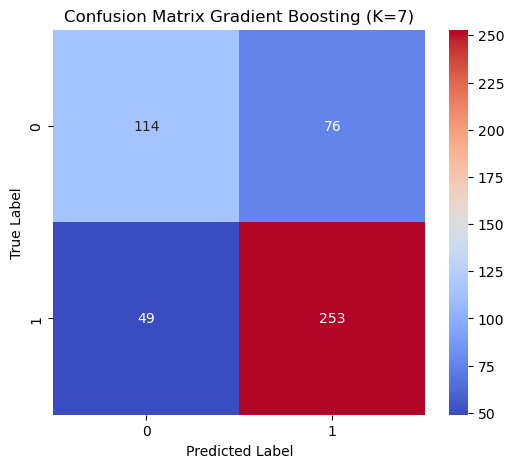


Evaluasi Gradient Boosting dengan K=9


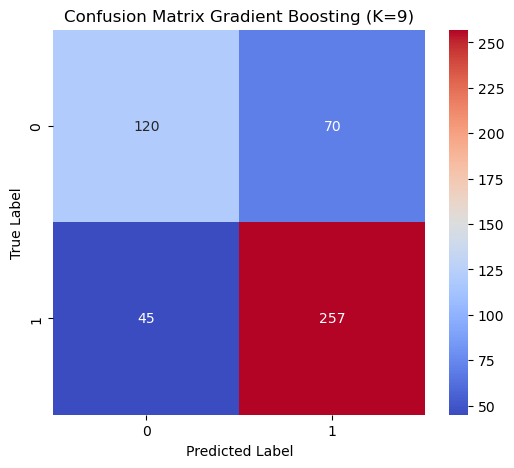


Jumlah data untuk tiap kelas:
0    190
1    302
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   76.42%    75.36%  74.06%   74.53%
1           AdaBoost  5   75.41%    74.18%  73.14%   73.53%
2           AdaBoost  7   76.63%    75.66%  74.13%   74.66%
3           AdaBoost  9   77.03%    76.07%  74.65%   75.16%
4  Gradient Boosting  3   73.58%    72.57%  70.18%   70.79%
5  Gradient Boosting  5   71.95%    70.43%  69.15%   69.56%
6  Gradient Boosting  7   74.59%    73.42%  71.89%   72.39%
7  Gradient Boosting  9   76.63%    75.66%  74.13%   74.66%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,76.42%,75.36%,74.06%,74.53%
1,AdaBoost,5,75.41%,74.18%,73.14%,73.53%
2,AdaBoost,7,76.63%,75.66%,74.13%,74.66%
3,AdaBoost,9,77.03%,76.07%,74.65%,75.16%
4,Gradient Boosting,3,73.58%,72.57%,70.18%,70.79%
5,Gradient Boosting,5,71.95%,70.43%,69.15%,69.56%
6,Gradient Boosting,7,74.59%,73.42%,71.89%,72.39%
7,Gradient Boosting,9,76.63%,75.66%,74.13%,74.66%


In [94]:
no_balancing(df_kuantitas_fitur_20)


#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


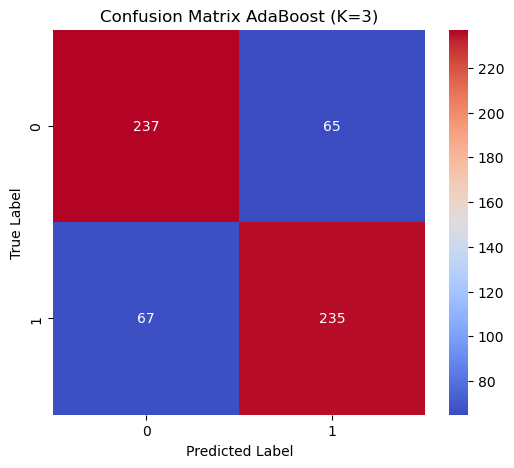


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

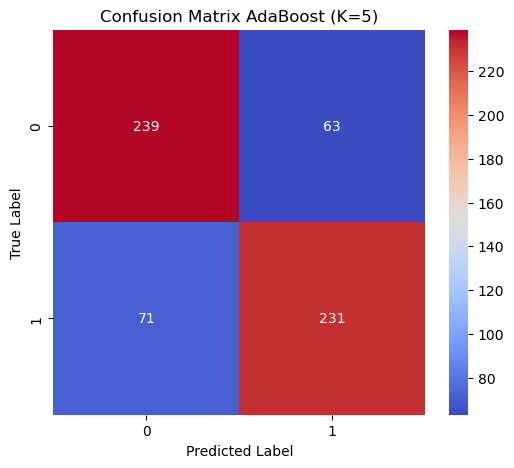

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

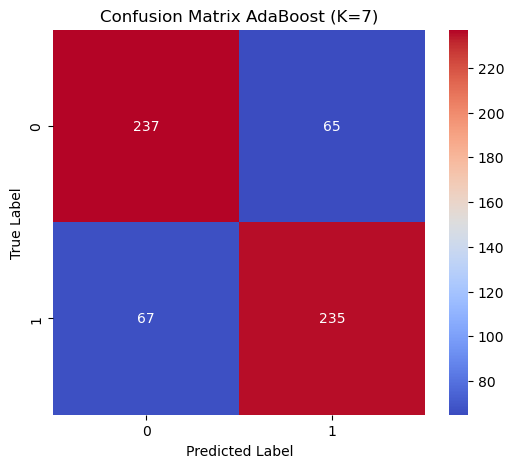

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

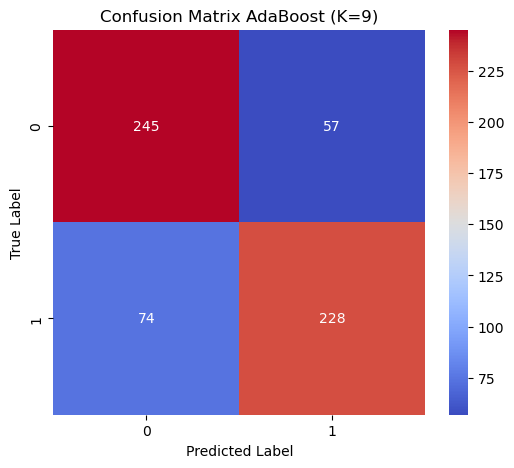


Evaluasi Gradient Boosting dengan K=3


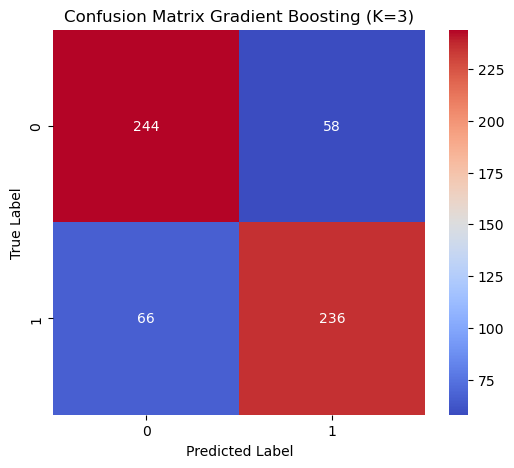


Evaluasi Gradient Boosting dengan K=5


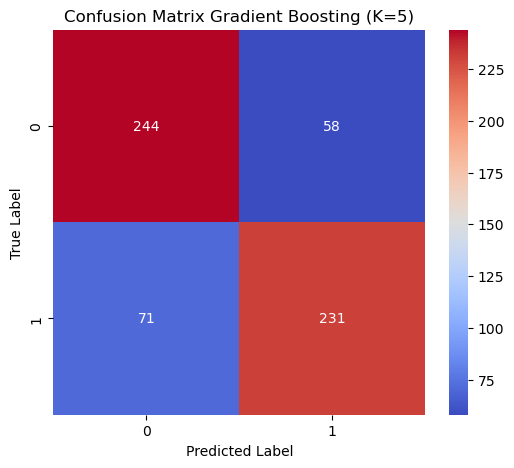


Evaluasi Gradient Boosting dengan K=7


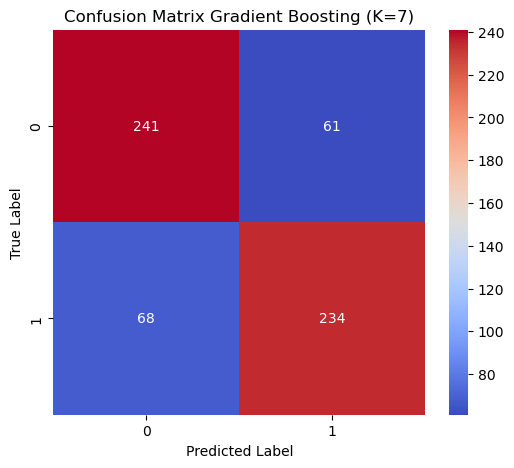


Evaluasi Gradient Boosting dengan K=9


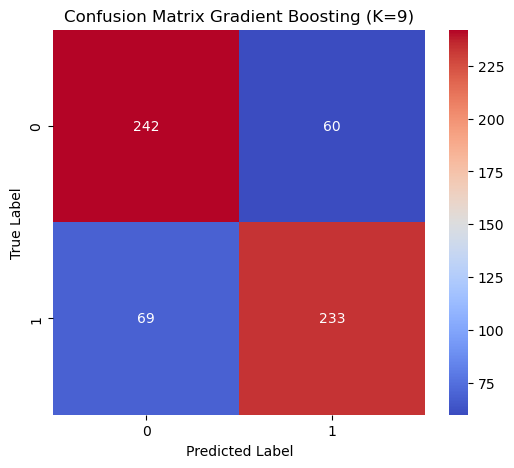


Jumlah data per kelas setelah SMOTE:
1    302
0    302
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   78.15%    78.15%  78.15%   78.15%
1           AdaBoost  5   77.81%    77.83%  77.81%   77.81%
2           AdaBoost  7   78.15%    78.15%  78.15%   78.15%
3           AdaBoost  9   78.31%    78.40%  78.31%   78.29%
4  Gradient Boosting  3   79.47%    79.49%  79.47%   79.47%
5  Gradient Boosting  5   78.64%    78.70%  78.64%   78.63%
6  Gradient Boosting  7   78.64%    78.66%  78.64%   78.64%
7  Gradient Boosting  9   78.64%    78.67%  78.64%   78.64%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,78.15%,78.15%,78.15%,78.15%
1,AdaBoost,5,77.81%,77.83%,77.81%,77.81%
2,AdaBoost,7,78.15%,78.15%,78.15%,78.15%
3,AdaBoost,9,78.31%,78.40%,78.31%,78.29%
4,Gradient Boosting,3,79.47%,79.49%,79.47%,79.47%
5,Gradient Boosting,5,78.64%,78.70%,78.64%,78.63%
6,Gradient Boosting,7,78.64%,78.66%,78.64%,78.64%
7,Gradient Boosting,9,78.64%,78.67%,78.64%,78.64%


In [95]:
balancing(df_kuantitas_fitur_20)

# 24 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


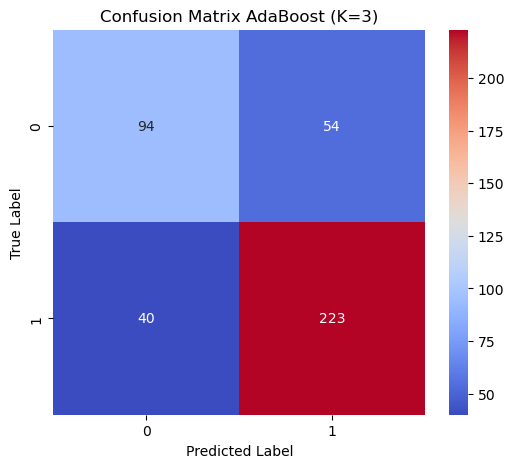


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

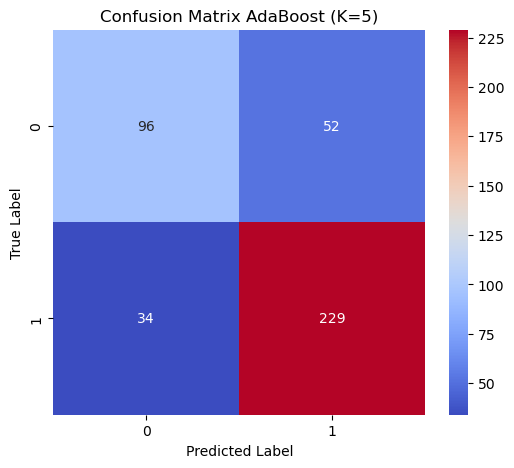

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

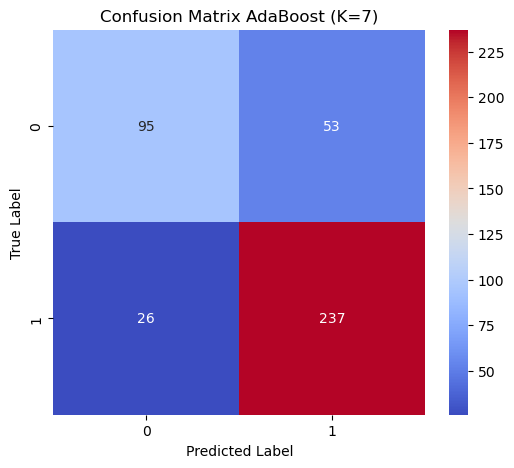


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

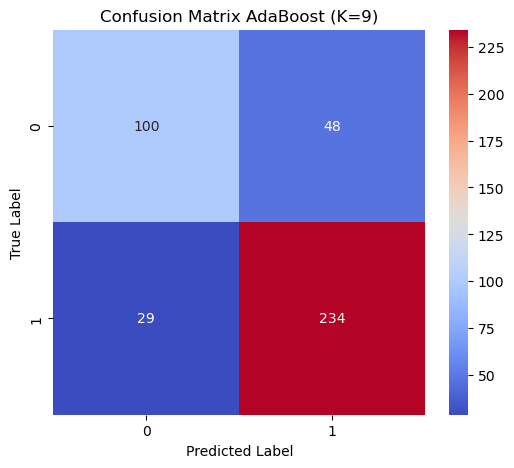


Evaluasi Gradient Boosting dengan K=3


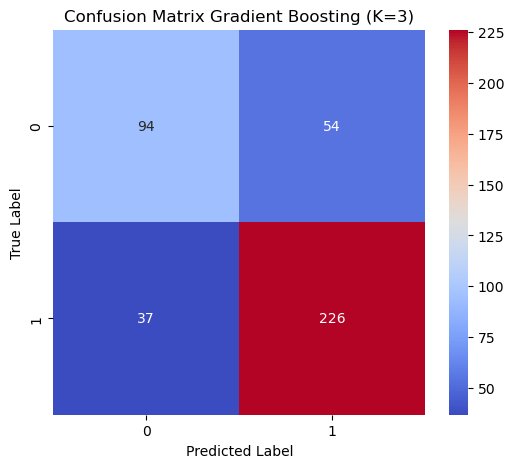


Evaluasi Gradient Boosting dengan K=5


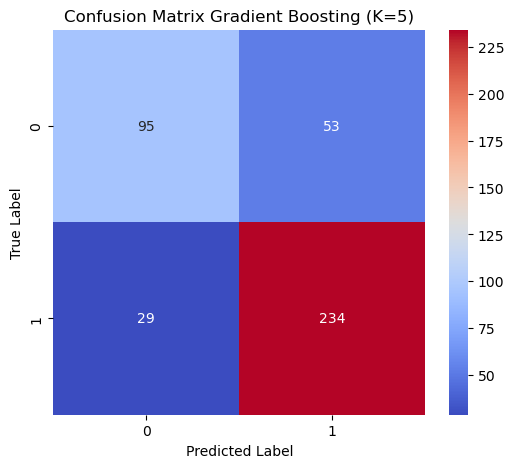


Evaluasi Gradient Boosting dengan K=7


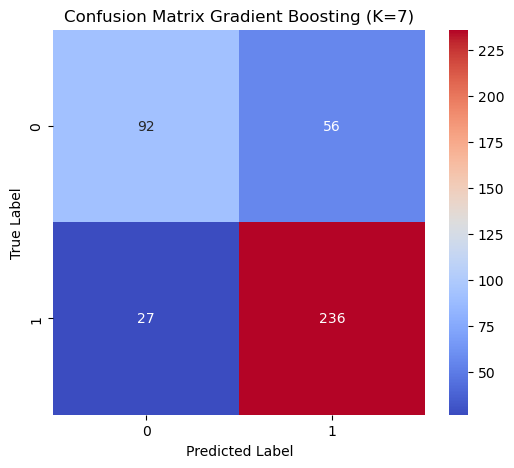


Evaluasi Gradient Boosting dengan K=9


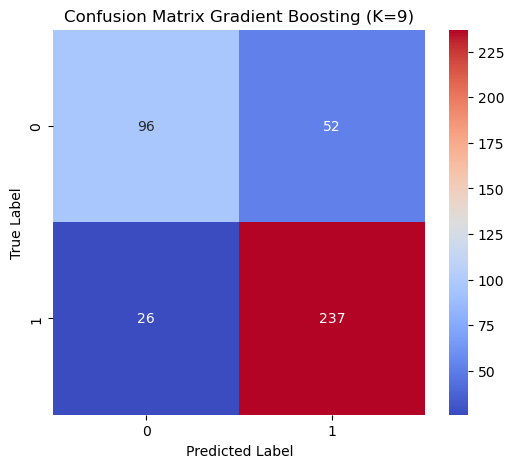


Jumlah data untuk tiap kelas:
0    148
1    263
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   77.13%    75.33%  74.15%   74.63%
1           AdaBoost  5   79.08%    77.67%  75.97%   76.63%
2           AdaBoost  7   80.78%    80.12%  77.15%   78.17%
3           AdaBoost  9   81.27%    80.25%  78.27%   79.04%
4  Gradient Boosting  3   77.86%    76.24%  74.72%   75.31%
5  Gradient Boosting  5   80.05%    79.07%  76.58%   77.47%
6  Gradient Boosting  7   79.81%    79.07%  75.95%   76.98%
7  Gradient Boosting  9   81.02%    80.35%  77.49%   78.49%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,77.13%,75.33%,74.15%,74.63%
1,AdaBoost,5,79.08%,77.67%,75.97%,76.63%
2,AdaBoost,7,80.78%,80.12%,77.15%,78.17%
3,AdaBoost,9,81.27%,80.25%,78.27%,79.04%
4,Gradient Boosting,3,77.86%,76.24%,74.72%,75.31%
5,Gradient Boosting,5,80.05%,79.07%,76.58%,77.47%
6,Gradient Boosting,7,79.81%,79.07%,75.95%,76.98%
7,Gradient Boosting,9,81.02%,80.35%,77.49%,78.49%


In [96]:
no_balancing(df_kualitas_fitur_24)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


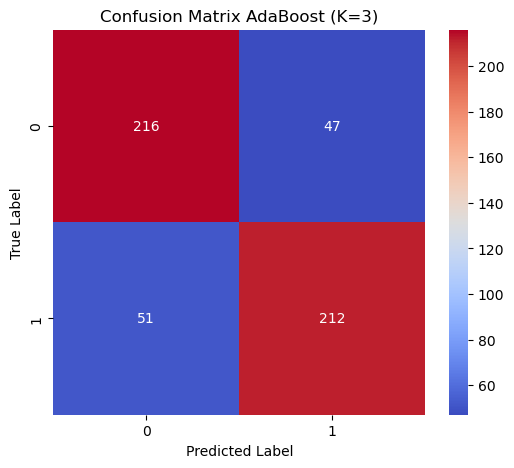


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

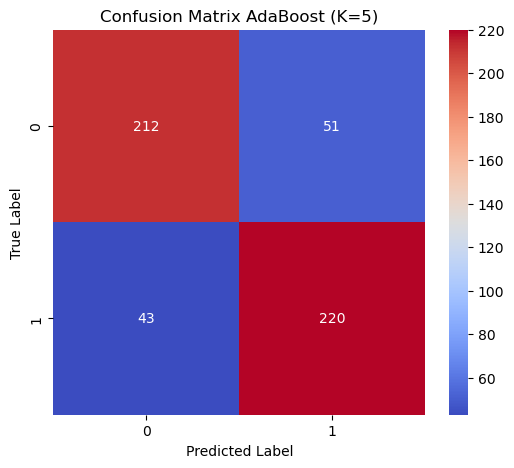

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

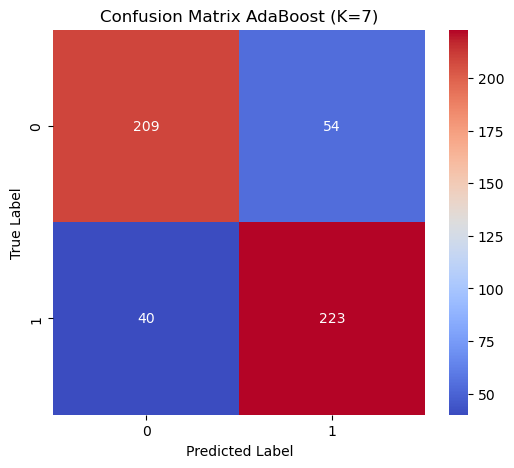

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

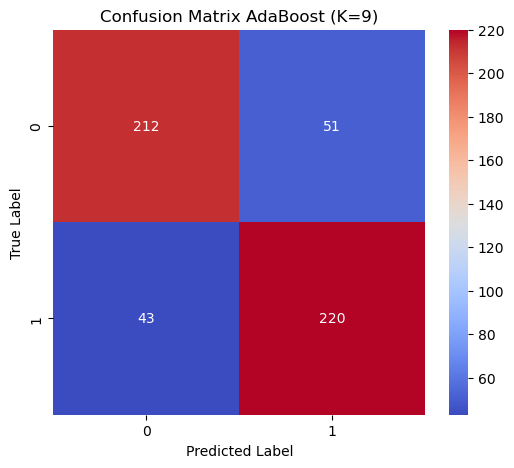


Evaluasi Gradient Boosting dengan K=3


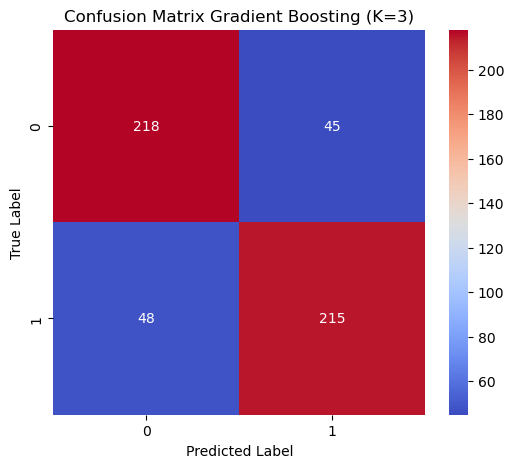


Evaluasi Gradient Boosting dengan K=5


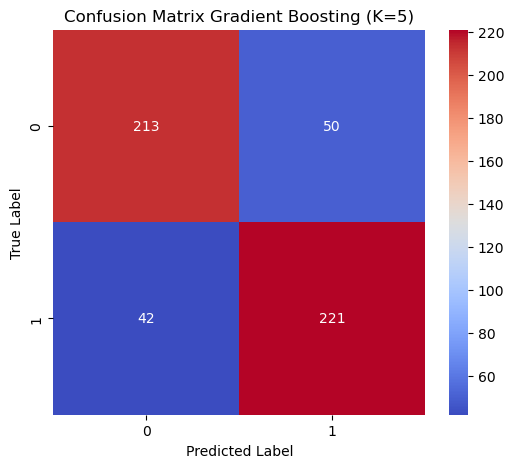


Evaluasi Gradient Boosting dengan K=7


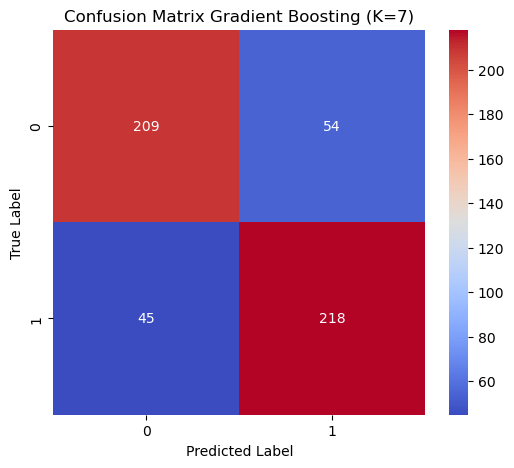


Evaluasi Gradient Boosting dengan K=9


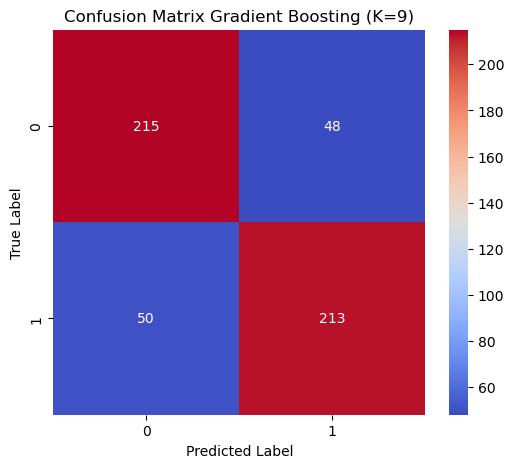


Jumlah data per kelas setelah SMOTE:
1    263
0    263
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   81.37%    81.38%  81.37%   81.37%
1           AdaBoost  5   82.13%    82.16%  82.13%   82.13%
2           AdaBoost  7   82.13%    82.22%  82.13%   82.12%
3           AdaBoost  9   82.13%    82.16%  82.13%   82.13%
4  Gradient Boosting  3   82.32%    82.32%  82.32%   82.32%
5  Gradient Boosting  5   82.51%    82.54%  82.51%   82.51%
6  Gradient Boosting  7   81.18%    81.22%  81.18%   81.17%
7  Gradient Boosting  9   81.37%    81.37%  81.37%   81.37%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,81.37%,81.38%,81.37%,81.37%
1,AdaBoost,5,82.13%,82.16%,82.13%,82.13%
2,AdaBoost,7,82.13%,82.22%,82.13%,82.12%
3,AdaBoost,9,82.13%,82.16%,82.13%,82.13%
4,Gradient Boosting,3,82.32%,82.32%,82.32%,82.32%
5,Gradient Boosting,5,82.51%,82.54%,82.51%,82.51%
6,Gradient Boosting,7,81.18%,81.22%,81.18%,81.17%
7,Gradient Boosting,9,81.37%,81.37%,81.37%,81.37%


In [97]:
balancing(df_kualitas_fitur_24)


# 24 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


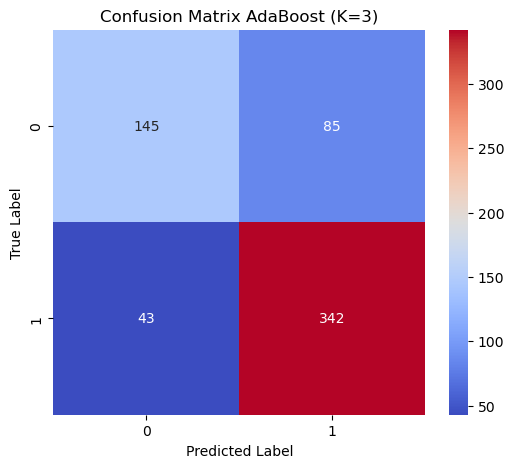


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

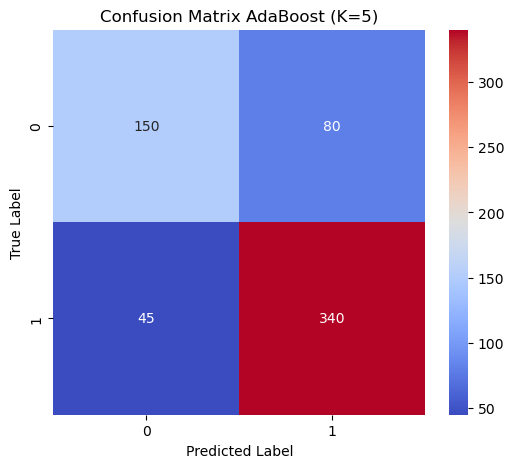

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

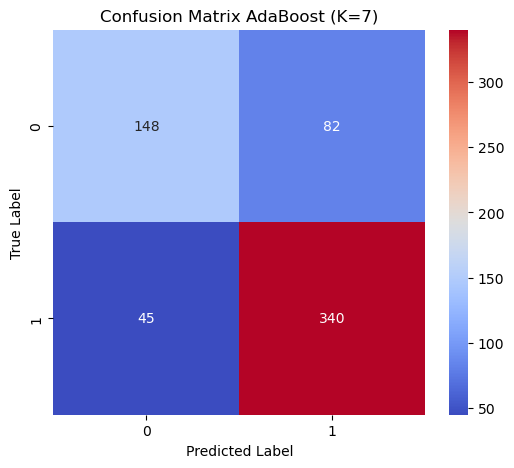


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

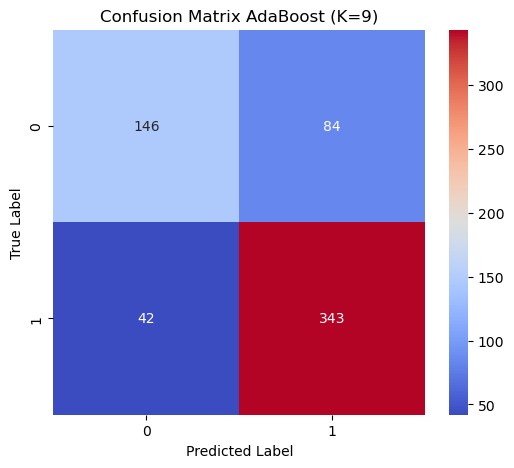


Evaluasi Gradient Boosting dengan K=3


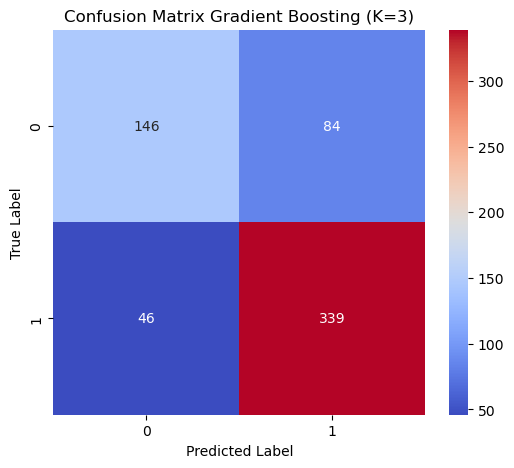


Evaluasi Gradient Boosting dengan K=5


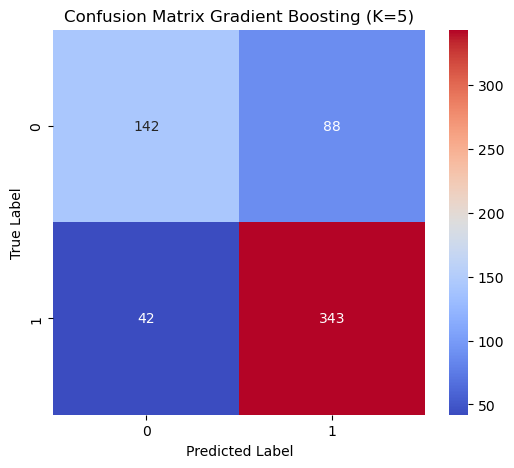


Evaluasi Gradient Boosting dengan K=7


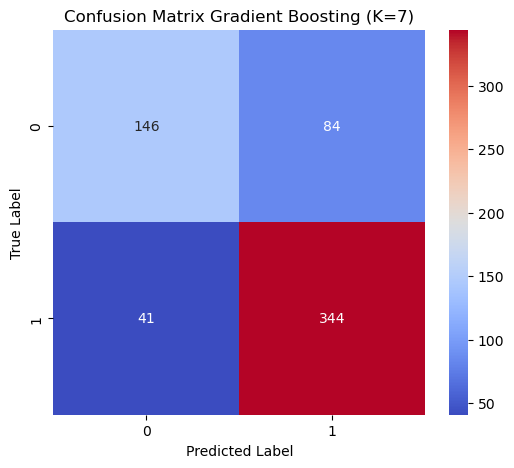


Evaluasi Gradient Boosting dengan K=9


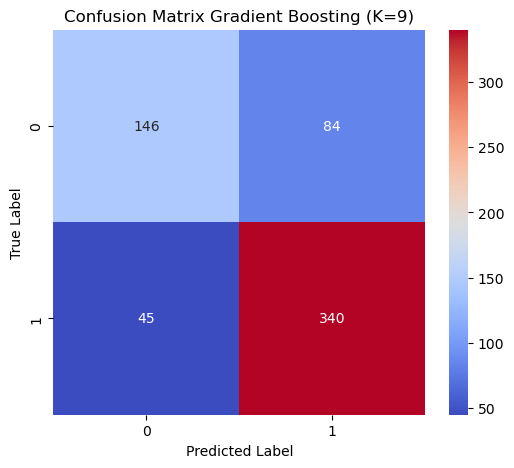


Jumlah data untuk tiap kelas:
0    230
1    385
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.19%    78.61%  75.94%   76.81%
1           AdaBoost  5   79.67%    78.94%  76.76%   77.53%
2           AdaBoost  7   79.35%    78.63%  76.33%   77.12%
3           AdaBoost  9   79.51%    78.99%  76.28%   77.17%
4  Gradient Boosting  3   78.86%    78.09%  75.77%   76.55%
5  Gradient Boosting  5   78.86%    78.38%  75.42%   76.33%
6  Gradient Boosting  7   79.67%    79.22%  76.41%   77.32%
7  Gradient Boosting  9   79.02%    78.31%  75.89%   76.71%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.19%,78.61%,75.94%,76.81%
1,AdaBoost,5,79.67%,78.94%,76.76%,77.53%
2,AdaBoost,7,79.35%,78.63%,76.33%,77.12%
3,AdaBoost,9,79.51%,78.99%,76.28%,77.17%
4,Gradient Boosting,3,78.86%,78.09%,75.77%,76.55%
5,Gradient Boosting,5,78.86%,78.38%,75.42%,76.33%
6,Gradient Boosting,7,79.67%,79.22%,76.41%,77.32%
7,Gradient Boosting,9,79.02%,78.31%,75.89%,76.71%


In [98]:
no_balancing(df_kuantitas_fitur_24)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


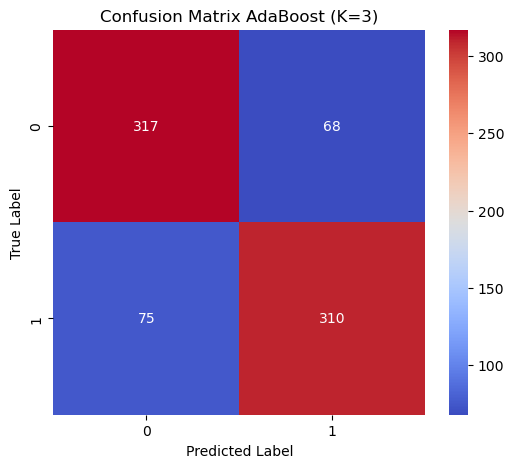


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

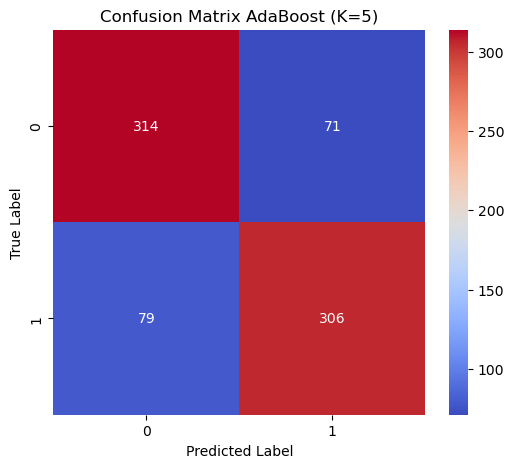

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

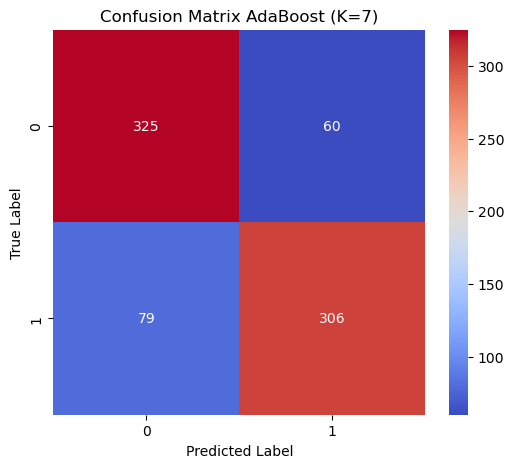


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

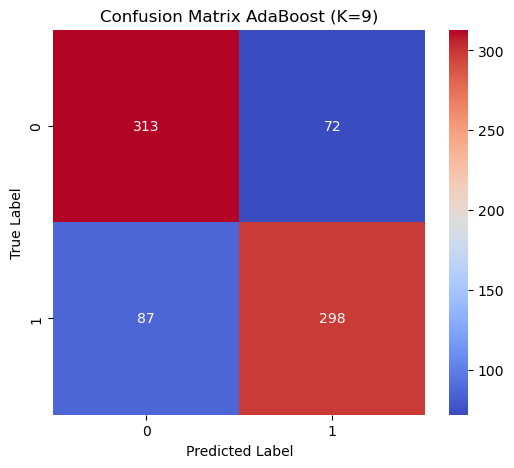


Evaluasi Gradient Boosting dengan K=3


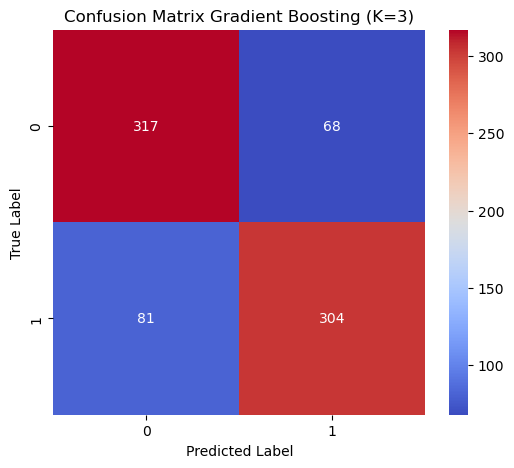


Evaluasi Gradient Boosting dengan K=5


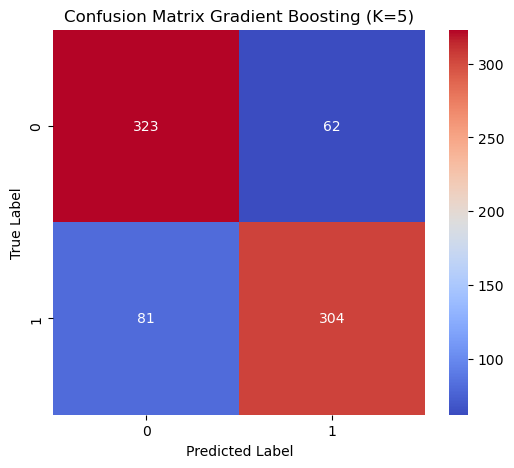


Evaluasi Gradient Boosting dengan K=7


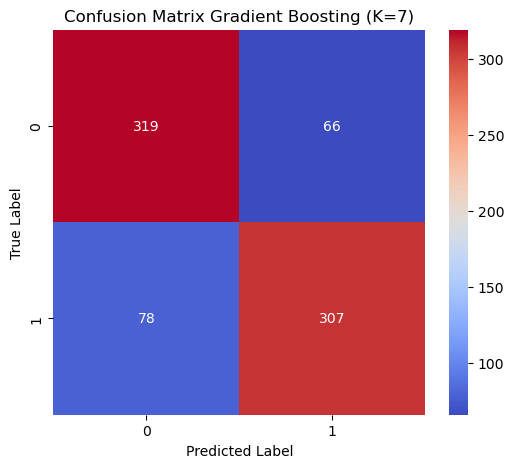


Evaluasi Gradient Boosting dengan K=9


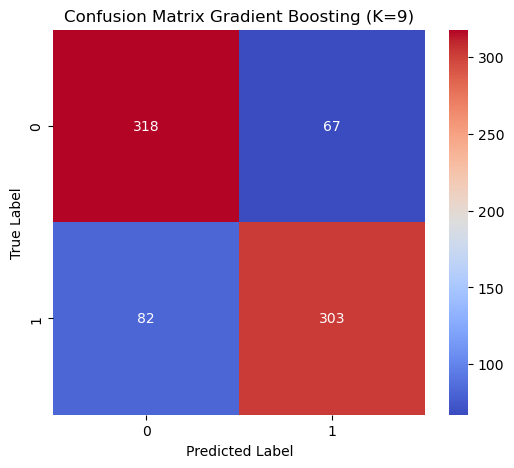


Jumlah data per kelas setelah SMOTE:
1    385
0    385
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   81.43%    81.44%  81.43%   81.43%
1           AdaBoost  5   80.52%    80.53%  80.52%   80.52%
2           AdaBoost  7   81.95%    82.03%  81.95%   81.94%
3           AdaBoost  9   79.35%    79.40%  79.35%   79.34%
4  Gradient Boosting  3   80.65%    80.68%  80.65%   80.64%
5  Gradient Boosting  5   81.43%    81.51%  81.43%   81.42%
6  Gradient Boosting  7   81.30%    81.33%  81.30%   81.29%
7  Gradient Boosting  9   80.65%    80.70%  80.65%   80.64%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,81.43%,81.44%,81.43%,81.43%
1,AdaBoost,5,80.52%,80.53%,80.52%,80.52%
2,AdaBoost,7,81.95%,82.03%,81.95%,81.94%
3,AdaBoost,9,79.35%,79.40%,79.35%,79.34%
4,Gradient Boosting,3,80.65%,80.68%,80.65%,80.64%
5,Gradient Boosting,5,81.43%,81.51%,81.43%,81.42%
6,Gradient Boosting,7,81.30%,81.33%,81.30%,81.29%
7,Gradient Boosting,9,80.65%,80.70%,80.65%,80.64%


In [99]:
balancing(df_kuantitas_fitur_24)

# 28 fitur Terbaik Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


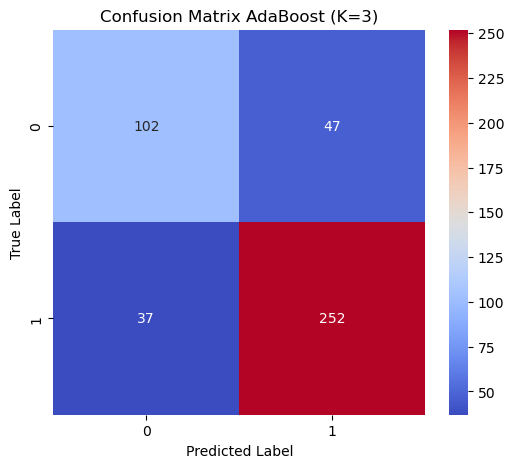


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

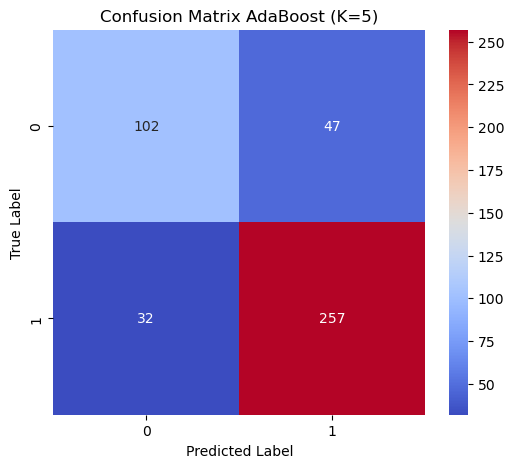

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

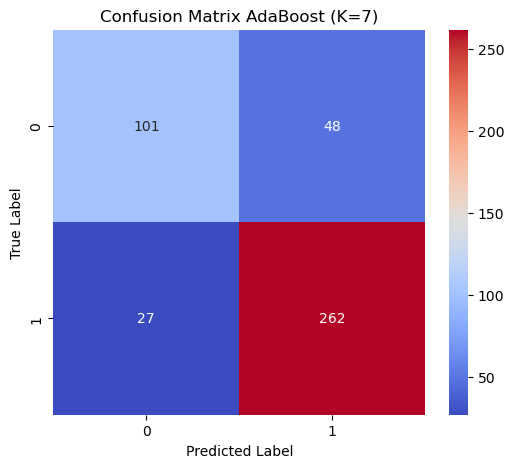


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

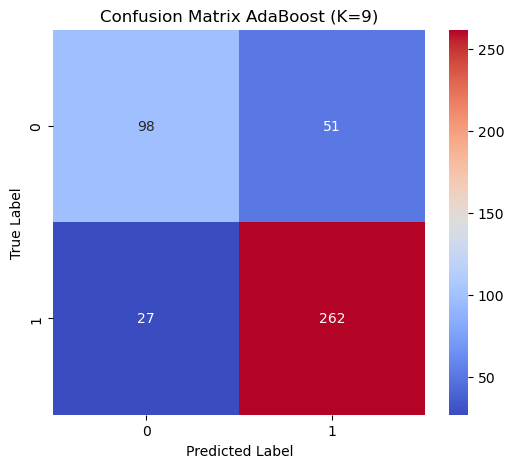


Evaluasi Gradient Boosting dengan K=3


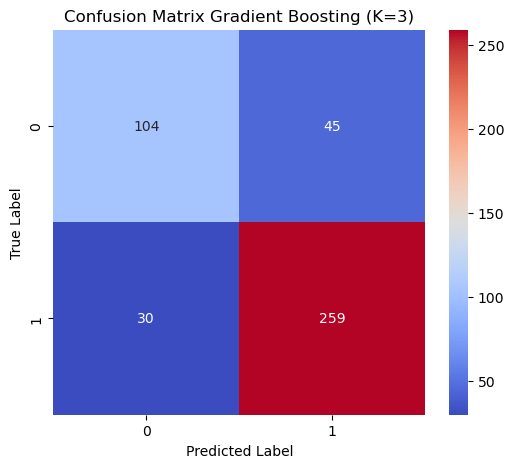


Evaluasi Gradient Boosting dengan K=5


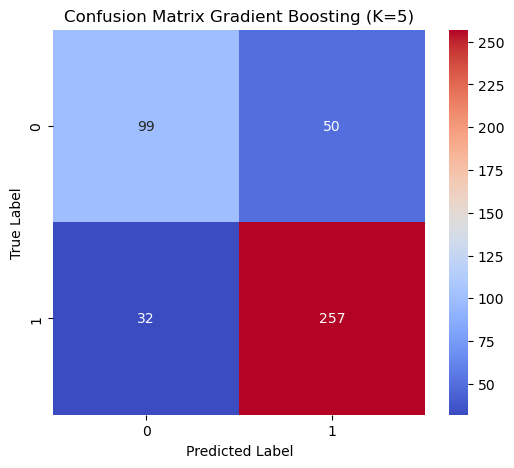


Evaluasi Gradient Boosting dengan K=7


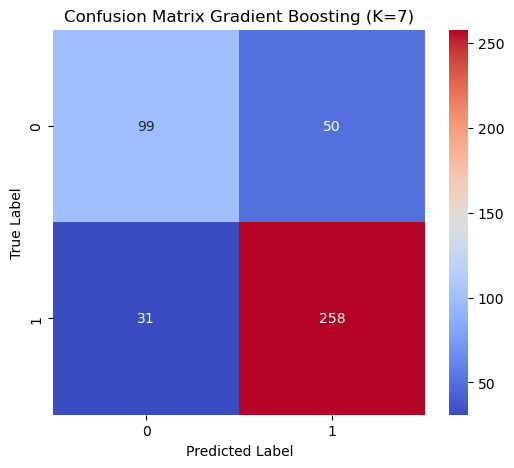


Evaluasi Gradient Boosting dengan K=9


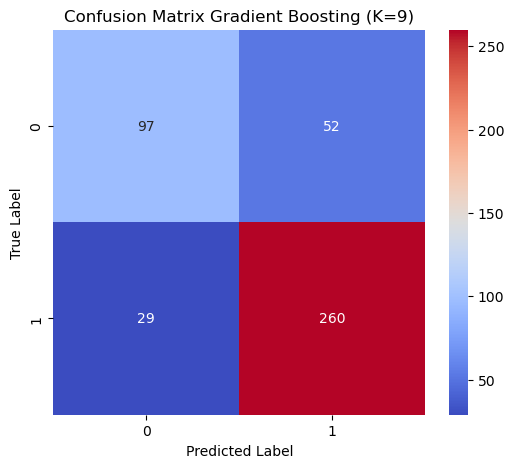


Jumlah data untuk tiap kelas:
0    149
1    289
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   80.82%    78.83%  77.83%   78.27%
1           AdaBoost  5   81.96%    80.33%  78.69%   79.38%
2           AdaBoost  7   82.88%    81.71%  79.22%   80.20%
3           AdaBoost  9   82.19%    81.05%  78.21%   79.29%
4  Gradient Boosting  3   82.88%    81.40%  79.71%   80.43%
5  Gradient Boosting  5   81.28%    79.64%  77.69%   78.48%
6  Gradient Boosting  7   81.51%    79.96%  77.86%   78.70%
7  Gradient Boosting  9   81.51%    80.16%  77.53%   78.53%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,80.82%,78.83%,77.83%,78.27%
1,AdaBoost,5,81.96%,80.33%,78.69%,79.38%
2,AdaBoost,7,82.88%,81.71%,79.22%,80.20%
3,AdaBoost,9,82.19%,81.05%,78.21%,79.29%
4,Gradient Boosting,3,82.88%,81.40%,79.71%,80.43%
5,Gradient Boosting,5,81.28%,79.64%,77.69%,78.48%
6,Gradient Boosting,7,81.51%,79.96%,77.86%,78.70%
7,Gradient Boosting,9,81.51%,80.16%,77.53%,78.53%


In [100]:
no_balancing(df_kualitas_fitur_28)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


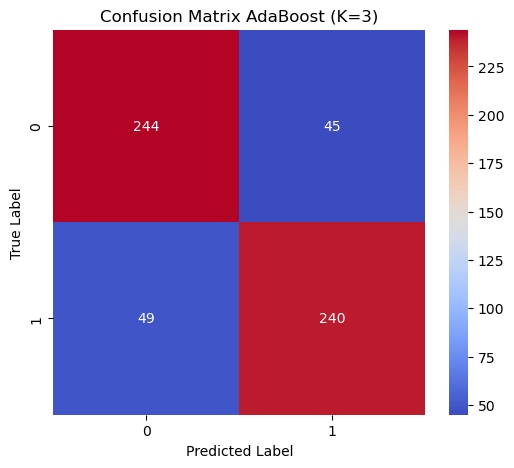


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

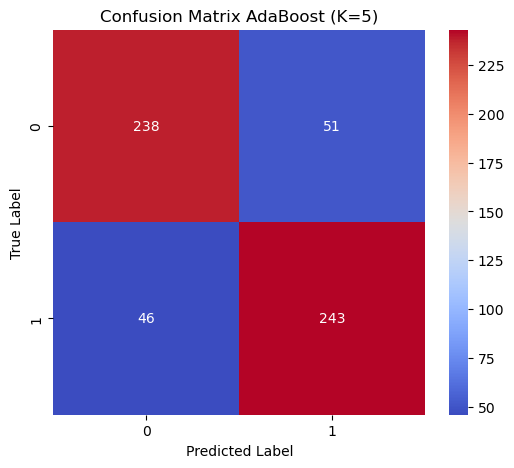

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

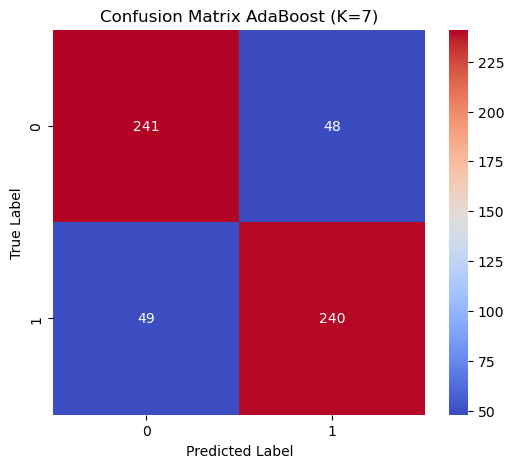

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

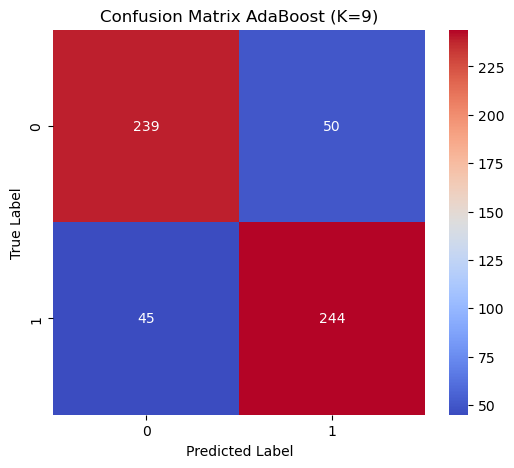


Evaluasi Gradient Boosting dengan K=3


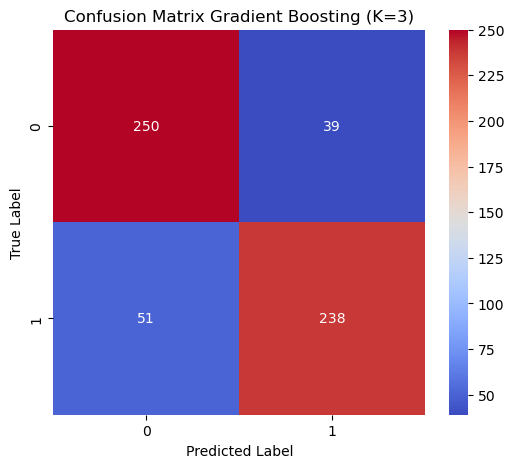


Evaluasi Gradient Boosting dengan K=5


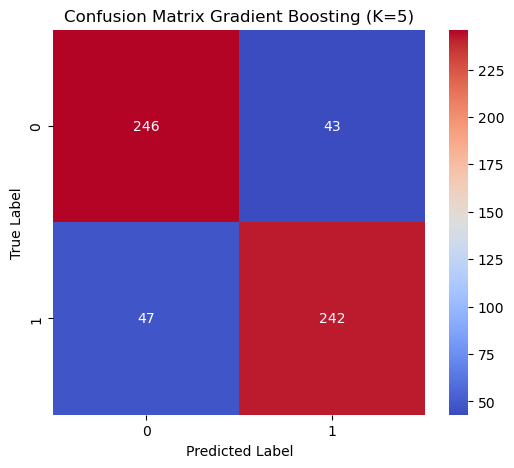


Evaluasi Gradient Boosting dengan K=7


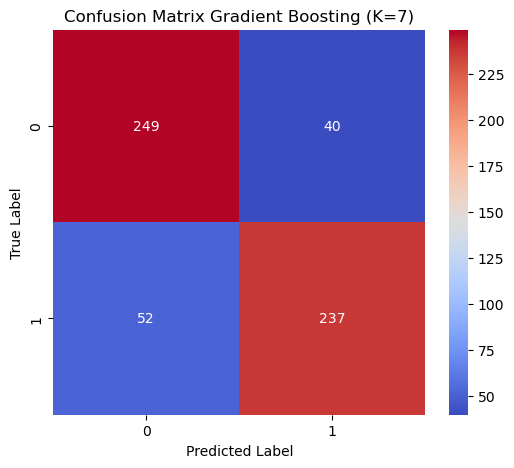


Evaluasi Gradient Boosting dengan K=9


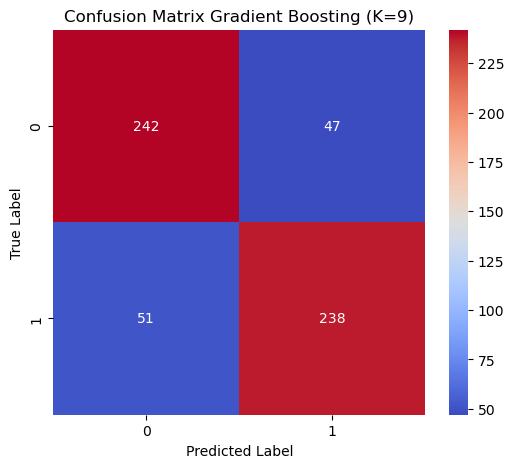


Jumlah data per kelas setelah SMOTE:
1    289
0    289
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   83.74%    83.74%  83.74%   83.74%
1           AdaBoost  5   83.22%    83.23%  83.22%   83.22%
2           AdaBoost  7   83.22%    83.22%  83.22%   83.22%
3           AdaBoost  9   83.56%    83.57%  83.56%   83.56%
4  Gradient Boosting  3   84.43%    84.49%  84.43%   84.42%
5  Gradient Boosting  5   84.43%    84.44%  84.43%   84.43%
6  Gradient Boosting  7   84.08%    84.14%  84.08%   84.08%
7  Gradient Boosting  9   83.04%    83.05%  83.04%   83.04%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,83.74%,83.74%,83.74%,83.74%
1,AdaBoost,5,83.22%,83.23%,83.22%,83.22%
2,AdaBoost,7,83.22%,83.22%,83.22%,83.22%
3,AdaBoost,9,83.56%,83.57%,83.56%,83.56%
4,Gradient Boosting,3,84.43%,84.49%,84.43%,84.42%
5,Gradient Boosting,5,84.43%,84.44%,84.43%,84.43%
6,Gradient Boosting,7,84.08%,84.14%,84.08%,84.08%
7,Gradient Boosting,9,83.04%,83.05%,83.04%,83.04%


In [101]:
balancing(df_kualitas_fitur_28)

# 28 fitur Terbaik kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


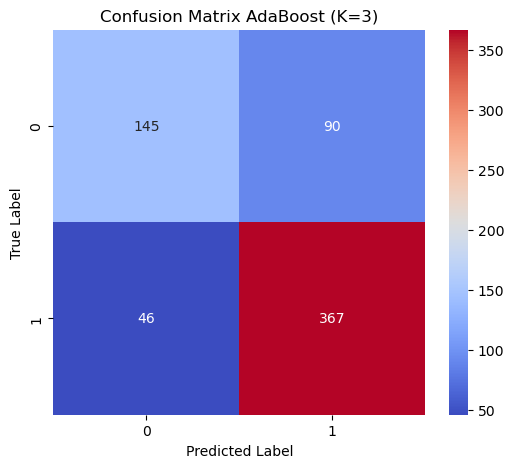


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

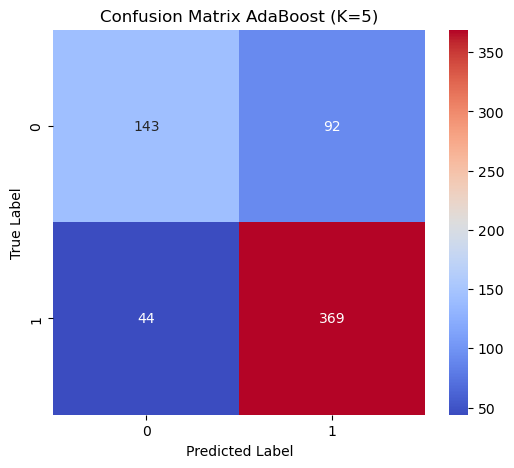

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

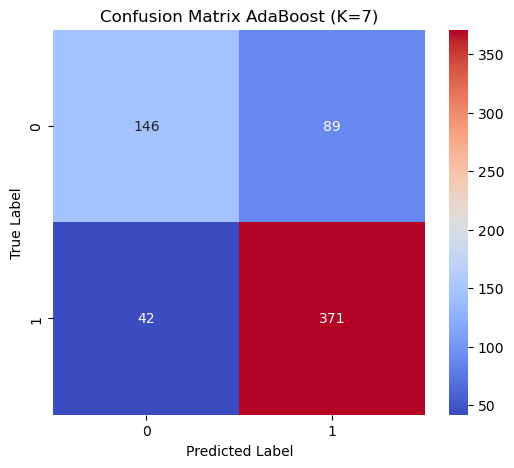


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

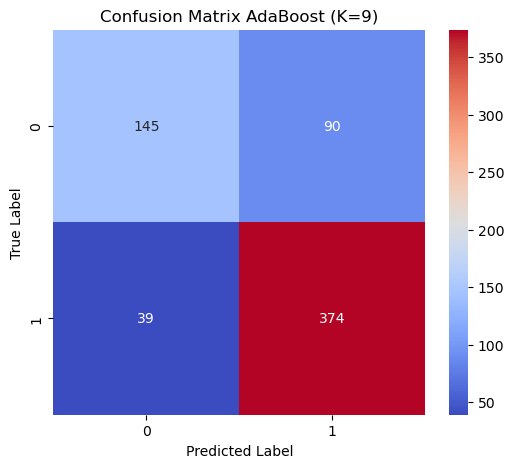


Evaluasi Gradient Boosting dengan K=3


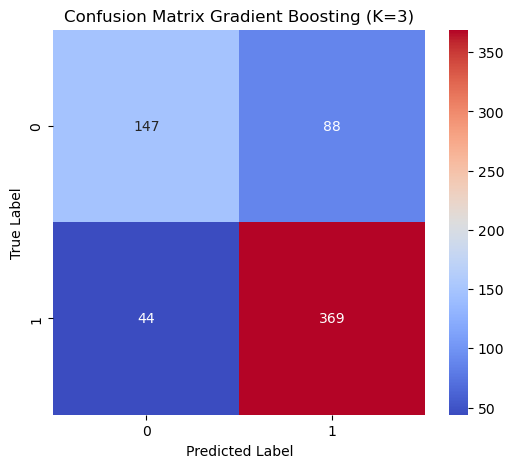


Evaluasi Gradient Boosting dengan K=5


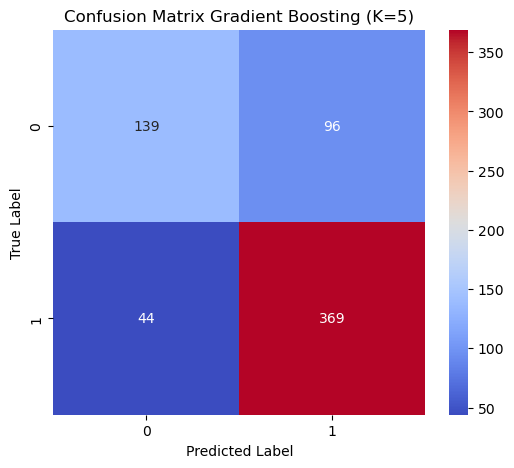


Evaluasi Gradient Boosting dengan K=7


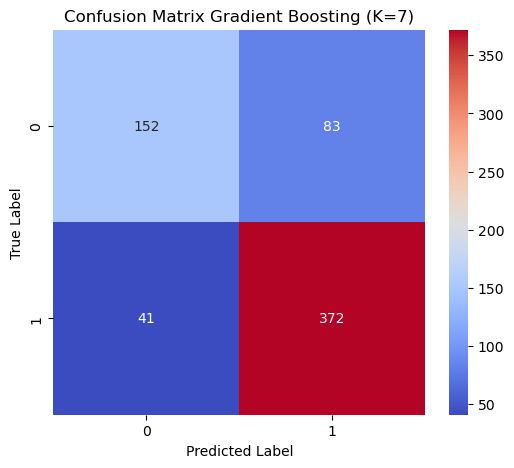


Evaluasi Gradient Boosting dengan K=9


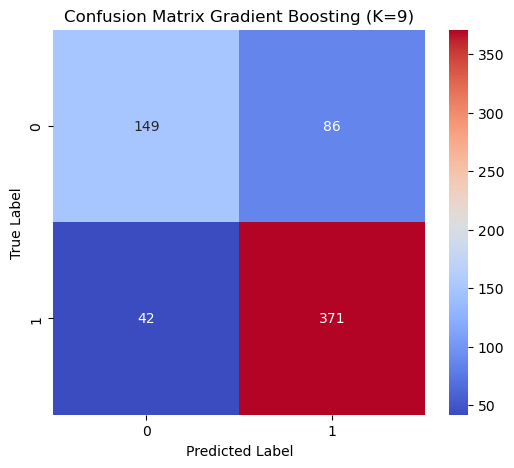


Jumlah data untuk tiap kelas:
0    235
1    413
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.01%    78.11%  75.28%   76.22%
1           AdaBoost  5   79.01%    78.26%  75.10%   76.11%
2           AdaBoost  7   79.78%    79.16%  75.98%   77.01%
3           AdaBoost  9   80.09%    79.70%  76.13%   77.25%
4  Gradient Boosting  3   79.63%    78.85%  75.95%   76.92%
5  Gradient Boosting  5   78.40%    77.66%  74.25%   75.28%
6  Gradient Boosting  7   80.86%    80.26%  77.38%   78.37%
7  Gradient Boosting  9   80.25%    79.60%  76.62%   77.62%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.01%,78.11%,75.28%,76.22%
1,AdaBoost,5,79.01%,78.26%,75.10%,76.11%
2,AdaBoost,7,79.78%,79.16%,75.98%,77.01%
3,AdaBoost,9,80.09%,79.70%,76.13%,77.25%
4,Gradient Boosting,3,79.63%,78.85%,75.95%,76.92%
5,Gradient Boosting,5,78.40%,77.66%,74.25%,75.28%
6,Gradient Boosting,7,80.86%,80.26%,77.38%,78.37%
7,Gradient Boosting,9,80.25%,79.60%,76.62%,77.62%


In [102]:
no_balancing(df_kuantitas_fitur_28)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


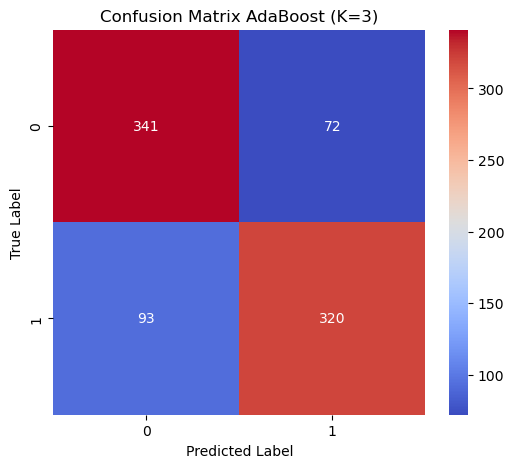


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

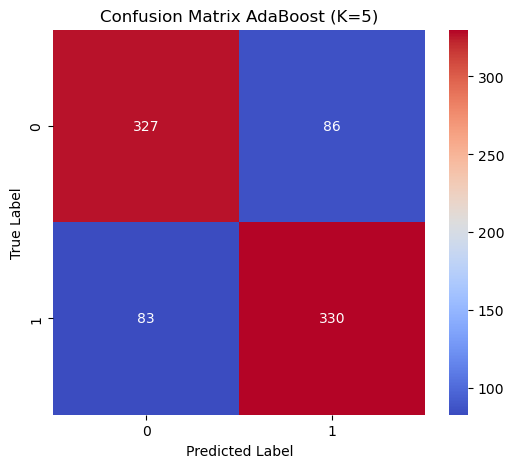

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

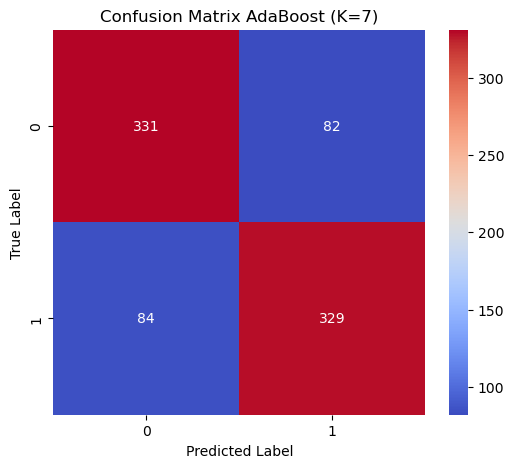


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

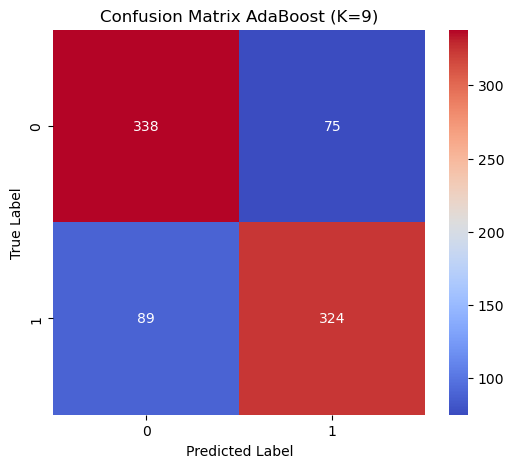


Evaluasi Gradient Boosting dengan K=3


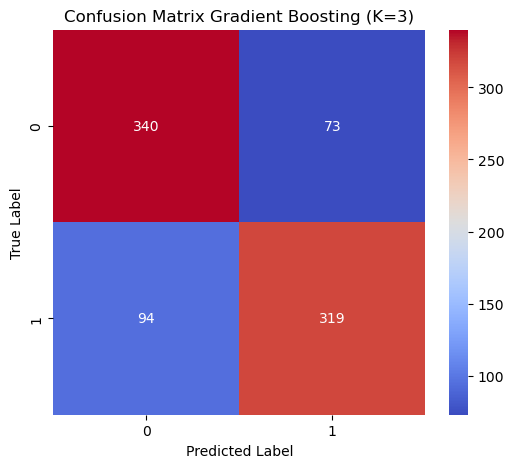


Evaluasi Gradient Boosting dengan K=5


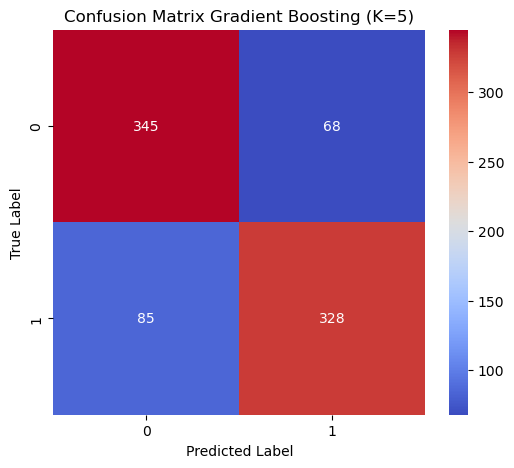


Evaluasi Gradient Boosting dengan K=7


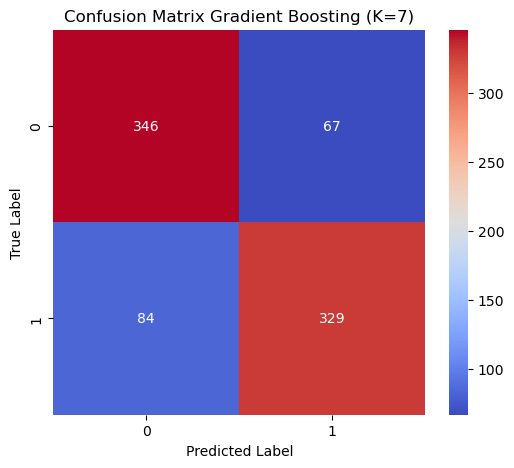


Evaluasi Gradient Boosting dengan K=9


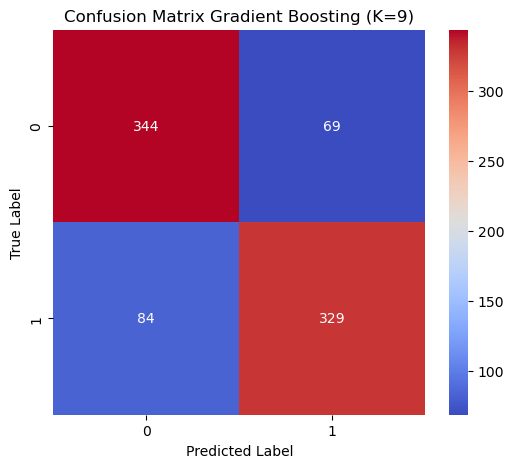


Jumlah data per kelas setelah SMOTE:
1    413
0    413
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   80.02%    80.10%  80.02%   80.01%
1           AdaBoost  5   79.54%    79.54%  79.54%   79.54%
2           AdaBoost  7   79.90%    79.90%  79.90%   79.90%
3           AdaBoost  9   80.15%    80.18%  80.15%   80.14%
4  Gradient Boosting  3   79.78%    79.86%  79.78%   79.77%
5  Gradient Boosting  5   81.48%    81.53%  81.48%   81.47%
6  Gradient Boosting  7   81.72%    81.77%  81.72%   81.71%
7  Gradient Boosting  9   81.48%    81.52%  81.48%   81.47%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,80.02%,80.10%,80.02%,80.01%
1,AdaBoost,5,79.54%,79.54%,79.54%,79.54%
2,AdaBoost,7,79.90%,79.90%,79.90%,79.90%
3,AdaBoost,9,80.15%,80.18%,80.15%,80.14%
4,Gradient Boosting,3,79.78%,79.86%,79.78%,79.77%
5,Gradient Boosting,5,81.48%,81.53%,81.48%,81.47%
6,Gradient Boosting,7,81.72%,81.77%,81.72%,81.71%
7,Gradient Boosting,9,81.48%,81.52%,81.48%,81.47%


In [103]:
balancing(df_kuantitas_fitur_28)

# Mutual Score Diatas 0 Kualitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


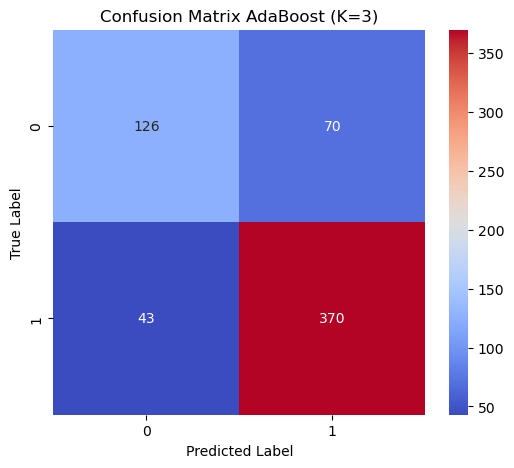


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

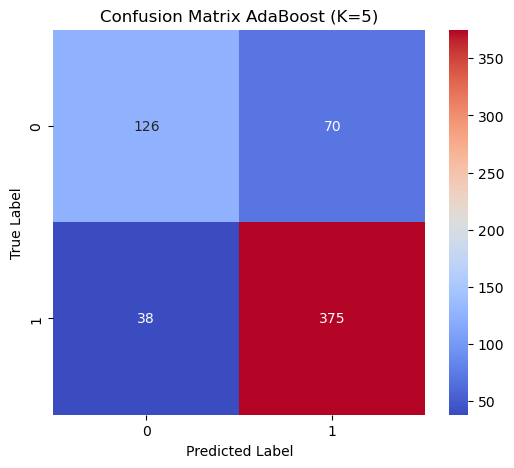


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

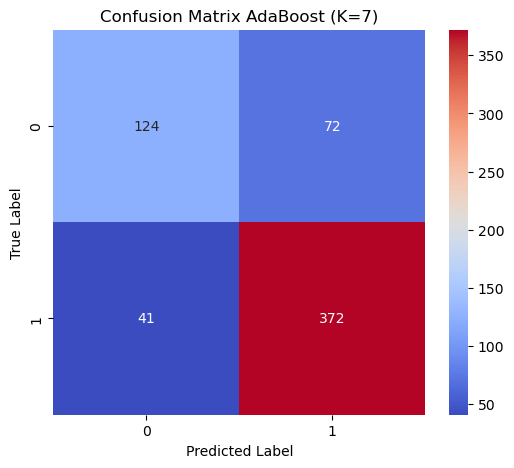


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

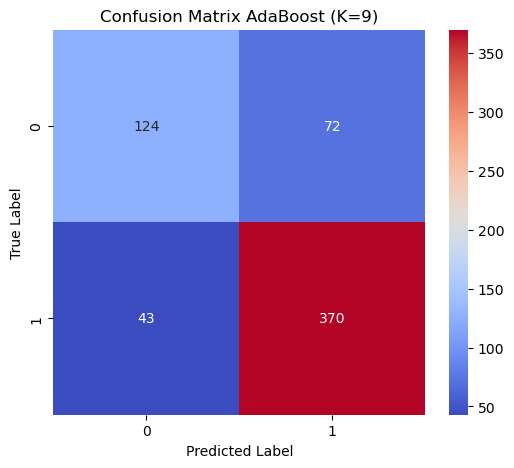


Evaluasi Gradient Boosting dengan K=3


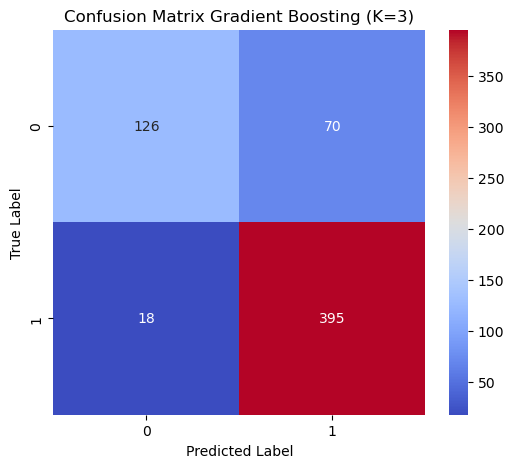


Evaluasi Gradient Boosting dengan K=5


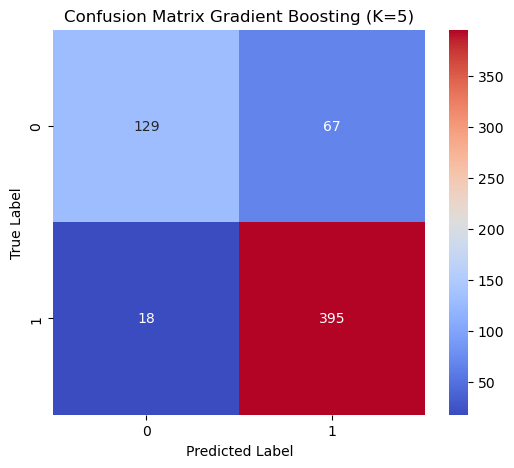


Evaluasi Gradient Boosting dengan K=7


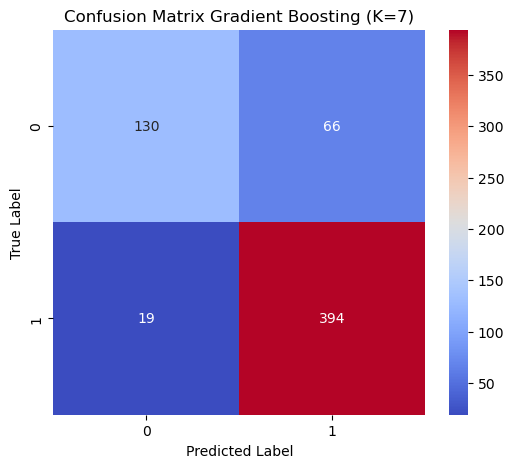


Evaluasi Gradient Boosting dengan K=9


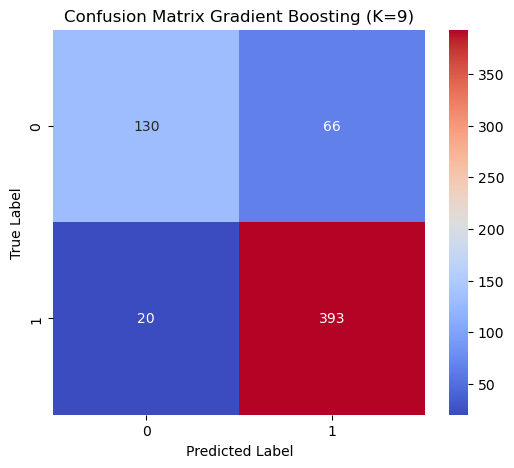


Jumlah data untuk tiap kelas:
0    196
1    413
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   81.44%    79.32%  76.94%   77.90%
1           AdaBoost  5   82.27%    80.55%  77.54%   78.71%
2           AdaBoost  7   81.44%    79.47%  76.67%   77.76%
3           AdaBoost  9   81.12%    78.98%  76.43%   77.43%
4  Gradient Boosting  3   85.55%    86.22%  79.96%   82.05%
5  Gradient Boosting  5   86.04%    86.63%  80.73%   82.75%
6  Gradient Boosting  7   86.04%    86.45%  80.86%   82.81%
7  Gradient Boosting  9   85.88%    86.14%  80.74%   82.64%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,81.44%,79.32%,76.94%,77.90%
1,AdaBoost,5,82.27%,80.55%,77.54%,78.71%
2,AdaBoost,7,81.44%,79.47%,76.67%,77.76%
3,AdaBoost,9,81.12%,78.98%,76.43%,77.43%
4,Gradient Boosting,3,85.55%,86.22%,79.96%,82.05%
5,Gradient Boosting,5,86.04%,86.63%,80.73%,82.75%
6,Gradient Boosting,7,86.04%,86.45%,80.86%,82.81%
7,Gradient Boosting,9,85.88%,86.14%,80.74%,82.64%


In [104]:
no_balancing(df_kualitas_fitur_di_atas_0)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


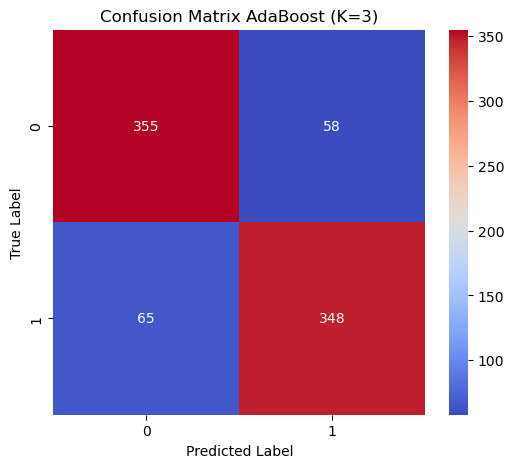


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

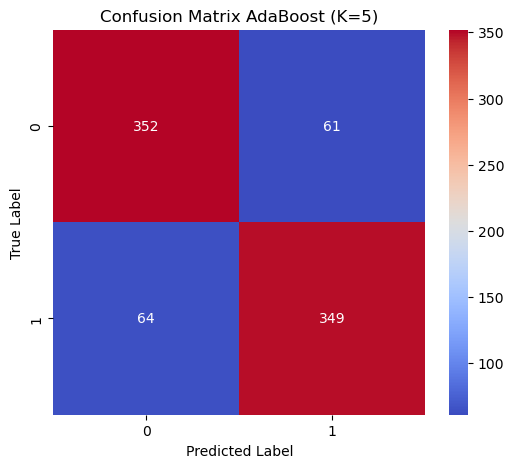


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

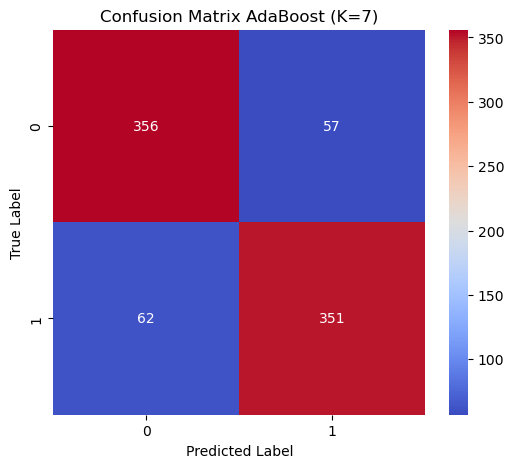


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

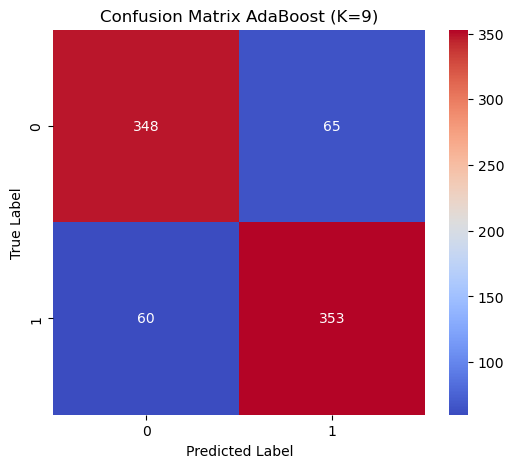


Evaluasi Gradient Boosting dengan K=3


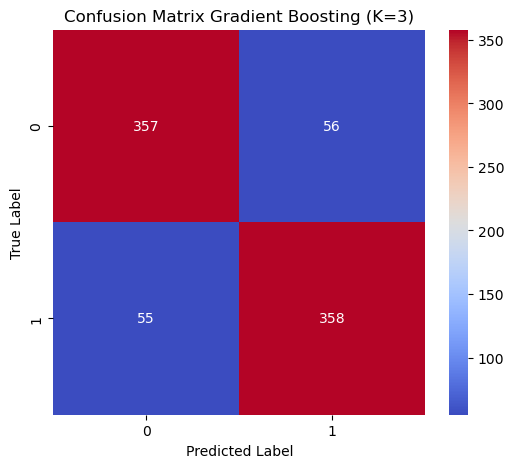


Evaluasi Gradient Boosting dengan K=5


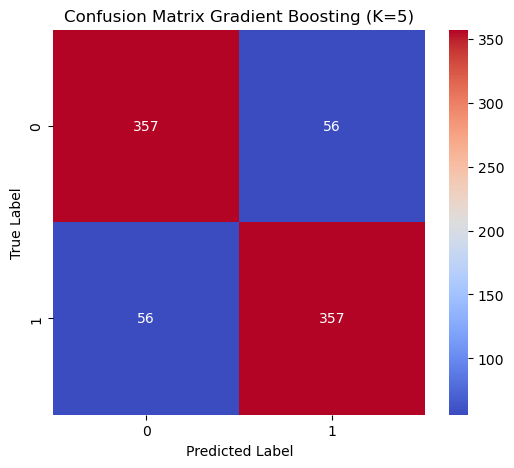


Evaluasi Gradient Boosting dengan K=7


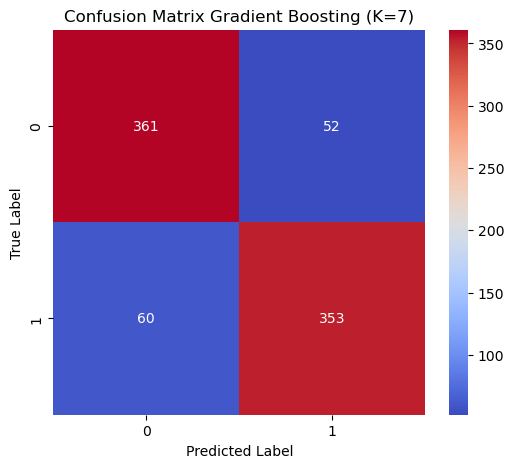


Evaluasi Gradient Boosting dengan K=9


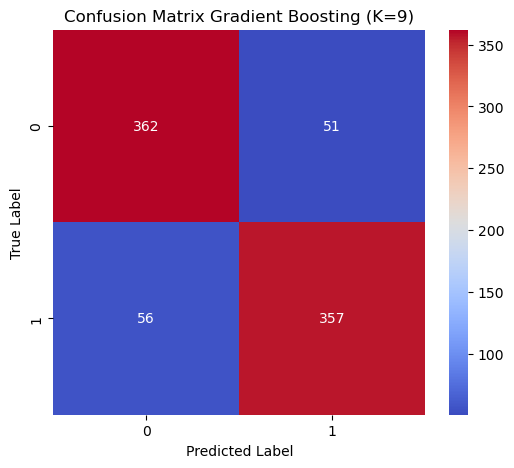


Jumlah data per kelas setelah SMOTE:
1    413
0    413
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   85.11%    85.12%  85.11%   85.11%
1           AdaBoost  5   84.87%    84.87%  84.87%   84.87%
2           AdaBoost  7   85.59%    85.60%  85.59%   85.59%
3           AdaBoost  9   84.87%    84.87%  84.87%   84.87%
4  Gradient Boosting  3   86.56%    86.56%  86.56%   86.56%
5  Gradient Boosting  5   86.44%    86.44%  86.44%   86.44%
6  Gradient Boosting  7   86.44%    86.45%  86.44%   86.44%
7  Gradient Boosting  9   87.05%    87.05%  87.05%   87.05%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,85.11%,85.12%,85.11%,85.11%
1,AdaBoost,5,84.87%,84.87%,84.87%,84.87%
2,AdaBoost,7,85.59%,85.60%,85.59%,85.59%
3,AdaBoost,9,84.87%,84.87%,84.87%,84.87%
4,Gradient Boosting,3,86.56%,86.56%,86.56%,86.56%
5,Gradient Boosting,5,86.44%,86.44%,86.44%,86.44%
6,Gradient Boosting,7,86.44%,86.45%,86.44%,86.44%
7,Gradient Boosting,9,87.05%,87.05%,87.05%,87.05%


In [105]:
balancing(df_kualitas_fitur_di_atas_0)

# Mutual Score Diatas 0 kuantitas

#### Sebelum Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


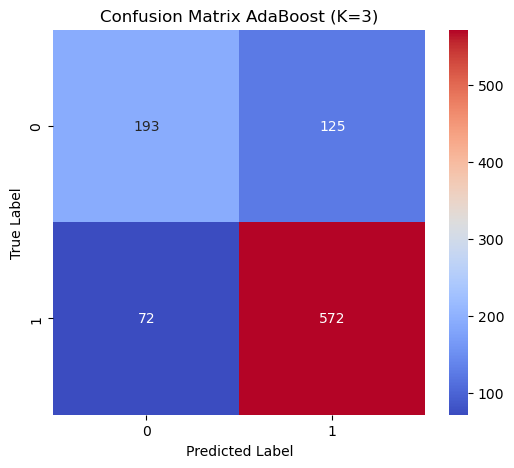


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

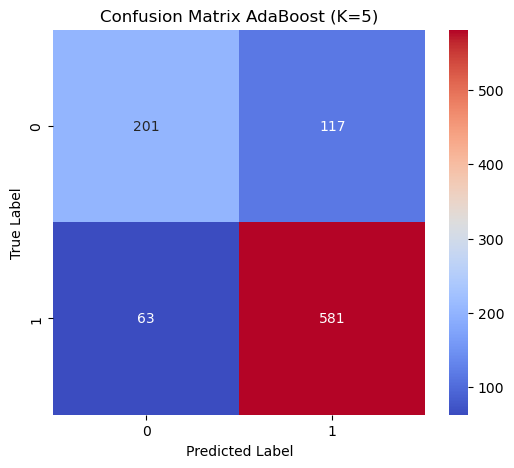


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

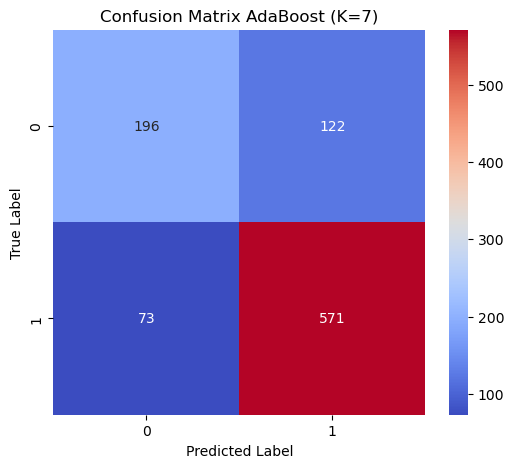


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

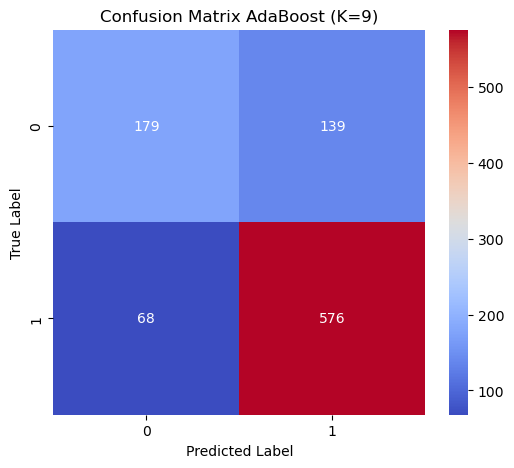


Evaluasi Gradient Boosting dengan K=3


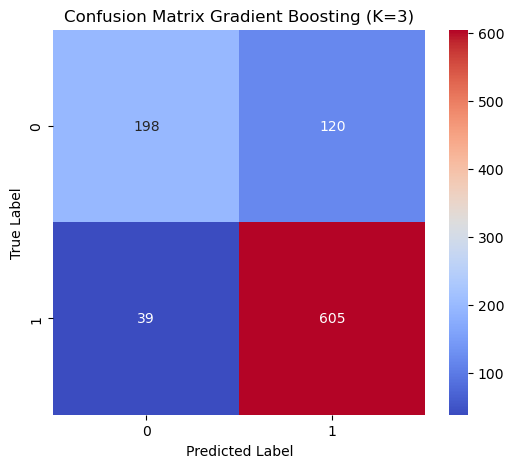


Evaluasi Gradient Boosting dengan K=5


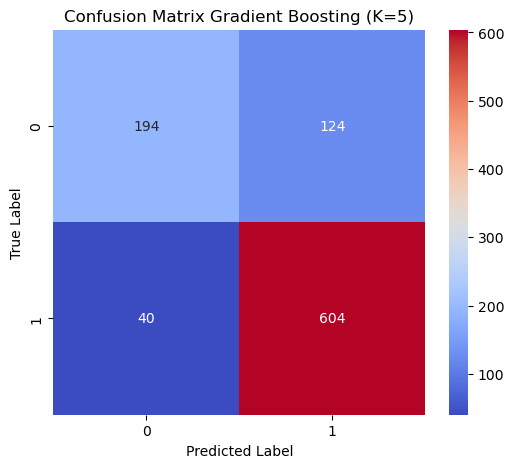


Evaluasi Gradient Boosting dengan K=7


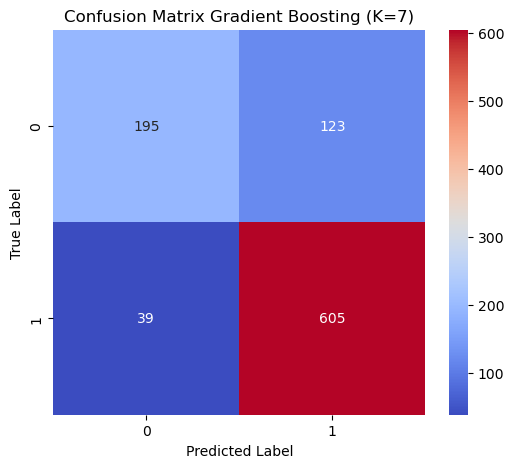


Evaluasi Gradient Boosting dengan K=9


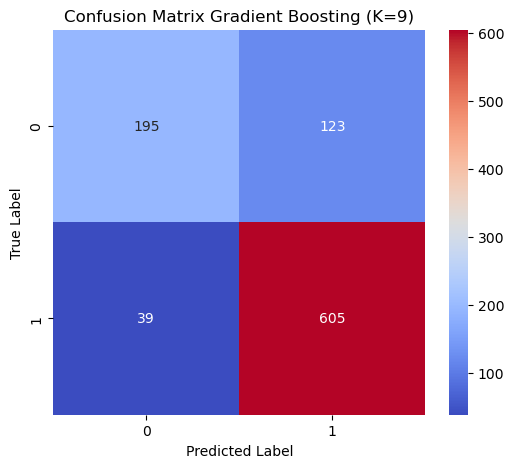


Jumlah data untuk tiap kelas:
0    318
1    644
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   79.52%    77.45%  74.76%   75.76%
1           AdaBoost  5   81.29%    79.69%  76.71%   77.83%
2           AdaBoost  7   79.73%    77.63%  75.15%   76.10%
3           AdaBoost  9   78.48%    76.51%  72.87%   74.07%
4  Gradient Boosting  3   83.47%    83.50%  78.10%   79.87%
5  Gradient Boosting  5   82.95%    82.94%  77.40%   79.17%
6  Gradient Boosting  7   83.16%    83.22%  77.63%   79.42%
7  Gradient Boosting  9   83.16%    83.22%  77.63%   79.42%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,79.52%,77.45%,74.76%,75.76%
1,AdaBoost,5,81.29%,79.69%,76.71%,77.83%
2,AdaBoost,7,79.73%,77.63%,75.15%,76.10%
3,AdaBoost,9,78.48%,76.51%,72.87%,74.07%
4,Gradient Boosting,3,83.47%,83.50%,78.10%,79.87%
5,Gradient Boosting,5,82.95%,82.94%,77.40%,79.17%
6,Gradient Boosting,7,83.16%,83.22%,77.63%,79.42%
7,Gradient Boosting,9,83.16%,83.22%,77.63%,79.42%


In [106]:
no_balancing(df_kuantitas_fitur_di_atas_0)

#### Setelah Balancing


Evaluasi AdaBoost dengan K=3


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


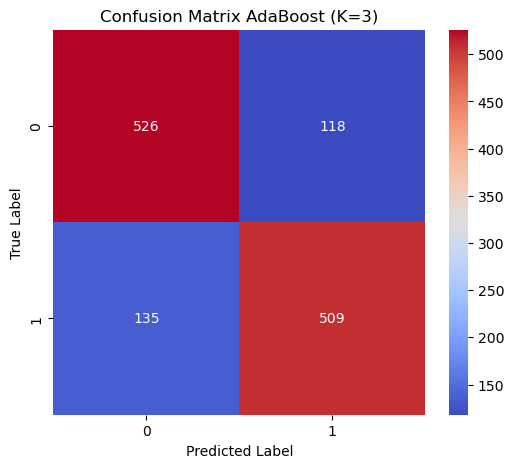


Evaluasi AdaBoost dengan K=5


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

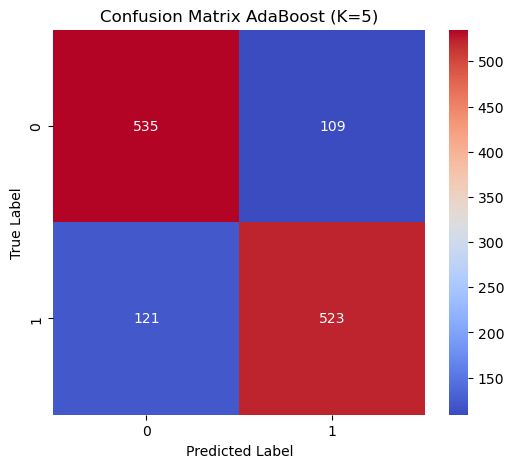


Evaluasi AdaBoost dengan K=7


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

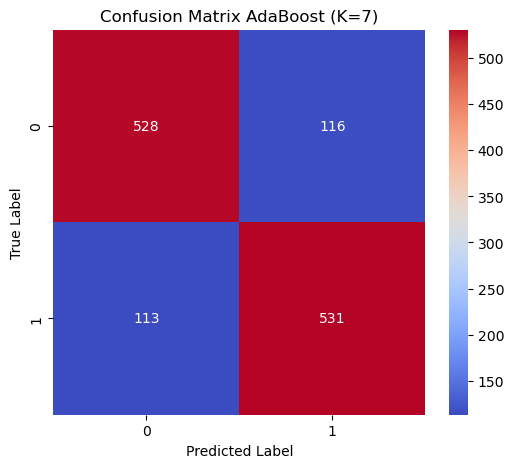


Evaluasi AdaBoost dengan K=9


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an

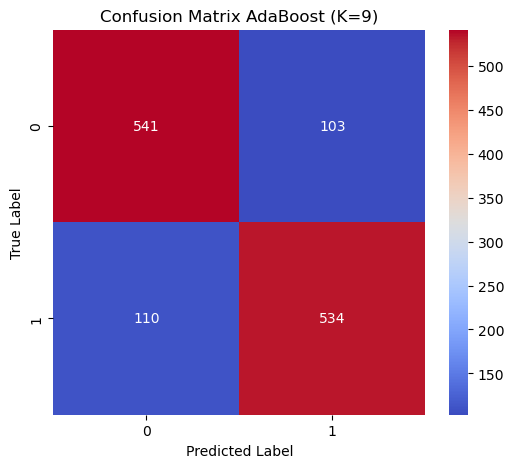


Evaluasi Gradient Boosting dengan K=3


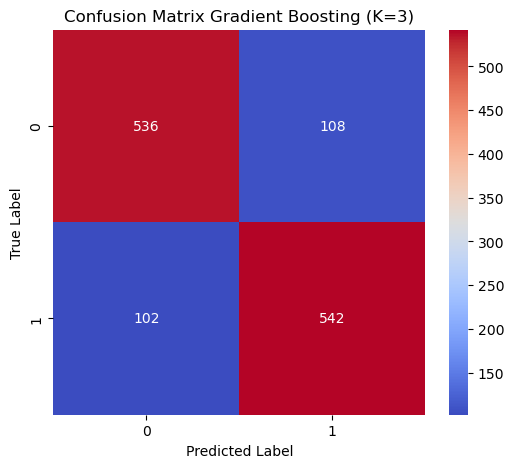


Evaluasi Gradient Boosting dengan K=5


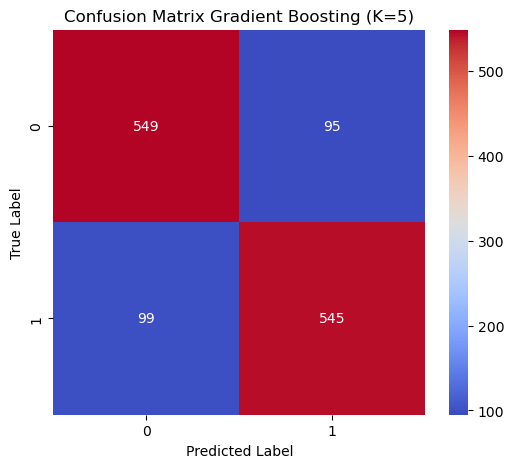


Evaluasi Gradient Boosting dengan K=7


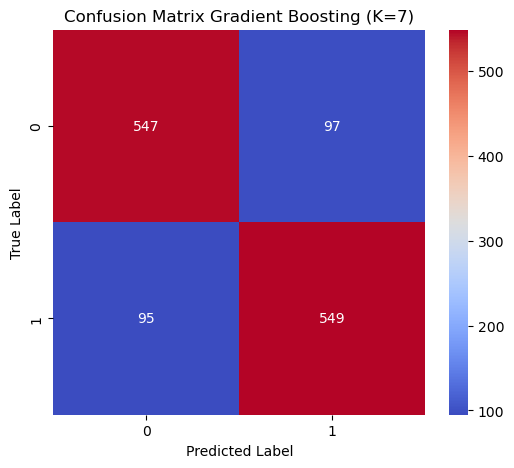


Evaluasi Gradient Boosting dengan K=9


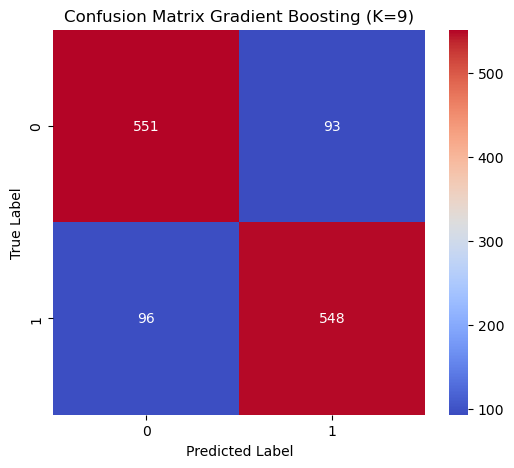


Jumlah data per kelas setelah SMOTE:
1    644
0    644
Name: FatLevel, dtype: int64

Hasil Evaluasi Model:
               Model  K Accuracy Precision  Recall F1-Score
0           AdaBoost  3   80.36%    80.38%  80.36%   80.35%
1           AdaBoost  5   82.14%    82.15%  82.14%   82.14%
2           AdaBoost  7   82.22%    82.22%  82.22%   82.22%
3           AdaBoost  9   83.46%    83.47%  83.46%   83.46%
4  Gradient Boosting  3   83.70%    83.70%  83.70%   83.70%
5  Gradient Boosting  5   84.94%    84.94%  84.94%   84.94%
6  Gradient Boosting  7   85.09%    85.09%  85.09%   85.09%
7  Gradient Boosting  9   85.33%    85.33%  85.33%   85.33%


,Model,K,Accuracy,Precision,Recall,F1-Score
0,AdaBoost,3,80.36%,80.38%,80.36%,80.35%
1,AdaBoost,5,82.14%,82.15%,82.14%,82.14%
2,AdaBoost,7,82.22%,82.22%,82.22%,82.22%
3,AdaBoost,9,83.46%,83.47%,83.46%,83.46%
4,Gradient Boosting,3,83.70%,83.70%,83.70%,83.70%
5,Gradient Boosting,5,84.94%,84.94%,84.94%,84.94%
6,Gradient Boosting,7,85.09%,85.09%,85.09%,85.09%
7,Gradient Boosting,9,85.33%,85.33%,85.33%,85.33%


In [107]:
balancing(df_kuantitas_fitur_di_atas_0)

## Testing Kualitas

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an


Hasil Evaluasi AdaBoost:
   K  Accuracy (%)  Precision   Recall  F1-Score
0  3     83.737024   0.837435  0.83737  0.837362
1  5     83.217993   0.832279  0.83218  0.832167
2  7     83.217993   0.832184  0.83218  0.832179
3  9     83.564014   0.835741  0.83564  0.835628

⭐ Model AdaBoost Terbaik ditemukan pada Fold = 3 dengan Akurasi = 83.74% ⭐

==== Evaluasi Per Fold (K=3) - AdaBoost ====

Fold 1:
Accuracy : 0.8135
Precision: 0.8140
Recall   : 0.8136
F1-Score : 0.8134


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


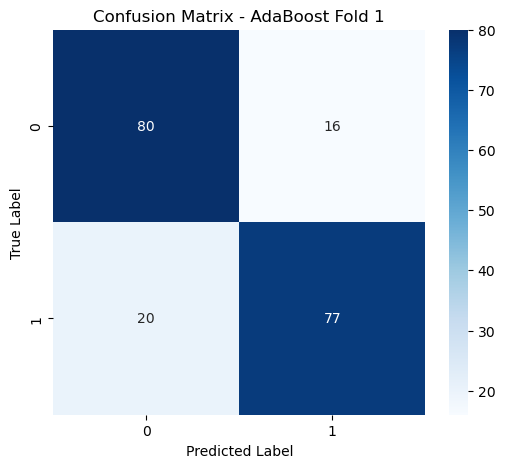

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Fold 2:
Accuracy : 0.8549
Precision: 0.8551
Recall   : 0.8549
F1-Score : 0.8549


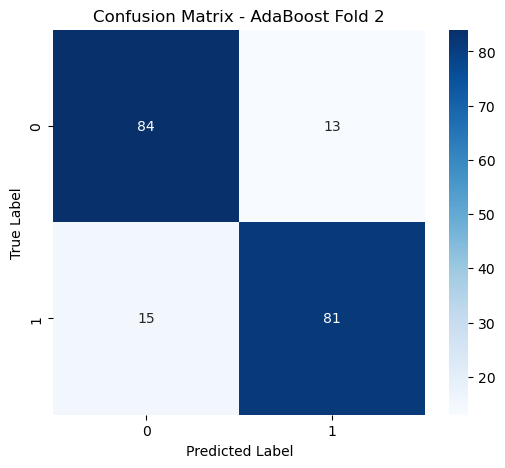


Fold 3:
Accuracy : 0.8438
Precision: 0.8439
Recall   : 0.8438
F1-Score : 0.8437


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


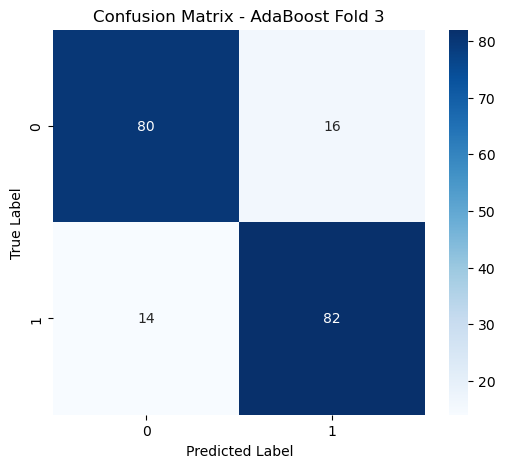


✅ Model dari Fold 2 dipilih sebagai model terbaik berdasarkan akurasi validasi 0.8549

Evaluasi Model AdaBoost (Fold 2):
Accuracy : 0.8667
Precision: 0.8667
Recall   : 0.8667
F1-Score : 0.8667


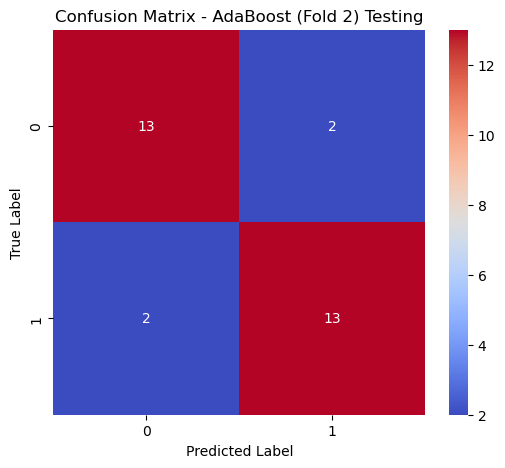

In [108]:
# AdaBoost

from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.base import clone
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ====== 2. Preprocessing Data Training ======

# Pisahkan fitur dan label dari data training
X = df_kualitas_fitur_28.drop(columns=["FatLevel"])
y = df_kualitas_fitur_28["FatLevel"]

fitur_terpilih = X.columns

# Terapkan SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


# ====== 3. Training dan Evaluasi AdaBoost ======

k_values = [3, 5, 7, 9]
ab_results = []

for k in k_values:
    model = AdaBoostClassifier(random_state=42)
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    y_pred = cross_val_predict(model, X_resampled, y_resampled, cv=skf)
    accuracy = accuracy_score(y_resampled, y_pred)
    precision = precision_score(y_resampled, y_pred, average="macro", zero_division=0)
    recall = recall_score(y_resampled, y_pred, average="macro")
    f1 = f1_score(y_resampled, y_pred, average="macro")

    ab_results.append({
        "K": k,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1
    })

# Konversi ke DataFrame dan tampilkan
df_ab_results = pd.DataFrame(ab_results)
df_ab_results["Accuracy (%)"] = df_ab_results["Accuracy"] * 100
print("\nHasil Evaluasi AdaBoost:")
print(df_ab_results[["K", "Accuracy (%)", "Precision", "Recall", "F1-Score"]])

# Ambil fold dengan akurasi terbaik
best_ab_row = df_ab_results.sort_values(by="Accuracy", ascending=False).iloc[0]
best_k = int(best_ab_row["K"])
best_acc = best_ab_row["Accuracy"]

print(f"\n⭐ Model AdaBoost Terbaik ditemukan pada Fold = {best_k} dengan Akurasi = {best_acc*100:.2f}% ⭐")

# ====== Evaluasi Per Fold & Pilih Model Terbaik ======

best_model = None
best_val_acc = 0
best_fold = -1

def evaluate_folds_and_select_best(model_class, k, X, y):
    global best_model, best_val_acc, best_fold
    print(f"\n==== Evaluasi Per Fold (K={k}) - AdaBoost ====")
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    for i, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
        model = model_class(random_state=42)
        model.fit(X.iloc[train_idx], y.iloc[train_idx])
        y_pred = model.predict(X.iloc[val_idx])
        y_true = y.iloc[val_idx]

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_true, y_pred, average='macro')
        f1 = f1_score(y_true, y_pred, average='macro')

        print(f"\nFold {i}:")
        print(f"Accuracy : {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall   : {rec:.4f}")
        print(f"F1-Score : {f1:.4f}")

        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=np.unique(y),
                    yticklabels=np.unique(y))
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"Confusion Matrix - AdaBoost Fold {i}")
        plt.show()

        # Simpan model terbaik berdasarkan akurasi validasi
        if acc > best_val_acc:
            best_val_acc = acc
            best_model = clone(model)
            best_model.fit(X.iloc[train_idx], y.iloc[train_idx])
            best_fold = i

evaluate_folds_and_select_best(AdaBoostClassifier, best_k, X_resampled, y_resampled)

print(f"\n✅ Model dari Fold {best_fold} dipilih sebagai model terbaik berdasarkan akurasi validasi {best_val_acc:.4f}")

# ====== Testing Model Terbaik ======

X_test = testing_kualitas.drop(columns=["FatLevel"])
X_test = X_test[fitur_terpilih].reindex(columns=fitur_terpilih)
y_test = testing_kualitas["FatLevel"]

def evaluate_model(y_true, y_pred, model_name):
    print(f"\nEvaluasi Model {model_name}:")
    print(f"Accuracy : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='macro', zero_division=0):.4f}")
    print(f"Recall   : {recall_score(y_true, y_pred, average='macro'):.4f}")
    print(f"F1-Score : {f1_score(y_true, y_pred, average='macro'):.4f}")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                xticklabels=np.unique(y_true),
                yticklabels=np.unique(y_true))
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name} Testing")
    plt.show()

# Evaluasi pada data testing
evaluate_model(y_test, best_model.predict(X_test), f"AdaBoost (Fold {best_fold})")


Hasil Evaluasi Gradient Boosting:
   K  Accuracy (%)  Precision    Recall  F1-Score
0  3     83.453237   0.835157  0.834532  0.834455
1  5     81.474820   0.814850  0.814748  0.814733
2  7     84.892086   0.849210  0.848921  0.848890
3  9     84.172662   0.842169  0.841727  0.841675

⭐ Model Gradient Boosting Terbaik ditemukan pada Fold = 7 dengan Akurasi = 84.89% ⭐

==== Evaluasi Per Fold (K=7) - Gradient Boosting ====

Fold 1:
Accuracy : 0.8500
Precision: 0.8581
Recall   : 0.8500
F1-Score : 0.8492


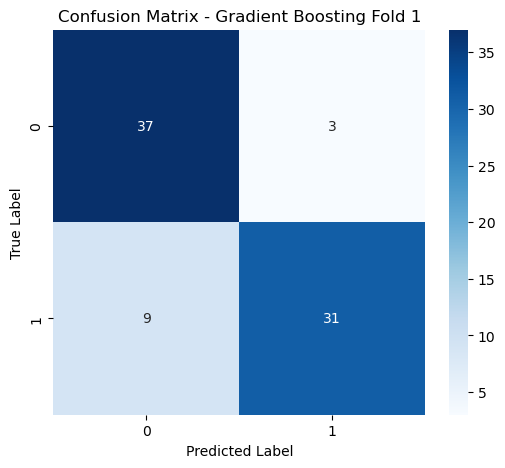


Fold 2:
Accuracy : 0.8500
Precision: 0.8535
Recall   : 0.8500
F1-Score : 0.8496


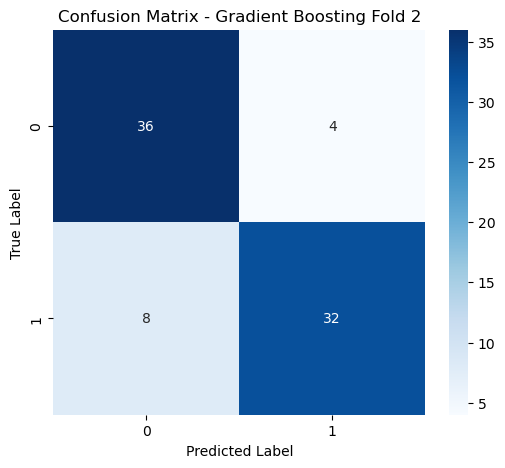


Fold 3:
Accuracy : 0.9500
Precision: 0.9511
Recall   : 0.9500
F1-Score : 0.9500


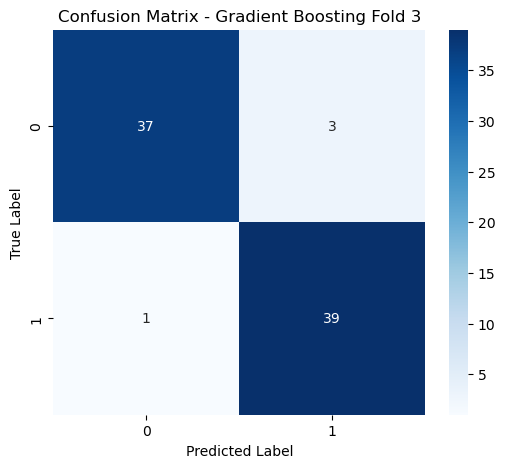


Fold 4:
Accuracy : 0.7975
Precision: 0.7983
Recall   : 0.7971
F1-Score : 0.7972


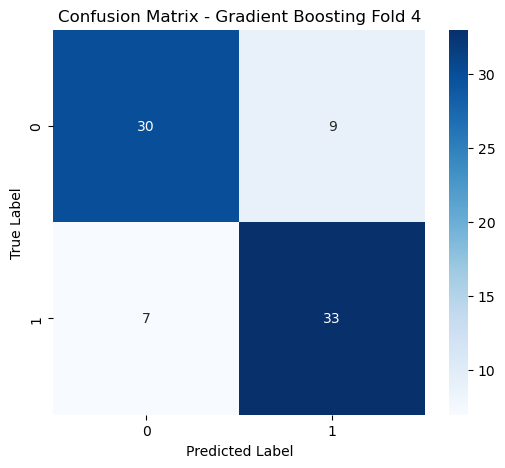


Fold 5:
Accuracy : 0.8481
Precision: 0.8481
Recall   : 0.8481
F1-Score : 0.8481


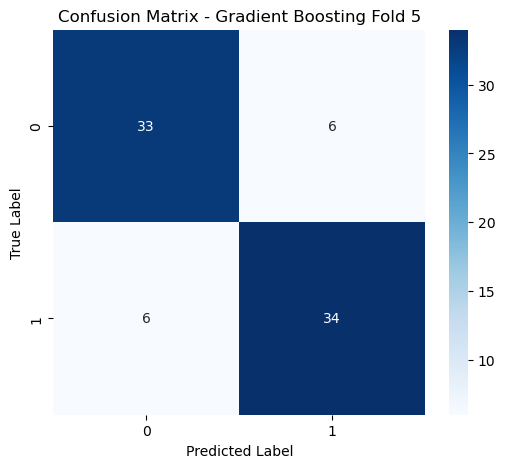


Fold 6:
Accuracy : 0.8481
Precision: 0.8491
Recall   : 0.8478
F1-Score : 0.8479


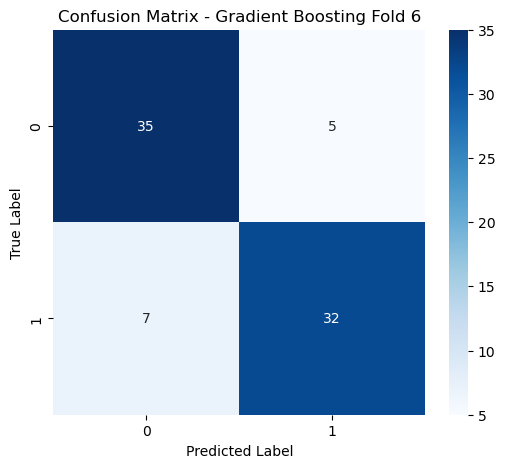


Fold 7:
Accuracy : 0.7975
Precision: 0.7974
Recall   : 0.7974
F1-Score : 0.7974


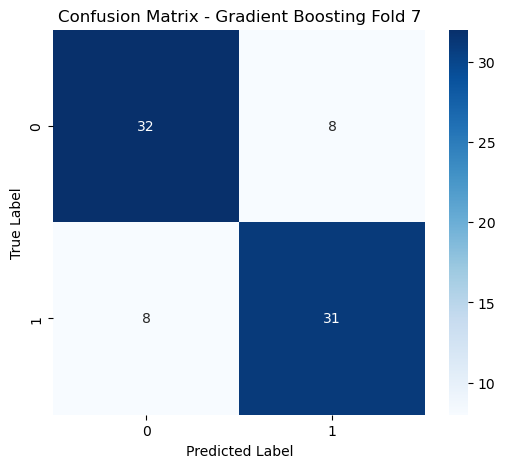


✅ Model dari Fold 3 dipilih sebagai model terbaik berdasarkan akurasi validasi 0.9500

Evaluasi Model Gradient Boosting (Fold 3):
Accuracy : 0.9333
Precision: 0.9412
Recall   : 0.9333
F1-Score : 0.9330


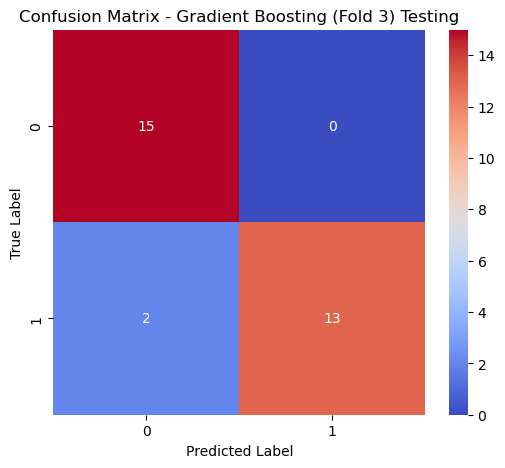

In [109]:
# gradient boost


# ====== 2. Preprocessing Data Training ======

# Pisahkan fitur dan label dari data training
X = df_fitur_28_kualitas_no_fnc.drop(columns=["FatLevel"])
y = df_fitur_28_kualitas_no_fnc["FatLevel"]

fitur_terpilih = X.columns

# Terapkan SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# ====== 3. Training dan Evaluasi AdaBoost ======

k_values = [3, 5, 7, 9]
ab_results = []

for k in k_values:
    model = GradientBoostingClassifier(random_state=42)
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    y_pred = cross_val_predict(model, X_resampled, y_resampled, cv=skf)
    accuracy = accuracy_score(y_resampled, y_pred)
    precision = precision_score(y_resampled, y_pred, average="macro", zero_division=0)
    recall = recall_score(y_resampled, y_pred, average="macro")
    f1 = f1_score(y_resampled, y_pred, average="macro")

    ab_results.append({
        "K": k,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1
    })

# Konversi ke DataFrame dan tampilkan
df_ab_results = pd.DataFrame(ab_results)
df_ab_results["Accuracy (%)"] = df_ab_results["Accuracy"] * 100
print("\nHasil Evaluasi Gradient Boosting:")
print(df_ab_results[["K", "Accuracy (%)", "Precision", "Recall", "F1-Score"]])

# Ambil fold dengan akurasi terbaik
best_ab_row = df_ab_results.sort_values(by="Accuracy", ascending=False).iloc[0]
best_k = int(best_ab_row["K"])
best_acc = best_ab_row["Accuracy"]

print(f"\n⭐ Model Gradient Boosting Terbaik ditemukan pada Fold = {best_k} dengan Akurasi = {best_acc*100:.2f}% ⭐")

# ====== Evaluasi Per Fold & Pilih Model Terbaik ======

best_model = None
best_val_acc = 0
best_fold = -1

def evaluate_folds_and_select_best(model_class, k, X, y):
    global best_model, best_val_acc, best_fold
    print(f"\n==== Evaluasi Per Fold (K={k}) - Gradient Boosting ====")
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    for i, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
        model = model_class(random_state=42)
        model.fit(X.iloc[train_idx], y.iloc[train_idx])
        y_pred = model.predict(X.iloc[val_idx])
        y_true = y.iloc[val_idx]

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_true, y_pred, average='macro')
        f1 = f1_score(y_true, y_pred, average='macro')

        print(f"\nFold {i}:")
        print(f"Accuracy : {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall   : {rec:.4f}")
        print(f"F1-Score : {f1:.4f}")

        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=np.unique(y),
                    yticklabels=np.unique(y))
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"Confusion Matrix - Gradient Boosting Fold {i}")
        plt.show()

        # Simpan model terbaik berdasarkan akurasi validasi
        if acc > best_val_acc:
            best_val_acc = acc
            best_model = clone(model)
            best_model.fit(X.iloc[train_idx], y.iloc[train_idx])
            best_fold = i

evaluate_folds_and_select_best(GradientBoostingClassifier, best_k, X_resampled, y_resampled)

print(f"\n✅ Model dari Fold {best_fold} dipilih sebagai model terbaik berdasarkan akurasi validasi {best_val_acc:.4f}")

# ====== Testing Model Terbaik ======

X_test = testing_kualitas.drop(columns=["FatLevel"])
X_test = X_test[fitur_terpilih].reindex(columns=fitur_terpilih)
y_test = testing_kualitas["FatLevel"]

def evaluate_model(y_true, y_pred, model_name):
    print(f"\nEvaluasi Model {model_name}:")
    print(f"Accuracy : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='macro', zero_division=0):.4f}")
    print(f"Recall   : {recall_score(y_true, y_pred, average='macro'):.4f}")
    print(f"F1-Score : {f1_score(y_true, y_pred, average='macro'):.4f}")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                xticklabels=np.unique(y_true),
                yticklabels=np.unique(y_true))
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name} Testing")
    plt.show()

# Evaluasi pada data testing
evaluate_model(y_test, best_model.predict(X_test), f"Gradient Boosting (Fold {best_fold})")

## Testing Kuantitas

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\an


Hasil Evaluasi AdaBoost:
   K  Accuracy (%)  Precision    Recall  F1-Score
0  3     81.428571   0.814390  0.814286  0.814270
1  5     80.519481   0.805327  0.805195  0.805174
2  7     81.948052   0.820261  0.819481  0.819371
3  9     79.350649   0.793953  0.793506  0.793428

⭐ Model AdaBoost Terbaik ditemukan pada Fold = 7 dengan Akurasi = 81.95% ⭐

==== Evaluasi Per Fold (K=7) - AdaBoost ====

Fold 1:
Accuracy : 0.8000
Precision: 0.8016
Recall   : 0.8000
F1-Score : 0.7997


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


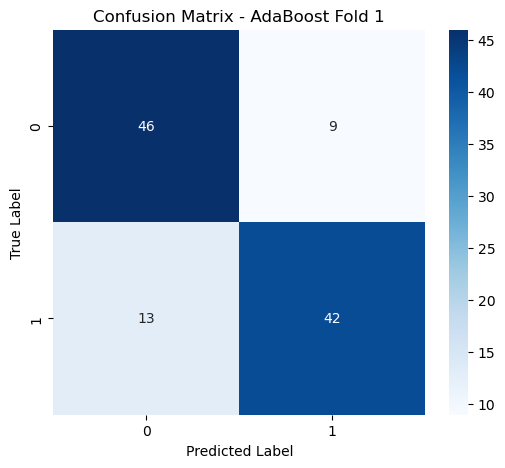

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Fold 2:
Accuracy : 0.8545
Precision: 0.8550
Recall   : 0.8545
F1-Score : 0.8545


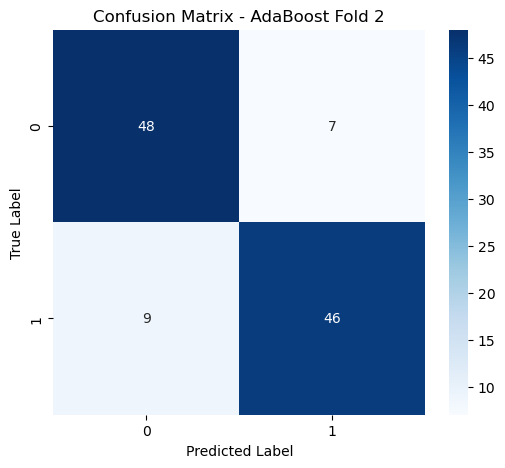


Fold 3:
Accuracy : 0.8000
Precision: 0.8004
Recall   : 0.8000
F1-Score : 0.7999


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


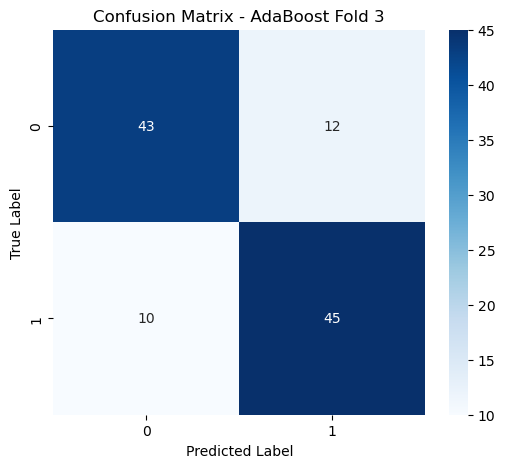


Fold 4:
Accuracy : 0.7545
Precision: 0.7567
Recall   : 0.7545
F1-Score : 0.7540


C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


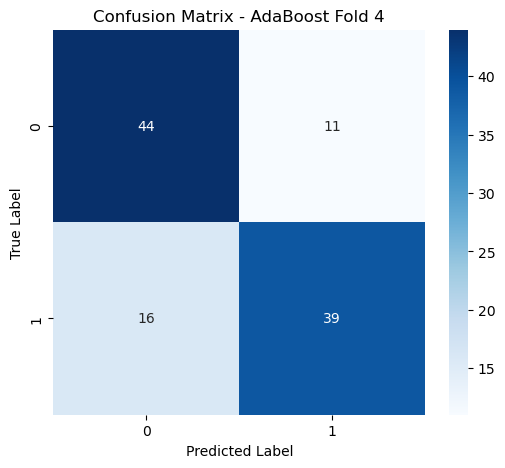

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Fold 5:
Accuracy : 0.8455
Precision: 0.8483
Recall   : 0.8455
F1-Score : 0.8451


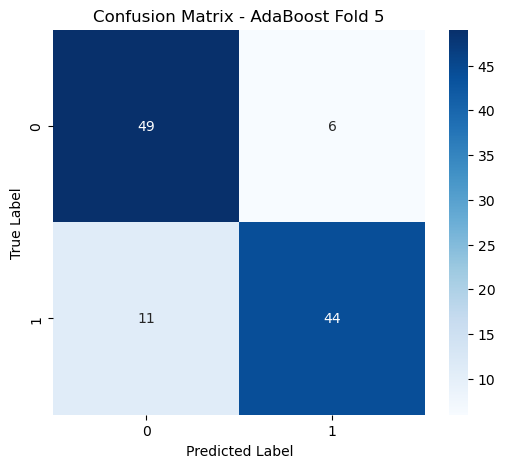

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Fold 6:
Accuracy : 0.8364
Precision: 0.8368
Recall   : 0.8364
F1-Score : 0.8363


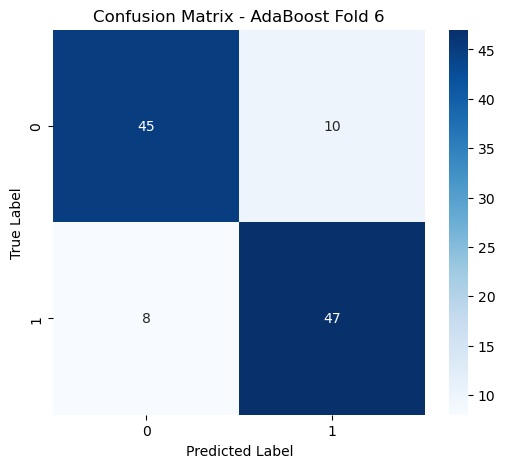

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Fold 7:
Accuracy : 0.8455
Precision: 0.8511
Recall   : 0.8455
F1-Score : 0.8448


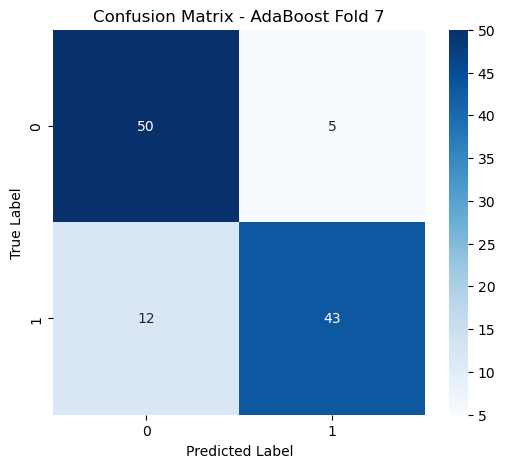


✅ Model dari Fold 2 dipilih sebagai model terbaik berdasarkan akurasi validasi 0.8545

Evaluasi Model AdaBoost (Fold 2):
Accuracy : 0.7667
Precision: 0.8409
Recall   : 0.7667
F1-Score : 0.7532


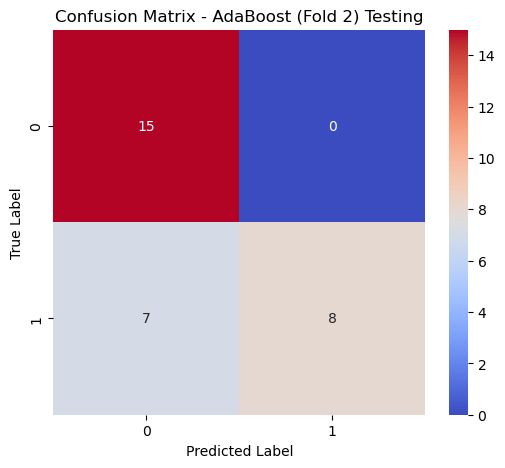

In [110]:
# AdaBoost

from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.base import clone
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ====== 2. Preprocessing Data Training ======

X = df_kuantitas_fitur_24.drop(columns=["FatLevel"])
y = df_kuantitas_fitur_24['FatLevel']

fitur_terpilih = X.columns

# Terapkan SMOTE untuk menyeimbangkan kelas minoritas
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


# ====== 3. Training dan Evaluasi AdaBoost ======

k_values = [3, 5, 7, 9]
ab_results = []

for k in k_values:
    model = AdaBoostClassifier(random_state=42)
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    y_pred = cross_val_predict(model, X_resampled, y_resampled, cv=skf)
    accuracy = accuracy_score(y_resampled, y_pred)
    precision = precision_score(y_resampled, y_pred, average="macro", zero_division=0)
    recall = recall_score(y_resampled, y_pred, average="macro")
    f1 = f1_score(y_resampled, y_pred, average="macro")

    ab_results.append({
        "K": k,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1
    })

# Konversi ke DataFrame dan tampilkan
df_ab_results = pd.DataFrame(ab_results)
df_ab_results["Accuracy (%)"] = df_ab_results["Accuracy"] * 100
print("\nHasil Evaluasi AdaBoost:")
print(df_ab_results[["K", "Accuracy (%)", "Precision", "Recall", "F1-Score"]])

# Ambil fold dengan akurasi terbaik
best_ab_row = df_ab_results.sort_values(by="Accuracy", ascending=False).iloc[0]
best_k = int(best_ab_row["K"])
best_acc = best_ab_row["Accuracy"]

print(f"\n⭐ Model AdaBoost Terbaik ditemukan pada Fold = {best_k} dengan Akurasi = {best_acc*100:.2f}% ⭐")

# ====== Evaluasi Per Fold & Pilih Model Terbaik ======

best_model = None
best_val_acc = 0
best_fold = -1

def evaluate_folds_and_select_best(model_class, k, X, y):
    global best_model, best_val_acc, best_fold
    print(f"\n==== Evaluasi Per Fold (K={k}) - AdaBoost ====")
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    for i, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
        model = model_class(random_state=42)
        model.fit(X.iloc[train_idx], y.iloc[train_idx])
        y_pred = model.predict(X.iloc[val_idx])
        y_true = y.iloc[val_idx]

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_true, y_pred, average='macro')
        f1 = f1_score(y_true, y_pred, average='macro')

        print(f"\nFold {i}:")
        print(f"Accuracy : {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall   : {rec:.4f}")
        print(f"F1-Score : {f1:.4f}")

        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=np.unique(y),
                    yticklabels=np.unique(y))
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"Confusion Matrix - AdaBoost Fold {i}")
        plt.show()

        # Simpan model terbaik berdasarkan akurasi validasi
        if acc > best_val_acc:
            best_val_acc = acc
            best_model = clone(model)
            best_model.fit(X.iloc[train_idx], y.iloc[train_idx])
            best_fold = i

evaluate_folds_and_select_best(AdaBoostClassifier, best_k, X_resampled, y_resampled)

print(f"\n✅ Model dari Fold {best_fold} dipilih sebagai model terbaik berdasarkan akurasi validasi {best_val_acc:.4f}")

# ====== Testing Model Terbaik ======

X_test = testing_kualitas.drop(columns=["FatLevel"])
X_test = X_test[fitur_terpilih].reindex(columns=fitur_terpilih)
y_test = testing_kualitas["FatLevel"]

def evaluate_model(y_true, y_pred, model_name):
    print(f"\nEvaluasi Model {model_name}:")
    print(f"Accuracy : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='macro', zero_division=0):.4f}")
    print(f"Recall   : {recall_score(y_true, y_pred, average='macro'):.4f}")
    print(f"F1-Score : {f1_score(y_true, y_pred, average='macro'):.4f}")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                xticklabels=np.unique(y_true),
                yticklabels=np.unique(y_true))
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name} Testing")
    plt.show()

# Evaluasi pada data testing
evaluate_model(y_test, best_model.predict(X_test), f"AdaBoost (Fold {best_fold})")



Hasil Evaluasi Gradient Boosting:
   K  Accuracy (%)  Precision    Recall  F1-Score
0  3     79.782082   0.798593  0.797821  0.797690
1  5     81.476998   0.815304  0.814770  0.814691
2  7     81.719128   0.817730  0.817191  0.817114
3  9     81.476998   0.815186  0.814770  0.814709

⭐ Model Gradient Boosting Terbaik ditemukan pada Fold = 7 dengan Akurasi = 81.72% ⭐

==== Evaluasi Per Fold (K=7) - Gradient Boosting ====

Fold 1:
Accuracy : 0.6949
Precision: 0.6958
Recall   : 0.6949
F1-Score : 0.6946


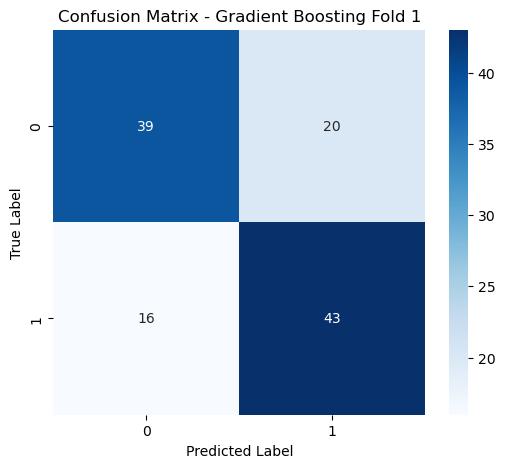


Fold 2:
Accuracy : 0.8475
Precision: 0.8479
Recall   : 0.8475
F1-Score : 0.8474


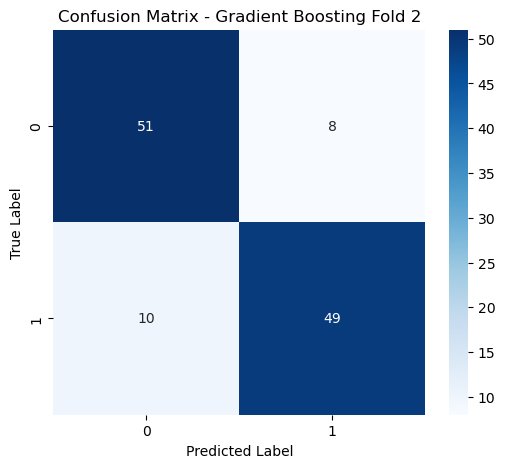


Fold 3:
Accuracy : 0.8136
Precision: 0.8150
Recall   : 0.8136
F1-Score : 0.8133


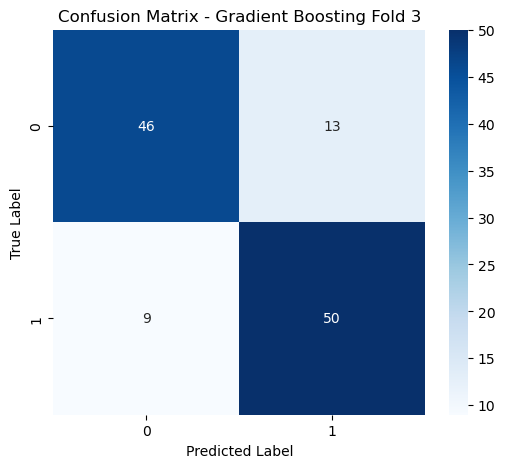


Fold 4:
Accuracy : 0.8220
Precision: 0.8244
Recall   : 0.8220
F1-Score : 0.8217


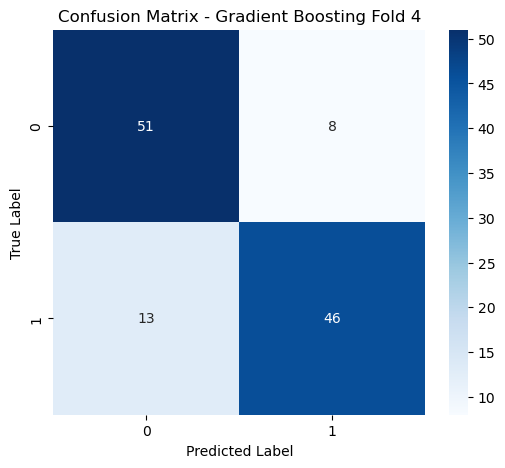


Fold 5:
Accuracy : 0.8475
Precision: 0.8540
Recall   : 0.8475
F1-Score : 0.8468


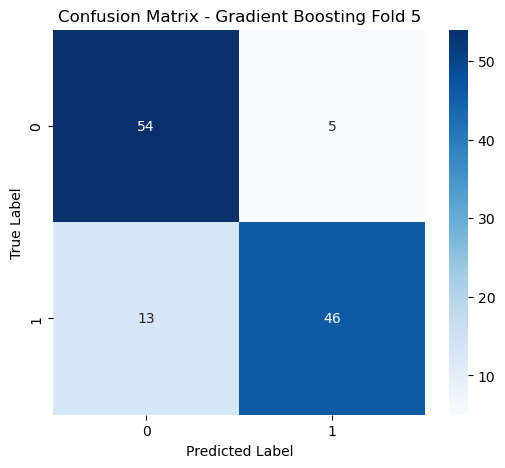


Fold 6:
Accuracy : 0.8559
Precision: 0.8569
Recall   : 0.8559
F1-Score : 0.8558


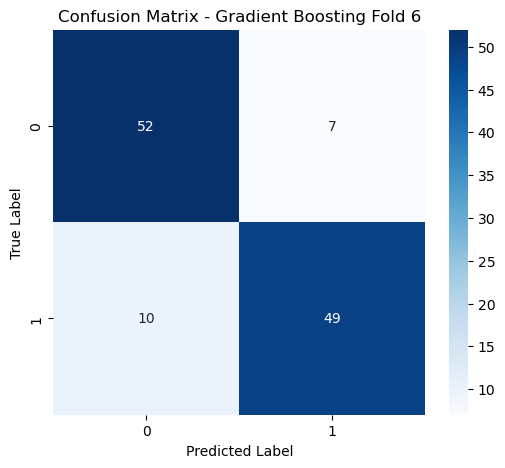


Fold 7:
Accuracy : 0.8390
Precision: 0.8438
Recall   : 0.8390
F1-Score : 0.8384


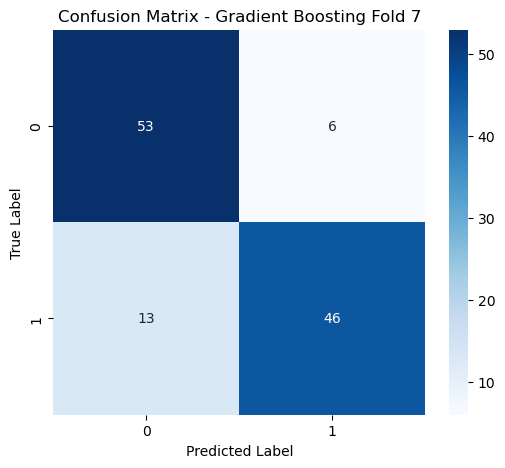


✅ Model dari Fold 6 dipilih sebagai model terbaik berdasarkan akurasi validasi 0.8559

Evaluasi Model Gradient Boosting (Fold 6):
Accuracy : 0.8333
Precision: 0.8750
Recall   : 0.8333
F1-Score : 0.8286


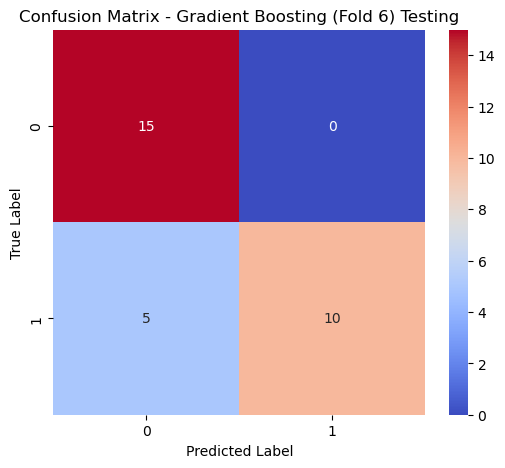

In [111]:
# gradient boost


# ====== 2. Preprocessing Data Training ======

X = df_kuantitas_fitur_28.drop(columns=["FatLevel"])
y = df_kuantitas_fitur_28['FatLevel']

fitur_terpilih = X.columns

# Terapkan SMOTE untuk menyeimbangkan kelas minoritas
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)



# ====== 3. Training dan Evaluasi AdaBoost ======

k_values = [3, 5, 7, 9]
ab_results = []

for k in k_values:
    model = GradientBoostingClassifier(random_state=42)
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

    y_pred = cross_val_predict(model, X_resampled, y_resampled, cv=skf)
    accuracy = accuracy_score(y_resampled, y_pred)
    precision = precision_score(y_resampled, y_pred, average="macro", zero_division=0)
    recall = recall_score(y_resampled, y_pred, average="macro")
    f1 = f1_score(y_resampled, y_pred, average="macro")

    ab_results.append({
        "K": k,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1
    })

# Konversi ke DataFrame dan tampilkan
df_ab_results = pd.DataFrame(ab_results)
df_ab_results["Accuracy (%)"] = df_ab_results["Accuracy"] * 100
print("\nHasil Evaluasi Gradient Boosting:")
print(df_ab_results[["K", "Accuracy (%)", "Precision", "Recall", "F1-Score"]])

# Ambil fold dengan akurasi terbaik
best_ab_row = df_ab_results.sort_values(by="Accuracy", ascending=False).iloc[0]
best_k = int(best_ab_row["K"])
best_acc = best_ab_row["Accuracy"]

print(f"\n⭐ Model Gradient Boosting Terbaik ditemukan pada Fold = {best_k} dengan Akurasi = {best_acc*100:.2f}% ⭐")

# ====== Evaluasi Per Fold & Pilih Model Terbaik ======

best_model = None
best_val_acc = 0
best_fold = -1

def evaluate_folds_and_select_best(model_class, k, X, y):
    global best_model, best_val_acc, best_fold
    print(f"\n==== Evaluasi Per Fold (K={k}) - Gradient Boosting ====")
    skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    for i, (train_idx, val_idx) in enumerate(skf.split(X, y), 1):
        model = model_class(random_state=42)
        model.fit(X.iloc[train_idx], y.iloc[train_idx])
        y_pred = model.predict(X.iloc[val_idx])
        y_true = y.iloc[val_idx]

        acc = accuracy_score(y_true, y_pred)
        prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
        rec = recall_score(y_true, y_pred, average='macro')
        f1 = f1_score(y_true, y_pred, average='macro')

        print(f"\nFold {i}:")
        print(f"Accuracy : {acc:.4f}")
        print(f"Precision: {prec:.4f}")
        print(f"Recall   : {rec:.4f}")
        print(f"F1-Score : {f1:.4f}")

        cm = confusion_matrix(y_true, y_pred)
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=np.unique(y),
                    yticklabels=np.unique(y))
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"Confusion Matrix - Gradient Boosting Fold {i}")
        plt.show()

        # Simpan model terbaik berdasarkan akurasi validasi
        if acc > best_val_acc:
            best_val_acc = acc
            best_model = clone(model)
            best_model.fit(X.iloc[train_idx], y.iloc[train_idx])
            best_fold = i

evaluate_folds_and_select_best(GradientBoostingClassifier, best_k, X_resampled, y_resampled)

print(f"\n✅ Model dari Fold {best_fold} dipilih sebagai model terbaik berdasarkan akurasi validasi {best_val_acc:.4f}")

# ====== Testing Model Terbaik ======

X_test = testing_kualitas.drop(columns=["FatLevel"])
X_test = X_test[fitur_terpilih].reindex(columns=fitur_terpilih)
y_test = testing_kualitas["FatLevel"]

def evaluate_model(y_true, y_pred, model_name):
    print(f"\nEvaluasi Model {model_name}:")
    print(f"Accuracy : {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='macro', zero_division=0):.4f}")
    print(f"Recall   : {recall_score(y_true, y_pred, average='macro'):.4f}")
    print(f"F1-Score : {f1_score(y_true, y_pred, average='macro'):.4f}")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="coolwarm",
                xticklabels=np.unique(y_true),
                yticklabels=np.unique(y_true))
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name} Testing")
    plt.show()

# Evaluasi pada data testing
evaluate_model(y_test, best_model.predict(X_test), f"Gradient Boosting (Fold {best_fold})")